# Imports

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest,mutual_info_classif, chi2
from sklearn.neighbors import NearestNeighbors
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.tree import  plot_tree
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
from sklearn.base import clone
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

# Data Preparation






In [5]:
file_path ='/content/cirrhosis.csv'
cirrhosis = pd.read_csv(file_path)
print(cirrhosis.info())

# Remove the 'ID' column from the dataset
cirrhosis = cirrhosis.drop(columns=['ID'])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ID             418 non-null    int64  
 1   N_Days         418 non-null    int64  
 2   Status         418 non-null    object 
 3   Drug           312 non-null    object 
 4   Age            418 non-null    int64  
 5   Sex            418 non-null    object 
 6   Ascites        312 non-null    object 
 7   Hepatomegaly   312 non-null    object 
 8   Spiders        312 non-null    object 
 9   Edema          418 non-null    object 
 10  Bilirubin      418 non-null    float64
 11  Cholesterol    284 non-null    float64
 12  Albumin        418 non-null    float64
 13  Copper         310 non-null    float64
 14  Alk_Phos       312 non-null    float64
 15  SGOT           312 non-null    float64
 16  Tryglicerides  282 non-null    float64
 17  Platelets      407 non-null    float64
 18  Prothrombi

In [6]:
cirrhosis['Stage'] = pd.Categorical(cirrhosis['Stage'], ordered=True)
print(cirrhosis['Stage'].dtype)
cirrhosis.describe()
print(cirrhosis.info())

category
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   N_Days         418 non-null    int64   
 1   Status         418 non-null    object  
 2   Drug           312 non-null    object  
 3   Age            418 non-null    int64   
 4   Sex            418 non-null    object  
 5   Ascites        312 non-null    object  
 6   Hepatomegaly   312 non-null    object  
 7   Spiders        312 non-null    object  
 8   Edema          418 non-null    object  
 9   Bilirubin      418 non-null    float64 
 10  Cholesterol    284 non-null    float64 
 11  Albumin        418 non-null    float64 
 12  Copper         310 non-null    float64 
 13  Alk_Phos       312 non-null    float64 
 14  SGOT           312 non-null    float64 
 15  Tryglicerides  282 non-null    float64 
 16  Platelets      407 non-null    float64 
 17  Prothrombin    416 non-nul



  ##  Data Quality



In [7]:
# Remove duplicate rows
cirrhosis = cirrhosis.drop_duplicates()
print(f"Number of rows after removing duplicates: {len(cirrhosis)}")


# Check the number of missing values per column
missing_values = cirrhosis.isnull().sum()
print("Missing values per column:")
print(missing_values)

# Count the number of rows with missing values
rows_with_missing = cirrhosis[cirrhosis.isnull().any(axis=1)]
count_missing_rows = rows_with_missing.shape[0]
print(f"Total number of rows with missing values: {count_missing_rows}")

# Remove rows that represent does 6 untraceable patients.
cirrhosis_cleaned = cirrhosis.dropna(subset=['Stage'])
print(f"Dataset after removing untraceable patients': {cirrhosis_cleaned.shape}")

# Divide the dataset into two groups based on the presence of a value in the 'Drug' column: trial group (with drugs) and non-trial group (without drugs)
trial_group = cirrhosis_cleaned[cirrhosis_cleaned['Drug'].notnull()]
non_trial_group = cirrhosis_cleaned[cirrhosis_cleaned['Drug'].isnull()]
print(f"Trial group: {trial_group.shape}")
print(f"Non-trial group: {non_trial_group .shape}")


Number of rows after removing duplicates: 418
Missing values per column:
N_Days             0
Status             0
Drug             106
Age                0
Sex                0
Ascites          106
Hepatomegaly     106
Spiders          106
Edema              0
Bilirubin          0
Cholesterol      134
Albumin            0
Copper           108
Alk_Phos         106
SGOT             106
Tryglicerides    136
Platelets         11
Prothrombin        2
Stage              6
dtype: int64
Total number of rows with missing values: 142
Dataset after removing untraceable patients': (412, 19)
Trial group: (312, 19)
Non-trial group: (100, 19)




### Handling Missing Values



In [8]:

# List of columns to be removed from the non-trial group
columns_to_remove = ['Drug', 'Ascites', 'Hepatomegaly', 'Spiders',
                     'Cholesterol', 'Copper', 'Tryglicerides',
                     'Alk_Phos', 'SGOT']

non_trial_group = non_trial_group.drop(columns=columns_to_remove, errors='ignore')
print("Remaining columns in non-trial group:\n", non_trial_group.columns)


# Function to impute missing values for numeric columns only
def mean_impute_numeric(data):
    numeric_columns = data.select_dtypes(include=['number']).columns
    valid_numeric_columns = [col for col in numeric_columns if data[col].notnull().any()]
    data = data.copy()
    imputer = SimpleImputer(strategy='mean')
    data[valid_numeric_columns] = imputer.fit_transform(data[valid_numeric_columns])

    return data
trial_group = mean_impute_numeric(trial_group)
non_trial_group = mean_impute_numeric(non_trial_group)

# Verify remaining missing values
print("Missing values in trial group:\n", trial_group.isnull().sum())
print("Missing values in non-trial group:\n", non_trial_group.isnull().sum())


Remaining columns in non-trial group:
 Index(['N_Days', 'Status', 'Age', 'Sex', 'Edema', 'Bilirubin', 'Albumin',
       'Platelets', 'Prothrombin', 'Stage'],
      dtype='object')
Missing values in trial group:
 N_Days           0
Status           0
Drug             0
Age              0
Sex              0
Ascites          0
Hepatomegaly     0
Spiders          0
Edema            0
Bilirubin        0
Cholesterol      0
Albumin          0
Copper           0
Alk_Phos         0
SGOT             0
Tryglicerides    0
Platelets        0
Prothrombin      0
Stage            0
dtype: int64
Missing values in non-trial group:
 N_Days         0
Status         0
Age            0
Sex            0
Edema          0
Bilirubin      0
Albumin        0
Platelets      0
Prothrombin    0
Stage          0
dtype: int64


### Outliers (box plots)

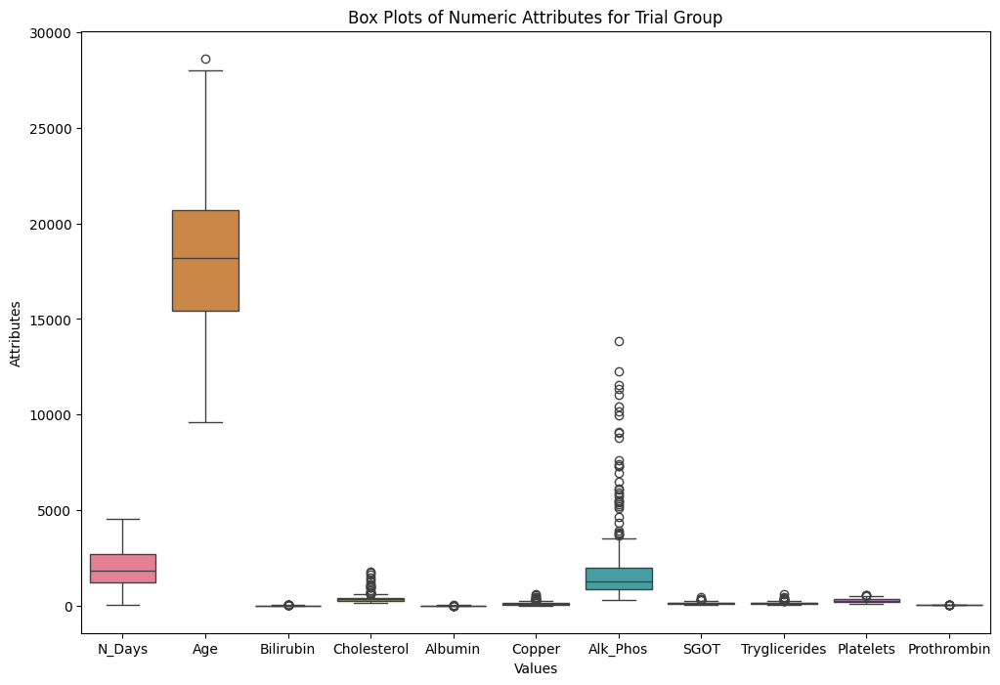

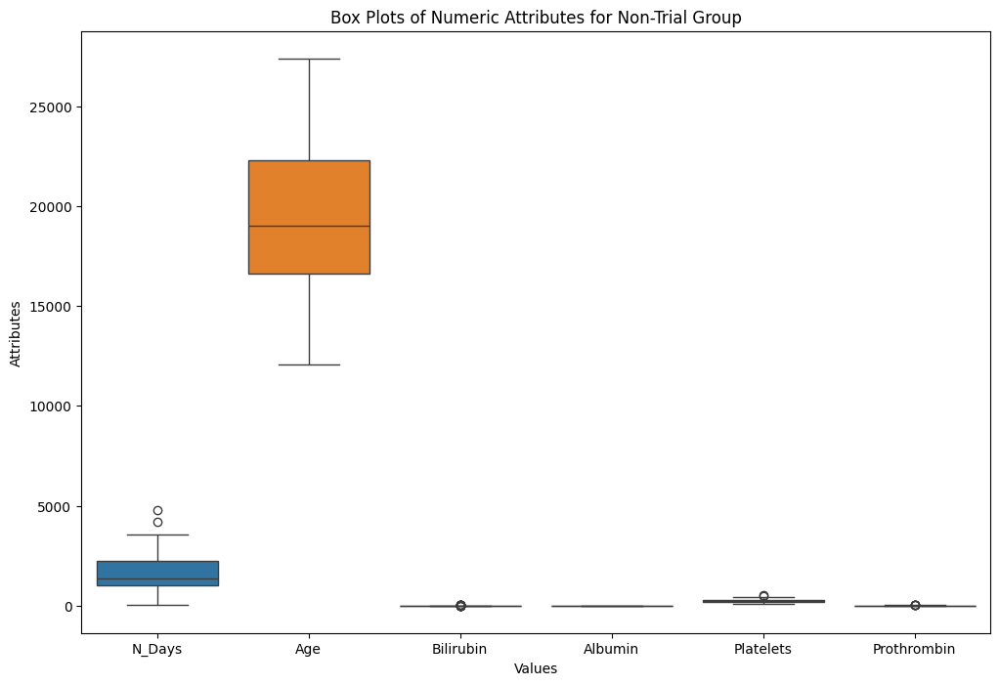

In [9]:

# Function to plot box plots for all numeric attributes
def plot_boxplots(data, group_name):
    numeric_columns = data.select_dtypes(include=['number']).columns

    plt.figure(figsize=(12, 8))
    sns.boxplot(data=data[numeric_columns], orient='v')
    plt.title(f'Box Plots of Numeric Attributes for {group_name}')
    plt.xlabel('Values')
    plt.ylabel('Attributes')
    plt.show()

plot_boxplots(trial_group, "Trial Group")
plot_boxplots(non_trial_group, "Non-Trial Group")

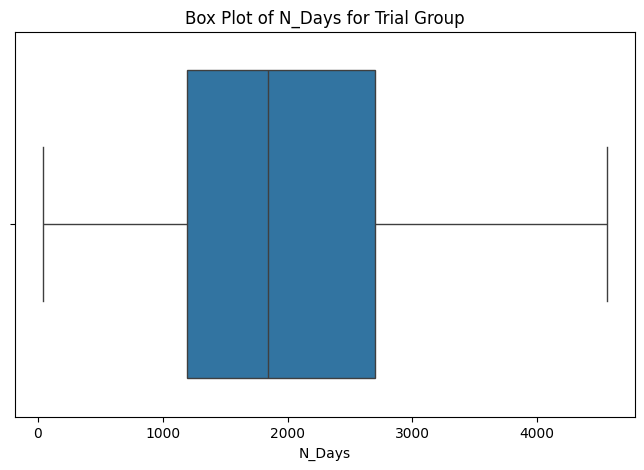

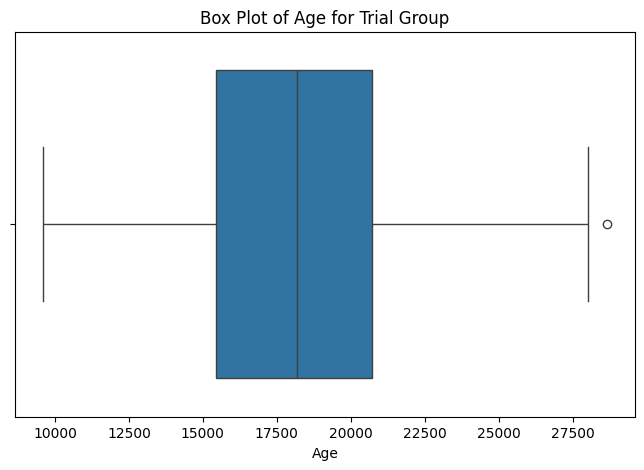

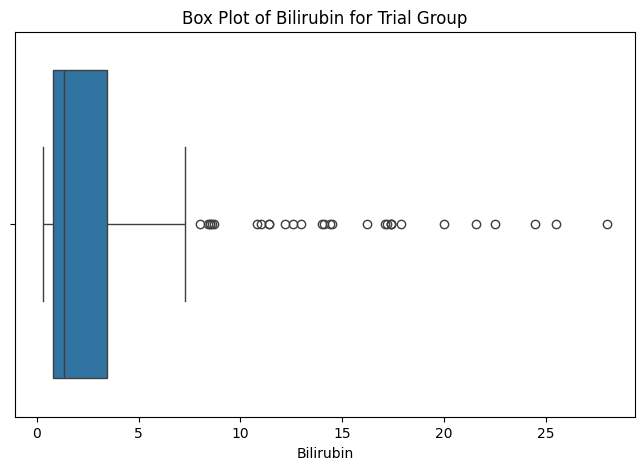

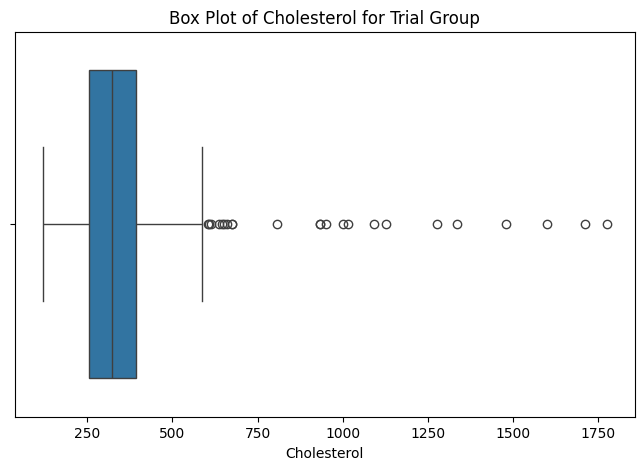

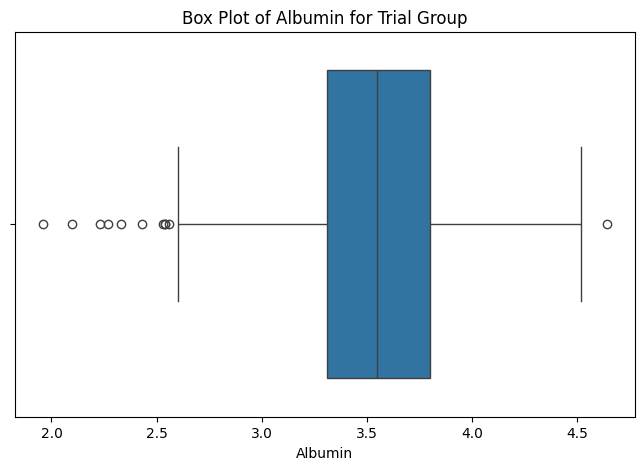

...

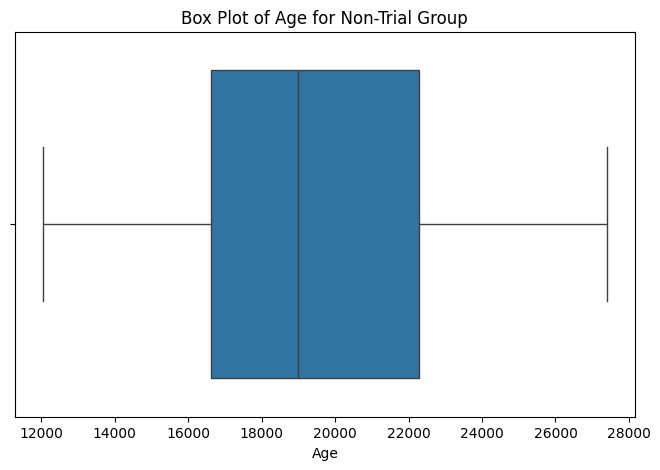

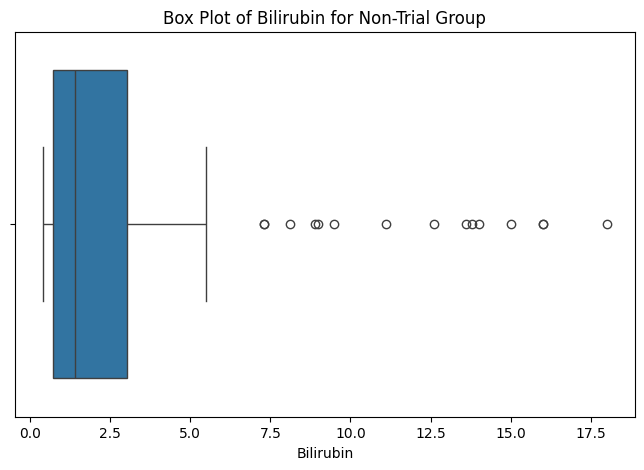

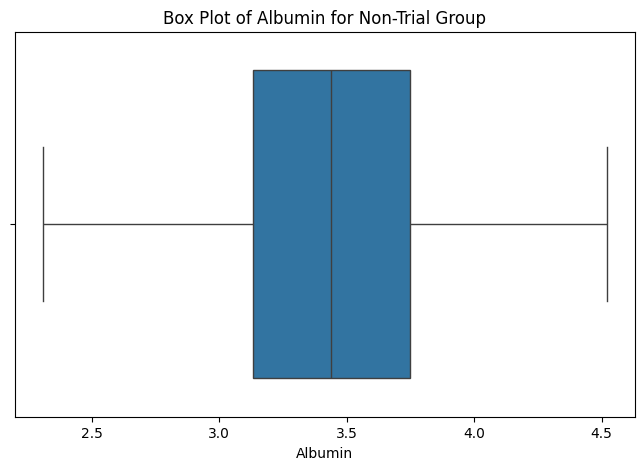

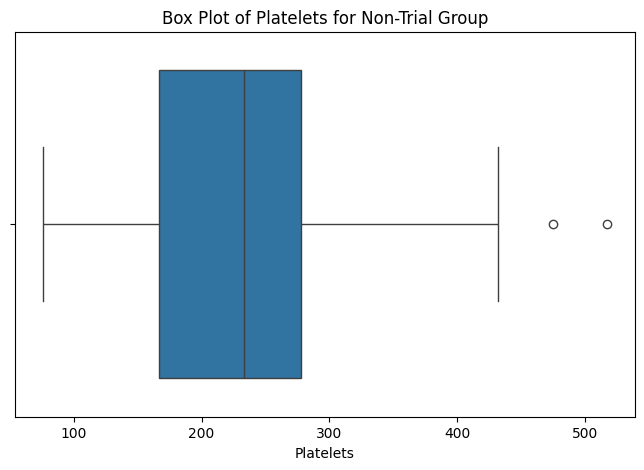

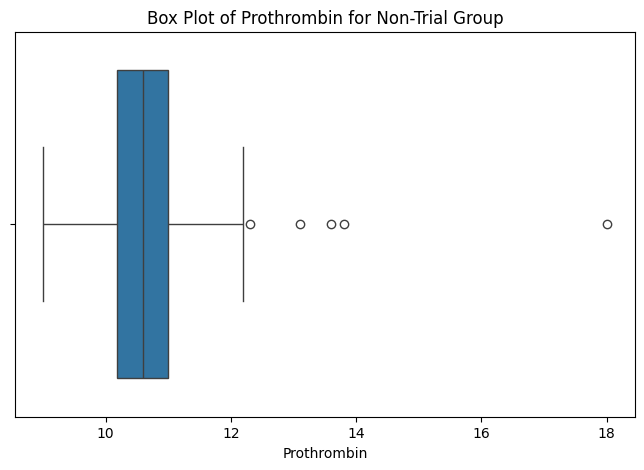

In [10]:
# Function to plot individual box plots for numeric attributes
def plot_individual_boxplots(data, group_name):
    numeric_columns = data.select_dtypes(include=['number']).columns

    for column in numeric_columns:
        plt.figure(figsize=(8, 5))
        sns.boxplot(x=data[column] )
        plt.title(f'Box Plot of {column} for {group_name}')
        plt.xlabel(column)
        plt.show()

plot_individual_boxplots(trial_group, "Trial Group")
plot_individual_boxplots(non_trial_group, "Non-Trial Group")


## Data Exploration

### Probability distribution

<Figure size 1500x1000 with 0 Axes>

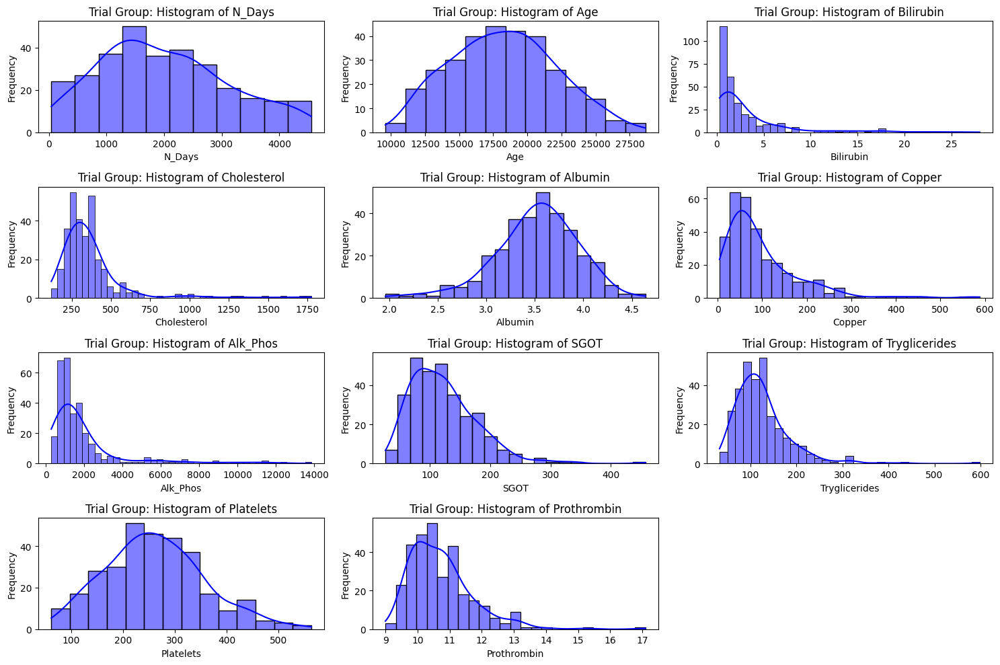

<Figure size 1500x1000 with 0 Axes>

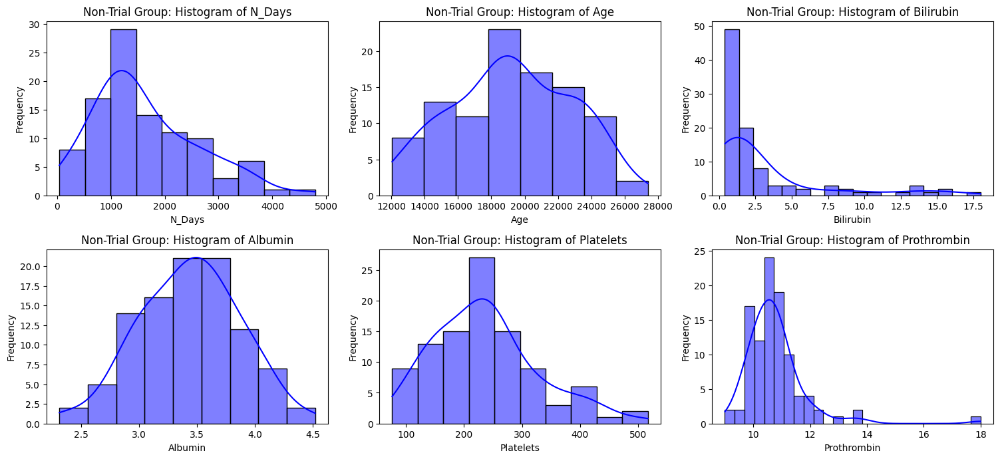

In [11]:

# Function to plot histograms for all numeric attributes
def plot_histograms(data, group_name):
    numeric_columns = data.select_dtypes(include=['number']).columns

    plt.figure(figsize=(15, 10))

    for i, feature in enumerate(numeric_columns):
        plt.subplot((len(numeric_columns) // 3) + 1, 3, i + 1)
        sns.histplot(data[feature], kde=True, color="blue")
        plt.title(f'{group_name}: Histogram of {feature}')
        plt.xlabel(feature)
        plt.ylabel('Frequency')

    plt.tight_layout()
    plt.show()

plt.figure(figsize=(15, 10))
plot_histograms(trial_group, "Trial Group")

plt.figure(figsize=(15, 10))
plot_histograms(non_trial_group, "Non-Trial Group")


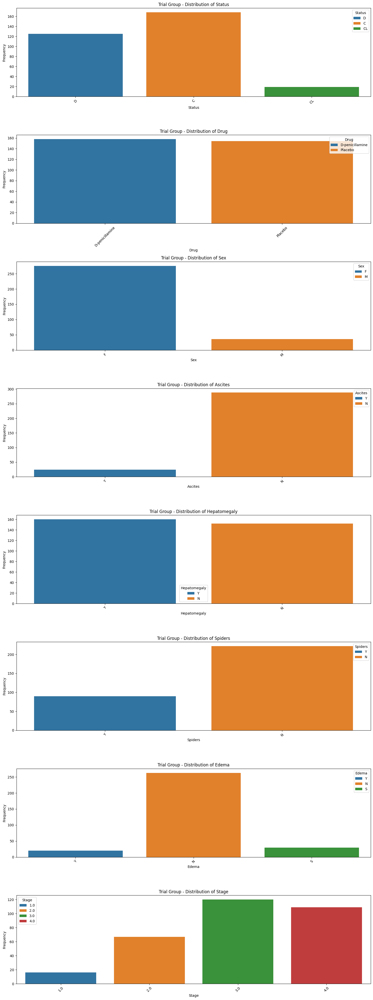

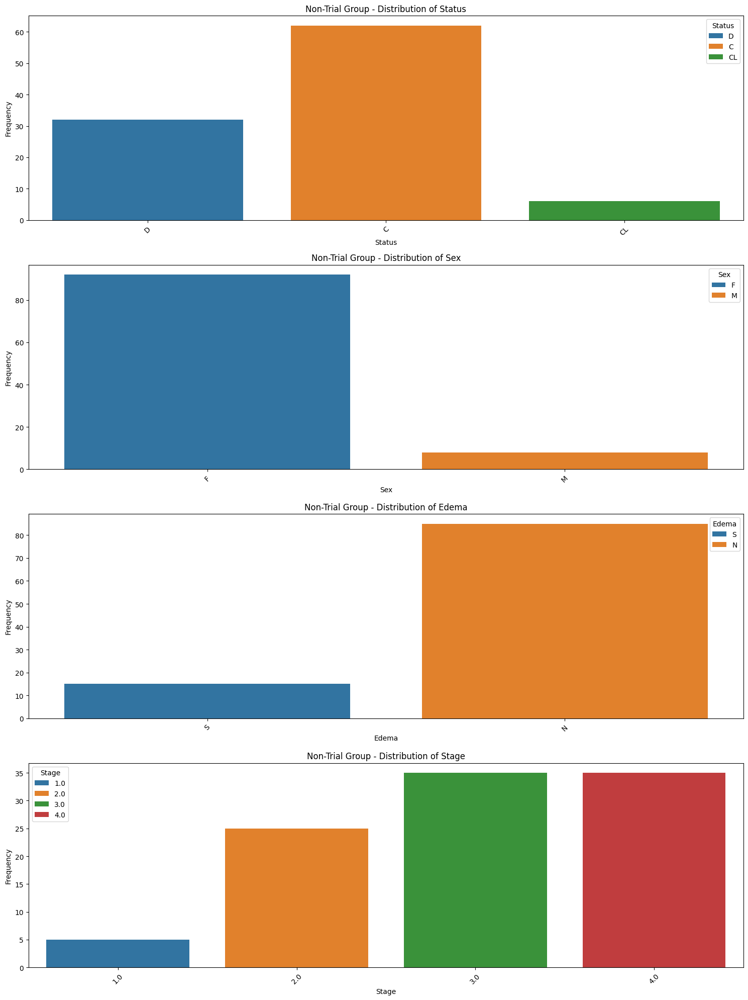

In [12]:
# Function to plot histograms for nominal attributes
def plot_nominal_histograms(data, group_name):
    # Identify nominal attributes
    nominal_columns = data.select_dtypes(include=['object', 'category']).columns
    num_cols = len(nominal_columns)
    plt.figure(figsize=(15, 5 * num_cols))

    for i, column in enumerate(nominal_columns, 1):
        plt.subplot(num_cols, 1, i)
        sns.countplot(x=column, data=data, hue=column, legend=True)
        plt.title(f'{group_name} - Distribution of {column}')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

plot_nominal_histograms(trial_group, group_name="Trial Group")
plot_nominal_histograms(non_trial_group, group_name="Non-Trial Group")

###Scatter Plots

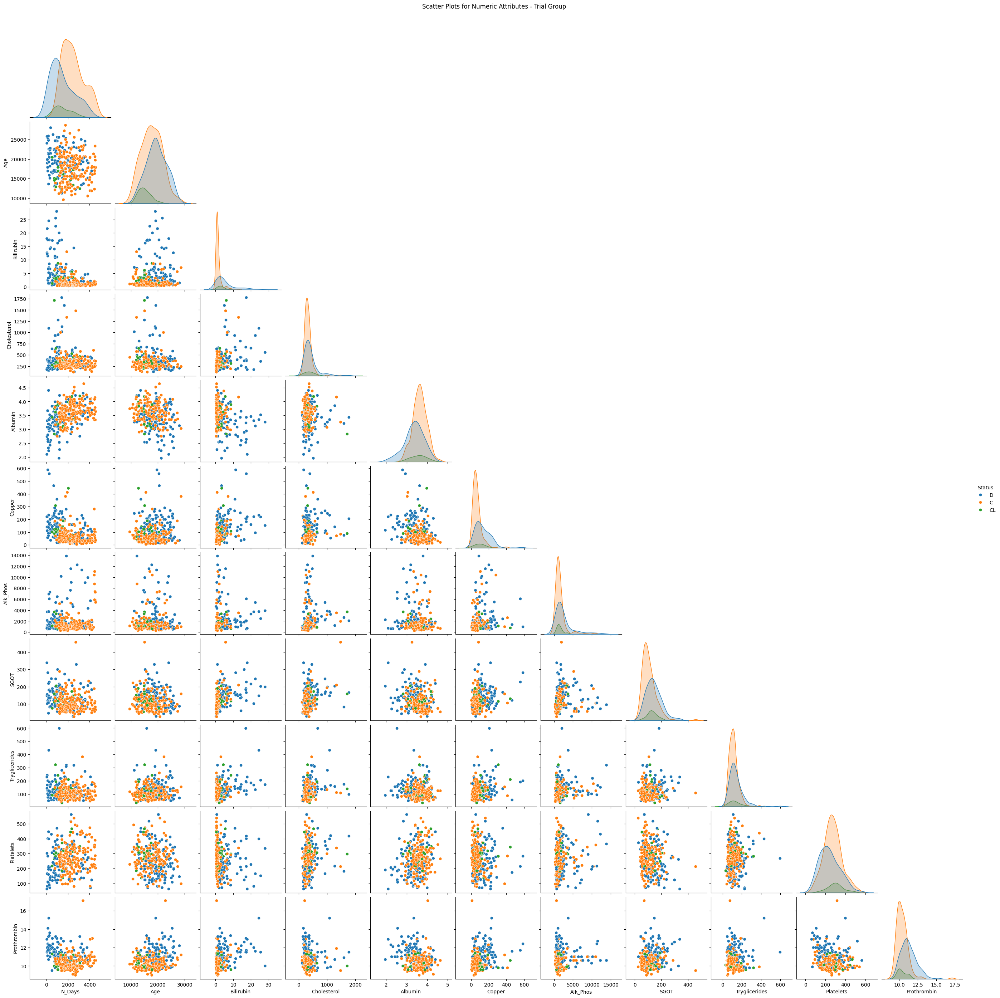

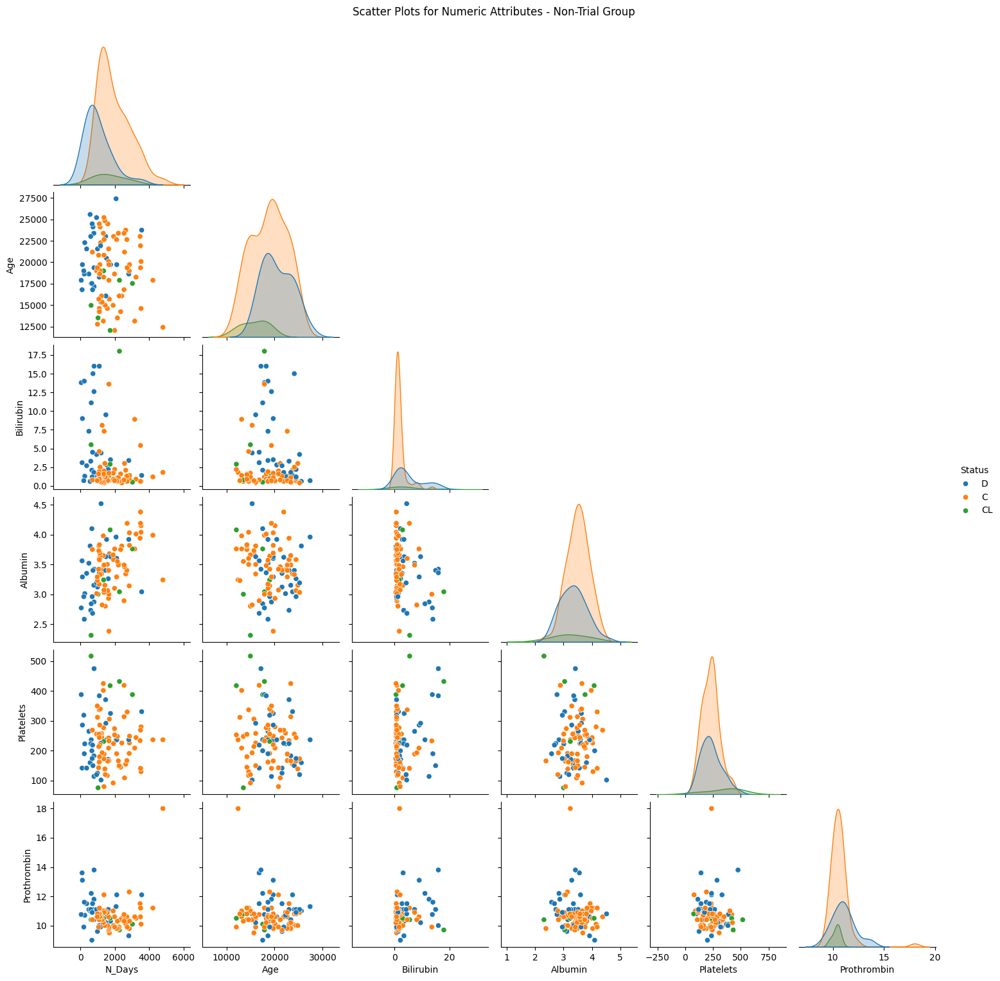

In [13]:
# Select only numeric columns for trial group
trial_numeric = trial_group.select_dtypes(include=['number'])
trial_numeric['Status'] = trial_group['Status']

# Select only numeric columns for non-trial group
non_trial_numeric = non_trial_group.select_dtypes(include=['number'])
non_trial_numeric['Status'] = non_trial_group['Status']

# Scatter plot for the trial group
sns.pairplot(trial_numeric, hue='Status', palette="tab10", diag_kind="kde", corner=True)
plt.suptitle("Scatter Plots for Numeric Attributes - Trial Group ", y=1.02)
plt.show()

# Scatter plot for the non-trial group
sns.pairplot(non_trial_numeric, hue='Status', palette="tab10", diag_kind="kde", corner=True)
plt.suptitle(f'Scatter Plots for Numeric Attributes - Non-Trial Group ', y=1.02)
plt.show()




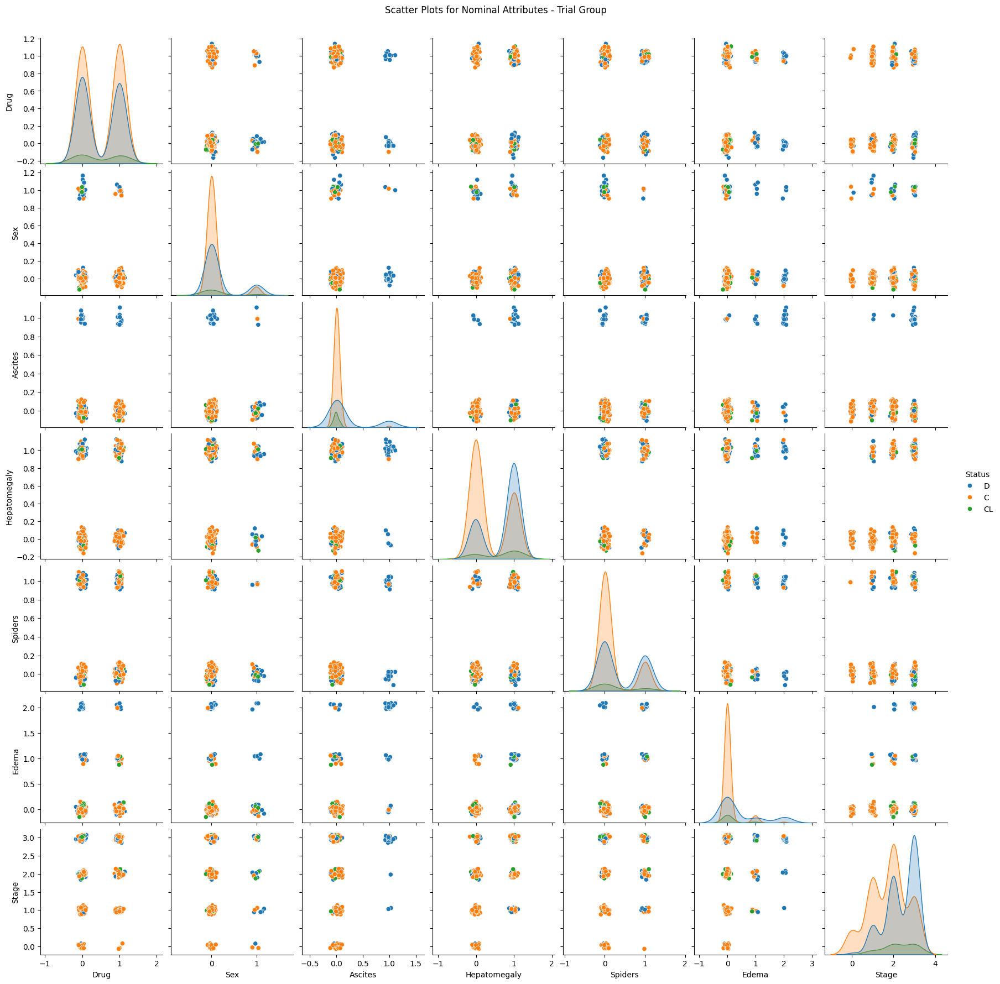

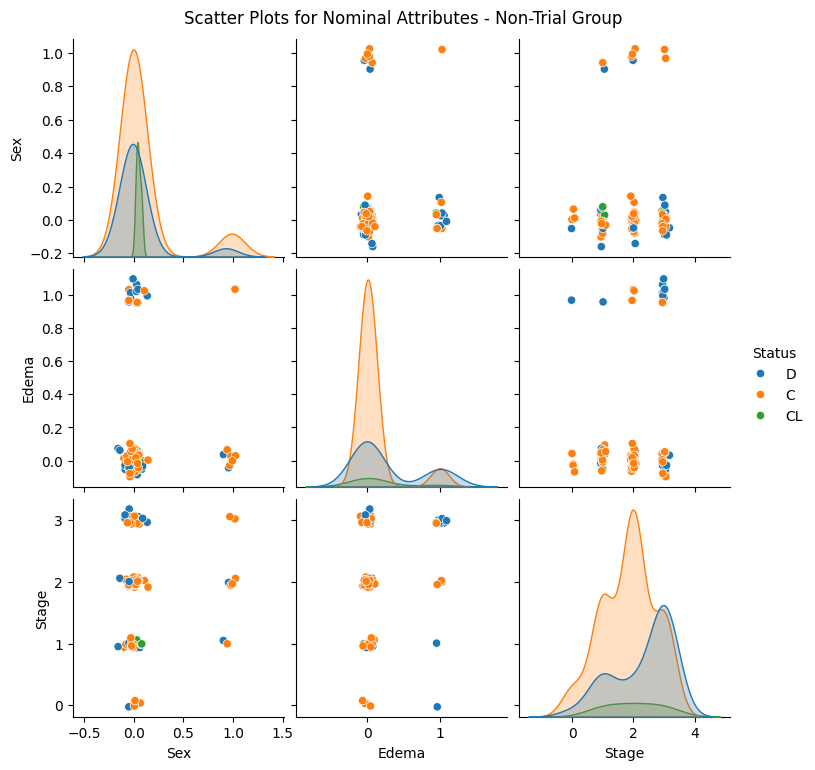

In [14]:
# Function to create scatterplots for nominal attributes only
def plot_nominal_scatter_with_noise(data, hue, group_name):
    # Filter for nominal attributes only
    nominal_columns = data.select_dtypes(include=['object', 'category']).columns

    data_noisy = data.copy()
    for column in nominal_columns:
        if column != hue:
            data_noisy[column] = data[column].astype('category').cat.codes

    # Ensure numeric data for noise addition
    numeric_nominal_data = data_noisy[nominal_columns].apply(pd.to_numeric, errors='coerce')

    # Add small random noise (jitter) to the nominal attributes
    noise = np.random.normal(0, 0.05, numeric_nominal_data.shape)
    numeric_nominal_data += noise
    numeric_nominal_data[hue] = data_noisy[hue]
    sns.pairplot(numeric_nominal_data, hue=hue, diag_kind='kde')
    plt.suptitle(f'Scatter Plots for Nominal Attributes - {group_name}', y=1.02)
    plt.show()

plot_nominal_scatter_with_noise(trial_group, hue='Status', group_name="Trial Group")
plot_nominal_scatter_with_noise(non_trial_group, hue='Status', group_name="Non-Trial Group")



###Correlation Matrix

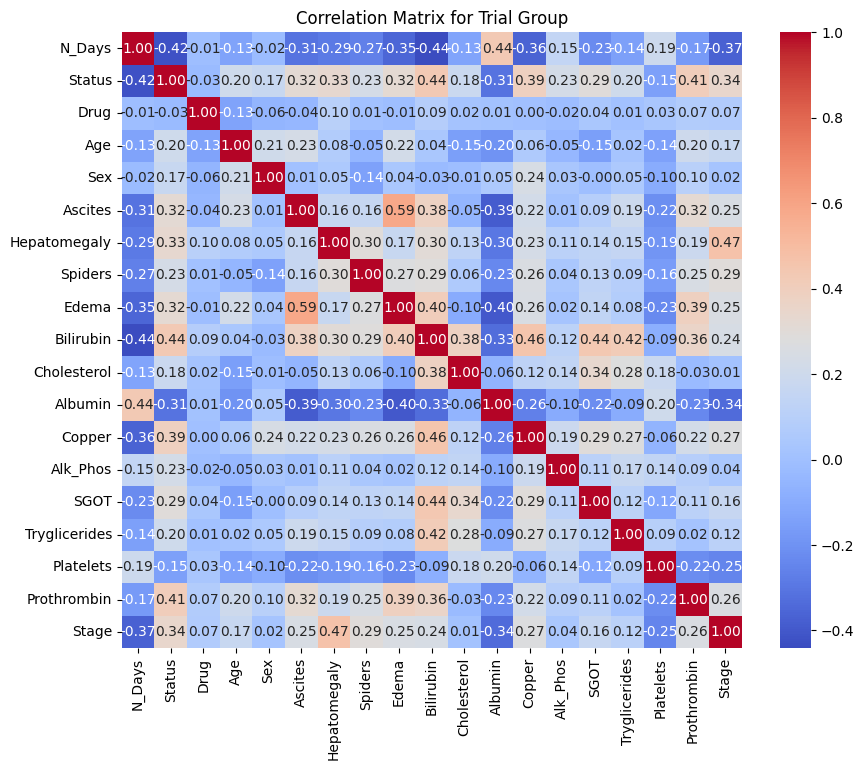

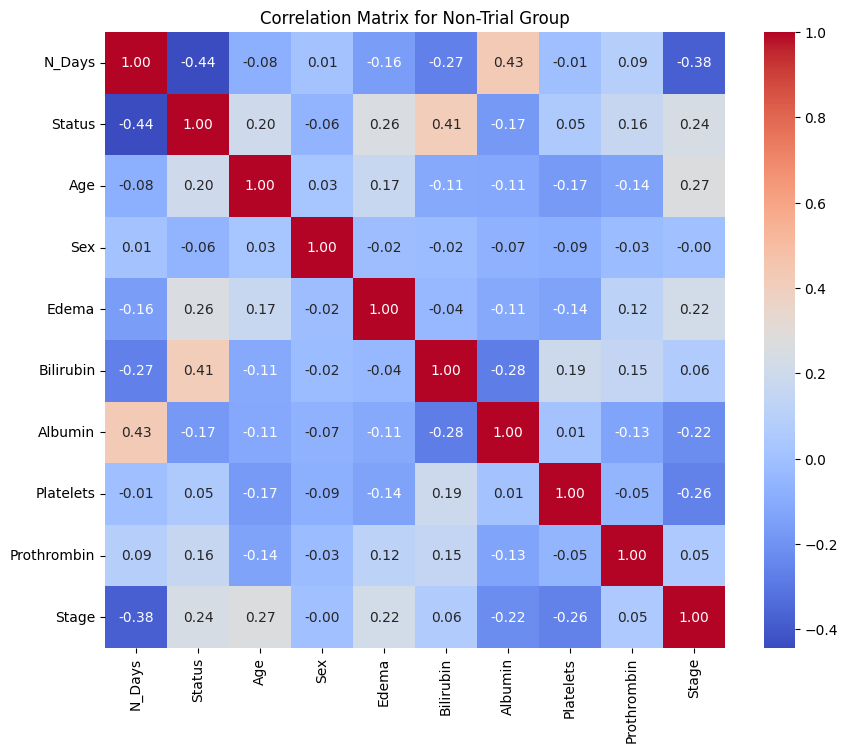

In [15]:
# Function to calculate and plot the correlation matrix for a group
def plot_correlation_matrix(data, group_name):
    # Convert nominal attributes to numeric using category codes
    encoded_data = data.copy()
    nominal_columns = data.select_dtypes(include=['object', 'category']).columns

    for column in nominal_columns:
        encoded_data[column] = data[column].astype('category').cat.codes
    correlation_matrix = encoded_data.corr(numeric_only=True)

    # Plot heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title(f'Correlation Matrix for {group_name}')
    plt.show()


plot_correlation_matrix(trial_group, "Trial Group")
plot_correlation_matrix(non_trial_group, "Non-Trial Group")

## Feature Selection

###Filter Methods

In [16]:

# Make copies of the trial and non-trial groups
trial_group_copy = trial_group.copy()
non_trial_group_copy = non_trial_group.copy()

# Ensure all categorical attributes are converted to numeric
for col in trial_group_copy.select_dtypes(include=['object', 'category']).columns:
    trial_group_copy[col] = trial_group_copy[col].astype('category').cat.codes

for col in non_trial_group_copy.select_dtypes(include=['object', 'category']).columns:
    non_trial_group_copy[col] = non_trial_group_copy[col].astype('category').cat.codes

# Separate features and target for trial and non-trial groups
X_trial = trial_group_copy.drop(columns=['Status']).select_dtypes(include=['number'])
y_trial = trial_group_copy['Status']

X_non_trial = non_trial_group_copy.drop(columns=['Status']).select_dtypes(include=['number'])
y_non_trial = non_trial_group_copy['Status']

# Function to apply feature selection methods
def filter_methods (X, y, method, k=5):
    if method == 'mutual_info':
        selector = SelectKBest(score_func=mutual_info_classif, k=k)
    elif method == 'chi2':
        selector = SelectKBest(score_func=chi2, k=k)
    else:
        raise ValueError("Invalid method. Use 'mutual_info' or 'chi2'.")

    X_selected = selector.fit_transform(X, y)
    selected_features = X.columns[selector.get_support()]
    scores = selector.scores_[selector.get_support()]
    return pd.DataFrame({'Feature': selected_features, 'Score': scores}).sort_values(by='Score', ascending=False)

# Apply mutual information and chi2 for trial group
selected_features_trial_mi = filter_methods(X_trial, y_trial, method='mutual_info', k=15)
selected_features_trial_chi2 = filter_methods(X_trial, y_trial, method='chi2', k=15)

# Apply mutual information and chi2 for non-trial group
selected_features_non_trial_mi = filter_methods(X_non_trial, y_non_trial, method='mutual_info', k=9)
selected_features_non_trial_chi2 = filter_methods(X_non_trial, y_non_trial, method='chi2', k=9)

# Display results for trial group
print("Selected Features for Trial Group (Mutual Information):")
print(selected_features_trial_mi)
print("\nSelected Features for Trial Group (Chi-Square):")
print(selected_features_trial_chi2)

# Display results for non-trial group
print("\nSelected Features for Non-Trial Group (Mutual Information):")
print(selected_features_non_trial_mi)
print("\nSelected Features for Non-Trial Group (Chi-Square):")
print(selected_features_non_trial_chi2)



Selected Features for Trial Group (Mutual Information):
         Feature     Score
8      Bilirubin  0.188696
0         N_Days  0.154549
13   Prothrombin  0.129680
10        Copper  0.086975
2            Age  0.077707
14         Stage  0.075606
11      Alk_Phos  0.066851
9        Albumin  0.058583
12          SGOT  0.055747
7          Edema  0.052082
5   Hepatomegaly  0.037567
6        Spiders  0.017962
4        Ascites  0.013247
3            Sex  0.006747
1           Drug  0.003365

Selected Features for Trial Group (Chi-Square):
          Feature         Score
10       Alk_Phos  39375.356448
0          N_Days  36946.514463
1             Age  22727.002299
9          Copper   3569.201010
8     Cholesterol   1514.996036
11           SGOT    711.359501
12  Tryglicerides    397.287506
7       Bilirubin    374.972785
13      Platelets    352.763965
6           Edema     45.253808
3         Ascites     31.093381
4    Hepatomegaly     17.371062
14          Stage     14.353612
5         Spide

### Wrapper Methods

In [17]:

trial_group_copy = trial_group.copy()
non_trial_group_copy = non_trial_group.copy()

# Convert categorical attributes to numeric
for col in trial_group_copy.select_dtypes(include=['object', 'category']).columns:
    trial_group_copy[col] = trial_group_copy[col].astype('category').cat.codes

for col in non_trial_group_copy.select_dtypes(include=['object', 'category']).columns:
    non_trial_group_copy[col] = non_trial_group_copy[col].astype('category').cat.codes

# Separate features and target for trial and non-trial groups
X_trial = trial_group_copy.drop(columns=['Status']).select_dtypes(include=['number'])
y_trial = trial_group_copy['Status']

X_non_trial = non_trial_group_copy.drop(columns=['Status']).select_dtypes(include=['number'])
y_non_trial = non_trial_group_copy['Status']

# Forward Selection for Trial Group
print("Forward Selection for Trial Group:")
estimator = DecisionTreeClassifier()
sfs_forward_trial = SequentialFeatureSelector(estimator, n_features_to_select=10, direction='forward')
sfs_forward_trial = sfs_forward_trial.fit(X_trial, y_trial)
forward_selected_features_trial = X_trial.columns[sfs_forward_trial.get_support()]
print(forward_selected_features_trial)

# Backward Selection for Trial Group
print("\nBackward Selection for Trial Group:")
sfs_backward_trial = SequentialFeatureSelector(estimator, n_features_to_select=10, direction='backward')
sfs_backward_trial = sfs_backward_trial.fit(X_trial, y_trial)
backward_selected_features_trial = X_trial.columns[sfs_backward_trial.get_support()]
print(backward_selected_features_trial)

# Forward Selection for Non-Trial Group
print("\nForward Selection for Non-Trial Group:")
sfs_forward_non_trial = SequentialFeatureSelector(estimator, n_features_to_select=8, direction='forward')
sfs_forward_non_trial = sfs_forward_non_trial.fit(X_non_trial, y_non_trial)
forward_selected_features_non_trial = X_non_trial.columns[sfs_forward_non_trial.get_support()]
print(forward_selected_features_non_trial)

# Backward Selection for Non-Trial Group
print("\nBackward Selection for Non-Trial Group:")
sfs_backward_non_trial = SequentialFeatureSelector(estimator, n_features_to_select=8, direction='backward')
sfs_backward_non_trial = sfs_backward_non_trial.fit(X_non_trial, y_non_trial)
backward_selected_features_non_trial = X_non_trial.columns[sfs_backward_non_trial.get_support()]
print(backward_selected_features_non_trial)



Forward Selection for Trial Group:
Index(['Drug', 'Age', 'Sex', 'Ascites', 'Hepatomegaly', 'Spiders', 'Edema',
       'Bilirubin', 'Platelets', 'Stage'],
      dtype='object')

Backward Selection for Trial Group:
Index(['Drug', 'Age', 'Sex', 'Ascites', 'Hepatomegaly', 'Edema', 'Bilirubin',
       'Cholesterol', 'Platelets', 'Prothrombin'],
      dtype='object')

Forward Selection for Non-Trial Group:
Index(['N_Days', 'Age', 'Sex', 'Edema', 'Bilirubin', 'Platelets',
       'Prothrombin', 'Stage'],
      dtype='object')

Backward Selection for Non-Trial Group:
Index(['N_Days', 'Age', 'Sex', 'Edema', 'Bilirubin', 'Platelets',
       'Prothrombin', 'Stage'],
      dtype='object')


In [18]:
# Remove the N_Days attribute from both groups
trial_group = trial_group.drop(columns=['N_Days'], errors='ignore')
non_trial_group = non_trial_group.drop(columns=['N_Days'], errors='ignore')

# Remove the Sex attribute from the trial group
trial_group = trial_group.drop(columns=['Sex'], errors='ignore')

print("Updated Trial Group Columns:")
print(trial_group.info())

print("\nUpdated Non-Trial Group Columns:")
print(non_trial_group.info())


Updated Trial Group Columns:
<class 'pandas.core.frame.DataFrame'>
Index: 312 entries, 0 to 311
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Status         312 non-null    object  
 1   Drug           312 non-null    object  
 2   Age            312 non-null    float64 
 3   Ascites        312 non-null    object  
 4   Hepatomegaly   312 non-null    object  
 5   Spiders        312 non-null    object  
 6   Edema          312 non-null    object  
 7   Bilirubin      312 non-null    float64 
 8   Cholesterol    312 non-null    float64 
 9   Albumin        312 non-null    float64 
 10  Copper         312 non-null    float64 
 11  Alk_Phos       312 non-null    float64 
 12  SGOT           312 non-null    float64 
 13  Tryglicerides  312 non-null    float64 
 14  Platelets      312 non-null    float64 
 15  Prothrombin    312 non-null    float64 
 16  Stage          312 non-null    category
dtypes: category

## Feature Transformation

### Log Transformation

<Figure size 1000x1000 with 0 Axes>

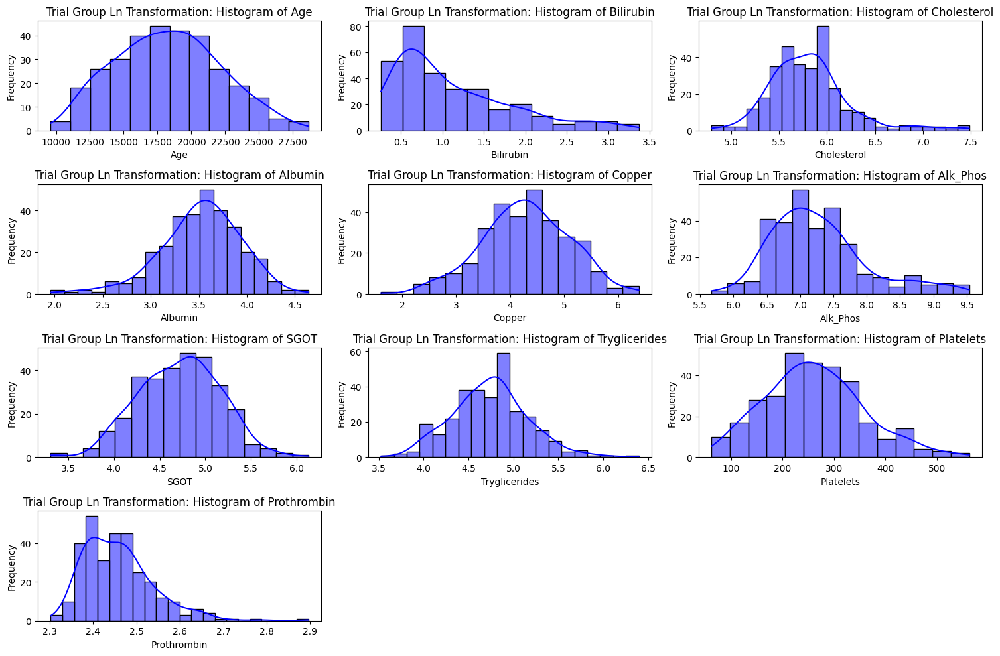

<Figure size 1000x1000 with 0 Axes>

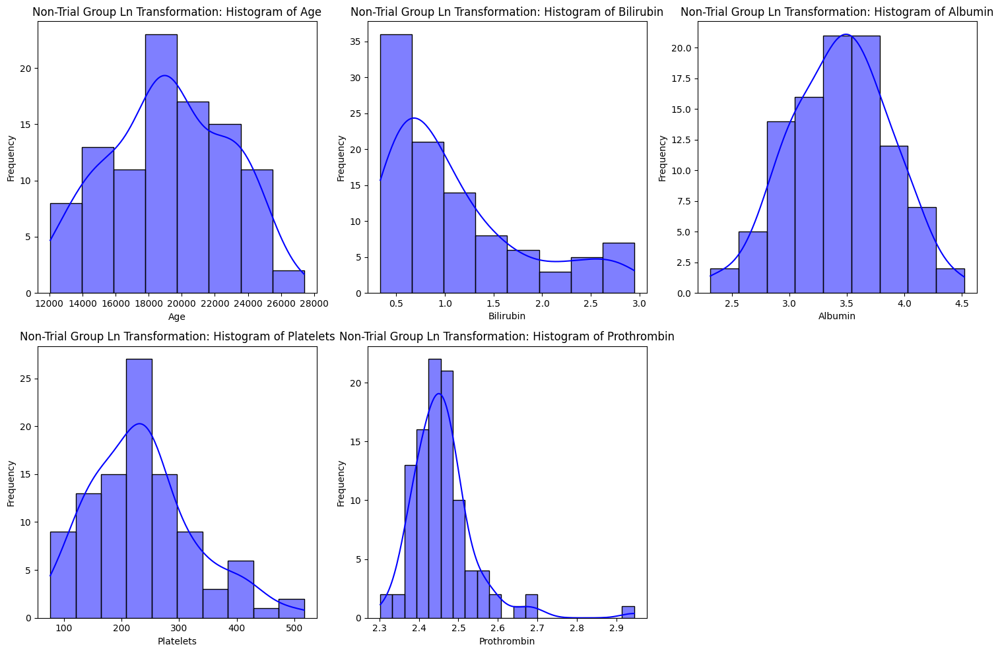

In [19]:

# Apply ln transformation to the specified attributes for the trial group
ln_columns_trial = ['Alk_Phos', 'Cholesterol', 'Copper', 'Prothrombin', 'SGOT', 'Tryglicerides', 'Bilirubin']
for col in ln_columns_trial:
      trial_group[col] = np.log1p(trial_group[col])  # Use log1p to handle zero values

# Apply ln transformation to the specified attributes for the non-trial group
ln_columns_non_trial = ['Bilirubin', 'Prothrombin']
for col in ln_columns_non_trial:
      non_trial_group[col] = np.log1p(non_trial_group[col])  # Use log1p to handle zero values

plt.figure(figsize=(10, 10))
plot_histograms(trial_group, "Trial Group Ln Transformation")

plt.figure(figsize=(10, 10))
plot_histograms(non_trial_group, "Non-Trial Group Ln Transformation")



### Standardization

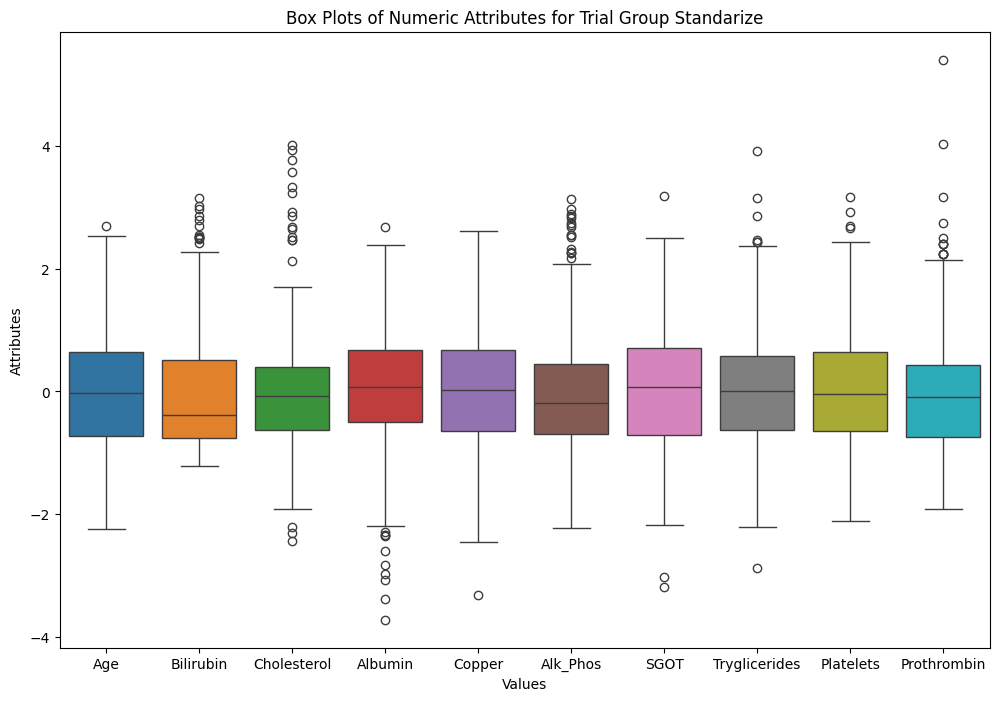

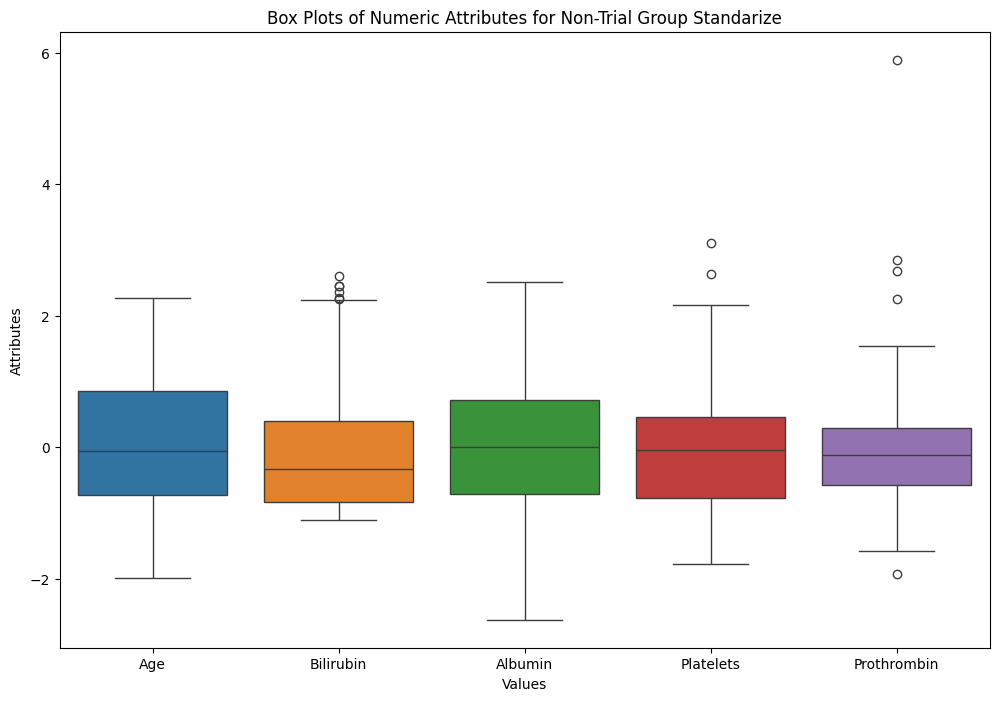

In [20]:

scaler = StandardScaler()

# Standardize numeric attributes for the trial group
numeric_columns_trial = trial_group.select_dtypes(include=['number']).columns
trial_group[numeric_columns_trial] = scaler.fit_transform(trial_group[numeric_columns_trial])

# Standardize numeric attributes for the non-trial group
numeric_columns_non_trial = non_trial_group.select_dtypes(include=['number']).columns
non_trial_group[numeric_columns_non_trial] = scaler.fit_transform(non_trial_group[numeric_columns_non_trial])

plot_boxplots(trial_group, "Trial Group Standarize")
plot_boxplots(non_trial_group, "Non-Trial Group Standarize")



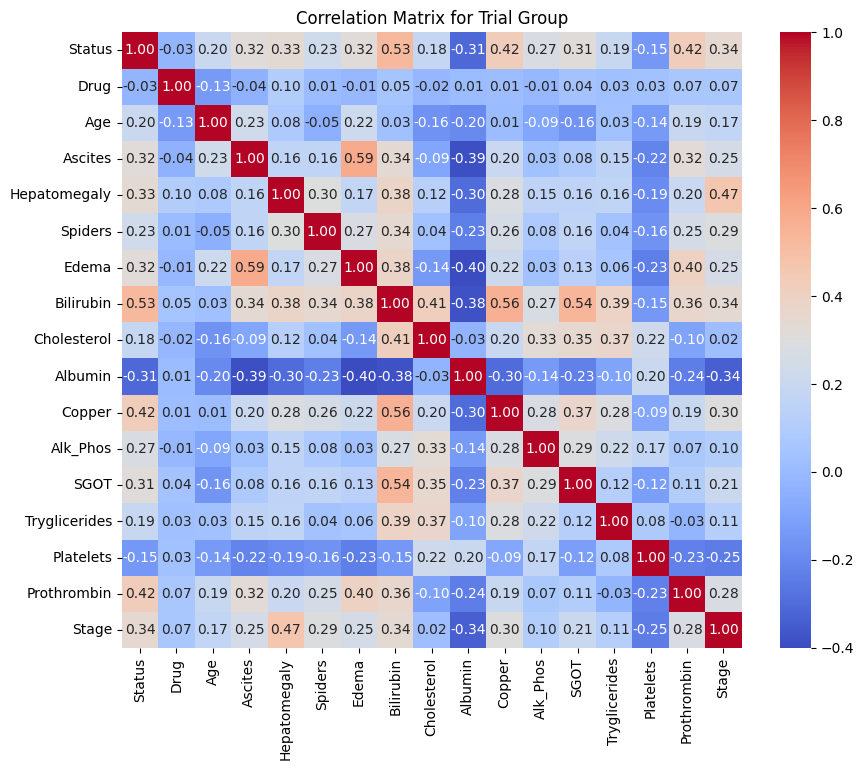

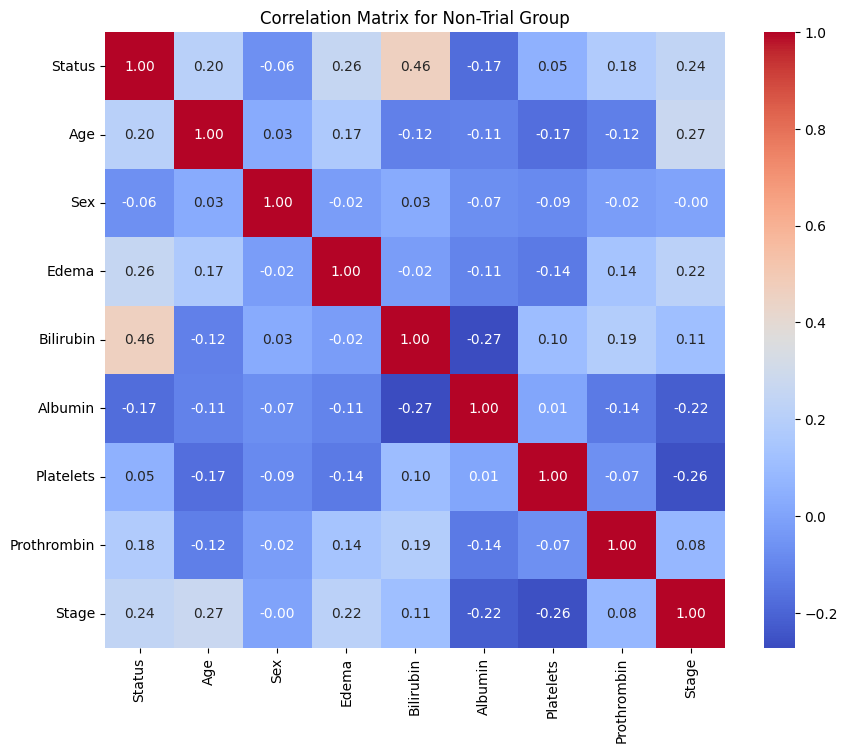

In [21]:
# Check if correlations have changed after feature transformation (Answer: almost same)
plot_correlation_matrix(trial_group, "Trial Group")
plot_correlation_matrix(non_trial_group, "Non-Trial Group")

# Training and Evaluation of Models

## Decision Tree

In [34]:
import pandas as pd
import numpy as np
from sklearn.base import clone

class MetaCost(object):
    """A procedure for making error-based classifiers cost-sensitive

    >>> from sklearn.datasets import load_iris
    >>> from sklearn.linear_model import LogisticRegression
    >>> import pandas as pd
    >>> import numpy as np
    >>> S = pd.DataFrame(load_iris().data)
    >>> S['target'] = load_iris().target
    >>> LR = LogisticRegression(solver='lbfgs', multi_class='multinomial')
    >>> C = np.array([[0, 1, 1], [1, 0, 1], [1, 1, 0]])
    >>> model = MetaCost(S, LR, C).fit('target', 3)
    >>> model.predict_proba(load_iris().data[[2]])
    >>> model.score(S[[0, 1, 2, 3]].values, S['target'])

    .. note:: The form of the cost matrix C must be as follows:
    +---------------+----------+----------+----------+
    |  actual class |          |          |          |
    +               |          |          |          |
    |   +           | y(x)=j_1 | y(x)=j_2 | y(x)=j_3 |
    |       +       |          |          |          |
    |           +   |          |          |          |
    |predicted class|          |          |          |
    +---------------+----------+----------+----------+
    |   h(x)=j_1    |    0     |    a     |     b    |
    |   h(x)=j_2    |    c     |    0     |     d    |
    |   h(x)=j_3    |    e     |    f     |     0    |
    +---------------+----------+----------+----------+
    | C = np.array([[0, a, b],[c, 0 , d],[e, f, 0]]) |
    +------------------------------------------------+
    """

    def __init__(self, S, L, C, m=50, n=1, p=True, q=True):

              """
        :param S: The training set
        :param L: A classification learning algorithm
        :param C: A cost matrix
        :param q: Is True iff all resamples are to be used  for each examples
        :param m: The number of resamples to generate
        :param n: The number of examples in each resample
        :param p: Is True iff L produces class probabilities
        """

        if not isinstance(S, pd.DataFrame):
            raise ValueError('S must be a DataFrame object')
        new_index = list(range(len(S)))
        S.index = new_index
        self.S = S
        self.L = L
        self.C = C
        self.m = m
        self.n = len(S) * n
        self.p = p
        self.q = q

    def fit(self, flag, num_class):
        col = [col for col in self.S.columns if col != flag]
        S_ = {}
        M = []

        # Bootstrap resampling and model fitting
        for i in range(self.m):
            S_[i] = self.S.sample(n=self.n, replace=True)
            X = S_[i][col].values
            y = S_[i][flag].values
            model = clone(self.L)
            M.append(model.fit(X, y))

        label = []
        S_array = self.S[col].values

        # Iterate over each instance in the original dataset
        for i in range(len(self.S)):
            if not self.q:
                k_th = [k for k, v in S_.items() if i not in v.index]
                M_ = list(np.array(M)[k_th])
            else:
                M_ = M

            # Aggregate predictions from each model
            if self.p:
                P_j = []
                for model in M_:
                    prob = model.predict_proba(S_array[i].reshape(1, -1))
                    if prob.shape[1] < num_class:
                        prob = np.pad(prob, ((0, 0), (0, num_class - prob.shape[1])), 'constant', constant_values=0)

                    P_j.append(prob.flatten())

                P_j = np.array(P_j)

            else:
                P_j = []
                for model in M_:
                    vector = np.zeros(num_class)
                    vector[model.predict(S_array[i].reshape(1, -1))] = 1
                    P_j.append(vector)

            # Calculate P(j|x) as the average over all models
            P = np.mean(P_j, axis=0)

            label.append(np.argmin(self.C.dot(P)))

        X_train = self.S[col].values
        y_train = np.array(label)
        model_new = clone(self.L)
        model_new.fit(X_train, y_train)

        return model_new

Using 10 folds for Trial
Best parameters for DecisionTreeClassifier: {'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 5}
Decision Tree for Fold 1 (Trial Group):


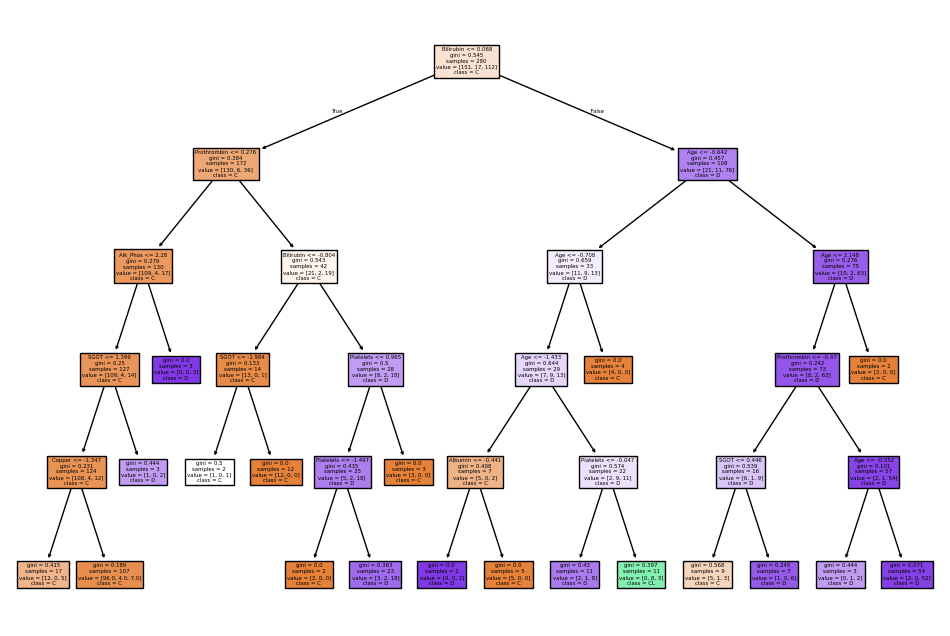

Confusion Matrix for Fold 1 (Trial Group):


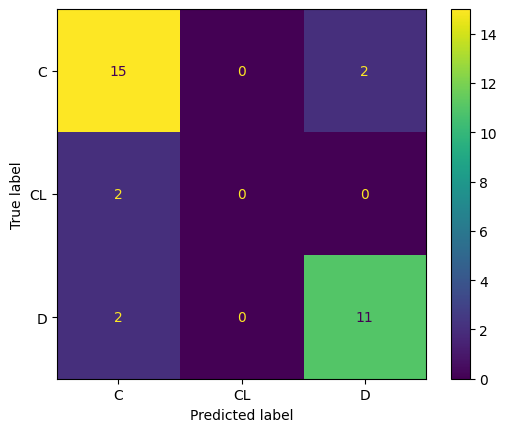

Confusion Matrix (Percentage) for Fold 1 (Trial Group):
[[ 88.23529412   0.          11.76470588]
 [100.           0.           0.        ]
 [ 15.38461538   0.          84.61538462]]
--------------------------------------------------
Decision Tree for Fold 2 (Trial Group):


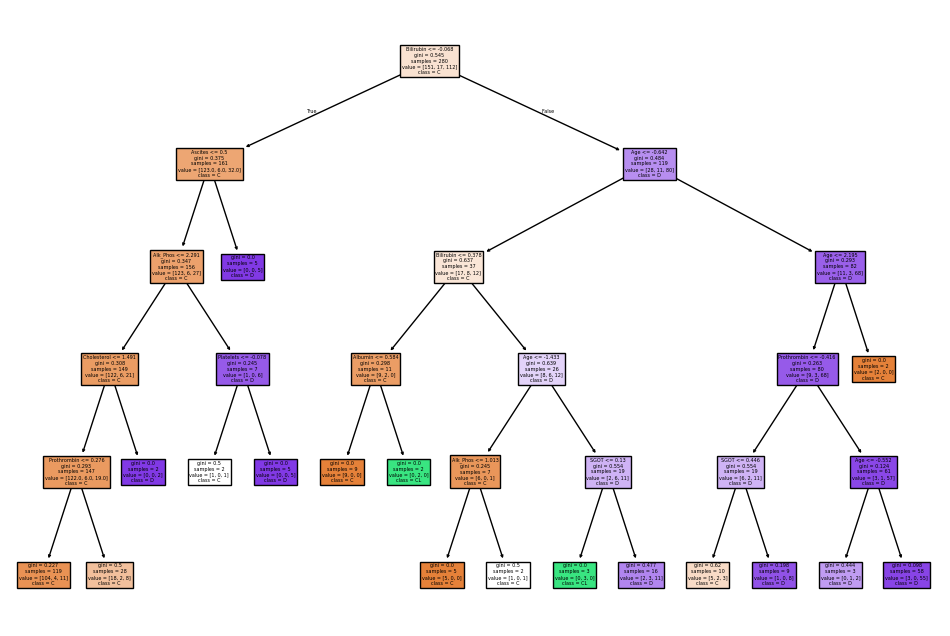

Confusion Matrix for Fold 2 (Trial Group):


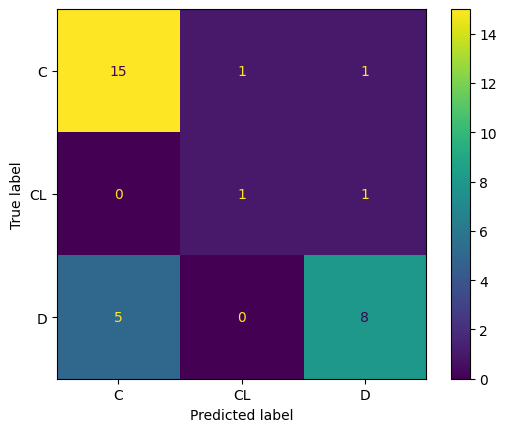

Confusion Matrix (Percentage) for Fold 2 (Trial Group):
[[88.23529412  5.88235294  5.88235294]
 [ 0.         50.         50.        ]
 [38.46153846  0.         61.53846154]]
--------------------------------------------------
Decision Tree for Fold 3 (Trial Group):


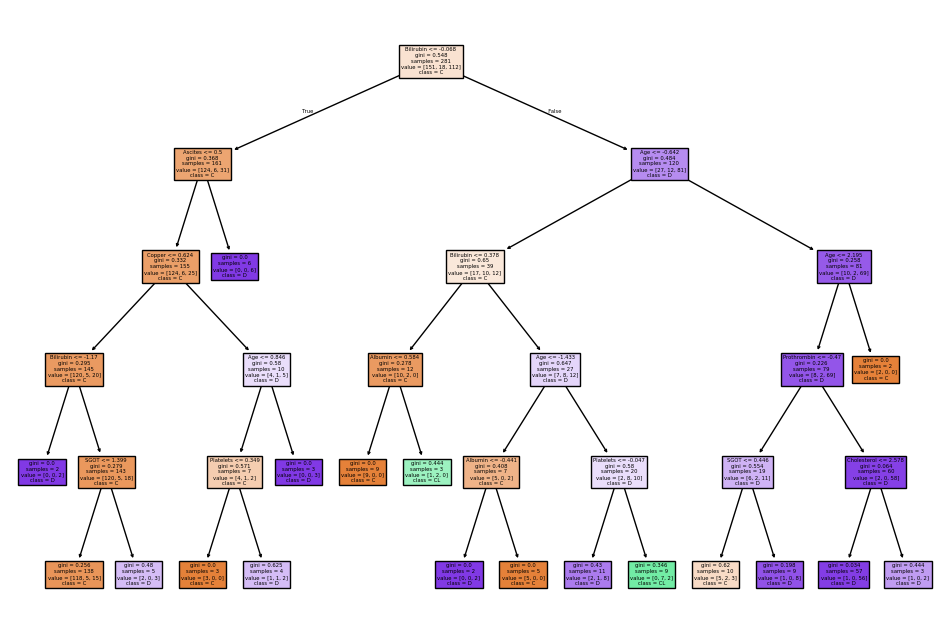

Confusion Matrix for Fold 3 (Trial Group):


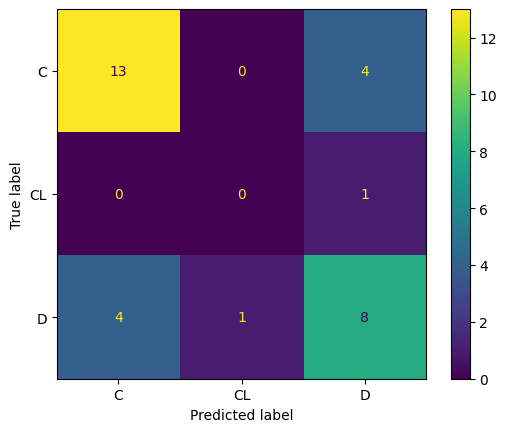

Confusion Matrix (Percentage) for Fold 3 (Trial Group):
[[ 76.47058824   0.          23.52941176]
 [  0.           0.         100.        ]
 [ 30.76923077   7.69230769  61.53846154]]
--------------------------------------------------
Decision Tree for Fold 4 (Trial Group):


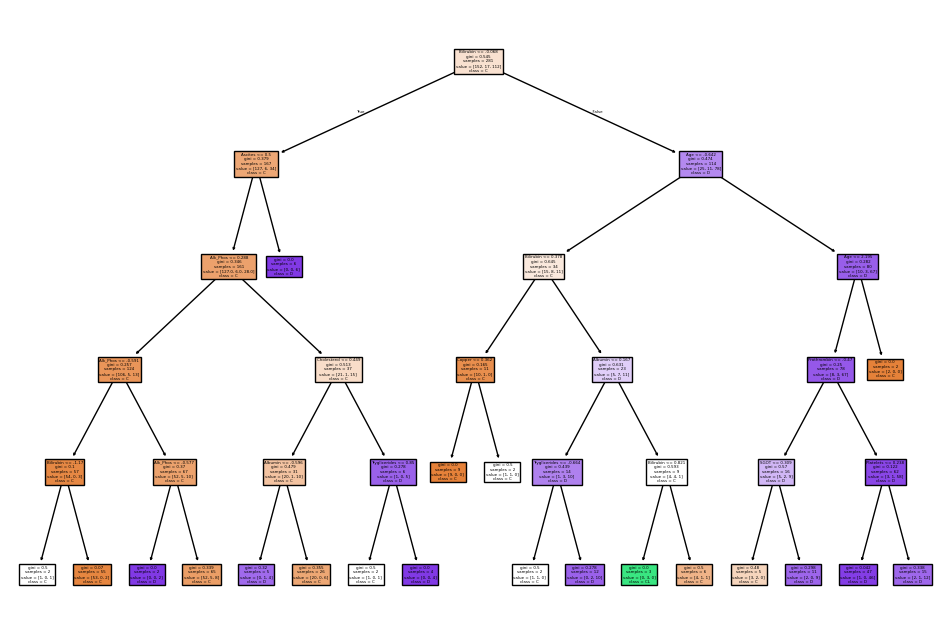

Confusion Matrix for Fold 4 (Trial Group):


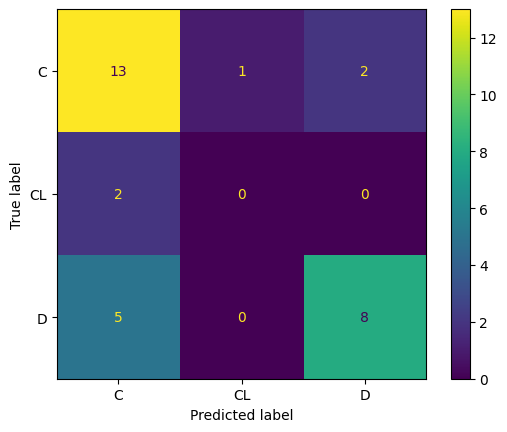

Confusion Matrix (Percentage) for Fold 4 (Trial Group):
[[ 81.25         6.25        12.5       ]
 [100.           0.           0.        ]
 [ 38.46153846   0.          61.53846154]]
--------------------------------------------------
Decision Tree for Fold 5 (Trial Group):


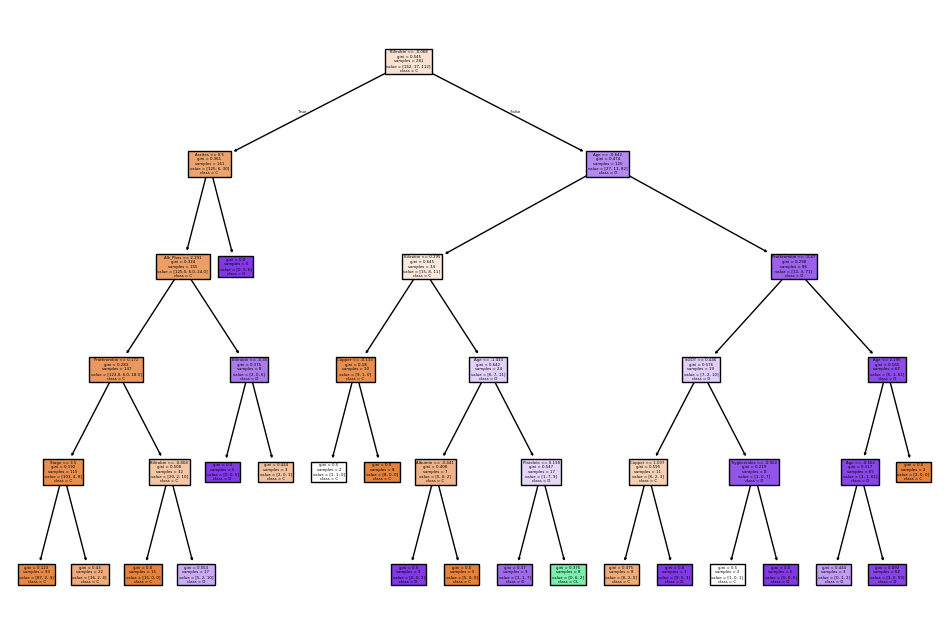

Confusion Matrix for Fold 5 (Trial Group):


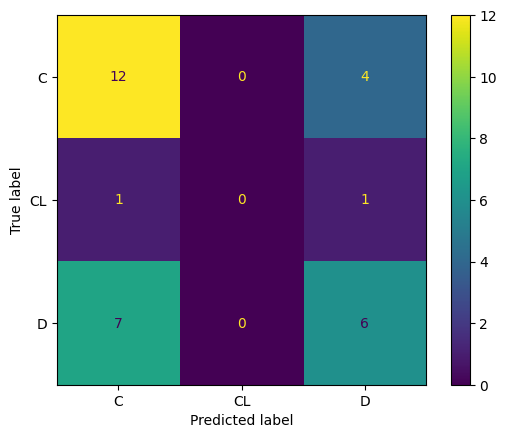

Confusion Matrix (Percentage) for Fold 5 (Trial Group):
[[75.          0.         25.        ]
 [50.          0.         50.        ]
 [53.84615385  0.         46.15384615]]
--------------------------------------------------
Decision Tree for Fold 6 (Trial Group):


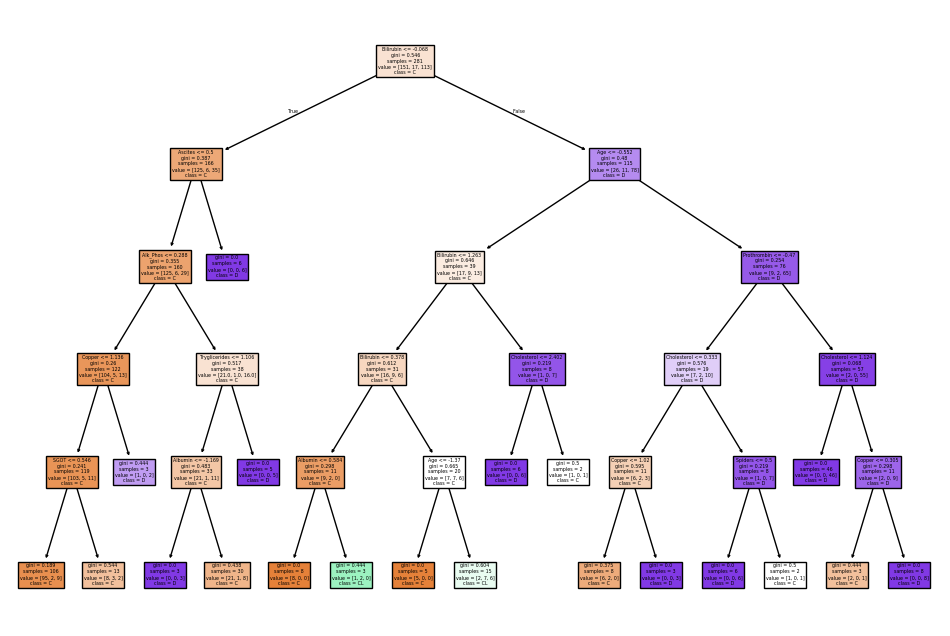

Confusion Matrix for Fold 6 (Trial Group):


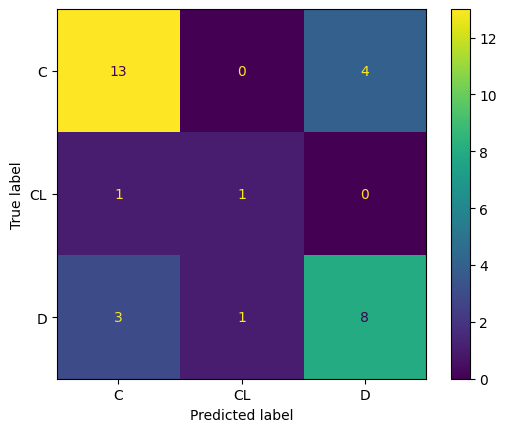

Confusion Matrix (Percentage) for Fold 6 (Trial Group):
[[76.47058824  0.         23.52941176]
 [50.         50.          0.        ]
 [25.          8.33333333 66.66666667]]
--------------------------------------------------
Decision Tree for Fold 7 (Trial Group):


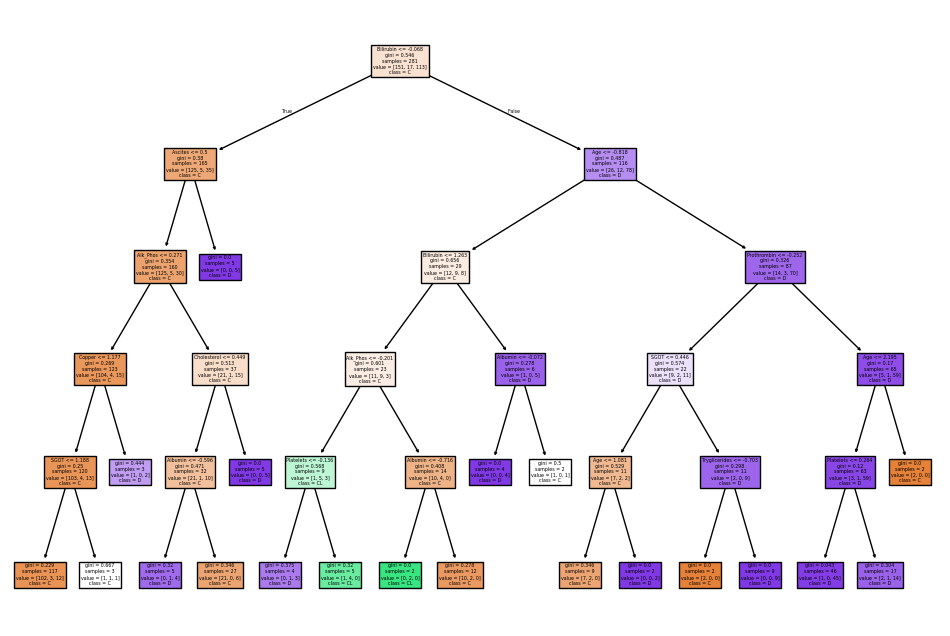

Confusion Matrix for Fold 7 (Trial Group):


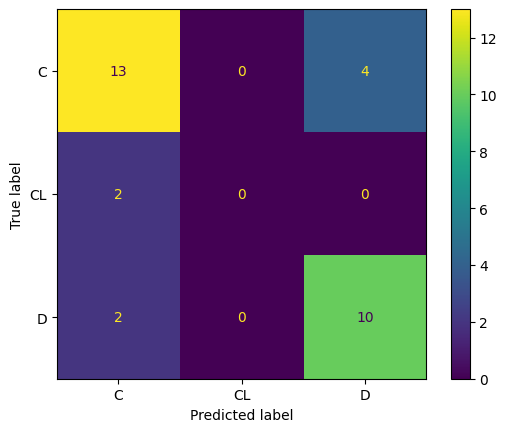

Confusion Matrix (Percentage) for Fold 7 (Trial Group):
[[ 76.47058824   0.          23.52941176]
 [100.           0.           0.        ]
 [ 16.66666667   0.          83.33333333]]
--------------------------------------------------
Decision Tree for Fold 8 (Trial Group):


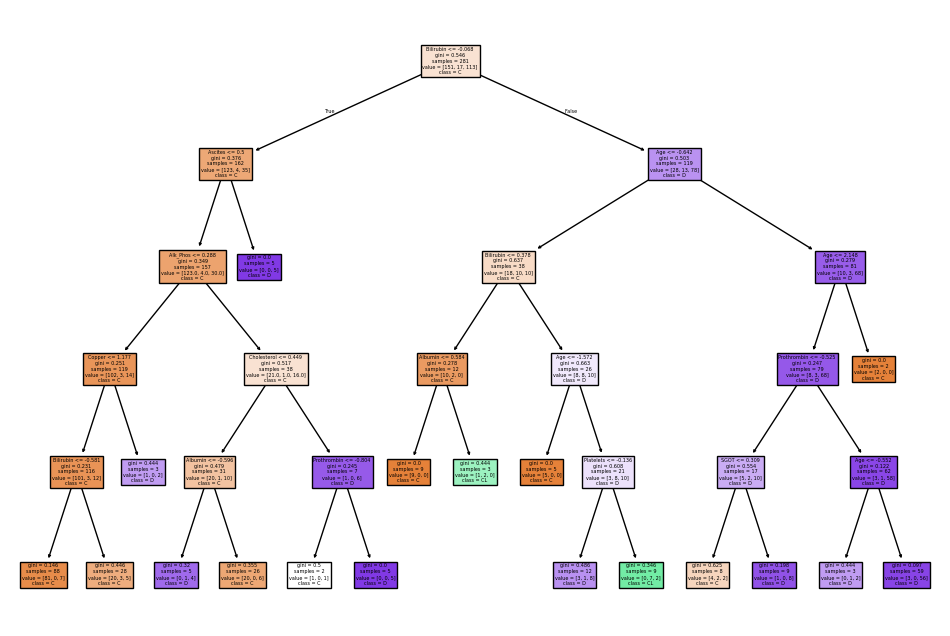

Confusion Matrix for Fold 8 (Trial Group):


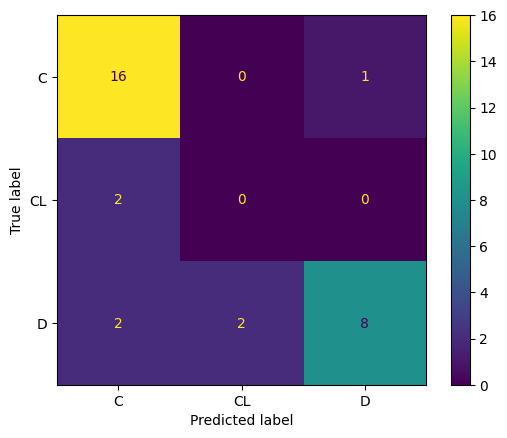

Confusion Matrix (Percentage) for Fold 8 (Trial Group):
[[ 94.11764706   0.           5.88235294]
 [100.           0.           0.        ]
 [ 16.66666667  16.66666667  66.66666667]]
--------------------------------------------------
Decision Tree for Fold 9 (Trial Group):


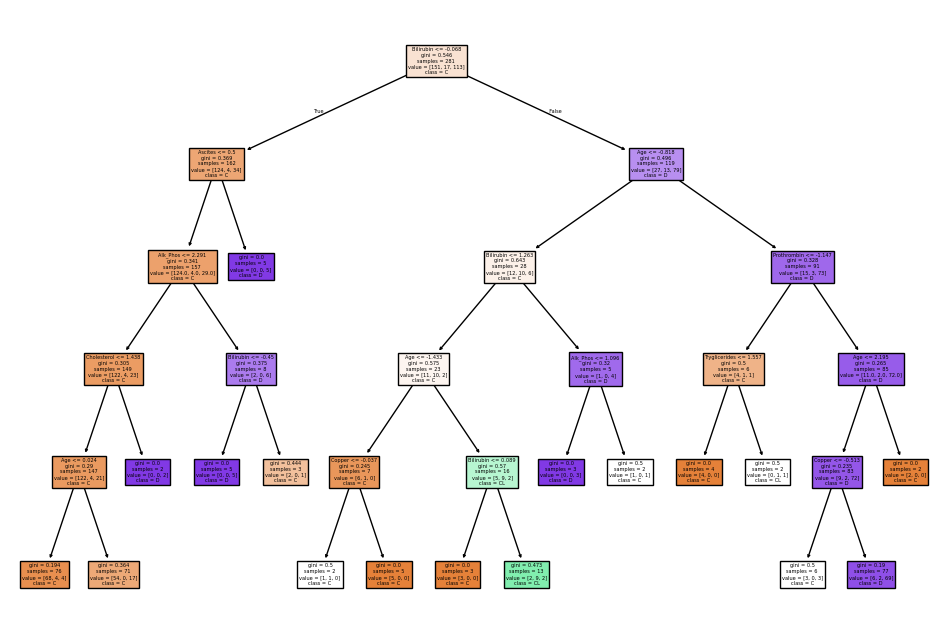

Confusion Matrix for Fold 9 (Trial Group):


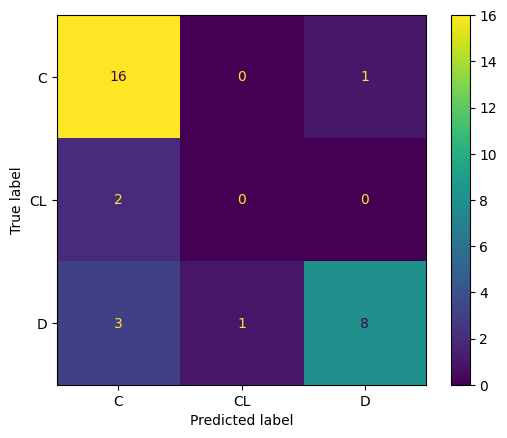

Confusion Matrix (Percentage) for Fold 9 (Trial Group):
[[ 94.11764706   0.           5.88235294]
 [100.           0.           0.        ]
 [ 25.           8.33333333  66.66666667]]
--------------------------------------------------
Decision Tree for Fold 10 (Trial Group):


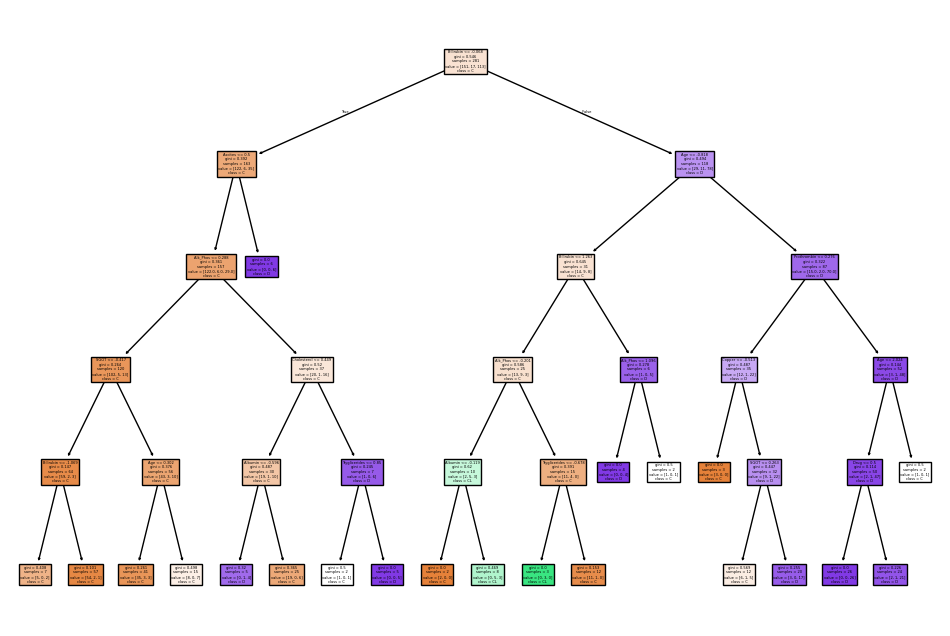

Confusion Matrix for Fold 10 (Trial Group):


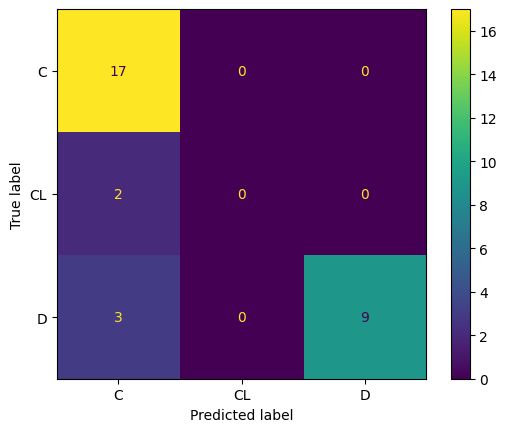

Confusion Matrix (Percentage) for Fold 10 (Trial Group):
[[100.   0.   0.]
 [100.   0.   0.]
 [ 25.   0.  75.]]
--------------------------------------------------
Results for Trial Group:
Mean accuracy: 0.7336693548387097
Standard deviation of accuracy: 0.0715453151155573
Mean cost: 70.2
Standard deviation of cost: 17.78651174345324
Mean cost per instance: 2.264516129032258
Standard deviation of cost per instance: 0.5737584433372013
--------------------------------------------------
Using 6 folds for Non-Trial
Best parameters for DecisionTreeClassifier: {'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 2}
Decision Tree for Fold 1 (Non-Trial Group):


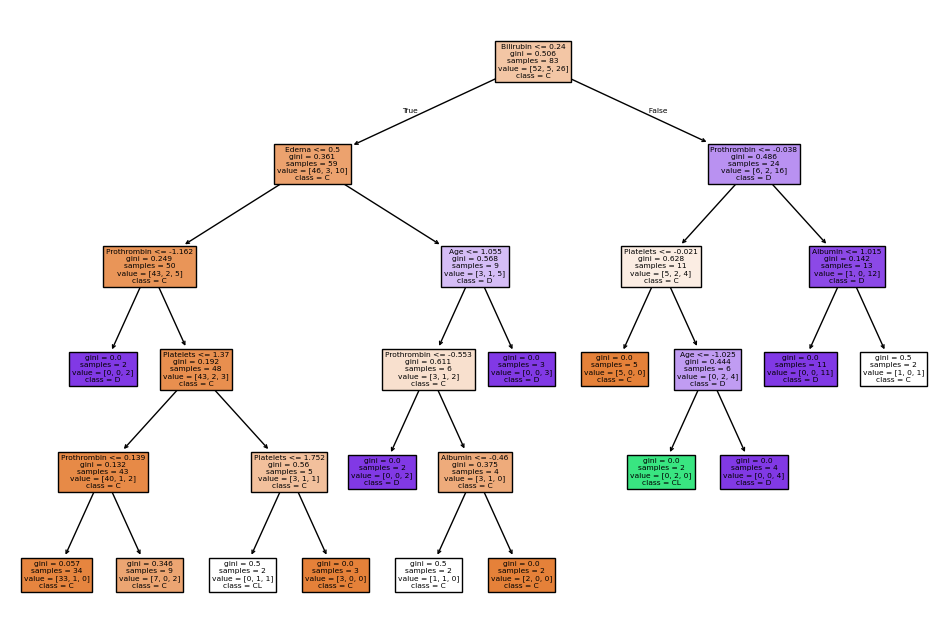

Confusion Matrix for Fold 1 (Non-Trial Group):


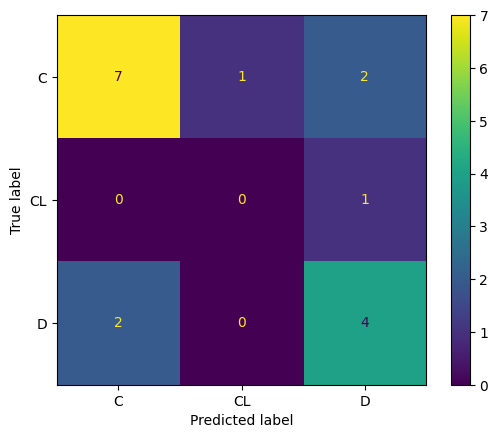

Confusion Matrix (Percentage) for Fold 1 (Non-Trial Group):
[[ 70.          10.          20.        ]
 [  0.           0.         100.        ]
 [ 33.33333333   0.          66.66666667]]
--------------------------------------------------
Decision Tree for Fold 2 (Non-Trial Group):


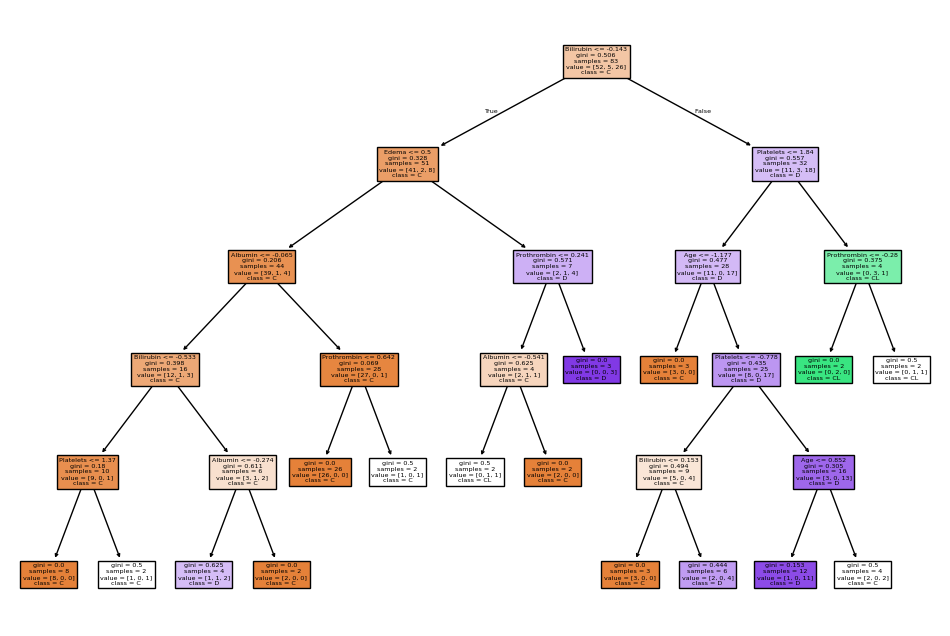

Confusion Matrix for Fold 2 (Non-Trial Group):


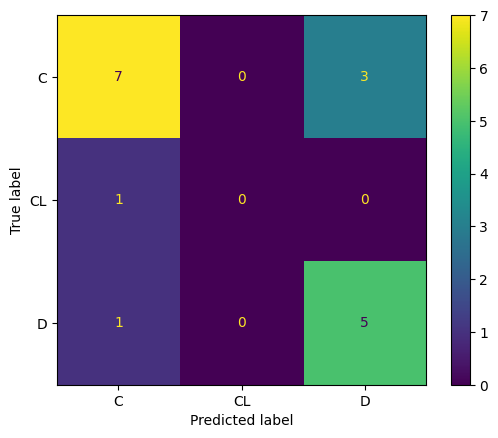

Confusion Matrix (Percentage) for Fold 2 (Non-Trial Group):
[[ 70.           0.          30.        ]
 [100.           0.           0.        ]
 [ 16.66666667   0.          83.33333333]]
--------------------------------------------------
Decision Tree for Fold 3 (Non-Trial Group):


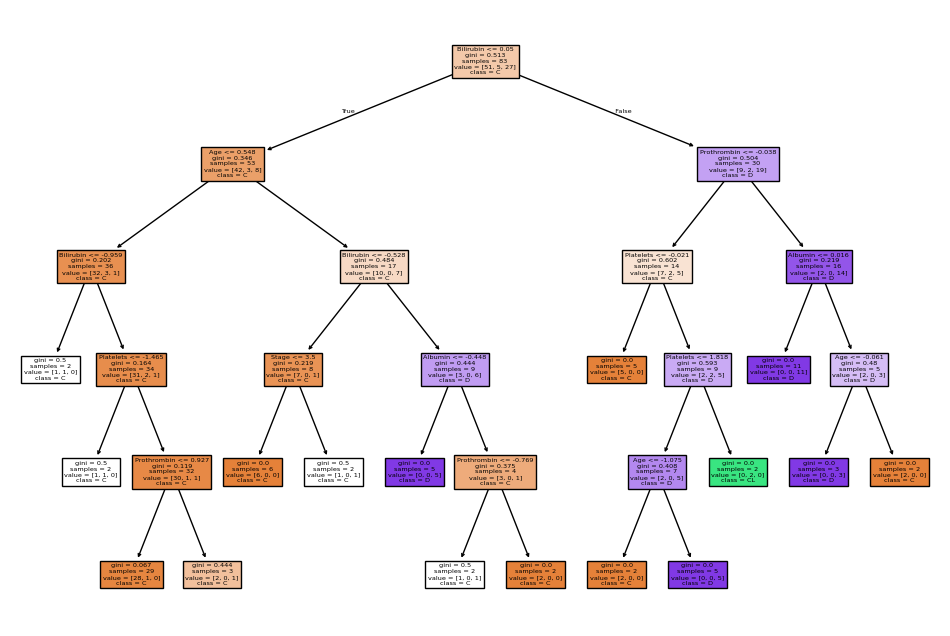

Confusion Matrix for Fold 3 (Non-Trial Group):


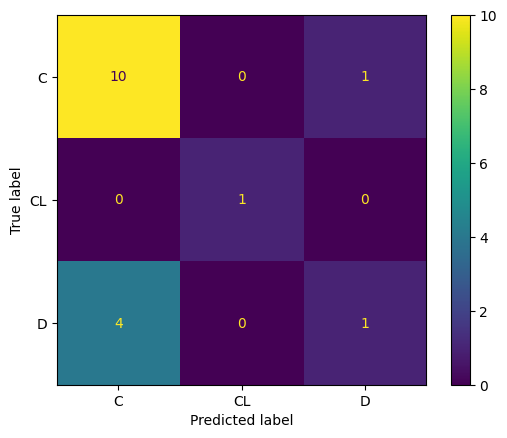

Confusion Matrix (Percentage) for Fold 3 (Non-Trial Group):
[[ 90.90909091   0.           9.09090909]
 [  0.         100.           0.        ]
 [ 80.           0.          20.        ]]
--------------------------------------------------
Decision Tree for Fold 4 (Non-Trial Group):


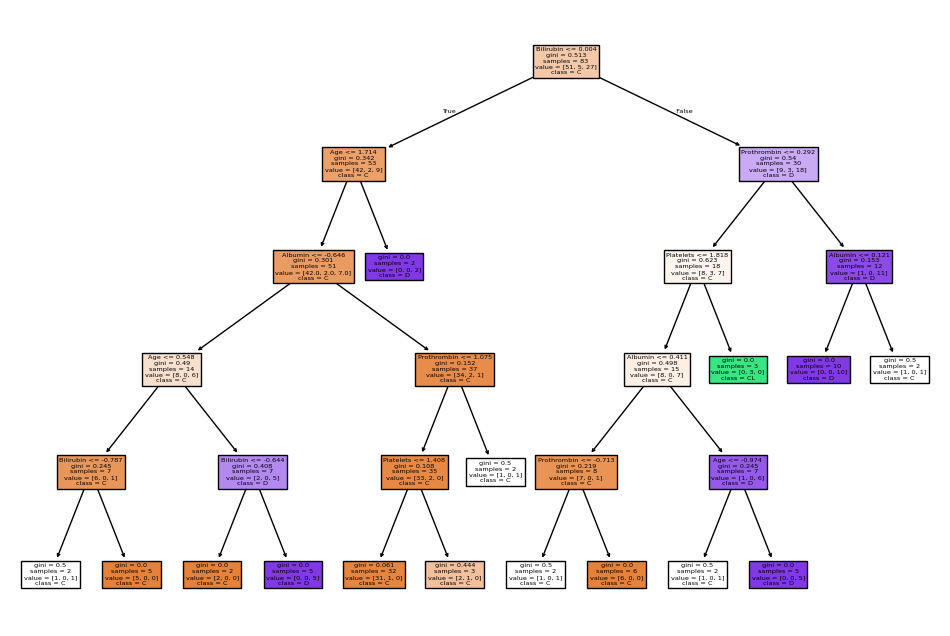

Confusion Matrix for Fold 4 (Non-Trial Group):


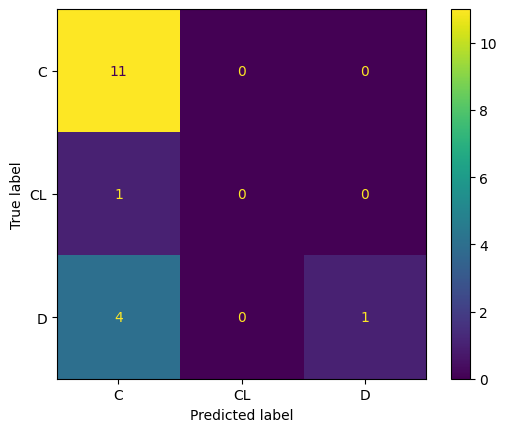

Confusion Matrix (Percentage) for Fold 4 (Non-Trial Group):
[[100.   0.   0.]
 [100.   0.   0.]
 [ 80.   0.  20.]]
--------------------------------------------------
Decision Tree for Fold 5 (Non-Trial Group):


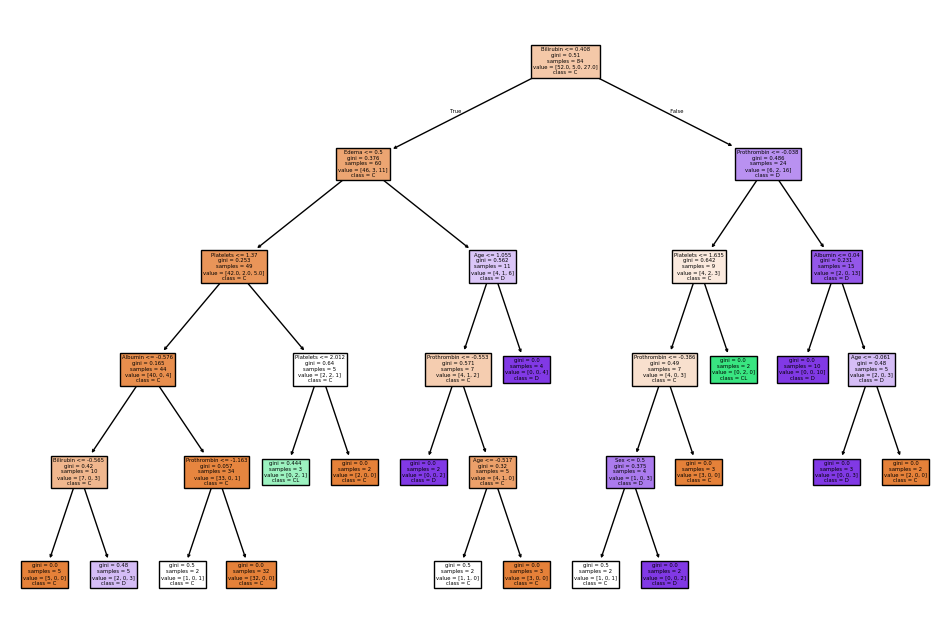

Confusion Matrix for Fold 5 (Non-Trial Group):


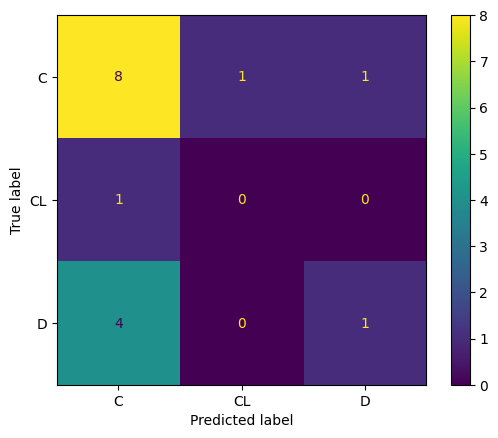

Confusion Matrix (Percentage) for Fold 5 (Non-Trial Group):
[[ 80.  10.  10.]
 [100.   0.   0.]
 [ 80.   0.  20.]]
--------------------------------------------------
Decision Tree for Fold 6 (Non-Trial Group):


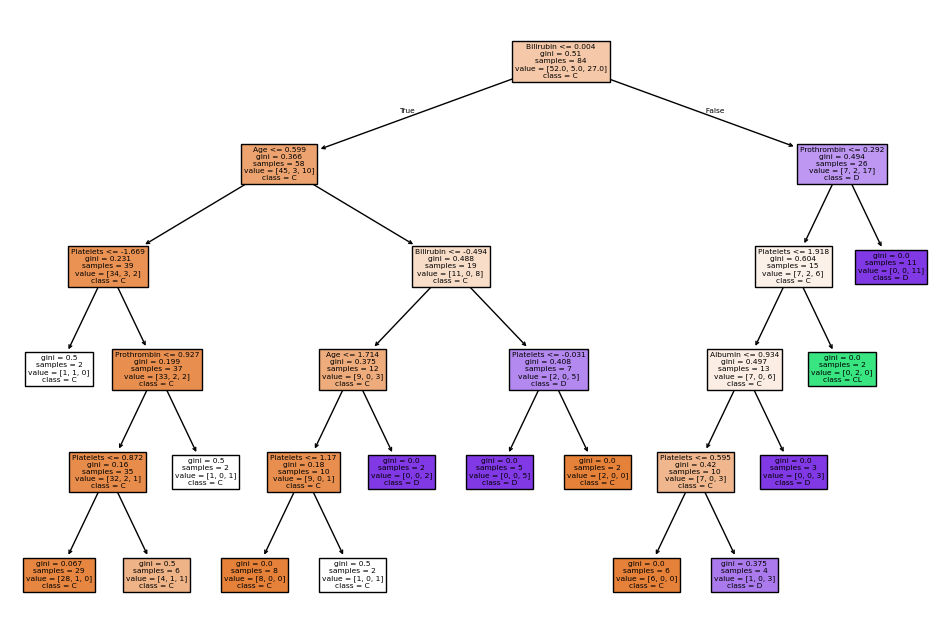

Confusion Matrix for Fold 6 (Non-Trial Group):


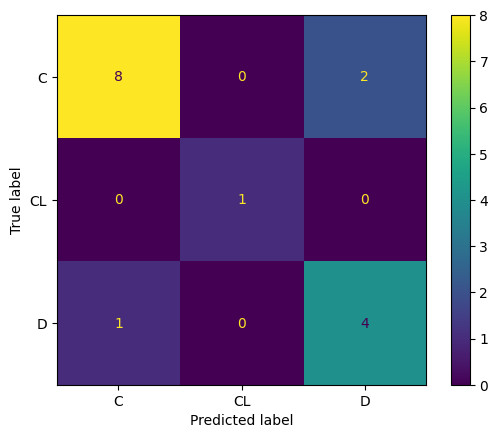

Confusion Matrix (Percentage) for Fold 6 (Non-Trial Group):
[[ 80.   0.  20.]
 [  0. 100.   0.]
 [ 20.   0.  80.]]
--------------------------------------------------
Results for Non-Trial Group:
Mean accuracy: 0.689950980392157
Standard deviation of accuracy: 0.07512564766663776
Mean cost: 41.5
Standard deviation of cost: 12.065791865158845
Mean cost per instance: 2.59375
Standard deviation of cost per instance: 0.7541119915724278
--------------------------------------------------


In [23]:
#Accuracy-based training

def tree_accuracy(data, group_name, cost_matrix):
    target_column = 'Status'
    # Separate target and features
    y = data[target_column]
    X = data.drop(columns=[target_column])

    for col in X.select_dtypes(include=['object']).columns:
        X[col] = LabelEncoder().fit_transform(X[col])
    y_encoder = LabelEncoder()
    y = y_encoder.fit_transform(y)


    # Ensure the dataset has enough samples per class
    class_counts = np.bincount(y)
    min_samples_per_class = np.min(class_counts)

    # Adjust number of folds dynamically
    n_splits = min(10, min_samples_per_class)
    if n_splits < 2:
        raise ValueError(f"Not enough samples for meaningful cross-validation. Minimum class count: {min_samples_per_class}")

    print(f"Using {n_splits} folds for {group_name}")


    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    # Define a parameter grid for DecisionTreeClassifier
    param_grid = {
        'max_depth': [3, 5, 10, None],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 5]
    }

    # Perform grid search to find the best parameters
    grid_search = GridSearchCV(DecisionTreeClassifier(random_state=42), param_grid, cv=3, scoring='accuracy')
    grid_search.fit(X, y)

    # Use the best estimator
    classifier = grid_search.best_estimator_
    print(f"Best parameters for DecisionTreeClassifier: {grid_search.best_params_}")

    # Initialize lists to store accuracy and cost scores
    accuracy_scores = []
    cost_scores = []

    # Cross-validation loop
    for fold_idx, (train_index, test_index) in enumerate(skf.split(X, y), start=1):
        # Split the data into training and validation sets
        X_train_fold, X_val_fold = X.iloc[train_index], X.iloc[test_index]
        y_train_fold, y_val_fold = y[train_index], y[test_index]

        # Train the classifier
        classifier.fit(X_train_fold, y_train_fold)

        # Make predictions on the validation set
        y_pred_fold = classifier.predict(X_val_fold)

        # Calculate accuracy for this fold
        accuracy_fold = accuracy_score(y_val_fold, y_pred_fold)
        accuracy_scores.append(accuracy_fold)

        # Calculate cost for this fold
        confusion_mat = confusion_matrix(y_val_fold, y_pred_fold, labels=np.unique(y))
        cost = np.sum(confusion_mat * np.transpose(cost_matrix))
        cost_scores.append(cost)

        # Print decision tree
        print(f"Decision Tree for Fold {fold_idx} ({group_name} Group):")
        plt.figure(figsize=(12, 8))
        plot_tree(classifier, filled=True, feature_names=X.columns, class_names=y_encoder.classes_)
        plt.show()

        # Plot confusion matrix
        print(f"Confusion Matrix for Fold {fold_idx} ({group_name} Group):")
        disp = ConfusionMatrixDisplay(confusion_matrix=confusion_mat, display_labels=y_encoder.classes_)
        disp.plot()
        plt.show()

        # Print confusion matrix in percentage
        confusion_mat_percent = confusion_mat / confusion_mat.sum(axis=1, keepdims=True) * 100
        print(f"Confusion Matrix (Percentage) for Fold {fold_idx} ({group_name} Group):")
        print(confusion_mat_percent)
        print("--------------------------------------------------")

    # Calculate metrics across all folds
    divisor = len(y_val_fold)
    cost_scores_per_instance = [x / divisor for x in cost_scores]

    print(f"Results for {group_name} Group:")
    print("Mean accuracy:", np.mean(accuracy_scores))
    print("Standard deviation of accuracy:", np.std(accuracy_scores))
    print("Mean cost:", np.mean(cost_scores))
    print("Standard deviation of cost:", np.std(cost_scores))
    print("Mean cost per instance:", np.mean(cost_scores_per_instance))
    print("Standard deviation of cost per instance:", np.std(cost_scores_per_instance))
    print("--------------------------------------------------")

cost_matrix = np.array(
  [[ 0,  8, 10],  # Predicted Censored
  [ 5,  0, 15],  # Predicted Transplant
  [ 5, 10,  0]]  # Predicted Death
                       )

# Train and evaluate on both groups
tree_accuracy(trial_group, "Trial", cost_matrix)
tree_accuracy(non_trial_group, "Non-Trial", cost_matrix)




Using 10 folds for Trial
Best parameters for DecisionTreeClassifier: {'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 5}
Decision Tree for Fold 1 (Trial Group):


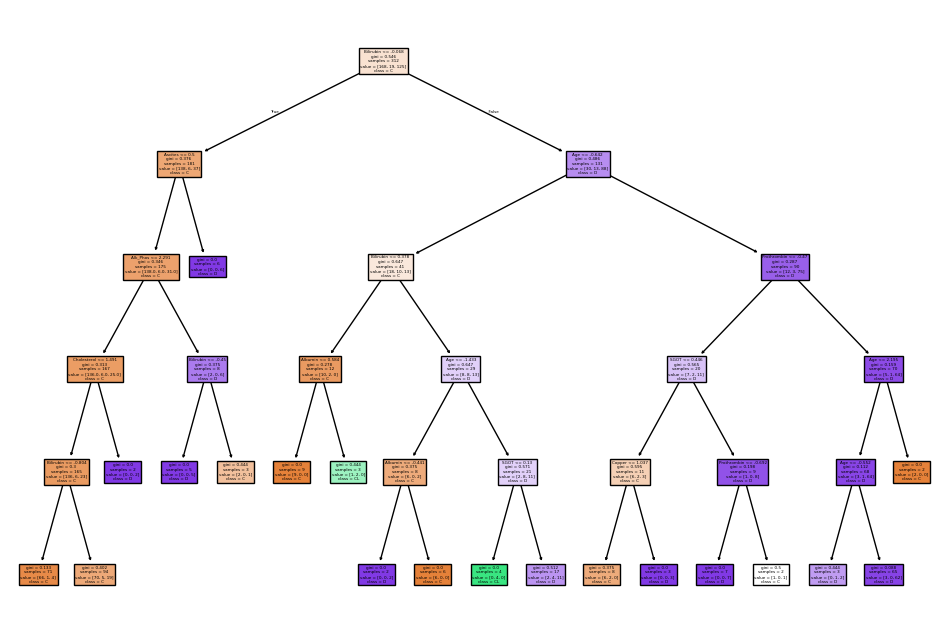

Confusion Matrix for Fold 1 (Trial Group):


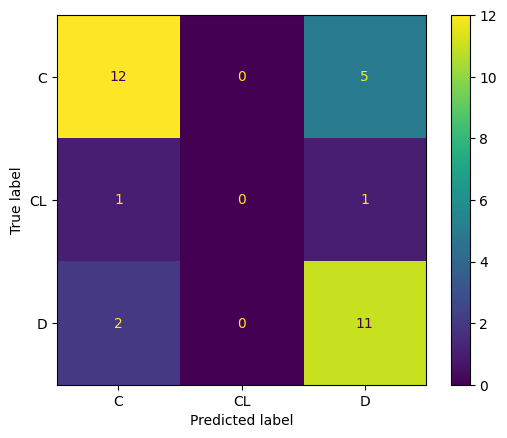

Confusion Matrix (Percentage) for Fold 1 (Trial Group):
[[70.58823529  0.         29.41176471]
 [50.          0.         50.        ]
 [15.38461538  0.         84.61538462]]
--------------------------------------------------
Decision Tree for Fold 2 (Trial Group):


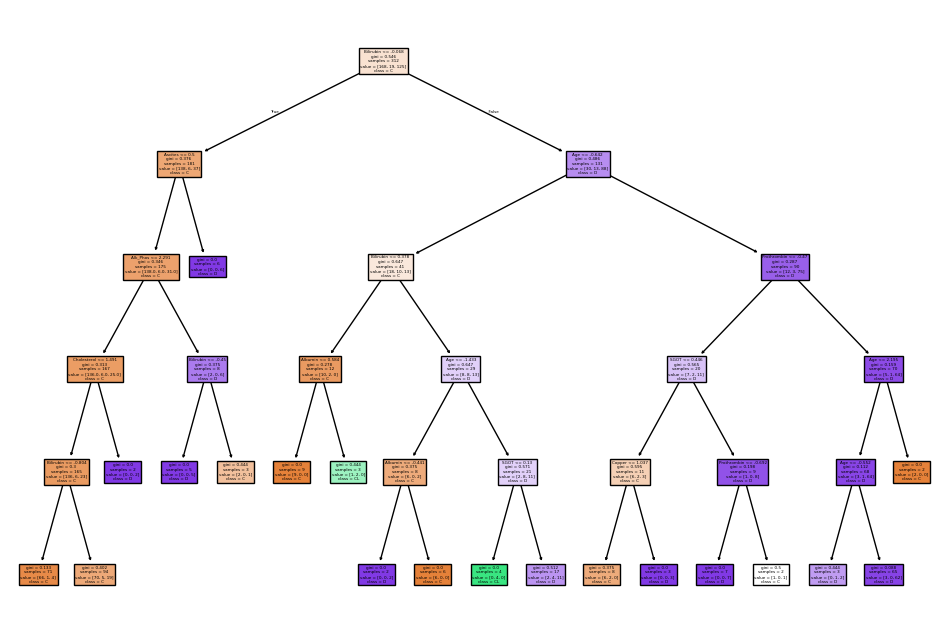

Confusion Matrix for Fold 2 (Trial Group):


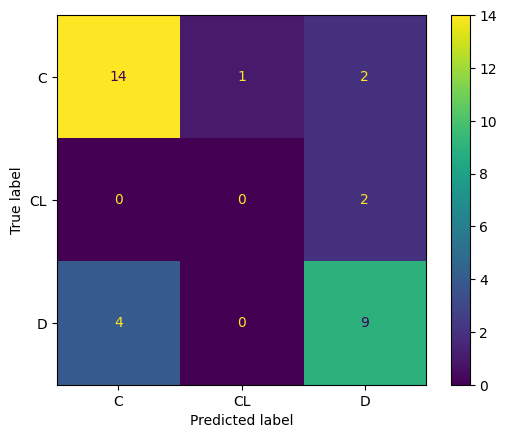

Confusion Matrix (Percentage) for Fold 2 (Trial Group):
[[ 82.35294118   5.88235294  11.76470588]
 [  0.           0.         100.        ]
 [ 30.76923077   0.          69.23076923]]
--------------------------------------------------
Decision Tree for Fold 3 (Trial Group):


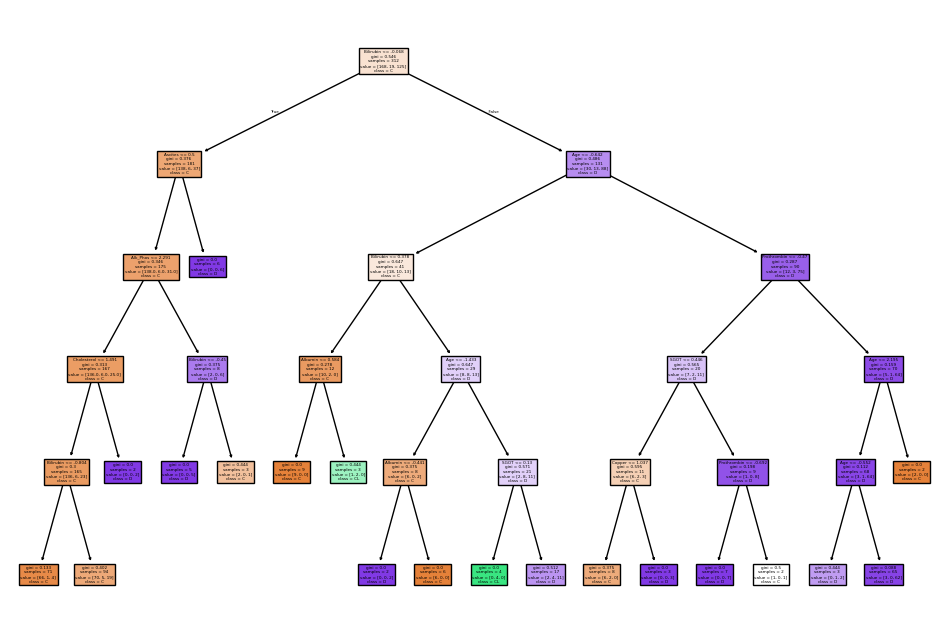

Confusion Matrix for Fold 3 (Trial Group):


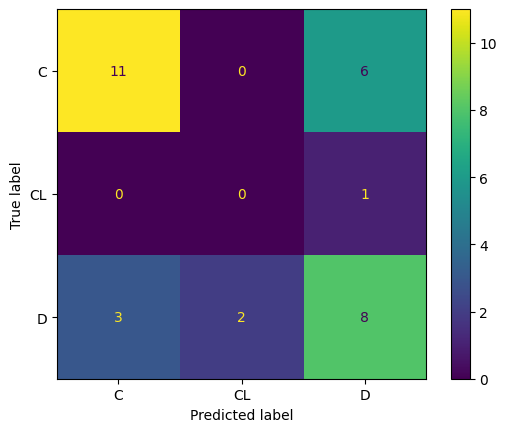

Confusion Matrix (Percentage) for Fold 3 (Trial Group):
[[ 64.70588235   0.          35.29411765]
 [  0.           0.         100.        ]
 [ 23.07692308  15.38461538  61.53846154]]
--------------------------------------------------
Decision Tree for Fold 4 (Trial Group):


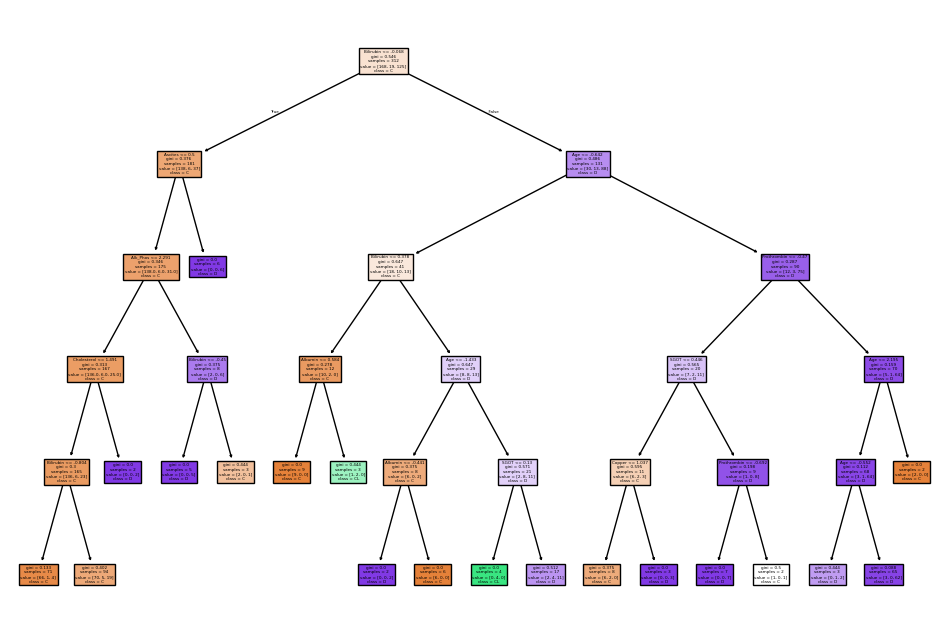

Confusion Matrix for Fold 4 (Trial Group):


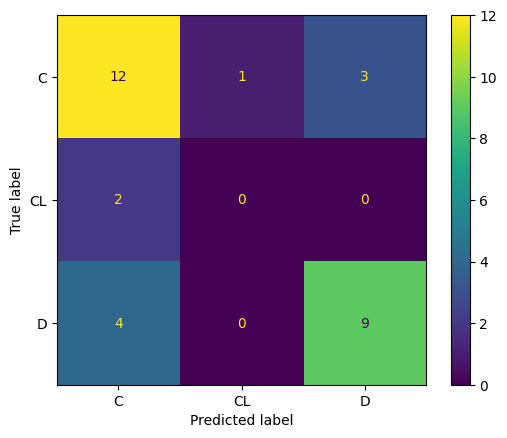

Confusion Matrix (Percentage) for Fold 4 (Trial Group):
[[ 75.           6.25        18.75      ]
 [100.           0.           0.        ]
 [ 30.76923077   0.          69.23076923]]
--------------------------------------------------
Decision Tree for Fold 5 (Trial Group):


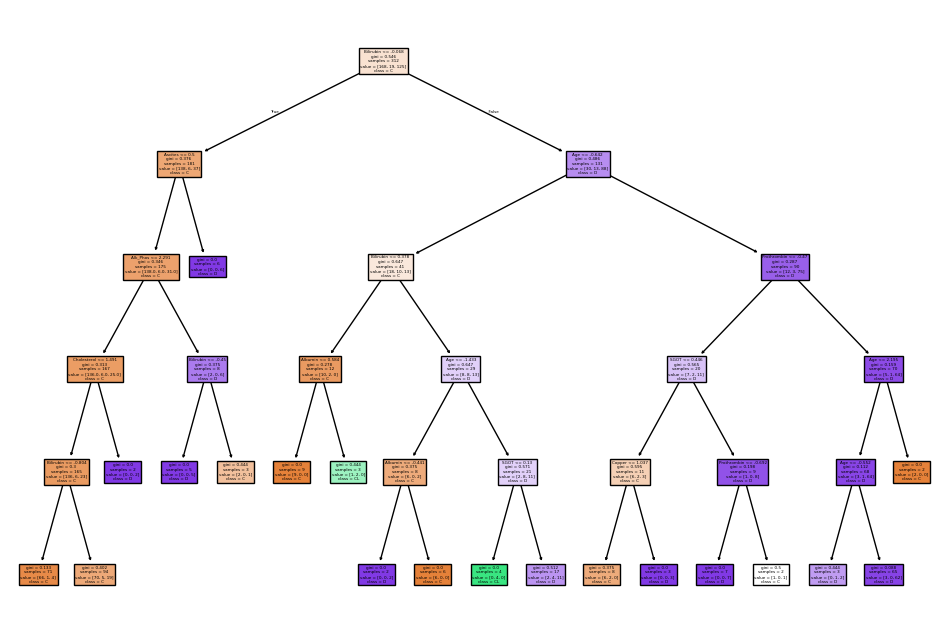

Confusion Matrix for Fold 5 (Trial Group):


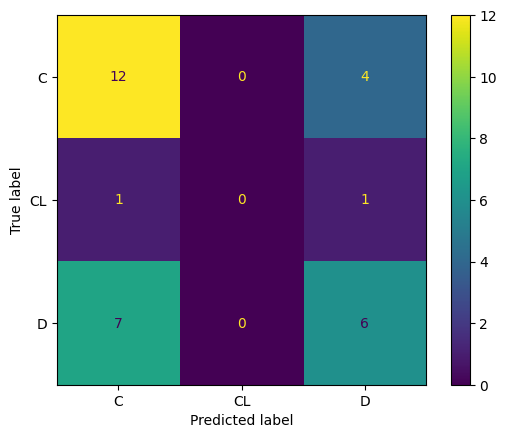

Confusion Matrix (Percentage) for Fold 5 (Trial Group):
[[75.          0.         25.        ]
 [50.          0.         50.        ]
 [53.84615385  0.         46.15384615]]
--------------------------------------------------
Decision Tree for Fold 6 (Trial Group):


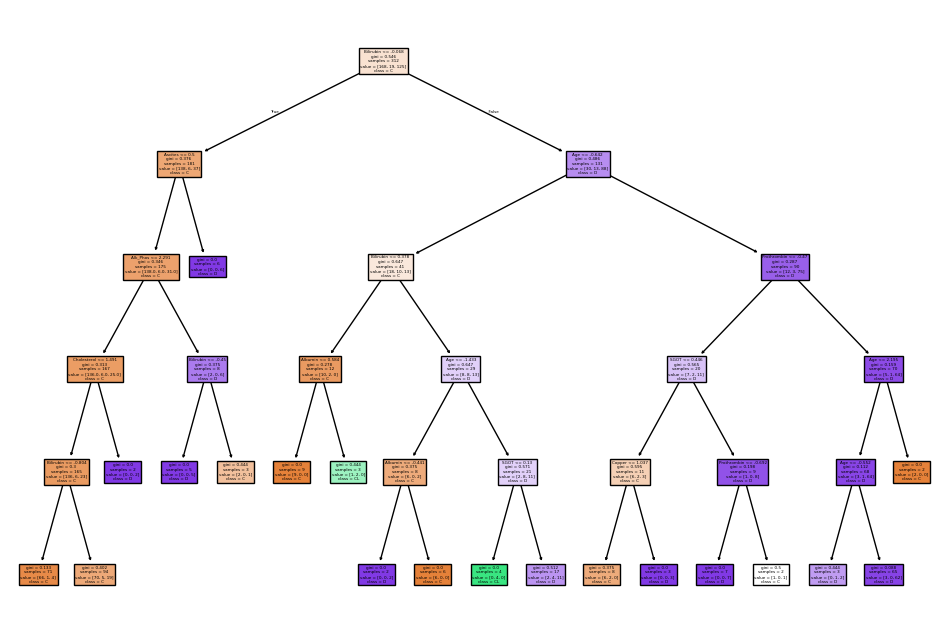

Confusion Matrix for Fold 6 (Trial Group):


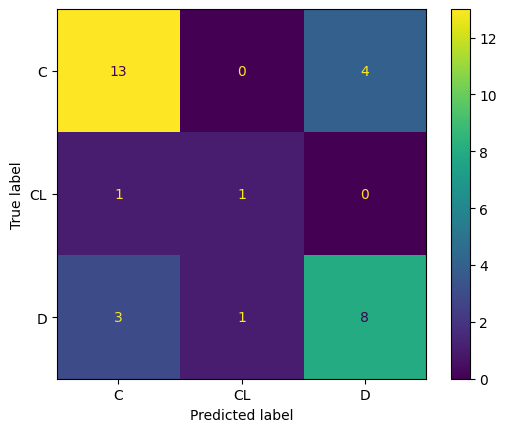

Confusion Matrix (Percentage) for Fold 6 (Trial Group):
[[76.47058824  0.         23.52941176]
 [50.         50.          0.        ]
 [25.          8.33333333 66.66666667]]
--------------------------------------------------
Decision Tree for Fold 7 (Trial Group):


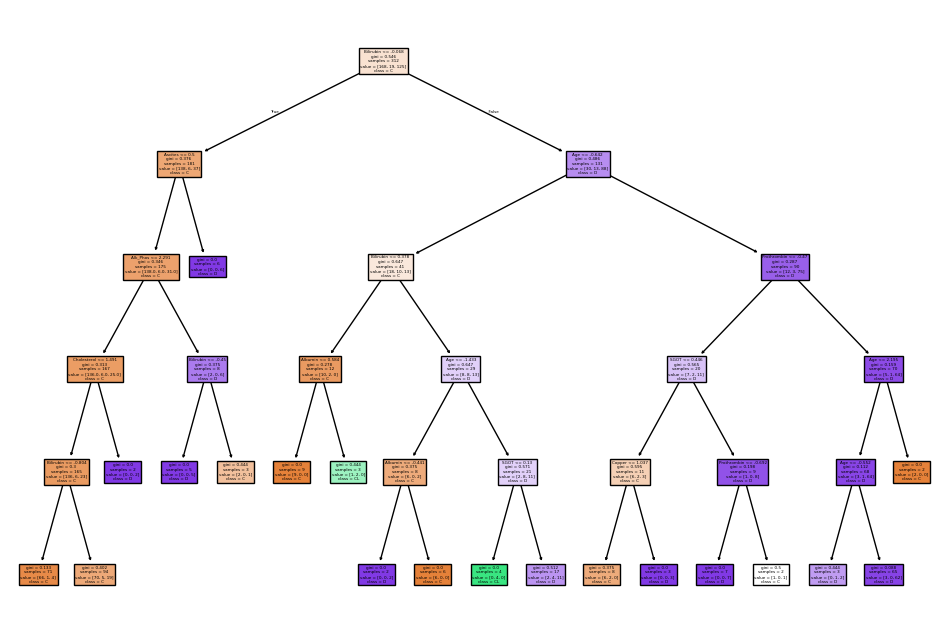

Confusion Matrix for Fold 7 (Trial Group):


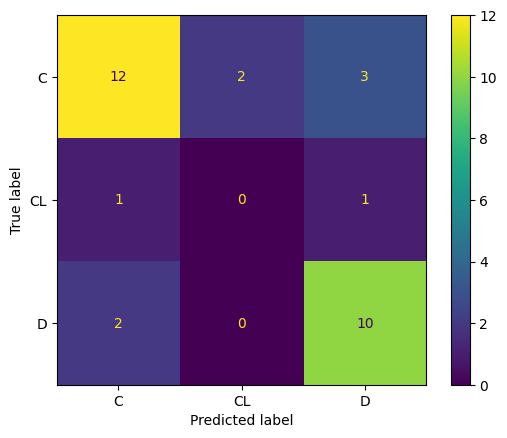

Confusion Matrix (Percentage) for Fold 7 (Trial Group):
[[70.58823529 11.76470588 17.64705882]
 [50.          0.         50.        ]
 [16.66666667  0.         83.33333333]]
--------------------------------------------------
Decision Tree for Fold 8 (Trial Group):


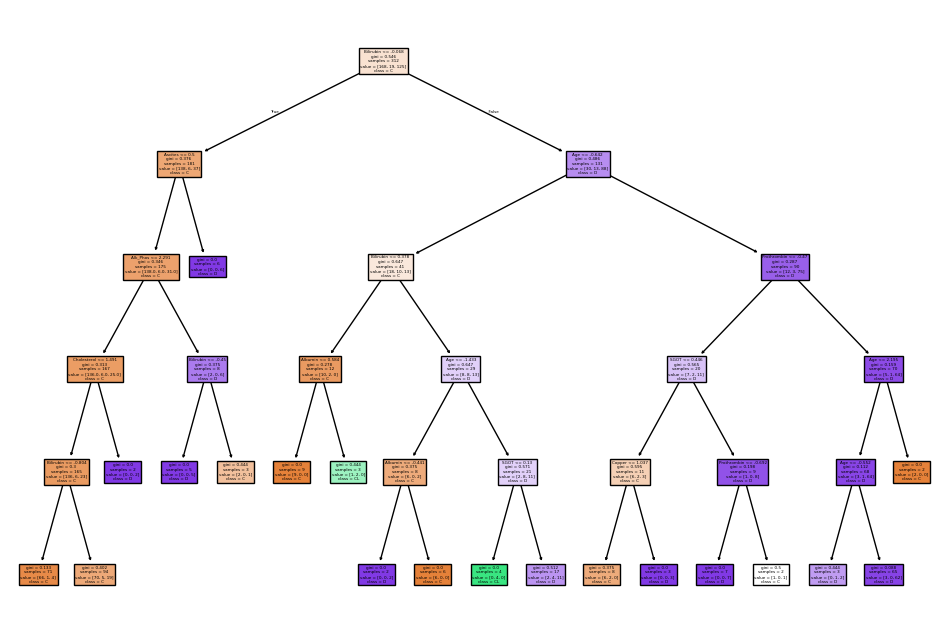

Confusion Matrix for Fold 8 (Trial Group):


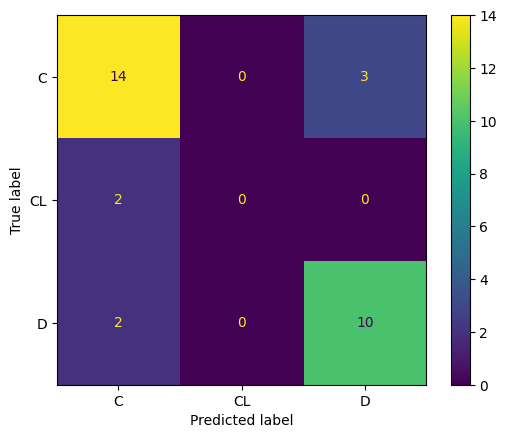

Confusion Matrix (Percentage) for Fold 8 (Trial Group):
[[ 82.35294118   0.          17.64705882]
 [100.           0.           0.        ]
 [ 16.66666667   0.          83.33333333]]
--------------------------------------------------
Decision Tree for Fold 9 (Trial Group):


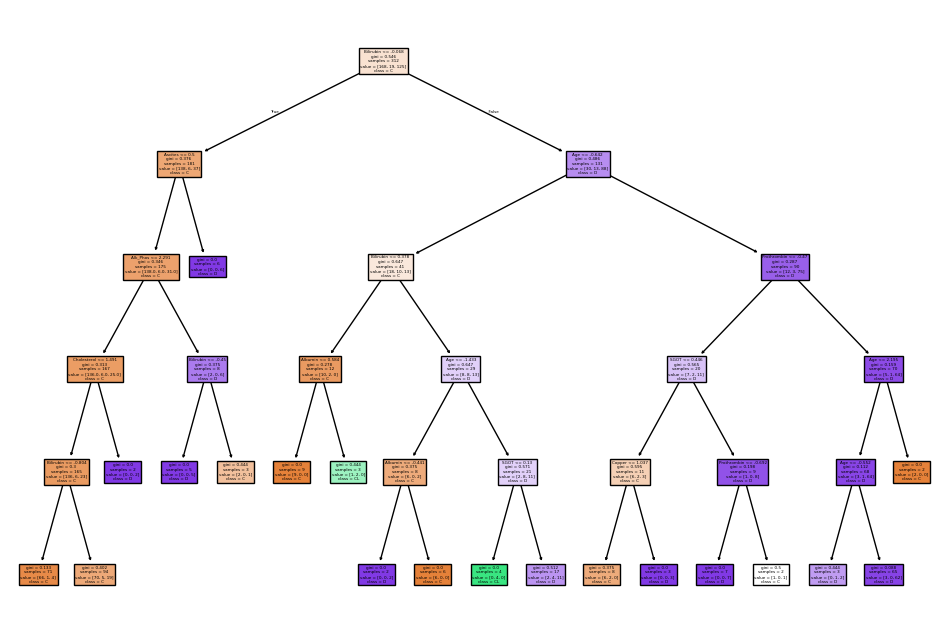

Confusion Matrix for Fold 9 (Trial Group):


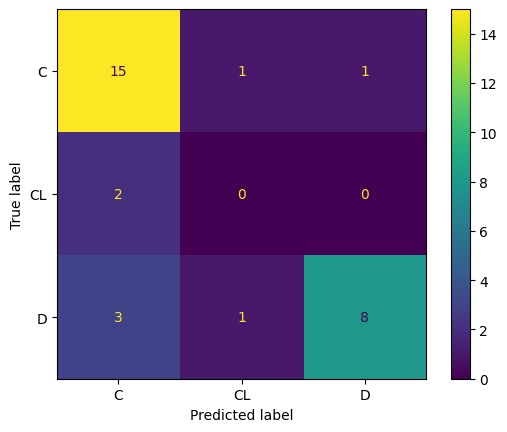

Confusion Matrix (Percentage) for Fold 9 (Trial Group):
[[ 88.23529412   5.88235294   5.88235294]
 [100.           0.           0.        ]
 [ 25.           8.33333333  66.66666667]]
--------------------------------------------------
Decision Tree for Fold 10 (Trial Group):


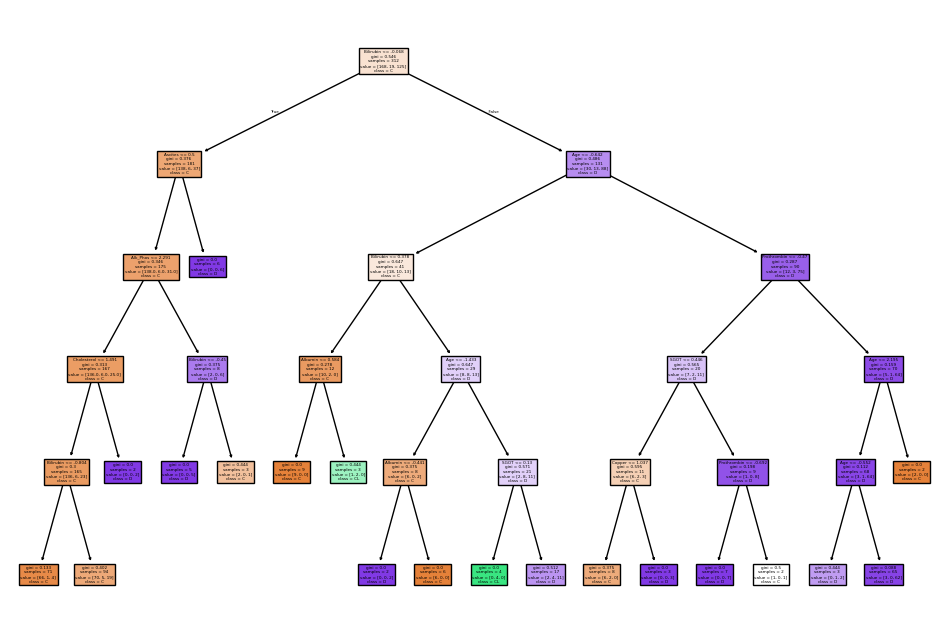

Confusion Matrix for Fold 10 (Trial Group):


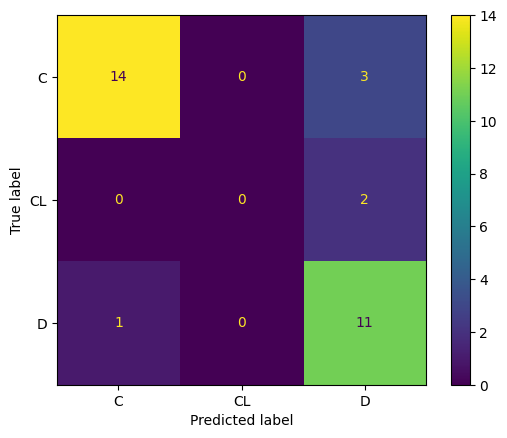

Confusion Matrix (Percentage) for Fold 10 (Trial Group):
[[ 82.35294118   0.          17.64705882]
 [  0.           0.         100.        ]
 [  8.33333333   0.          91.66666667]]
--------------------------------------------------
Results for Trial Group:
Mean accuracy: 0.7050403225806452
Standard deviation of accuracy: 0.06447705469953109
Mean cost: 72.5
Standard deviation of cost: 18.5377992221299
Mean cost per instance: 2.338709677419355
Standard deviation of cost per instance: 0.5979935232945129
--------------------------------------------------
Using 6 folds for Non-Trial
Best parameters for DecisionTreeClassifier: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2}
Decision Tree for Fold 1 (Non-Trial Group):


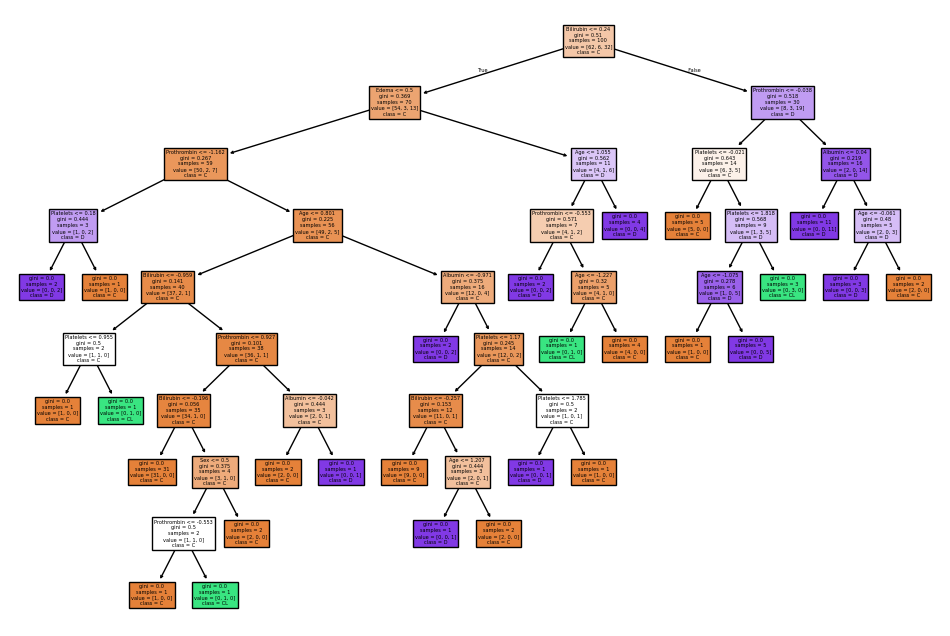

Confusion Matrix for Fold 1 (Non-Trial Group):


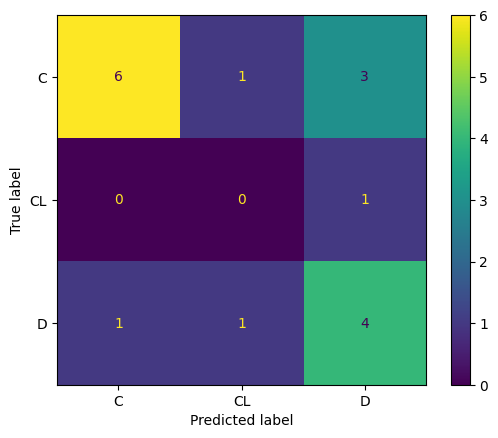

Confusion Matrix (Percentage) for Fold 1 (Non-Trial Group):
[[ 60.          10.          30.        ]
 [  0.           0.         100.        ]
 [ 16.66666667  16.66666667  66.66666667]]
--------------------------------------------------
Decision Tree for Fold 2 (Non-Trial Group):


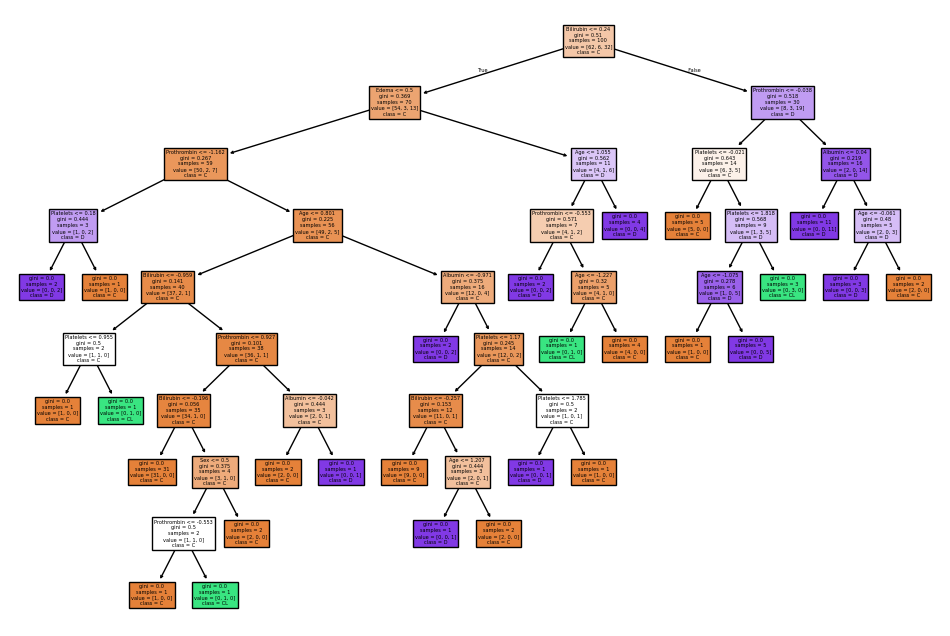

Confusion Matrix for Fold 2 (Non-Trial Group):


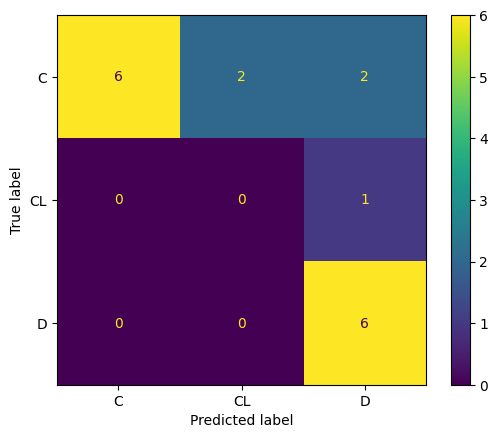

Confusion Matrix (Percentage) for Fold 2 (Non-Trial Group):
[[ 60.  20.  20.]
 [  0.   0. 100.]
 [  0.   0. 100.]]
--------------------------------------------------
Decision Tree for Fold 3 (Non-Trial Group):


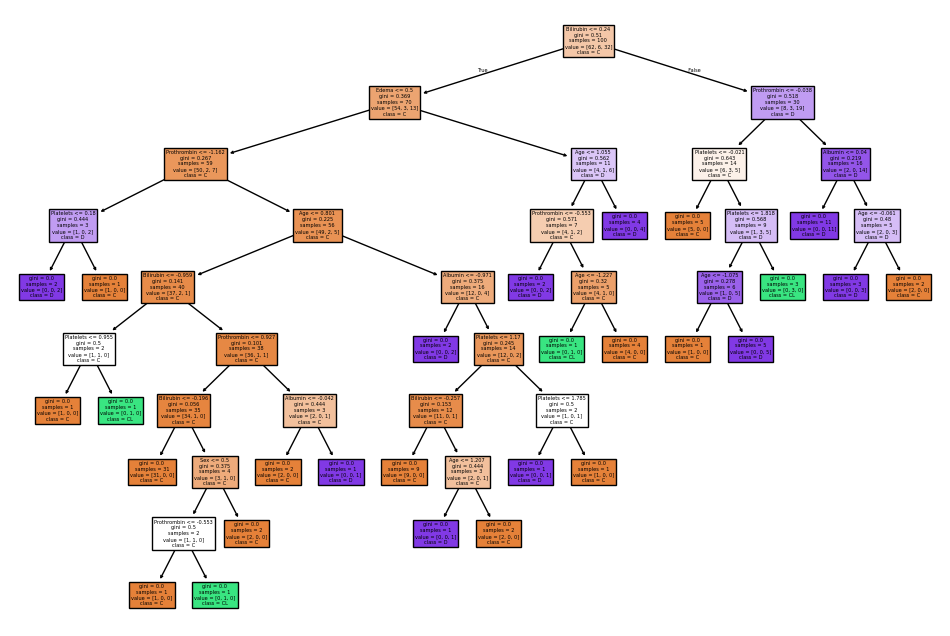

Confusion Matrix for Fold 3 (Non-Trial Group):


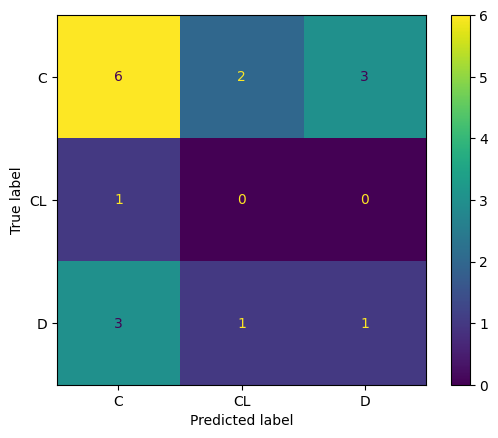

Confusion Matrix (Percentage) for Fold 3 (Non-Trial Group):
[[ 54.54545455  18.18181818  27.27272727]
 [100.           0.           0.        ]
 [ 60.          20.          20.        ]]
--------------------------------------------------
Decision Tree for Fold 4 (Non-Trial Group):


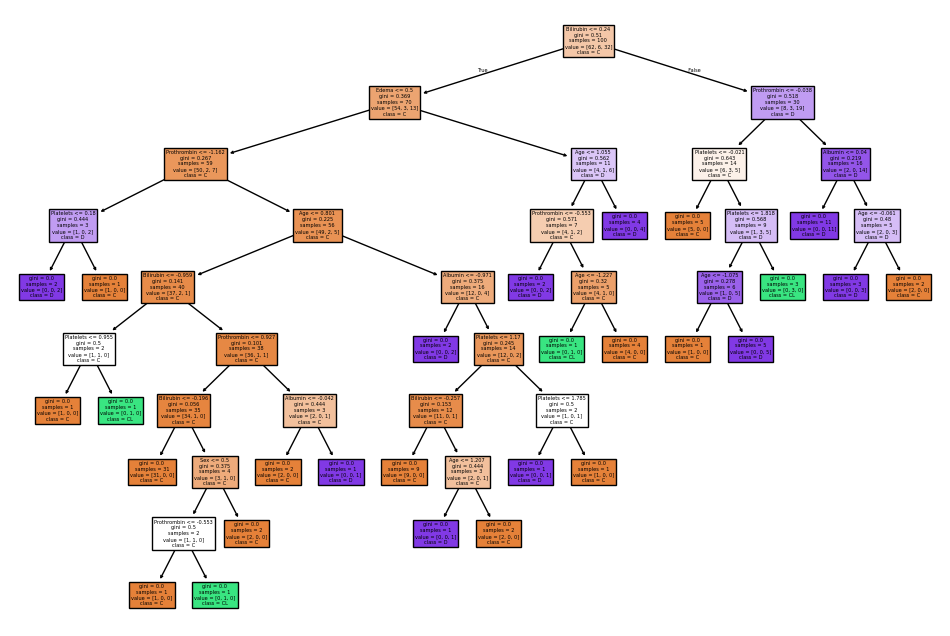

Confusion Matrix for Fold 4 (Non-Trial Group):


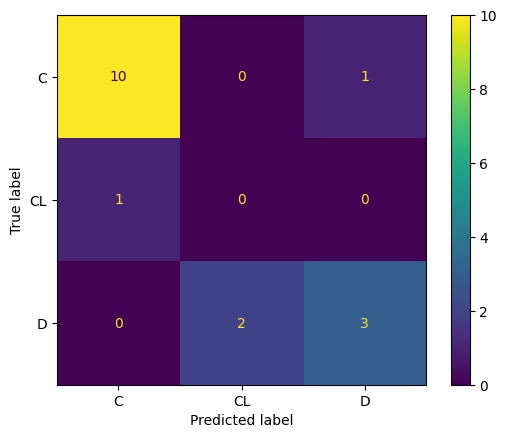

Confusion Matrix (Percentage) for Fold 4 (Non-Trial Group):
[[ 90.90909091   0.           9.09090909]
 [100.           0.           0.        ]
 [  0.          40.          60.        ]]
--------------------------------------------------
Decision Tree for Fold 5 (Non-Trial Group):


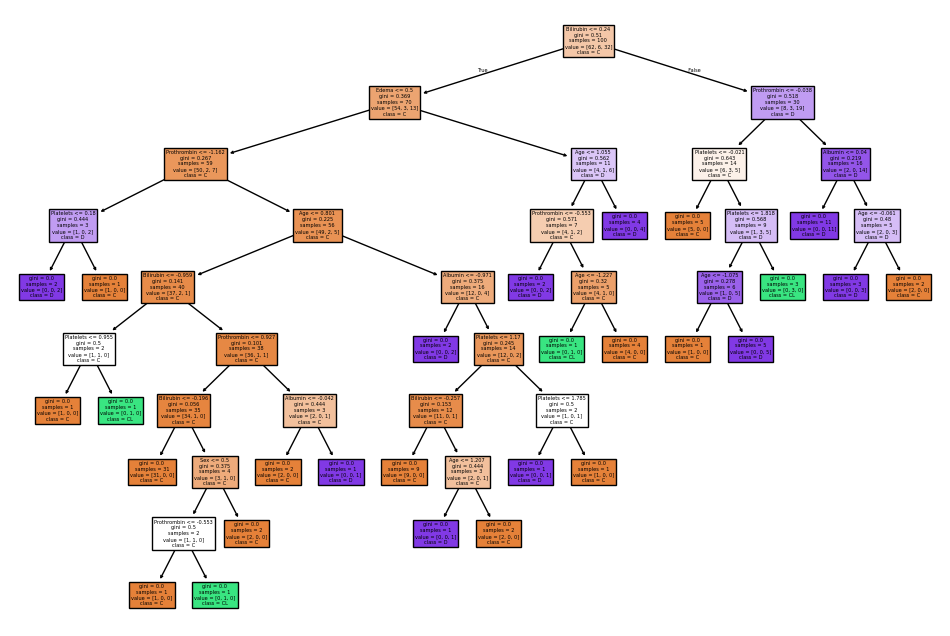

Confusion Matrix for Fold 5 (Non-Trial Group):


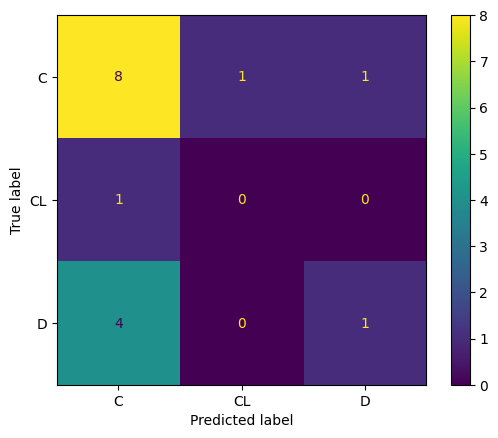

Confusion Matrix (Percentage) for Fold 5 (Non-Trial Group):
[[ 80.  10.  10.]
 [100.   0.   0.]
 [ 80.   0.  20.]]
--------------------------------------------------
Decision Tree for Fold 6 (Non-Trial Group):


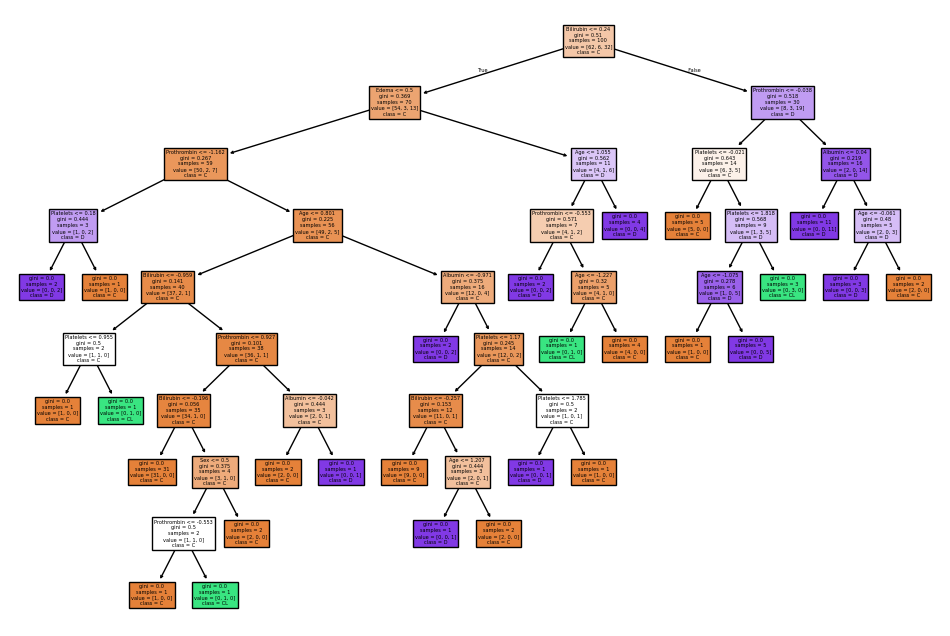

Confusion Matrix for Fold 6 (Non-Trial Group):


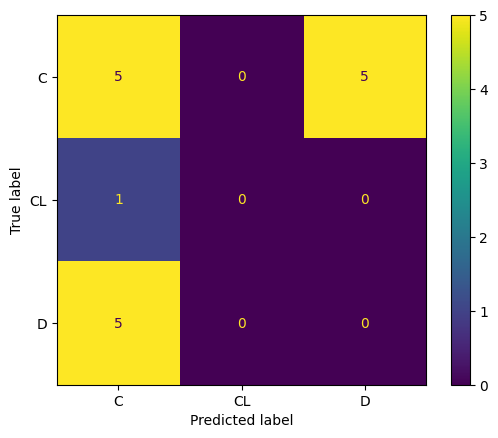

Confusion Matrix (Percentage) for Fold 6 (Non-Trial Group):
[[ 50.   0.  50.]
 [100.   0.   0.]
 [100.   0.   0.]]
--------------------------------------------------
Results for Non-Trial Group:
Mean accuracy: 0.5575980392156863
Standard deviation of accuracy: 0.1566232086526713
Mean cost: 57.833333333333336
Standard deviation of cost: 18.451889394374284
Mean cost per instance: 3.6145833333333335
Standard deviation of cost per instance: 1.1532430871483927
--------------------------------------------------


In [35]:
#Cost-based training

def tree_cost(data, group_name, cost_matrix):
    target_column = 'Status'
    y = data[target_column]
    X = data.drop(columns=[target_column])

    for col in X.select_dtypes(include=['object']).columns:
        X[col] = LabelEncoder().fit_transform(X[col])
    y_encoder = LabelEncoder()
    y = y_encoder.fit_transform(y)

    class_counts = np.bincount(y)
    min_samples_per_class = np.min(class_counts)

    n_splits = min(10, min_samples_per_class)
    if n_splits < 2:
        raise ValueError(f"Not enough samples for meaningful cross-validation. Minimum class count: {min_samples_per_class}")

    print(f"Using {n_splits} folds for {group_name}")

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    param_grid = {
        'max_depth': [3, 5, 10, None],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 5]
    }
    # Perform grid search to find the best parameters based on cost minimization
    def cost_scorer(estimator, X, y):
        y_pred = estimator.predict(X)
        confusion_mat = confusion_matrix(y, y_pred, labels=np.unique(y))
        total_cost = np.sum(confusion_mat * np.transpose(cost_matrix))
        return -total_cost  # Negative cost since GridSearchCV maximizes the score

    grid_search = GridSearchCV(DecisionTreeClassifier(random_state=42), param_grid, cv=3, scoring=cost_scorer)
    grid_search.fit(X, y)


    classifier = grid_search.best_estimator_
    print(f"Best parameters for DecisionTreeClassifier: {grid_search.best_params_}")

    accuracy_scores = []
    cost_scores = []

    for fold_idx, (train_index, test_index) in enumerate(skf.split(X, y), start=1):
        X_train_fold, X_val_fold = X.iloc[train_index], X.iloc[test_index]
        y_train_fold, y_val_fold = y[train_index], y[test_index]

        train_df_fold = pd.DataFrame(data=X_train_fold)
        train_df_fold['Status'] = pd.array(y_train_fold)

        metacost_model = MetaCost(train_df_fold, classifier, cost_matrix)
        model = metacost_model.fit('Status', len(np.unique(y)))

        y_pred_fold = model.predict(X_val_fold.values)

        accuracy_fold = accuracy_score(y_val_fold, y_pred_fold)
        accuracy_scores.append(accuracy_fold)

        confusion_mat = confusion_matrix(y_val_fold, y_pred_fold, labels=np.unique(y))
        cost = np.sum(confusion_mat * np.transpose(cost_matrix))
        cost_scores.append(cost)

        print(f"Decision Tree for Fold {fold_idx} ({group_name} Group):")
        plt.figure(figsize=(12, 8))
        plot_tree(classifier, filled=True, feature_names=X.columns, class_names=y_encoder.classes_)
        plt.show()

        print(f"Confusion Matrix for Fold {fold_idx} ({group_name} Group):")
        disp = ConfusionMatrixDisplay(confusion_matrix=confusion_mat, display_labels=y_encoder.classes_)
        disp.plot()
        plt.show()

        confusion_mat_percent = confusion_mat / confusion_mat.sum(axis=1, keepdims=True) * 100
        print(f"Confusion Matrix (Percentage) for Fold {fold_idx} ({group_name} Group):")
        print(confusion_mat_percent)
        print("--------------------------------------------------")

    divisor = len(y_val_fold)
    cost_scores_per_instance = [x / divisor for x in cost_scores]

    print(f"Results for {group_name} Group:")
    print("Mean accuracy:", np.mean(accuracy_scores))
    print("Standard deviation of accuracy:", np.std(accuracy_scores))
    print("Mean cost:", np.mean(cost_scores))
    print("Standard deviation of cost:", np.std(cost_scores))
    print("Mean cost per instance:", np.mean(cost_scores_per_instance))
    print("Standard deviation of cost per instance:", np.std(cost_scores_per_instance))
    print("--------------------------------------------------")

cost_matrix = np.array(
  [[ 0,  8, 10],  # Predicted Censored
  [ 5,  0, 15],  # Predicted Transplant
  [ 5, 10,  0]]  # Predicted Death
                       )

tree_cost(trial_group, "Trial", cost_matrix)
tree_cost(non_trial_group, "Non-Trial", cost_matrix)




## Naive Bayes

Using 10 folds for Trial
Confusion Matrix for Fold 1 (Trial Group):


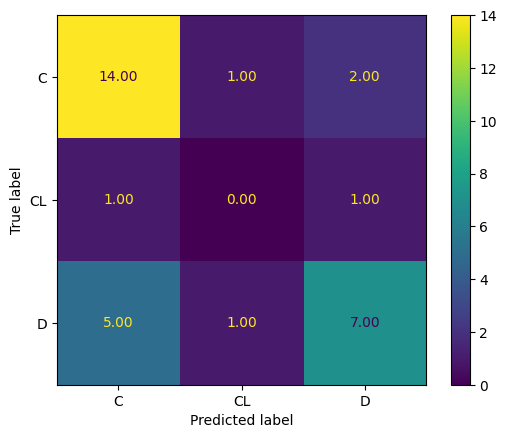

Confusion Matrix (Percentage) for Fold 1 (Trial Group):
[[82.35294118  5.88235294 11.76470588]
 [50.          0.         50.        ]
 [38.46153846  7.69230769 53.84615385]]
--------------------------------------------------
Confusion Matrix for Fold 2 (Trial Group):


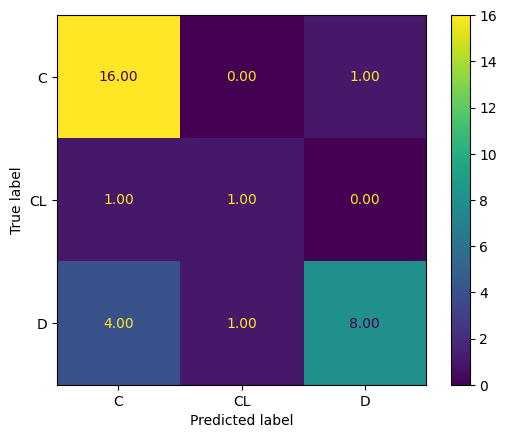

Confusion Matrix (Percentage) for Fold 2 (Trial Group):
[[94.11764706  0.          5.88235294]
 [50.         50.          0.        ]
 [30.76923077  7.69230769 61.53846154]]
--------------------------------------------------
Confusion Matrix for Fold 3 (Trial Group):


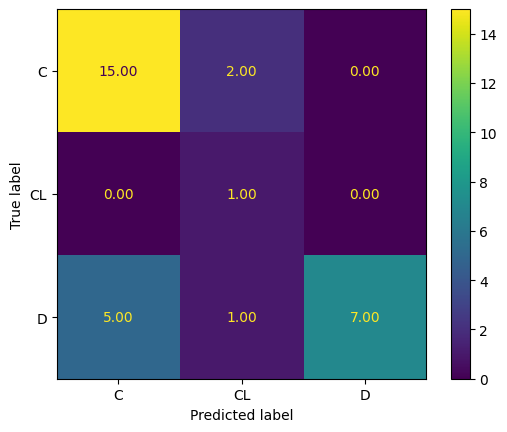

Confusion Matrix (Percentage) for Fold 3 (Trial Group):
[[ 88.23529412  11.76470588   0.        ]
 [  0.         100.           0.        ]
 [ 38.46153846   7.69230769  53.84615385]]
--------------------------------------------------
Confusion Matrix for Fold 4 (Trial Group):


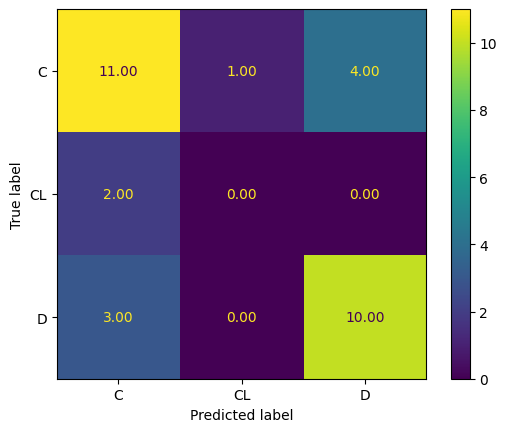

Confusion Matrix (Percentage) for Fold 4 (Trial Group):
[[ 68.75         6.25        25.        ]
 [100.           0.           0.        ]
 [ 23.07692308   0.          76.92307692]]
--------------------------------------------------
Confusion Matrix for Fold 5 (Trial Group):


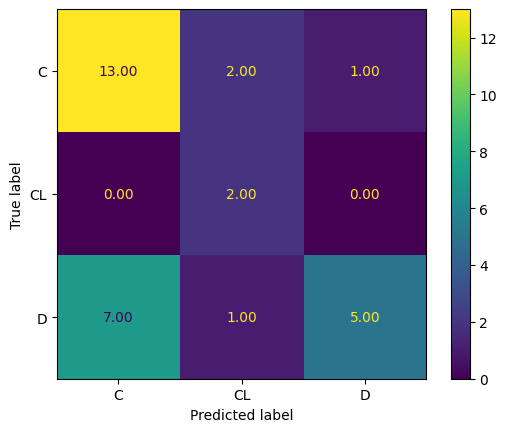

Confusion Matrix (Percentage) for Fold 5 (Trial Group):
[[ 81.25        12.5          6.25      ]
 [  0.         100.           0.        ]
 [ 53.84615385   7.69230769  38.46153846]]
--------------------------------------------------
Confusion Matrix for Fold 6 (Trial Group):


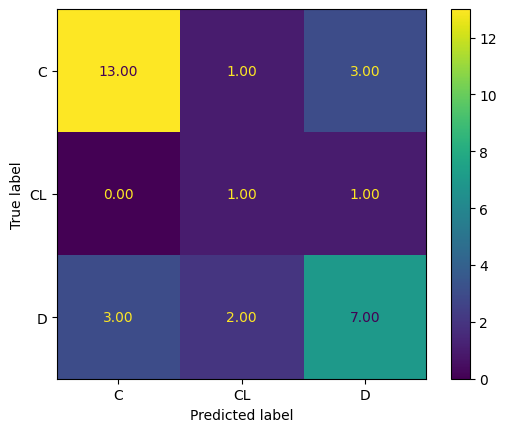

Confusion Matrix (Percentage) for Fold 6 (Trial Group):
[[76.47058824  5.88235294 17.64705882]
 [ 0.         50.         50.        ]
 [25.         16.66666667 58.33333333]]
--------------------------------------------------
Confusion Matrix for Fold 7 (Trial Group):


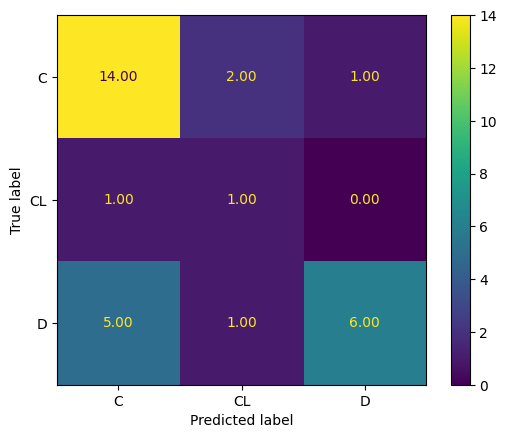

Confusion Matrix (Percentage) for Fold 7 (Trial Group):
[[82.35294118 11.76470588  5.88235294]
 [50.         50.          0.        ]
 [41.66666667  8.33333333 50.        ]]
--------------------------------------------------
Confusion Matrix for Fold 8 (Trial Group):


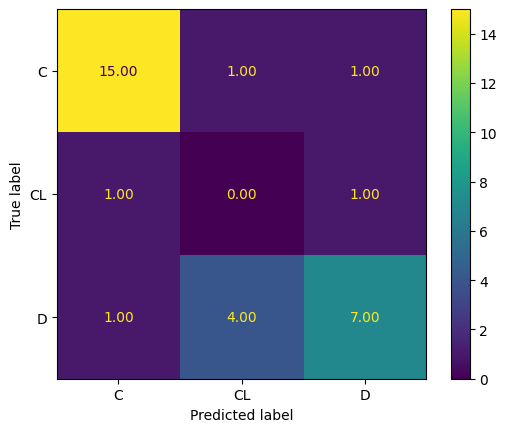

Confusion Matrix (Percentage) for Fold 8 (Trial Group):
[[88.23529412  5.88235294  5.88235294]
 [50.          0.         50.        ]
 [ 8.33333333 33.33333333 58.33333333]]
--------------------------------------------------
Confusion Matrix for Fold 9 (Trial Group):


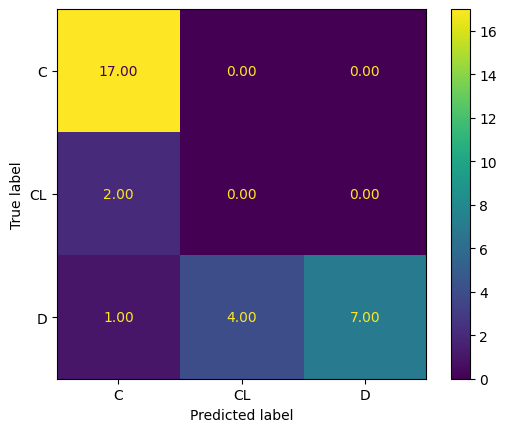

Confusion Matrix (Percentage) for Fold 9 (Trial Group):
[[100.           0.           0.        ]
 [100.           0.           0.        ]
 [  8.33333333  33.33333333  58.33333333]]
--------------------------------------------------
Confusion Matrix for Fold 10 (Trial Group):


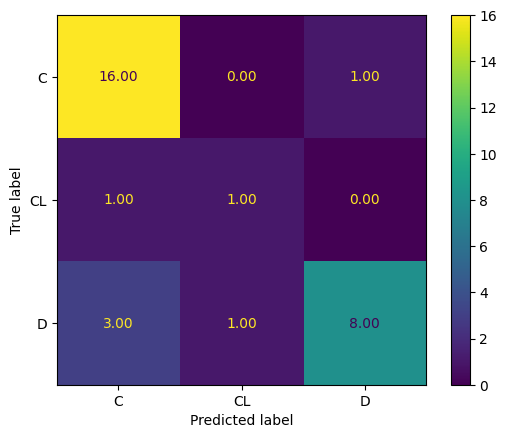

Confusion Matrix (Percentage) for Fold 10 (Trial Group):
[[94.11764706  0.          5.88235294]
 [50.         50.          0.        ]
 [25.          8.33333333 66.66666667]]
--------------------------------------------------
Results for Trial Group:
Mean accuracy: 0.7147177419354839
Standard deviation of accuracy: 0.0543831887395525
Mean cost: 83.2
Standard deviation of cost: 13.709850473291093
Mean cost per instance: 2.6838709677419357
Standard deviation of cost per instance: 0.44225324107390623
--------------------------------------------------
Using 6 folds for Non-Trial
Confusion Matrix for Fold 1 (Non-Trial Group):


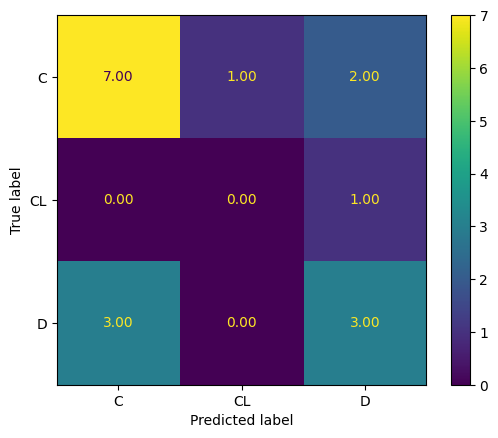

Confusion Matrix (Percentage) for Fold 1 (Non-Trial Group):
[[ 70.  10.  20.]
 [  0.   0. 100.]
 [ 50.   0.  50.]]
--------------------------------------------------
Confusion Matrix for Fold 2 (Non-Trial Group):


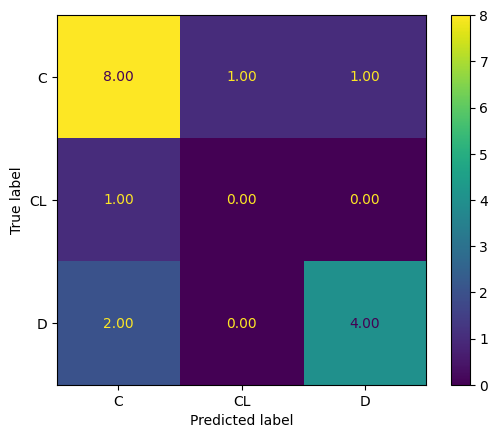

Confusion Matrix (Percentage) for Fold 2 (Non-Trial Group):
[[ 80.          10.          10.        ]
 [100.           0.           0.        ]
 [ 33.33333333   0.          66.66666667]]
--------------------------------------------------
Confusion Matrix for Fold 3 (Non-Trial Group):


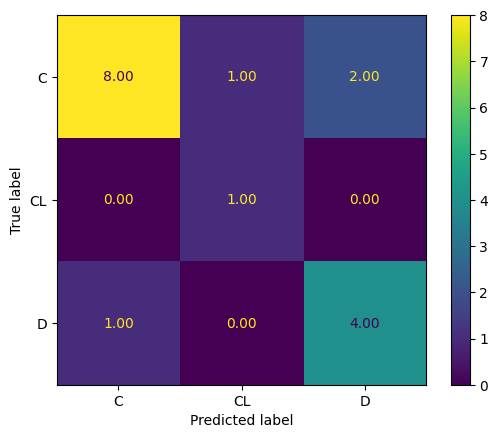

Confusion Matrix (Percentage) for Fold 3 (Non-Trial Group):
[[ 72.72727273   9.09090909  18.18181818]
 [  0.         100.           0.        ]
 [ 20.           0.          80.        ]]
--------------------------------------------------
Confusion Matrix for Fold 4 (Non-Trial Group):


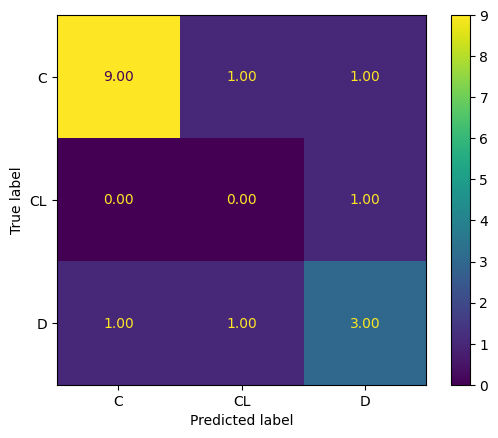

Confusion Matrix (Percentage) for Fold 4 (Non-Trial Group):
[[ 81.81818182   9.09090909   9.09090909]
 [  0.           0.         100.        ]
 [ 20.          20.          60.        ]]
--------------------------------------------------
Confusion Matrix for Fold 5 (Non-Trial Group):


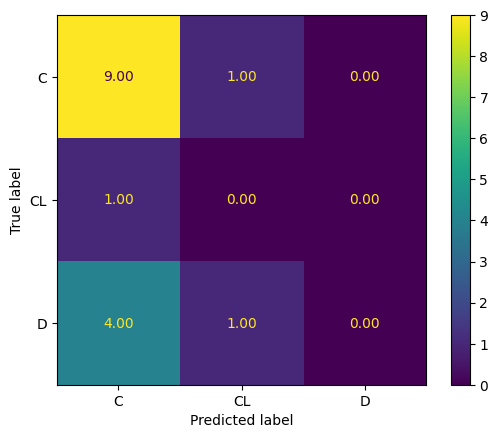

Confusion Matrix (Percentage) for Fold 5 (Non-Trial Group):
[[ 90.  10.   0.]
 [100.   0.   0.]
 [ 80.  20.   0.]]
--------------------------------------------------
Confusion Matrix for Fold 6 (Non-Trial Group):


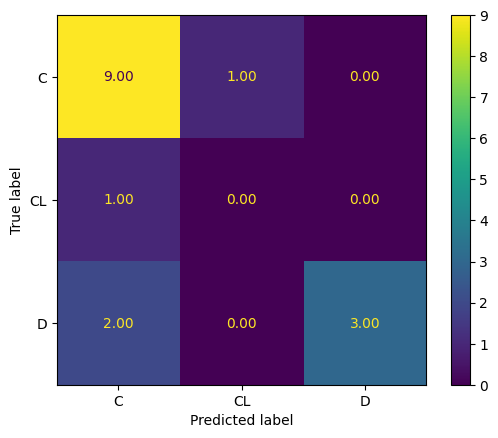

Confusion Matrix (Percentage) for Fold 6 (Non-Trial Group):
[[ 90.  10.   0.]
 [100.   0.   0.]
 [ 40.   0.  60.]]
--------------------------------------------------
Results for Non-Trial Group:
Mean accuracy: 0.6795343137254902
Standard deviation of accuracy: 0.07707203227735586
Mean cost: 44.0
Standard deviation of cost: 14.236104336041748
Mean cost per instance: 2.75
Standard deviation of cost per instance: 0.8897565210026093
--------------------------------------------------


In [27]:
#Accuracy-based training

def naive_accuracy(data, group_name, cost_matrix):
    target_column = 'Status'

    # Separate target and features
    y = data[target_column]
    X = data.drop(columns=[target_column])

    # Identify nominal for encoding
    nominal_features = ['Drug', 'Sex', 'Ascites', 'Hepatomegaly', 'Spiders', 'Edema']

    # Encode nominal features using LabelEncoder
    for col in nominal_features:
        if col in X.columns:
            X[col] = LabelEncoder().fit_transform(X[col])

    # Ensure the target variable is encoded
    y_encoder = LabelEncoder()
    y = y_encoder.fit_transform(y)

    # Ensure the dataset has enough samples per class
    class_counts = np.bincount(y)
    min_samples_per_class = np.min(class_counts)

    # Adjust number of folds dynamically
    n_splits = min(10, min_samples_per_class)
    if n_splits < 2:
        raise ValueError(f"Not enough samples for meaningful cross-validation. Minimum class count: {min_samples_per_class}")

    print(f"Using {n_splits} folds for {group_name}")

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    # Initialize lists to store accuracy and cost scores
    accuracy_scores = []
    cost_scores = []

        # Define the parameter grid for GaussianNB
    param_grid = {
        'var_smoothing': np.logspace(-9, -2, 10)  # Hyperparameter for smoothing
    }

    # Cross-validation loop
    for fold_idx, (train_index, test_index) in enumerate(skf.split(X, y), start=1):
        # Split the data into training and validation sets
        X_train_fold, X_val_fold = X.iloc[train_index], X.iloc[test_index]
        y_train_fold, y_val_fold = y[train_index], y[test_index]

        # Use GridSearchCV to find the best hyperparameters for GaussianNB
        gnb = GaussianNB()
        grid_search = GridSearchCV(estimator=gnb, param_grid=param_grid, scoring='accuracy', cv=5)
        grid_search.fit(X_train_fold, y_train_fold)

        # Train the best model from GridSearch
        best_model = grid_search.best_estimator_
        y_pred_fold = best_model.predict(X_val_fold)

        # Calculate accuracy for this fold
        accuracy_fold = accuracy_score(y_val_fold, y_pred_fold)
        accuracy_scores.append(accuracy_fold)

        # Calculate cost for this fold
        confusion_mat = confusion_matrix(y_val_fold, y_pred_fold, labels=np.unique(y))
        cost = np.sum(confusion_mat * np.transpose(cost_matrix))
        cost_scores.append(cost)

        # Plot confusion matrix
        print(f"Confusion Matrix for Fold {fold_idx} ({group_name} Group):")
        disp = ConfusionMatrixDisplay(confusion_matrix=confusion_mat, display_labels=y_encoder.classes_)
        disp.plot(values_format=".2f")
        plt.show()

        # Print confusion matrix in percentage
        confusion_mat_percent = confusion_mat / confusion_mat.sum(axis=1, keepdims=True) * 100
        print(f"Confusion Matrix (Percentage) for Fold {fold_idx} ({group_name} Group):")
        print(confusion_mat_percent)
        print("--------------------------------------------------")

    # Calculate metrics across all folds
    divisor = len(y_val_fold)
    cost_scores_per_instance = [x / divisor for x in cost_scores]

    print(f"Results for {group_name} Group:")
    print("Mean accuracy:", np.mean(accuracy_scores))
    print("Standard deviation of accuracy:", np.std(accuracy_scores))
    print("Mean cost:", np.mean(cost_scores))
    print("Standard deviation of cost:", np.std(cost_scores))
    print("Mean cost per instance:", np.mean(cost_scores_per_instance))
    print("Standard deviation of cost per instance:", np.std(cost_scores_per_instance))
    print("--------------------------------------------------")

cost_matrix = np.array(
  [[ 0,  8, 10],  # Predicted Censored
  [ 5,  0, 15],  # Predicted Transplant
  [ 5, 10,  0]]  # Predicted Death
                       )

# Train and evaluate on both groups
naive_accuracy(trial_group, "Trial", cost_matrix)
naive_accuracy(non_trial_group, "Non-Trial", cost_matrix)


Using 10 folds for Trial
Best parameters for GaussianNB: {'var_smoothing': 0.01}
Confusion Matrix for Fold 1 (Trial Group):


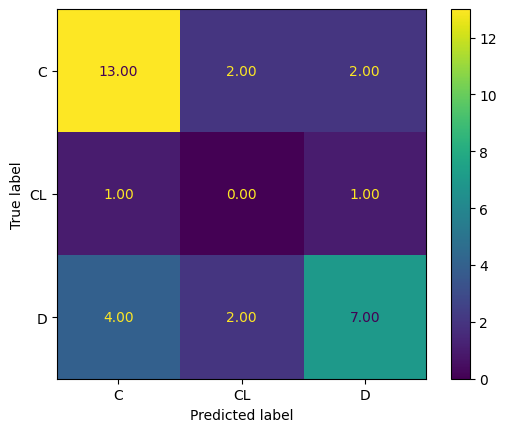

Confusion Matrix (Percentage) for Fold 1 (Trial Group):
[[76.47058824 11.76470588 11.76470588]
 [50.          0.         50.        ]
 [30.76923077 15.38461538 53.84615385]]
--------------------------------------------------
Confusion Matrix for Fold 2 (Trial Group):


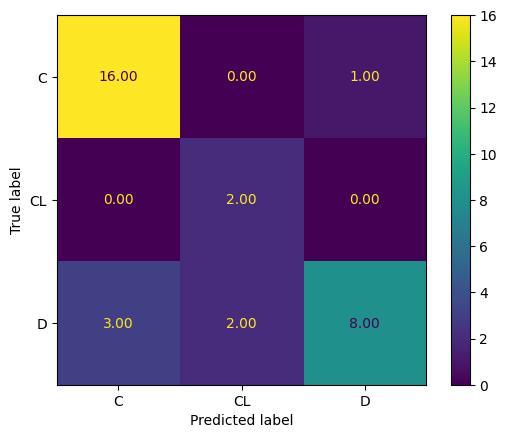

Confusion Matrix (Percentage) for Fold 2 (Trial Group):
[[ 94.11764706   0.           5.88235294]
 [  0.         100.           0.        ]
 [ 23.07692308  15.38461538  61.53846154]]
--------------------------------------------------
Confusion Matrix for Fold 3 (Trial Group):


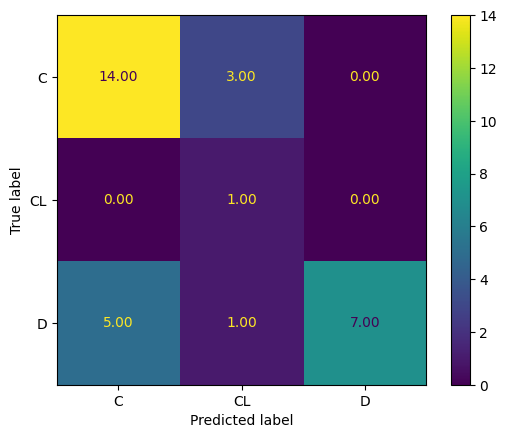

Confusion Matrix (Percentage) for Fold 3 (Trial Group):
[[ 82.35294118  17.64705882   0.        ]
 [  0.         100.           0.        ]
 [ 38.46153846   7.69230769  53.84615385]]
--------------------------------------------------
Confusion Matrix for Fold 4 (Trial Group):


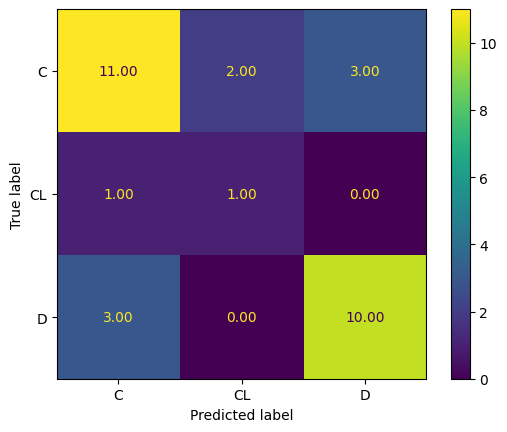

Confusion Matrix (Percentage) for Fold 4 (Trial Group):
[[68.75       12.5        18.75      ]
 [50.         50.          0.        ]
 [23.07692308  0.         76.92307692]]
--------------------------------------------------
Confusion Matrix for Fold 5 (Trial Group):


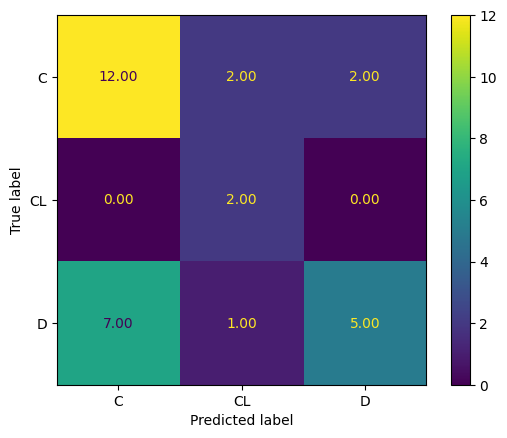

Confusion Matrix (Percentage) for Fold 5 (Trial Group):
[[ 75.          12.5         12.5       ]
 [  0.         100.           0.        ]
 [ 53.84615385   7.69230769  38.46153846]]
--------------------------------------------------
Confusion Matrix for Fold 6 (Trial Group):


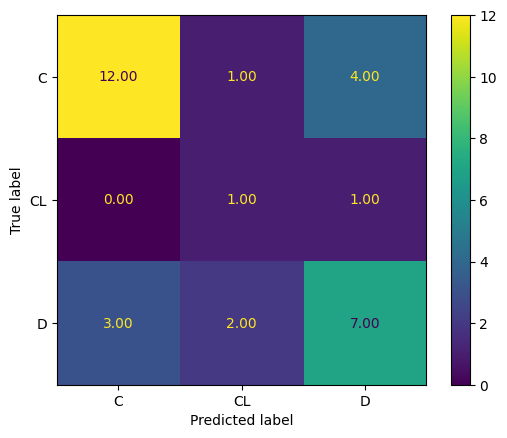

Confusion Matrix (Percentage) for Fold 6 (Trial Group):
[[70.58823529  5.88235294 23.52941176]
 [ 0.         50.         50.        ]
 [25.         16.66666667 58.33333333]]
--------------------------------------------------
Confusion Matrix for Fold 7 (Trial Group):


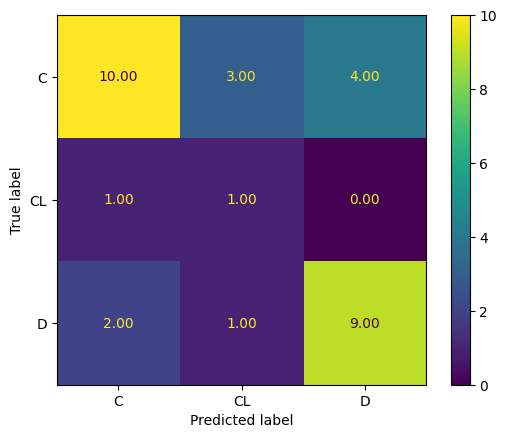

Confusion Matrix (Percentage) for Fold 7 (Trial Group):
[[58.82352941 17.64705882 23.52941176]
 [50.         50.          0.        ]
 [16.66666667  8.33333333 75.        ]]
--------------------------------------------------
Confusion Matrix for Fold 8 (Trial Group):


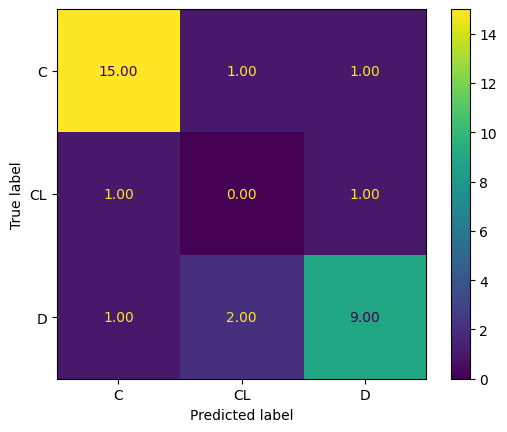

Confusion Matrix (Percentage) for Fold 8 (Trial Group):
[[88.23529412  5.88235294  5.88235294]
 [50.          0.         50.        ]
 [ 8.33333333 16.66666667 75.        ]]
--------------------------------------------------
Confusion Matrix for Fold 9 (Trial Group):


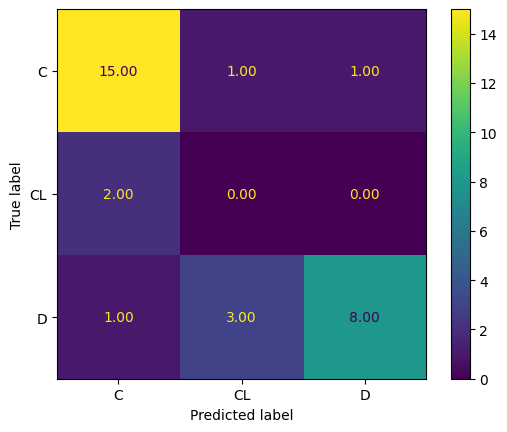

Confusion Matrix (Percentage) for Fold 9 (Trial Group):
[[ 88.23529412   5.88235294   5.88235294]
 [100.           0.           0.        ]
 [  8.33333333  25.          66.66666667]]
--------------------------------------------------
Confusion Matrix for Fold 10 (Trial Group):


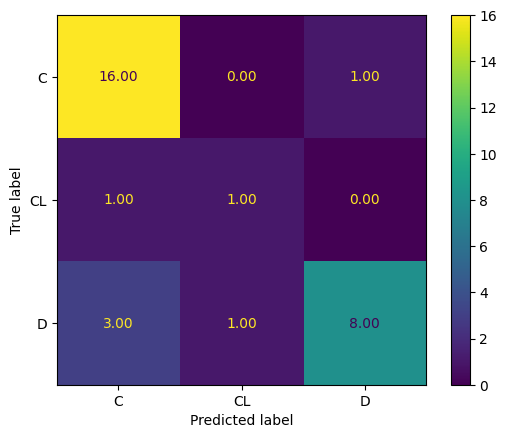

Confusion Matrix (Percentage) for Fold 10 (Trial Group):
[[94.11764706  0.          5.88235294]
 [50.         50.          0.        ]
 [25.          8.33333333 66.66666667]]
--------------------------------------------------
Results for Trial Group:
Mean accuracy: 0.7082661290322582
Standard deviation of accuracy: 0.07069716794293024
Mean cost: 80.1
Standard deviation of cost: 16.676030702778167
Mean cost per instance: 2.583870967741935
Standard deviation of cost per instance: 0.5379364742831666
--------------------------------------------------
Using 6 folds for Non-Trial
Best parameters for GaussianNB: {'var_smoothing': 0.01}
Confusion Matrix for Fold 1 (Non-Trial Group):


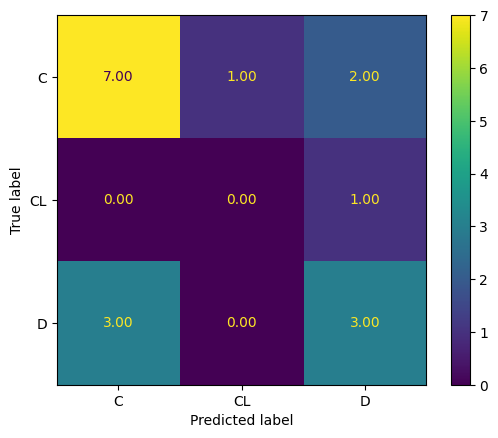

Confusion Matrix (Percentage) for Fold 1 (Non-Trial Group):
[[ 70.  10.  20.]
 [  0.   0. 100.]
 [ 50.   0.  50.]]
--------------------------------------------------
Confusion Matrix for Fold 2 (Non-Trial Group):


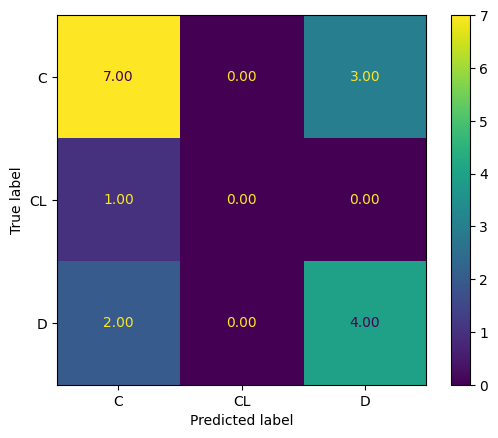

Confusion Matrix (Percentage) for Fold 2 (Non-Trial Group):
[[ 70.           0.          30.        ]
 [100.           0.           0.        ]
 [ 33.33333333   0.          66.66666667]]
--------------------------------------------------
Confusion Matrix for Fold 3 (Non-Trial Group):


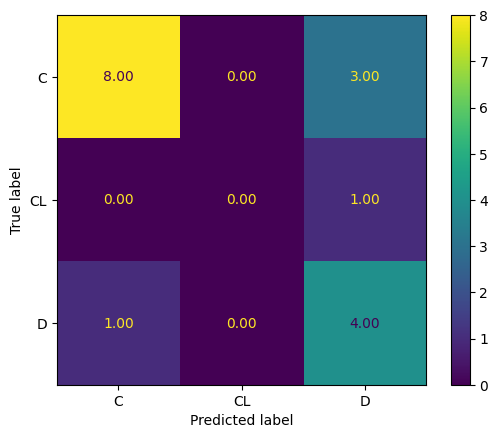

Confusion Matrix (Percentage) for Fold 3 (Non-Trial Group):
[[ 72.72727273   0.          27.27272727]
 [  0.           0.         100.        ]
 [ 20.           0.          80.        ]]
--------------------------------------------------
Confusion Matrix for Fold 4 (Non-Trial Group):


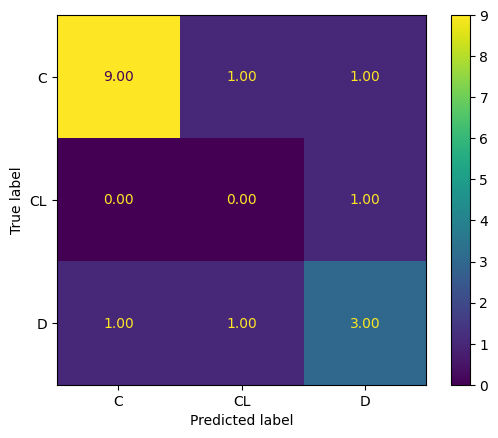

Confusion Matrix (Percentage) for Fold 4 (Non-Trial Group):
[[ 81.81818182   9.09090909   9.09090909]
 [  0.           0.         100.        ]
 [ 20.          20.          60.        ]]
--------------------------------------------------
Confusion Matrix for Fold 5 (Non-Trial Group):


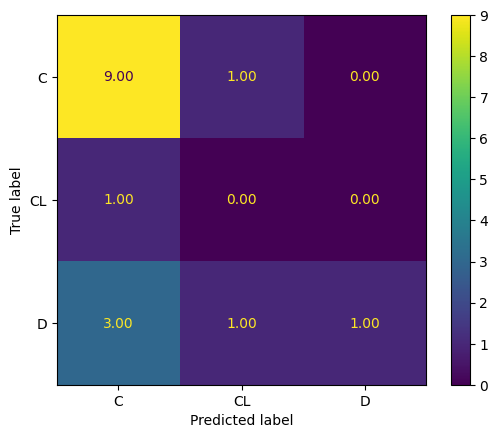

Confusion Matrix (Percentage) for Fold 5 (Non-Trial Group):
[[ 90.  10.   0.]
 [100.   0.   0.]
 [ 60.  20.  20.]]
--------------------------------------------------
Confusion Matrix for Fold 6 (Non-Trial Group):


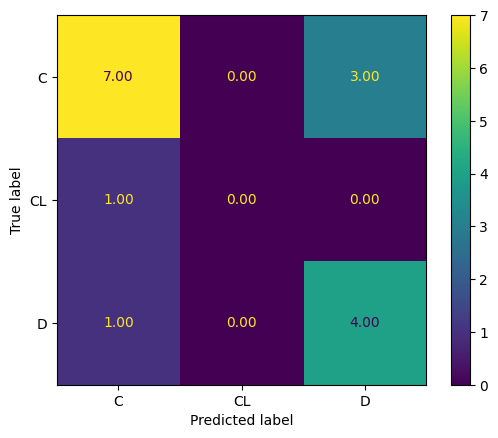

Confusion Matrix (Percentage) for Fold 6 (Non-Trial Group):
[[ 70.   0.  30.]
 [100.   0.   0.]
 [ 20.   0.  80.]]
--------------------------------------------------
Results for Non-Trial Group:
Mean accuracy: 0.6599264705882354
Standard deviation of accuracy: 0.04379734627085401
Mean cost: 44.833333333333336
Standard deviation of cost: 9.281103861550568
Mean cost per instance: 2.8020833333333335
Standard deviation of cost per instance: 0.5800689913469105
--------------------------------------------------


In [36]:
# Cost-based training

def naive_cost(data, group_name, cost_matrix):
    target_column = 'Status'
    y = data[target_column]
    X = data.drop(columns=[target_column])

    # Encode categorical features
    for col in X.select_dtypes(include=['object']).columns:
        X[col] = LabelEncoder().fit_transform(X[col])
    y_encoder = LabelEncoder()
    y = y_encoder.fit_transform(y)

    # Ensure enough samples per class
    class_counts = np.bincount(y)
    min_samples_per_class = np.min(class_counts)
    n_splits = min(10, min_samples_per_class)
    if n_splits < 2:
        raise ValueError(f"Not enough samples for meaningful cross-validation. Minimum class count: {min_samples_per_class}")

    print(f"Using {n_splits} folds for {group_name}")

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    # Hyperparameter tuning for GaussianNB
    param_grid = {
        'var_smoothing': np.logspace(-9, -2, 10)  # Smoothness parameter for GaussianNB
    }

    # Custom cost-based scorer
    def cost_scorer(estimator, X, y):
        y_pred = estimator.predict(X)
        confusion_mat = confusion_matrix(y, y_pred, labels=np.unique(y))
        total_cost = np.sum(confusion_mat * np.transpose(cost_matrix))
        return -total_cost  # Negative cost for maximization in GridSearchCV

    # Perform grid search
    grid_search = GridSearchCV(GaussianNB(), param_grid, cv=3, scoring=cost_scorer)
    grid_search.fit(X, y)

    # Best GaussianNB model
    classifier = grid_search.best_estimator_
    print(f"Best parameters for GaussianNB: {grid_search.best_params_}")

    accuracy_scores = []
    cost_scores = []

    # Stratified cross-validation
    for fold_idx, (train_index, test_index) in enumerate(skf.split(X, y), start=1):
        X_train_fold, X_val_fold = X.iloc[train_index], X.iloc[test_index]
        y_train_fold, y_val_fold = y[train_index], y[test_index]

        # Train the MetaCost model
        train_df_fold = pd.DataFrame(data=X_train_fold)
        train_df_fold['Status'] = pd.array(y_train_fold)

        metacost_model = MetaCost(train_df_fold, classifier, cost_matrix)
        model = metacost_model.fit('Status', len(np.unique(y)))

        # Predict on the validation fold
        y_pred_fold = model.predict(X_val_fold.values)

        # Compute accuracy and cost
        accuracy_fold = accuracy_score(y_val_fold, y_pred_fold)
        accuracy_scores.append(accuracy_fold)

        confusion_mat = confusion_matrix(y_val_fold, y_pred_fold, labels=np.unique(y))
        cost = np.sum(confusion_mat * np.transpose(cost_matrix))
        cost_scores.append(cost)

        print(f"Confusion Matrix for Fold {fold_idx} ({group_name} Group):")
        disp = ConfusionMatrixDisplay(confusion_matrix=confusion_mat, display_labels=y_encoder.classes_)
        disp.plot(values_format=".2f")
        plt.show()

        confusion_mat_percent = confusion_mat / confusion_mat.sum(axis=1, keepdims=True) * 100
        print(f"Confusion Matrix (Percentage) for Fold {fold_idx} ({group_name} Group):")
        print(confusion_mat_percent)
        print("--------------------------------------------------")

    divisor = len(y_val_fold)
    cost_scores_per_instance = [x / divisor for x in cost_scores]

    print(f"Results for {group_name} Group:")
    print("Mean accuracy:", np.mean(accuracy_scores))
    print("Standard deviation of accuracy:", np.std(accuracy_scores))
    print("Mean cost:", np.mean(cost_scores))
    print("Standard deviation of cost:", np.std(cost_scores))
    print("Mean cost per instance:", np.mean(cost_scores_per_instance))
    print("Standard deviation of cost per instance:", np.std(cost_scores_per_instance))
    print("--------------------------------------------------")

cost_matrix = np.array(
  [[ 0,  8, 10],  # Predicted Censored
   [ 5,  0, 15],  # Predicted Transplant
   [ 5, 10,  0]]  # Predicted Death
)

# Call the function for both groups
naive_cost(trial_group, "Trial", cost_matrix)
naive_cost(non_trial_group, "Non-Trial", cost_matrix)


## Neural Networks

### 1-layer

Using 10 folds for Trial


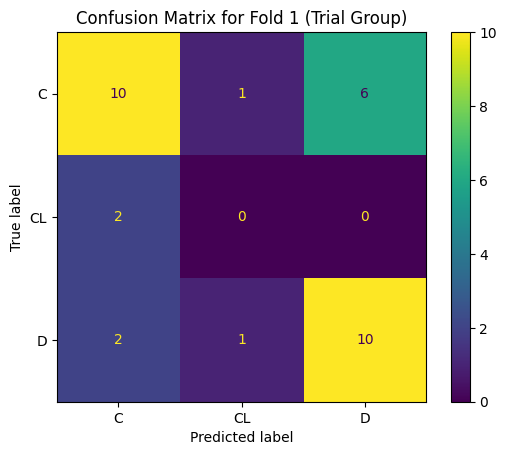

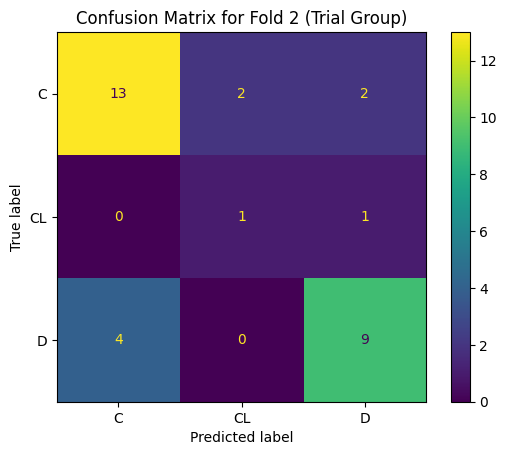

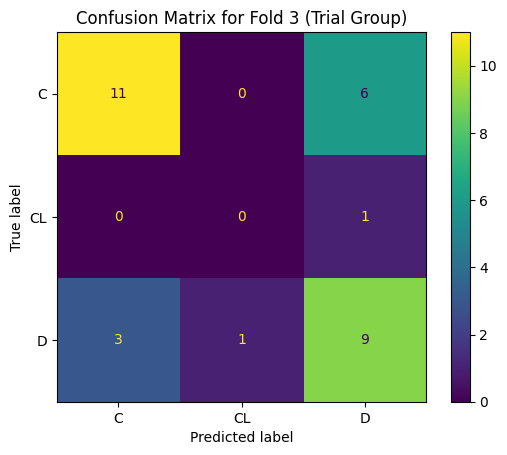

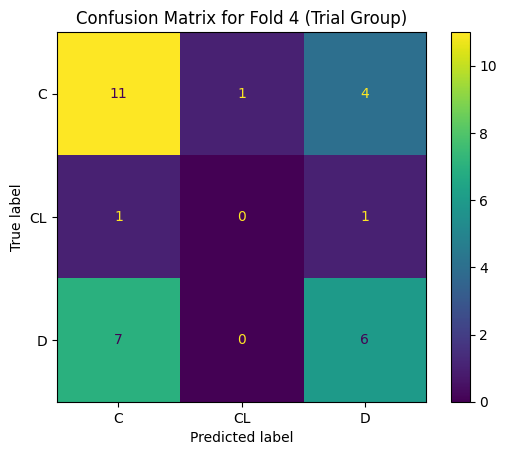

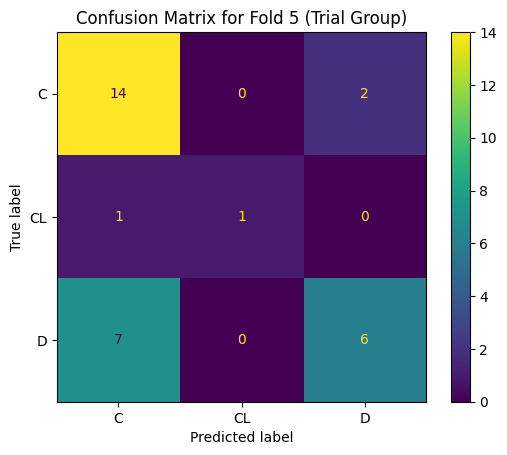

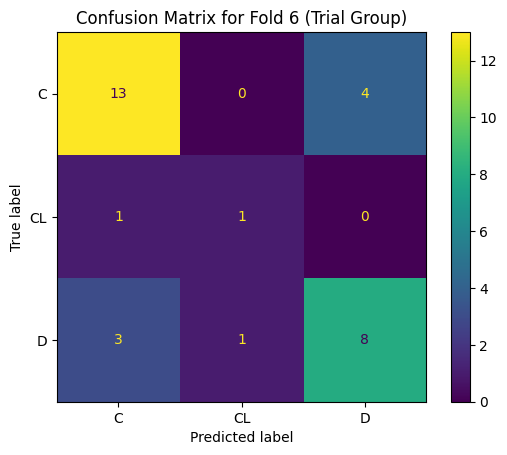

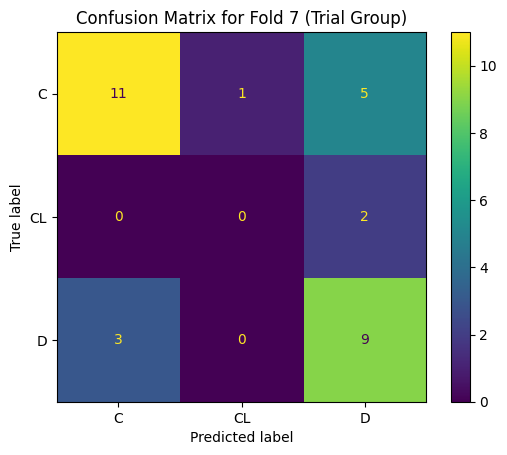

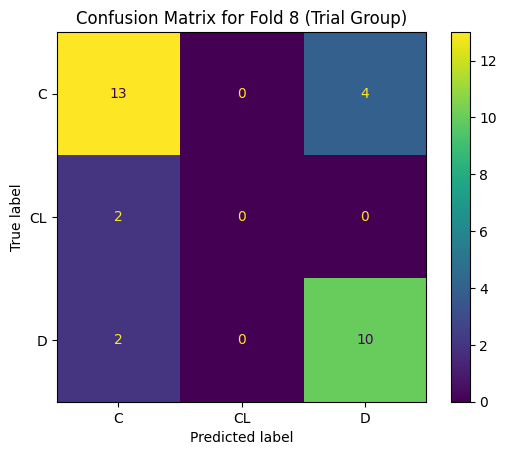

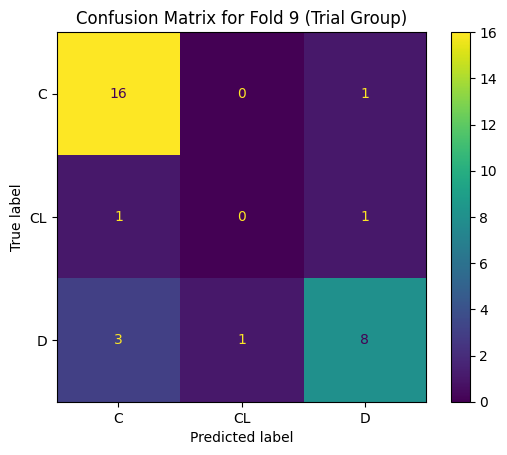

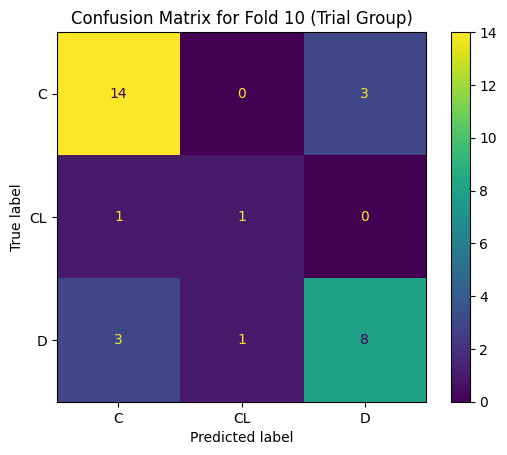

Results for Trial Group:
Mean accuracy: 0.6827620967741936
Standard deviation of accuracy: 0.06452250787517952
Mean cost: 78.7
Standard deviation of cost: 14.866405079910882
Mean cost per instance: 2.538709677419355
Standard deviation of cost per instance: 0.4795614541906735
--------------------------------------------------
Classification Report for the last fold:
              precision    recall  f1-score   support

           C       0.78      0.82      0.80        17
          CL       0.50      0.50      0.50         2
           D       0.73      0.67      0.70        12

    accuracy                           0.74        31
   macro avg       0.67      0.66      0.67        31
weighted avg       0.74      0.74      0.74        31

Using 6 folds for Non-Trial


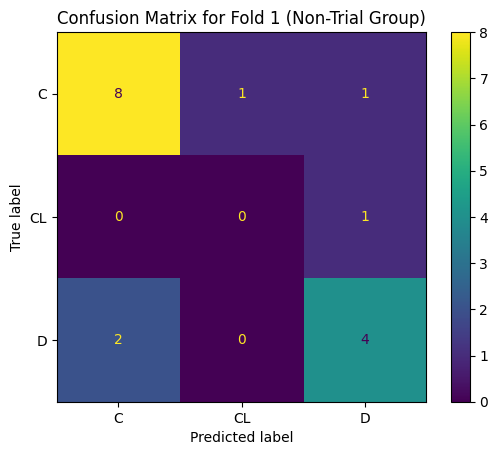

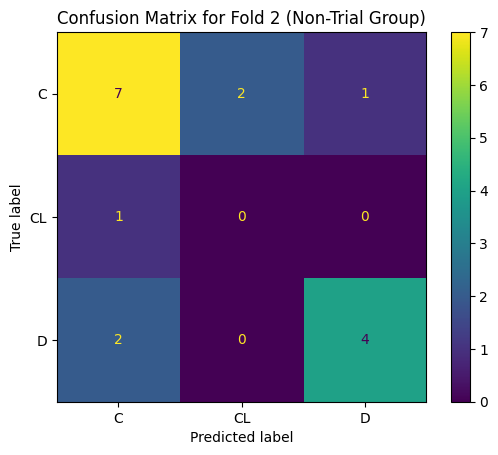

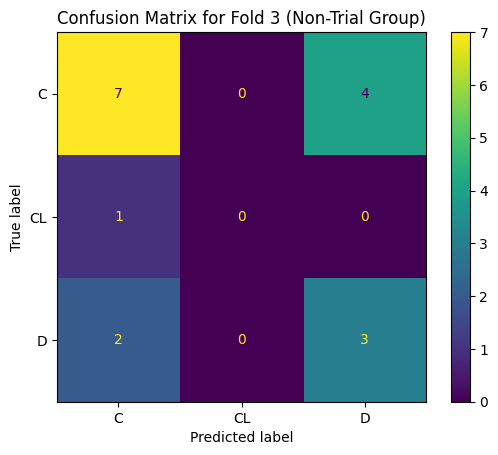

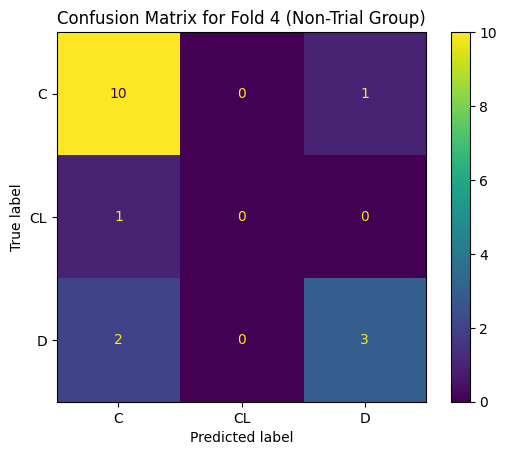

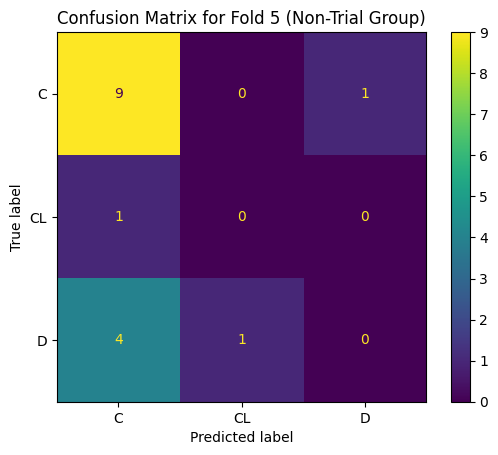

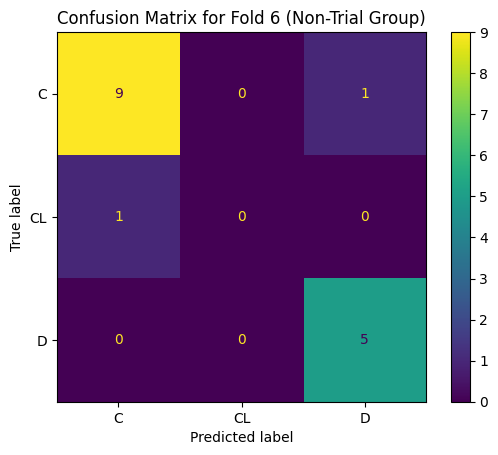

Results for Non-Trial Group:
Mean accuracy: 0.6905637254901961
Standard deviation of accuracy: 0.10685859915055175
Mean cost: 40.833333333333336
Standard deviation of cost: 16.48652648545337
Mean cost per instance: 2.5520833333333335
Standard deviation of cost per instance: 1.0304079053408357
--------------------------------------------------
Classification Report for the last fold:
              precision    recall  f1-score   support

           C       0.90      0.90      0.90        10
          CL       0.00      0.00      0.00         1
           D       0.83      1.00      0.91         5

    accuracy                           0.88        16
   macro avg       0.58      0.63      0.60        16
weighted avg       0.82      0.88      0.85        16



In [29]:
#Accuracy-based training (1 layer with 1000 neurons;RELU )

def neural1_accuracy(data, group_name, cost_matrix):
    target_column = 'Status'
    y = data[target_column]
    X = data.drop(columns=[target_column])

    # Encode categorical features
    for col in X.select_dtypes(include=['object']).columns:
        X[col] = LabelEncoder().fit_transform(X[col])

    # Encode the target variable
    y_encoder = LabelEncoder()
    y = y_encoder.fit_transform(y)

    # Ensure enough samples per class
    class_counts = np.bincount(y)
    min_samples_per_class = np.min(class_counts)
    n_splits = min(10, min_samples_per_class)
    if n_splits < 2:
        raise ValueError(f"Not enough samples for meaningful cross-validation. Minimum class count: {min_samples_per_class}")

    print(f"Using {n_splits} folds for {group_name}")

    # Scale features for MLP
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    # Define the MLP model
    mlp = MLPClassifier(
        hidden_layer_sizes=(1000,),  # One hidden layer with 1000 neurons
        activation='relu',          # Activation function for hidden layers
        solver='adam',              # Optimization algorithm
        alpha=0.0001,               # L2 regularization parameter
        learning_rate='adaptive',   # Adaptive learning rate
        max_iter=1000,               # Maximum number of iterations
        random_state=42             # Seed for reproducibility
    )

    # Cross-validation
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    accuracy_scores = []
    cost_scores = []
    confusion_matrices = []

    for fold_idx, (train_index, test_index) in enumerate(skf.split(X, y), start=1):
        # Split the data
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Train the model
        mlp.fit(X_train, y_train)

        # Predict on the test set
        y_pred = mlp.predict(X_test)

        # Evaluate the model
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_scores.append(accuracy)

        # Compute confusion matrix
        confusion_mat = confusion_matrix(y_test, y_pred)

        # Pad confusion matrix to match the size of the cost matrix
        num_classes = len(np.unique(y))  # Number of unique classes
        if confusion_mat.shape[0] < num_classes:
            # Add padding (zeros) to match the number of classes
            confusion_mat = np.pad(confusion_mat, ((0, num_classes - confusion_mat.shape[0]),
                                                    (0, num_classes - confusion_mat.shape[1])),
                                   mode='constant', constant_values=0)

        confusion_matrices.append(confusion_mat)

        # Calculate cost
        cost = np.sum(confusion_mat * np.transpose(cost_matrix))
        cost_scores.append(cost)

        # Plot confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=confusion_mat, display_labels=y_encoder.classes_)
        disp.plot()
        plt.title(f"Confusion Matrix for Fold {fold_idx} ({group_name} Group)")
        plt.show()


        # Calculate metrics across all folds
    divisor = len(y_test)
    cost_scores_per_instance = [x / divisor for x in cost_scores]

    # Print evaluation results
    print(f"Results for {group_name} Group:")
    print("Mean accuracy:", np.mean(accuracy_scores))
    print("Standard deviation of accuracy:", np.std(accuracy_scores))
    print("Mean cost:", np.mean(cost_scores))
    print("Standard deviation of cost:", np.std(cost_scores))
    print("Mean cost per instance:", np.mean(cost_scores_per_instance))
    print("Standard deviation of cost per instance:", np.std(cost_scores_per_instance))
    print("--------------------------------------------------")

    # Display classification report for the last fold
    print("Classification Report for the last fold:")
    print(classification_report(y_test, y_pred, target_names=y_encoder.classes_, zero_division=0))


# Example cost matrix
cost_matrix = np.array(
    [[ 0,  8, 10],  # Predicted Censored
     [ 5,  0, 15],  # Predicted Transplant
     [ 5, 10,  0]]  # Predicted Death
)


neural1_accuracy(trial_group, "Trial", cost_matrix)
neural1_accuracy(non_trial_group, "Non-Trial", cost_matrix)



Using 10 folds for Trial


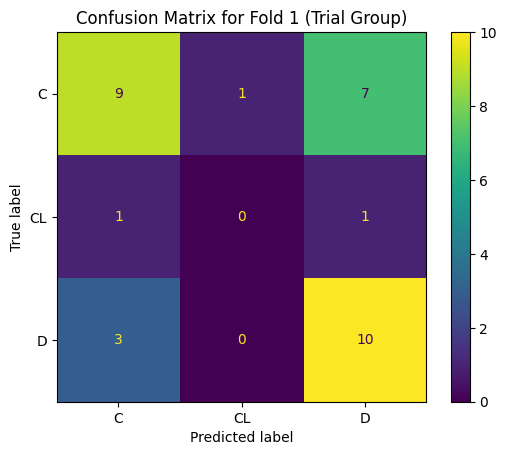

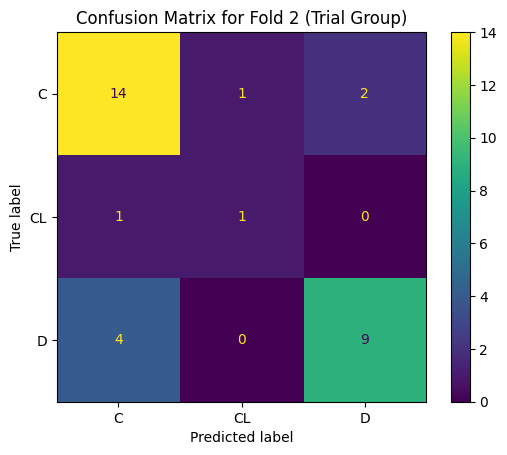

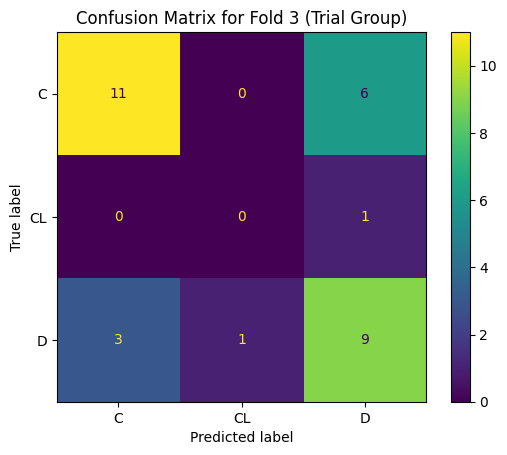

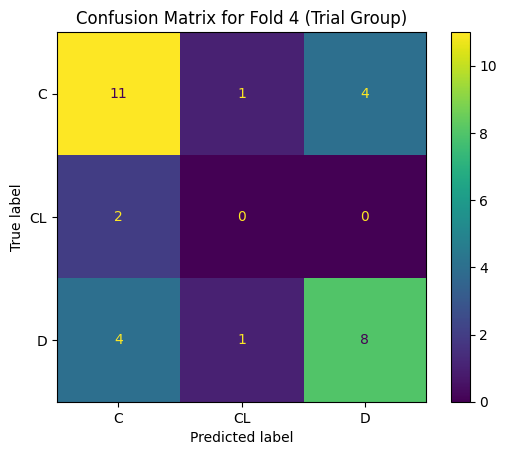

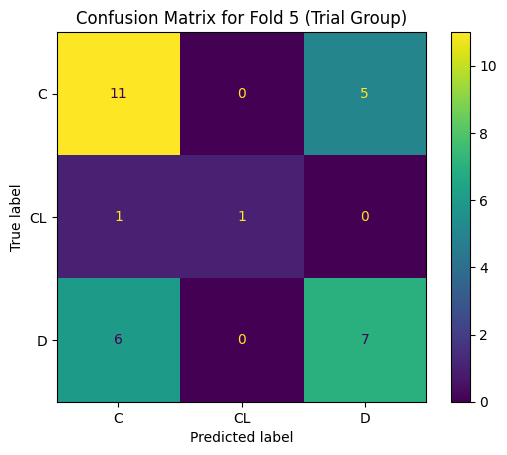

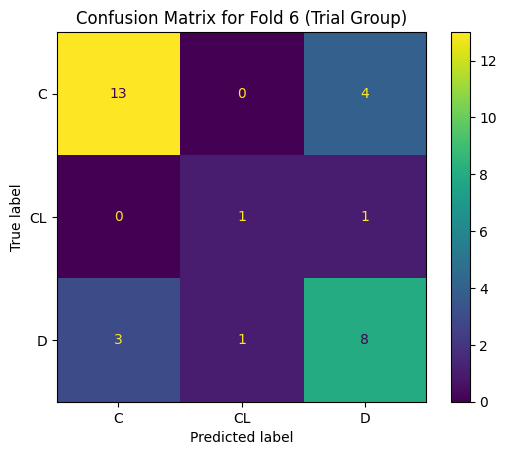

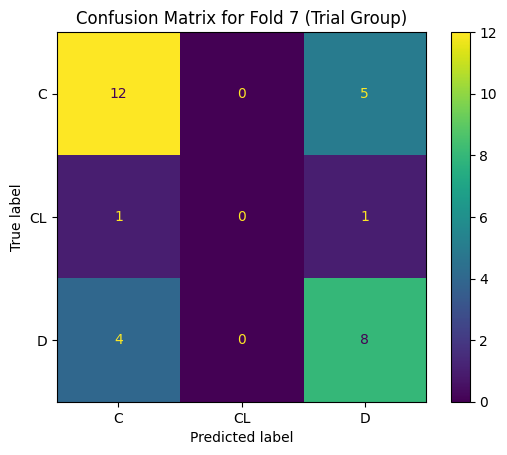

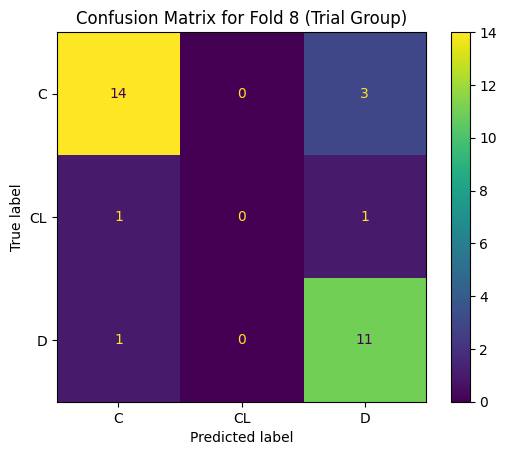

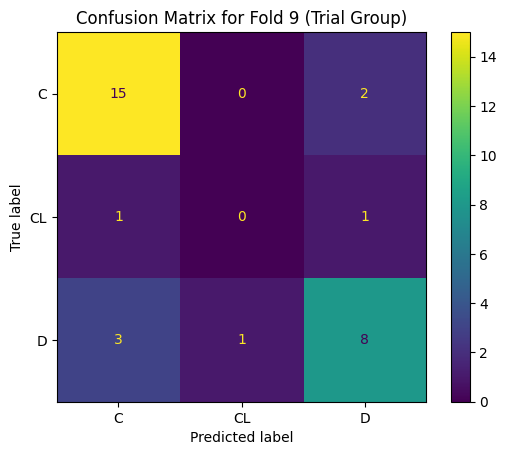

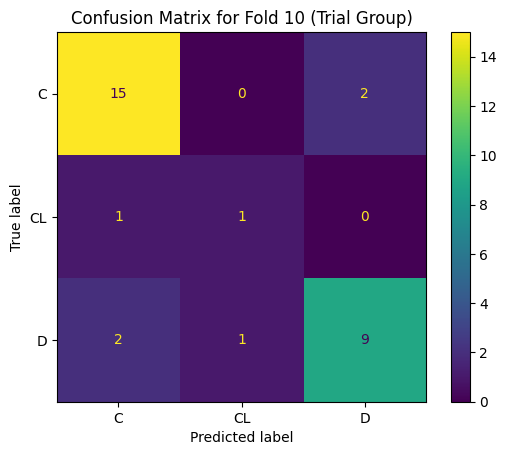

Results for Trial Group:
Mean accuracy: 0.6924395161290323
Standard deviation of accuracy: 0.07675926437677663
Mean cost: 75.2
Standard deviation of cost: 16.59397481015323
Mean cost per instance: 2.4258064516129036
Standard deviation of cost per instance: 0.535289510004943
--------------------------------------------------
Classification Report for the last fold:
              precision    recall  f1-score   support

           C       0.83      0.88      0.86        17
          CL       0.50      0.50      0.50         2
           D       0.82      0.75      0.78        12

    accuracy                           0.81        31
   macro avg       0.72      0.71      0.71        31
weighted avg       0.81      0.81      0.81        31

Using 6 folds for Non-Trial


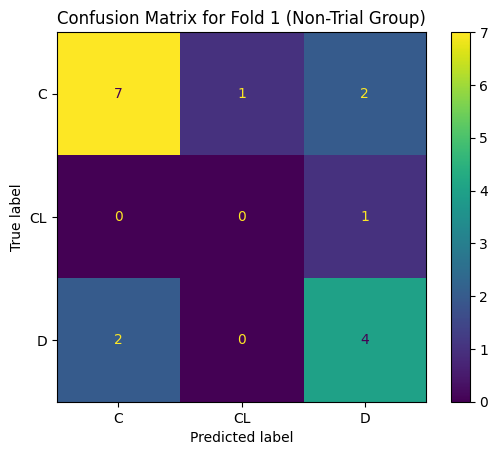

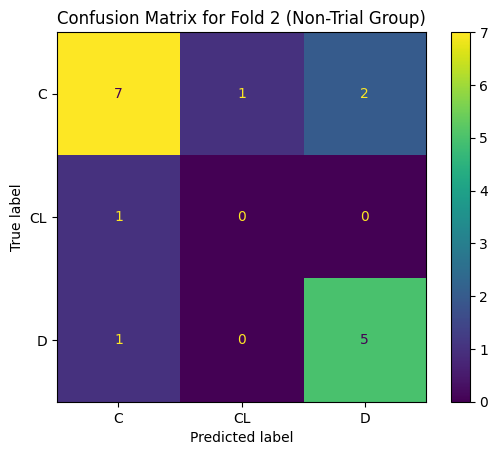

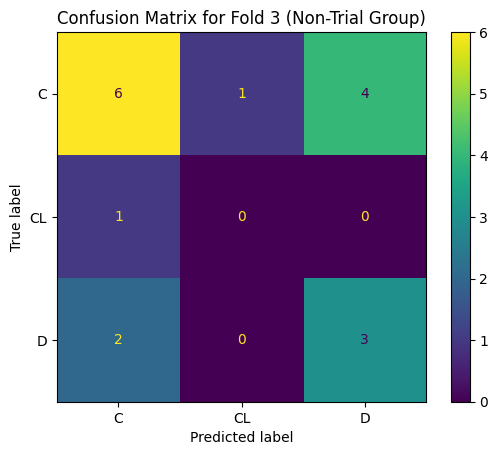

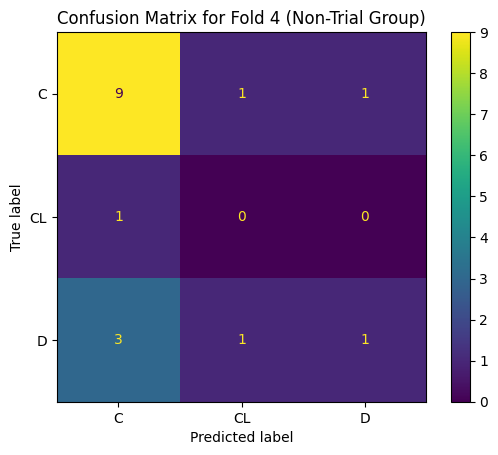

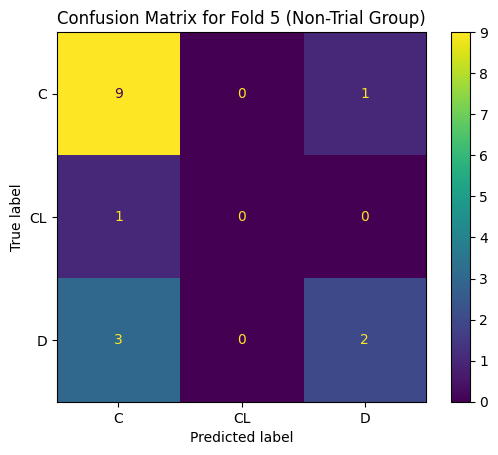

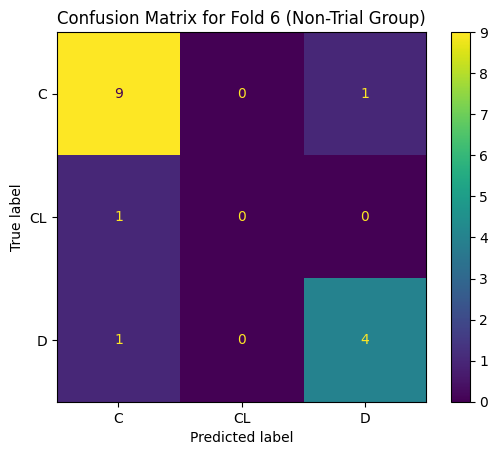

Results for Non-Trial Group:
Mean accuracy: 0.6617647058823529
Standard deviation of accuracy: 0.08987949288386718
Mean cost: 43.333333333333336
Standard deviation of cost: 12.931443160847214
Mean cost per instance: 2.7083333333333335
Standard deviation of cost per instance: 0.8082151975529509
--------------------------------------------------
Classification Report for the last fold:
              precision    recall  f1-score   support

           C       0.82      0.90      0.86        10
          CL       0.00      0.00      0.00         1
           D       0.80      0.80      0.80         5

    accuracy                           0.81        16
   macro avg       0.54      0.57      0.55        16
weighted avg       0.76      0.81      0.79        16



In [39]:
#Cost-based training (1 layer with 1000 neurons; RELU )

def neural1_cost(data, group_name, cost_matrix):
    target_column = 'Status'
    y = data[target_column]
    X = data.drop(columns=[target_column])

    # Encode categorical features
    for col in X.select_dtypes(include=['object']).columns:
        X[col] = LabelEncoder().fit_transform(X[col])

    # Encode the target variable
    y_encoder = LabelEncoder()
    y = y_encoder.fit_transform(y)

    # Ensure enough samples per class
    class_counts = np.bincount(y)
    min_samples_per_class = np.min(class_counts)
    n_splits = min(10, min_samples_per_class)
    if n_splits < 2:
        raise ValueError(f"Not enough samples for meaningful cross-validation. Minimum class count: {min_samples_per_class}")

    print(f"Using {n_splits} folds for {group_name}")

    # Scale features for MLP
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    # Define the MLP model
    mlp = MLPClassifier(
        hidden_layer_sizes=(1000,),  # One hidden layer with 1000 neurons
        activation='relu',          # Activation function for hidden layers
        solver='adam',              # Optimization algorithm
        alpha=0.0001,               # L2 regularization parameter
        learning_rate='adaptive',   # Adaptive learning rate
        max_iter=1000,               # Maximum number of iterations
        random_state=42             # Seed for reproducibility
    )

    # Cross-validation
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    accuracy_scores = []
    cost_scores = []
    confusion_matrices = []

    for fold_idx, (train_index, test_index) in enumerate(skf.split(X, y), start=1):
        # Split the data
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Apply MetaCost with the classifier and cost matrix
        train_df_fold = pd.DataFrame(data=X_train)
        train_df_fold['Status'] = pd.array(y_train)

        # Train the model
        metacost_model = MetaCost(train_df_fold, mlp, cost_matrix)
        model = metacost_model.fit('Status', len(np.unique(y)))


        # Predict on the test set
        y_pred = model.predict(X_test)

        # Evaluate the model
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_scores.append(accuracy)

        # Compute confusion matrix
        confusion_mat = confusion_matrix(y_test, y_pred)

        # Pad confusion matrix to match the size of the cost matrix
        num_classes = len(np.unique(y))  # Number of unique classes
        if confusion_mat.shape[0] < num_classes:
            # Add padding (zeros) to match the number of classes
            confusion_mat = np.pad(confusion_mat, ((0, num_classes - confusion_mat.shape[0]),
                                                    (0, num_classes - confusion_mat.shape[1])),
                                   mode='constant', constant_values=0)

        confusion_matrices.append(confusion_mat)

        # Calculate cost
        cost = np.sum(confusion_mat * np.transpose(cost_matrix))
        cost_scores.append(cost)

        # Plot confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=confusion_mat, display_labels=y_encoder.classes_)
        disp.plot()
        plt.title(f"Confusion Matrix for Fold {fold_idx} ({group_name} Group)")
        plt.show()

        # Calculate metrics across all folds
    divisor = len(y_test)
    cost_scores_per_instance = [x / divisor for x in cost_scores]

    # Print evaluation results
    print(f"Results for {group_name} Group:")
    print("Mean accuracy:", np.mean(accuracy_scores))
    print("Standard deviation of accuracy:", np.std(accuracy_scores))
    print("Mean cost:", np.mean(cost_scores))
    print("Standard deviation of cost:", np.std(cost_scores))
    print("Mean cost per instance:", np.mean(cost_scores_per_instance))
    print("Standard deviation of cost per instance:", np.std(cost_scores_per_instance))
    print("--------------------------------------------------")

    # Display classification report for the last fold
    print("Classification Report for the last fold:")
    print(classification_report(y_test, y_pred, target_names=y_encoder.classes_, zero_division=0))


# Example cost matrix
cost_matrix = np.array(
    [[ 0,  8, 10],  # Predicted Censored
     [ 5,  0, 15],  # Predicted Transplant
     [ 5, 10,  0]]  # Predicted Death
)


neural1_cost(trial_group, "Trial", cost_matrix)
neural1_cost(non_trial_group, "Non-Trial", cost_matrix)

### 2-layers

Using 10 folds for Trial


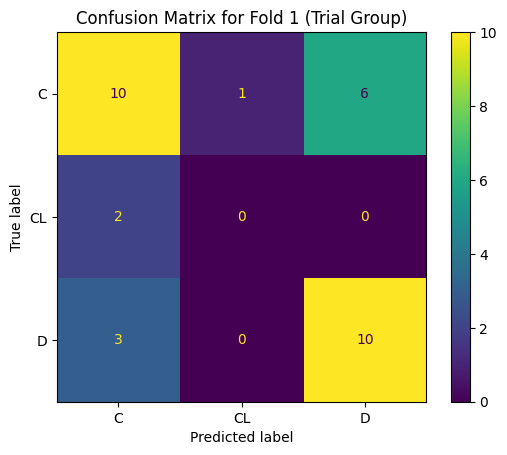

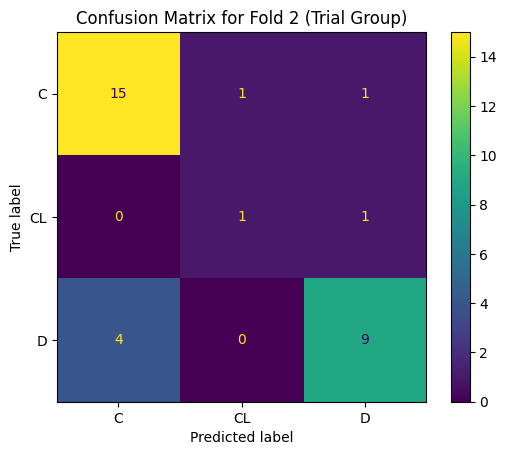

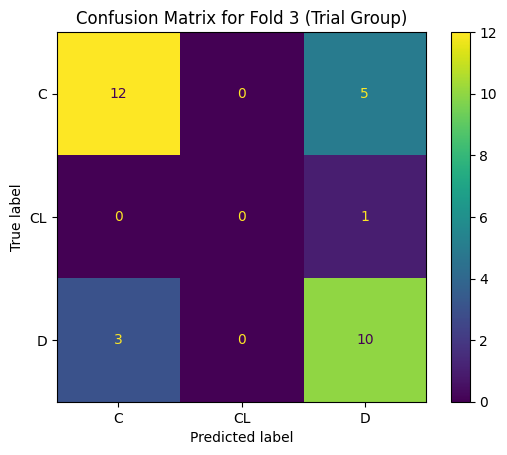

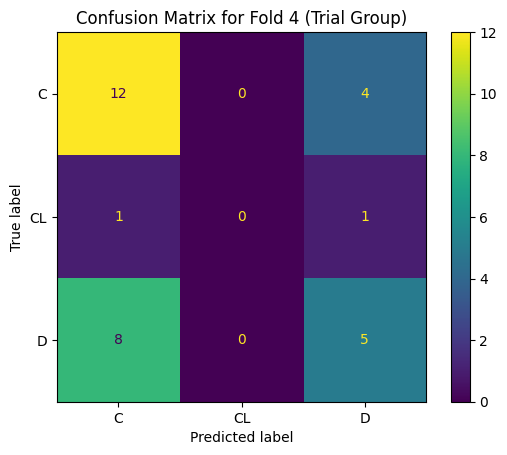

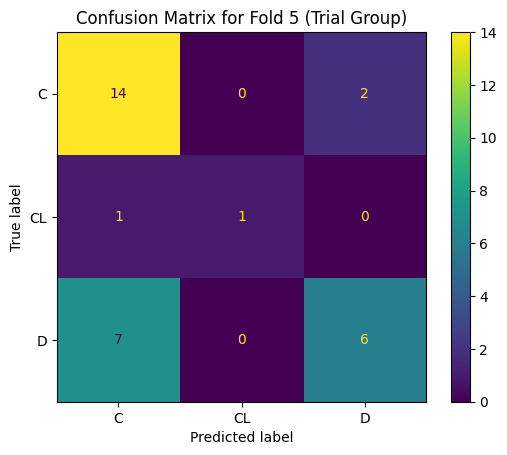

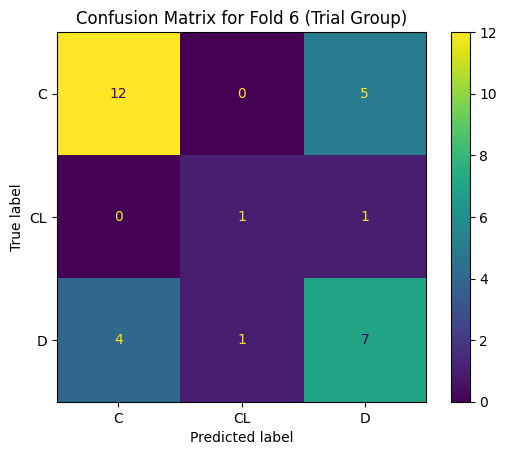

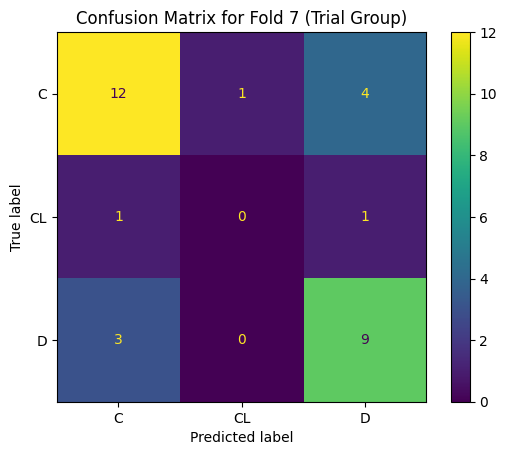

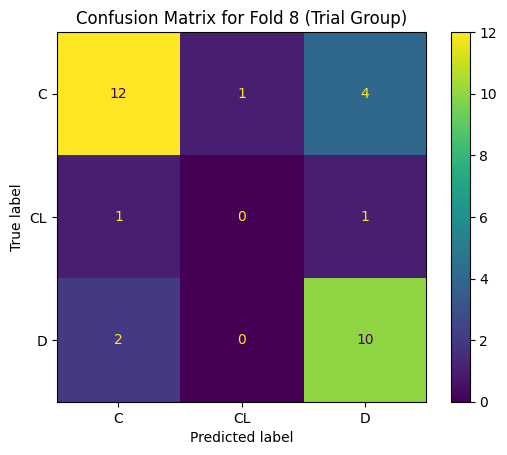

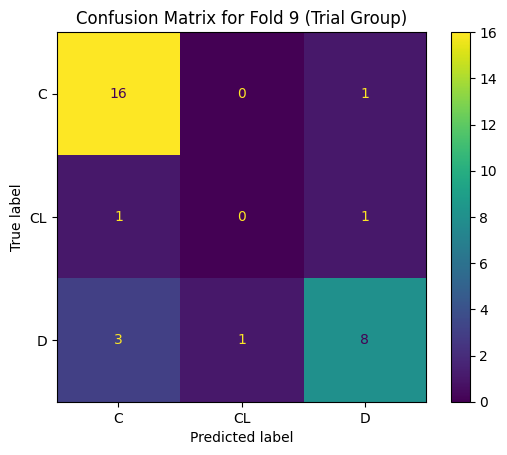

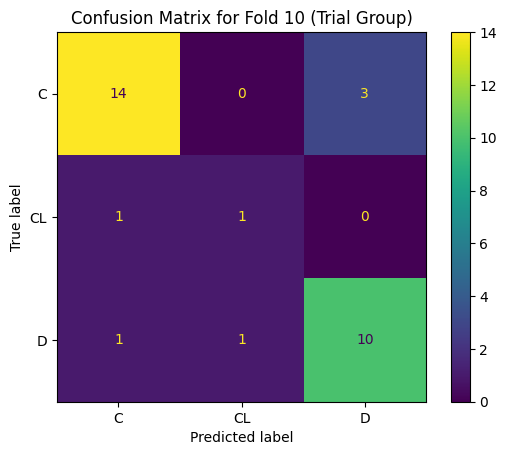

Results for Trial Group:
Mean accuracy: 0.6954637096774194
Standard deviation of accuracy: 0.07487205365103884
Mean cost: 75.4
Standard deviation of cost: 18.7840357750937
Mean cost per instance: 2.432258064516129
Standard deviation of cost per instance: 0.6059366379062485
--------------------------------------------------
Classification Report for the last fold:
              precision    recall  f1-score   support

           C       0.88      0.82      0.85        17
          CL       0.50      0.50      0.50         2
           D       0.77      0.83      0.80        12

    accuracy                           0.81        31
   macro avg       0.71      0.72      0.72        31
weighted avg       0.81      0.81      0.81        31

Using 6 folds for Non-Trial


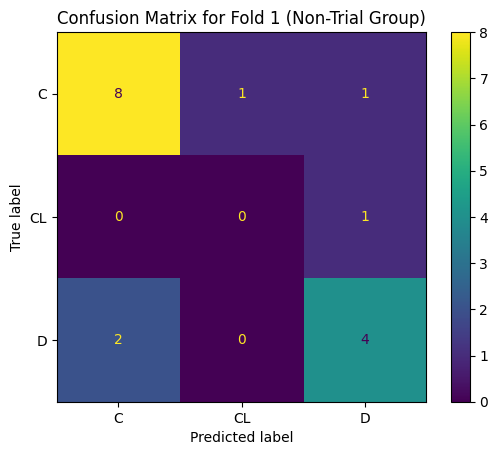

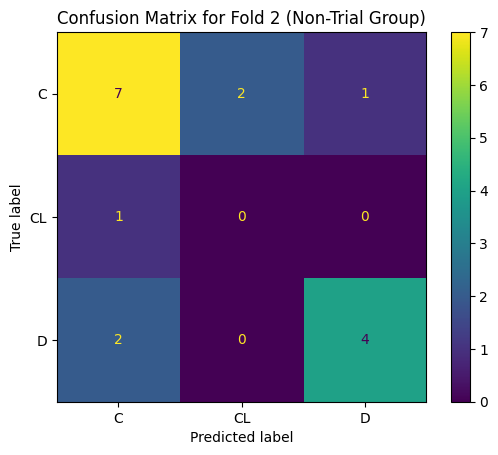

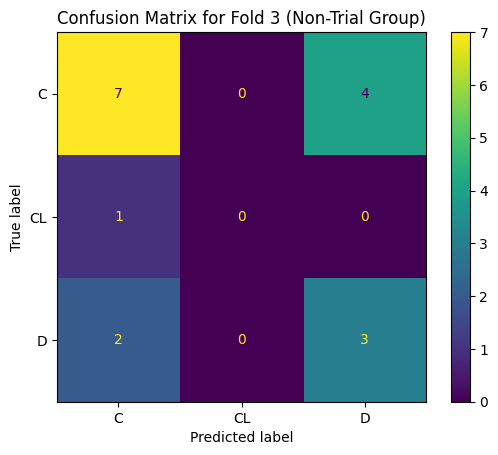

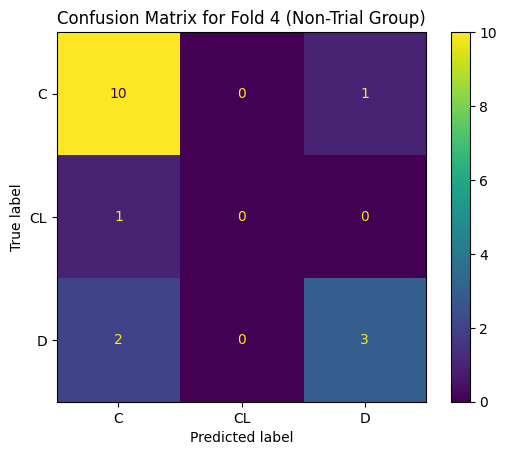

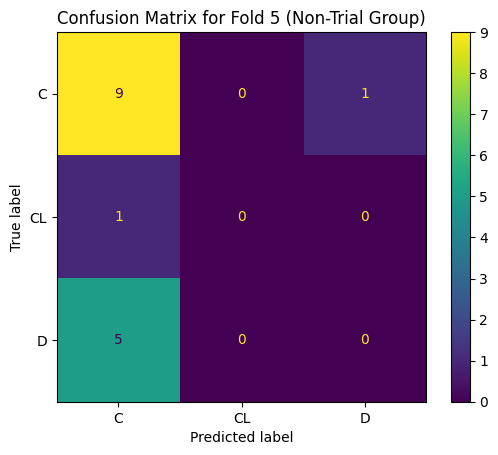

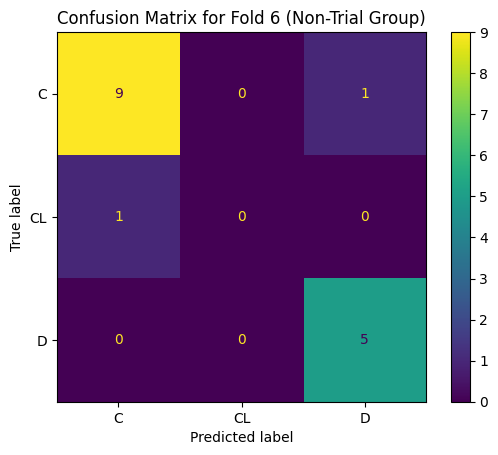

Results for Non-Trial Group:
Mean accuracy: 0.6905637254901961
Standard deviation of accuracy: 0.10685859915055175
Mean cost: 40.0
Standard deviation of cost: 15.165750888103101
Mean cost per instance: 2.5
Standard deviation of cost per instance: 0.9478594305064438
--------------------------------------------------
Classification Report for the last fold:
              precision    recall  f1-score   support

           C       0.90      0.90      0.90        10
          CL       0.00      0.00      0.00         1
           D       0.83      1.00      0.91         5

    accuracy                           0.88        16
   macro avg       0.58      0.63      0.60        16
weighted avg       0.82      0.88      0.85        16



In [40]:
#Accuracy-based training (Two hidden layers with varying sizes; RELU)

def neural2_accuracy(data, group_name, cost_matrix):
    target_column = 'Status'
    y = data[target_column]
    X = data.drop(columns=[target_column])

    # Encode categorical features
    for col in X.select_dtypes(include=['object']).columns:
        X[col] = LabelEncoder().fit_transform(X[col])

    # Encode the target variable
    y_encoder = LabelEncoder()
    y = y_encoder.fit_transform(y)

    # Ensure enough samples per class
    class_counts = np.bincount(y)
    min_samples_per_class = np.min(class_counts)
    n_splits = min(10, min_samples_per_class)
    if n_splits < 2:
        raise ValueError(f"Not enough samples for meaningful cross-validation. Minimum class count: {min_samples_per_class}")

    print(f"Using {n_splits} folds for {group_name}")

    # Scale features for MLP
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    # Define the MLP model
    mlp = MLPClassifier(
        hidden_layer_sizes=(750, 500),  # Three hidden layers with varying sizes
        activation='relu',          # Activation function for hidden layers
        solver='adam',              # Optimization algorithm
        alpha=0.0001,               # L2 regularization parameter
        learning_rate='adaptive',   # Adaptive learning rate
        max_iter=1000,               # Maximum number of iterations
        random_state=42             # Seed for reproducibility
    )

    # Cross-validation
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    accuracy_scores = []
    cost_scores = []
    confusion_matrices = []

    for fold_idx, (train_index, test_index) in enumerate(skf.split(X, y), start=1):
        # Split the data
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Train the model
        mlp.fit(X_train, y_train)

        # Predict on the test set
        y_pred = mlp.predict(X_test)

        # Evaluate the model
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_scores.append(accuracy)

        # Compute confusion matrix
        confusion_mat = confusion_matrix(y_test, y_pred)

        # Pad confusion matrix to match the size of the cost matrix
        num_classes = len(np.unique(y))  # Number of unique classes
        if confusion_mat.shape[0] < num_classes:
            # Add padding (zeros) to match the number of classes
            confusion_mat = np.pad(confusion_mat, ((0, num_classes - confusion_mat.shape[0]),
                                                    (0, num_classes - confusion_mat.shape[1])),
                                   mode='constant', constant_values=0)

        confusion_matrices.append(confusion_mat)

        # Calculate cost
        cost = np.sum(confusion_mat * np.transpose(cost_matrix))
        cost_scores.append(cost)

        # Plot confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=confusion_mat, display_labels=y_encoder.classes_)
        disp.plot()
        plt.title(f"Confusion Matrix for Fold {fold_idx} ({group_name} Group)")
        plt.show()

        # Calculate metrics across all folds
    divisor = len(y_test)
    cost_scores_per_instance = [x / divisor for x in cost_scores]

    # Print evaluation results
    print(f"Results for {group_name} Group:")
    print("Mean accuracy:", np.mean(accuracy_scores))
    print("Standard deviation of accuracy:", np.std(accuracy_scores))
    print("Mean cost:", np.mean(cost_scores))
    print("Standard deviation of cost:", np.std(cost_scores))
    print("Mean cost per instance:", np.mean(cost_scores_per_instance))
    print("Standard deviation of cost per instance:", np.std(cost_scores_per_instance))
    print("--------------------------------------------------")

    # Display classification report for the last fold
    print("Classification Report for the last fold:")
    print(classification_report(y_test, y_pred, target_names=y_encoder.classes_, zero_division=0))


# Example cost matrix
cost_matrix = np.array(
    [[ 0,  8, 10],  # Predicted Censored
     [ 5,  0, 15],  # Predicted Transplant
     [ 5, 10,  0]]  # Predicted Death
)


neural2_accuracy(trial_group, "Trial", cost_matrix)
neural2_accuracy(non_trial_group, "Non-Trial", cost_matrix)

Using 10 folds for Trial


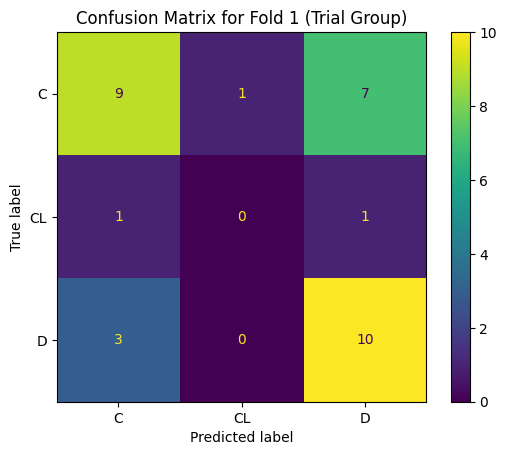

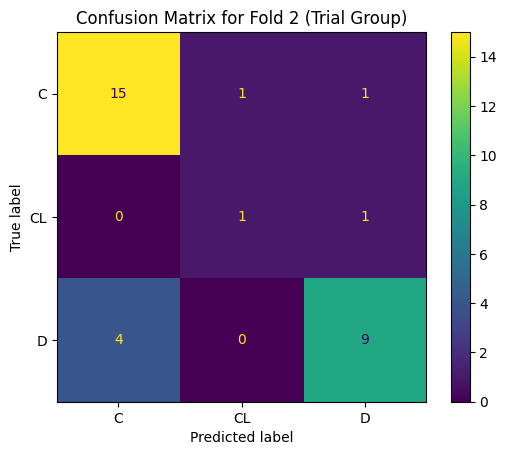

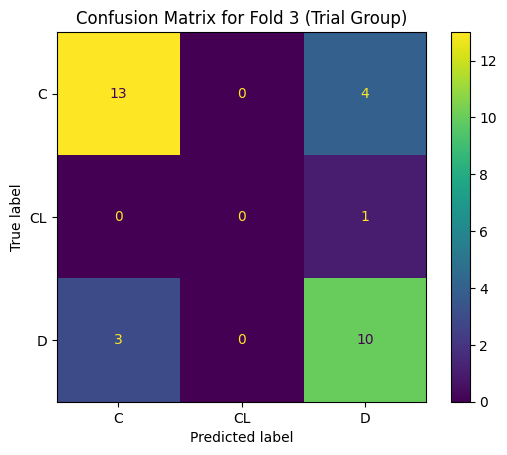

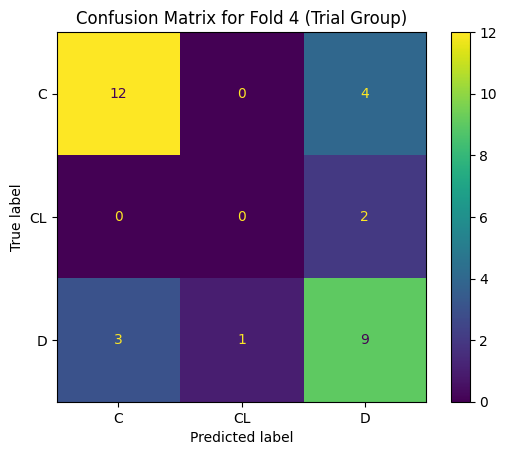

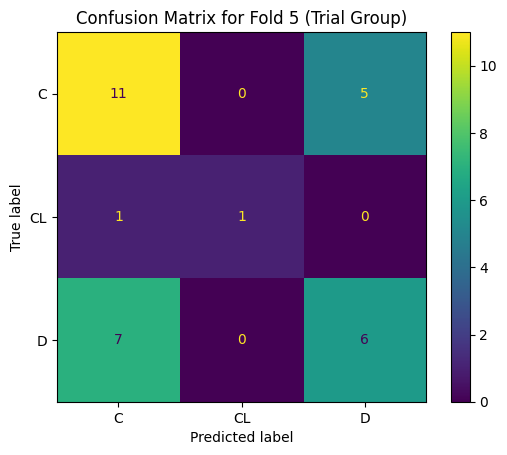

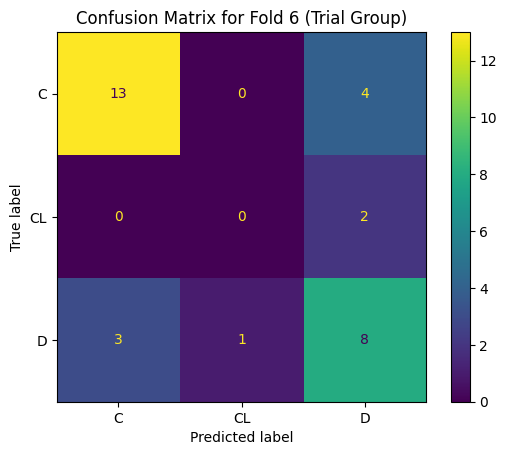

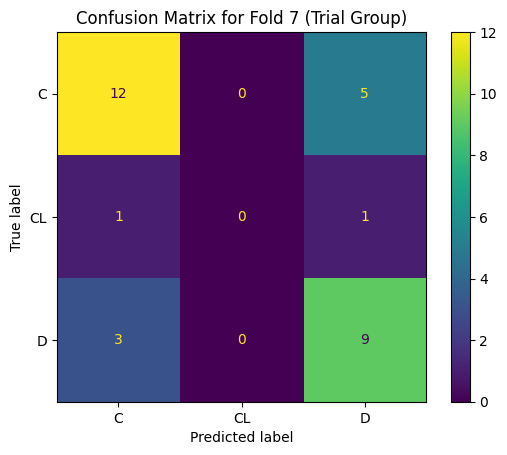

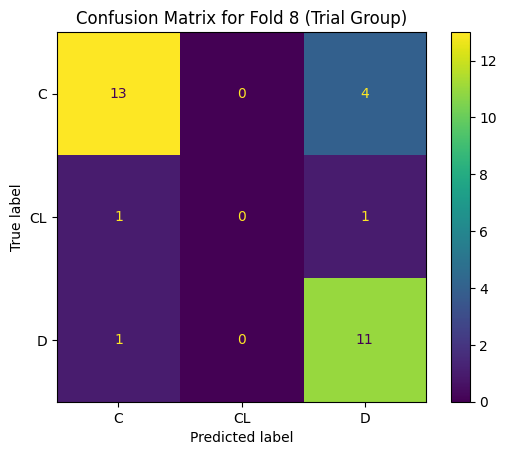

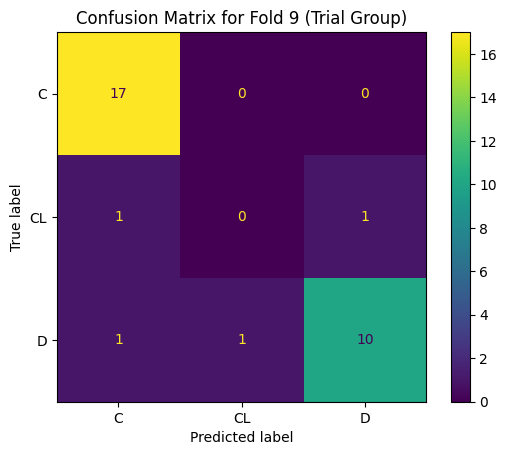

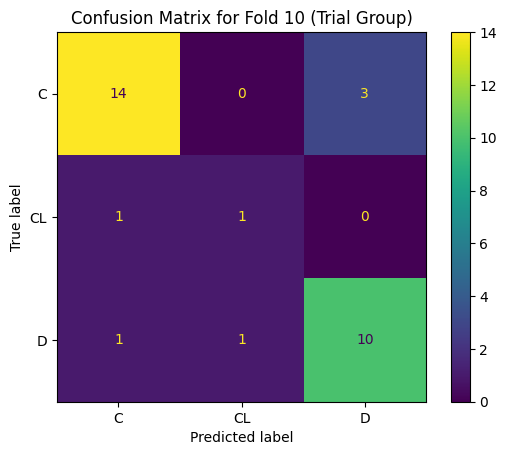

Results for Trial Group:
Mean accuracy: 0.7181451612903226
Standard deviation of accuracy: 0.08842995671749043
Mean cost: 69.3
Standard deviation of cost: 19.401288616996553
Mean cost per instance: 2.235483870967742
Standard deviation of cost per instance: 0.6258480199031147
--------------------------------------------------
Classification Report for the last fold:
              precision    recall  f1-score   support

           C       0.88      0.82      0.85        17
          CL       0.50      0.50      0.50         2
           D       0.77      0.83      0.80        12

    accuracy                           0.81        31
   macro avg       0.71      0.72      0.72        31
weighted avg       0.81      0.81      0.81        31

Using 6 folds for Non-Trial


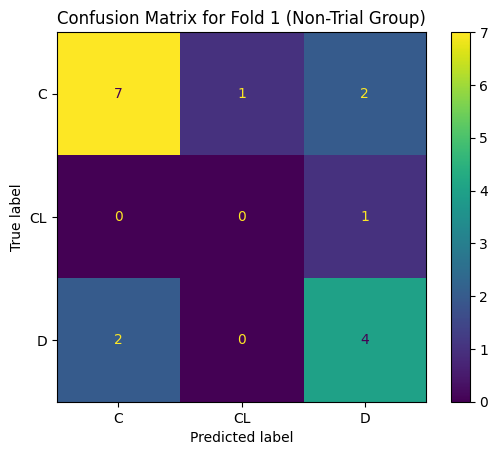

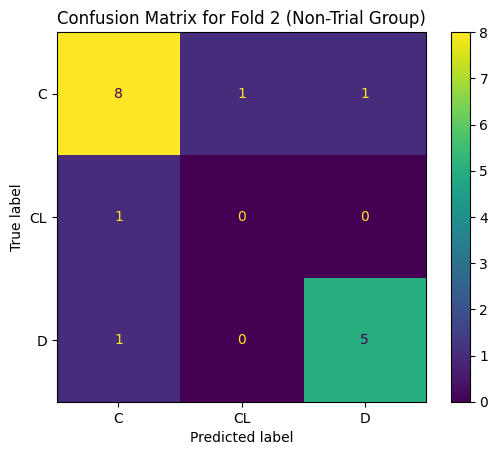

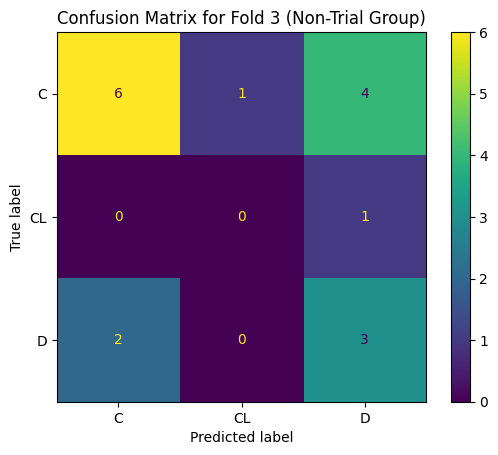

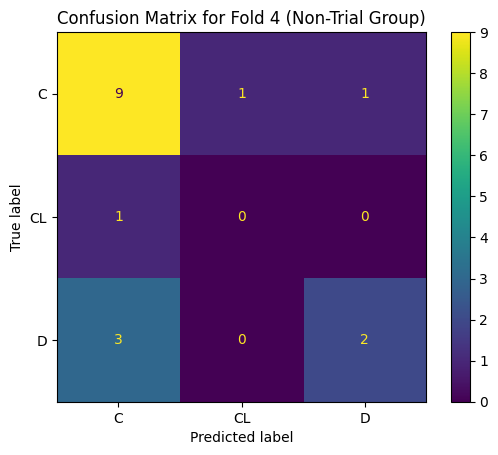

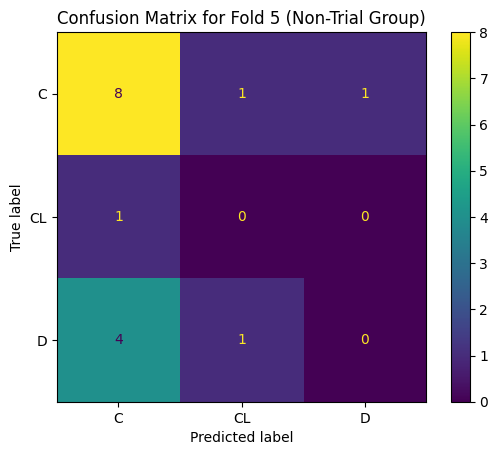

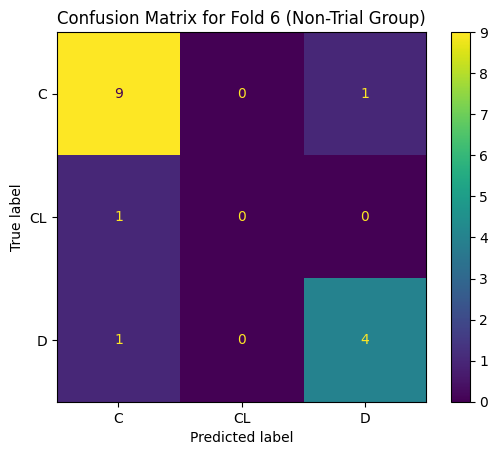

Results for Non-Trial Group:
Mean accuracy: 0.6501225490196078
Standard deviation of accuracy: 0.11300621138253514
Mean cost: 45.333333333333336
Standard deviation of cost: 16.659998666133067
Mean cost per instance: 2.8333333333333335
Standard deviation of cost per instance: 1.0412499166333167
--------------------------------------------------
Classification Report for the last fold:
              precision    recall  f1-score   support

           C       0.82      0.90      0.86        10
          CL       0.00      0.00      0.00         1
           D       0.80      0.80      0.80         5

    accuracy                           0.81        16
   macro avg       0.54      0.57      0.55        16
weighted avg       0.76      0.81      0.79        16



In [41]:
#Cost-based training (Two hidden layers with varying sizes; RELU)

def neural2_cost(data, group_name, cost_matrix):
    target_column = 'Status'
    y = data[target_column]
    X = data.drop(columns=[target_column])

    # Encode categorical features
    for col in X.select_dtypes(include=['object']).columns:
        X[col] = LabelEncoder().fit_transform(X[col])

    # Encode the target variable
    y_encoder = LabelEncoder()
    y = y_encoder.fit_transform(y)

    # Ensure enough samples per class
    class_counts = np.bincount(y)
    min_samples_per_class = np.min(class_counts)
    n_splits = min(10, min_samples_per_class)
    if n_splits < 2:
        raise ValueError(f"Not enough samples for meaningful cross-validation. Minimum class count: {min_samples_per_class}")

    print(f"Using {n_splits} folds for {group_name}")

    # Scale features for MLP
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    # Define the MLP model
    mlp = MLPClassifier(
        hidden_layer_sizes=(750, 500),  # Three hidden layers with varying sizes
        activation='relu',          # Activation function for hidden layers
        solver='adam',              # Optimization algorithm
        alpha=0.0001,               # L2 regularization parameter
        learning_rate='adaptive',   # Adaptive learning rate
        max_iter=1000,               # Maximum number of iterations
        random_state=42             # Seed for reproducibility
    )

    # Cross-validation
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    accuracy_scores = []
    cost_scores = []
    confusion_matrices = []

    for fold_idx, (train_index, test_index) in enumerate(skf.split(X, y), start=1):
        # Split the data
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Apply MetaCost with the classifier and cost matrix
        train_df_fold = pd.DataFrame(data=X_train)
        train_df_fold['Status'] = pd.array(y_train)

        # Train the model
        metacost_model = MetaCost(train_df_fold, mlp, cost_matrix)
        model = metacost_model.fit('Status', len(np.unique(y)))


        # Predict on the test set
        y_pred = model.predict(X_test)

        # Evaluate the model
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_scores.append(accuracy)

        # Compute confusion matrix
        confusion_mat = confusion_matrix(y_test, y_pred)

        # Pad confusion matrix to match the size of the cost matrix
        num_classes = len(np.unique(y))  # Number of unique classes
        if confusion_mat.shape[0] < num_classes:
            # Add padding (zeros) to match the number of classes
            confusion_mat = np.pad(confusion_mat, ((0, num_classes - confusion_mat.shape[0]),
                                                    (0, num_classes - confusion_mat.shape[1])),
                                   mode='constant', constant_values=0)

        confusion_matrices.append(confusion_mat)

        # Calculate cost
        cost = np.sum(confusion_mat * np.transpose(cost_matrix))
        cost_scores.append(cost)

        # Plot confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=confusion_mat, display_labels=y_encoder.classes_)
        disp.plot()
        plt.title(f"Confusion Matrix for Fold {fold_idx} ({group_name} Group)")
        plt.show()

        # Calculate metrics across all folds
    divisor = len(y_test)
    cost_scores_per_instance = [x / divisor for x in cost_scores]

    # Print evaluation results
    print(f"Results for {group_name} Group:")
    print("Mean accuracy:", np.mean(accuracy_scores))
    print("Standard deviation of accuracy:", np.std(accuracy_scores))
    print("Mean cost:", np.mean(cost_scores))
    print("Standard deviation of cost:", np.std(cost_scores))
    print("Mean cost per instance:", np.mean(cost_scores_per_instance))
    print("Standard deviation of cost per instance:", np.std(cost_scores_per_instance))
    print("--------------------------------------------------")

    # Display classification report for the last fold
    print("Classification Report for the last fold:")
    print(classification_report(y_test, y_pred, target_names=y_encoder.classes_, zero_division=0))


# Example cost matrix
cost_matrix = np.array(
    [[ 0,  8, 10],  # Predicted Censored
     [ 5,  0, 15],  # Predicted Transplant
     [ 5, 10,  0]]  # Predicted Death
)


neural2_cost(trial_group, "Trial", cost_matrix)
neural2_cost(non_trial_group, "Non-Trial", cost_matrix)

## Deep Learning

Using 10 folds for Trial


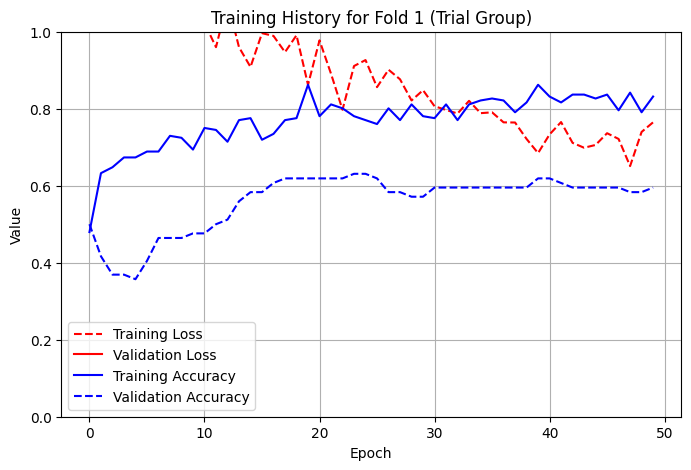

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


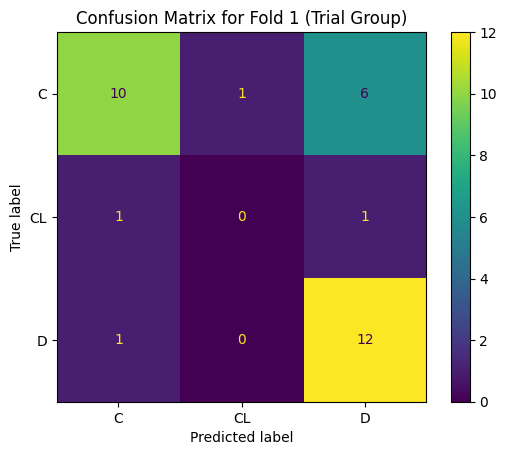

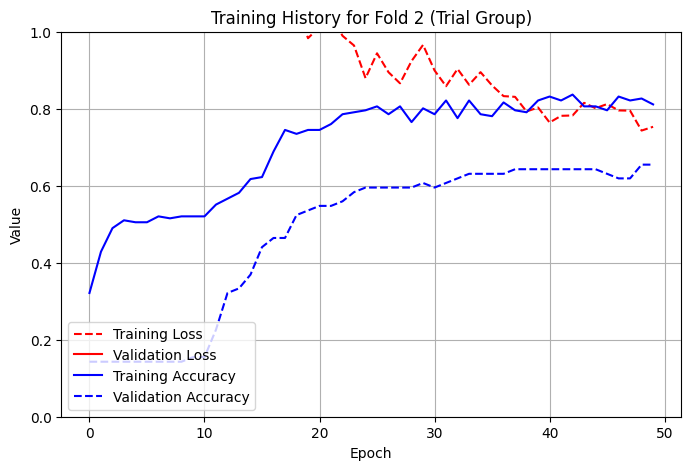

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


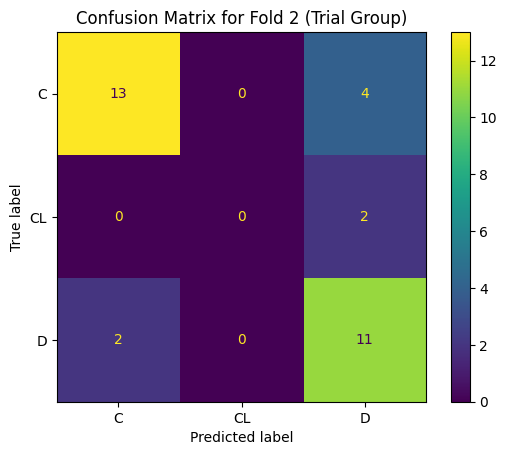

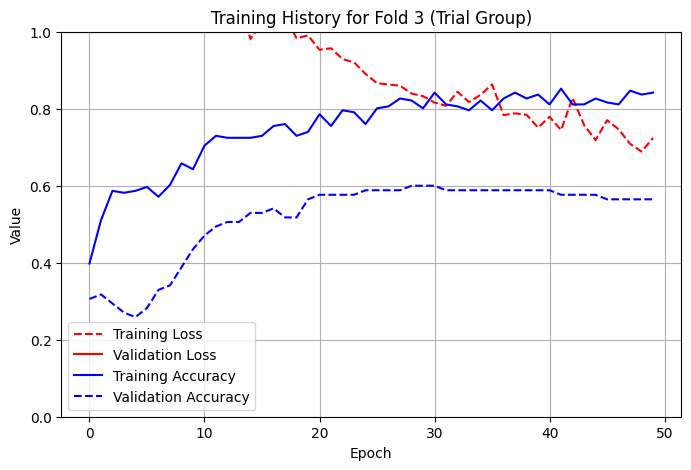

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


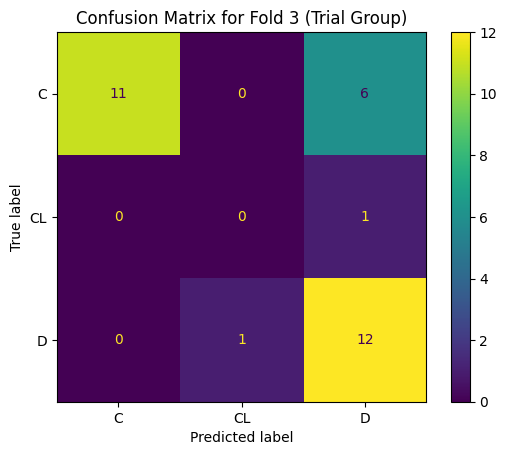

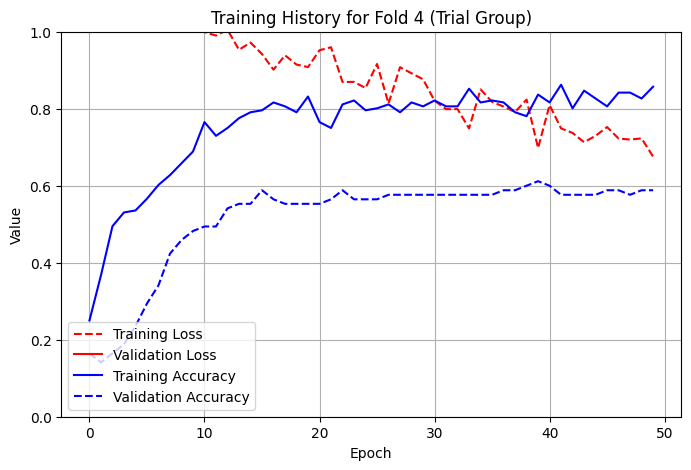

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


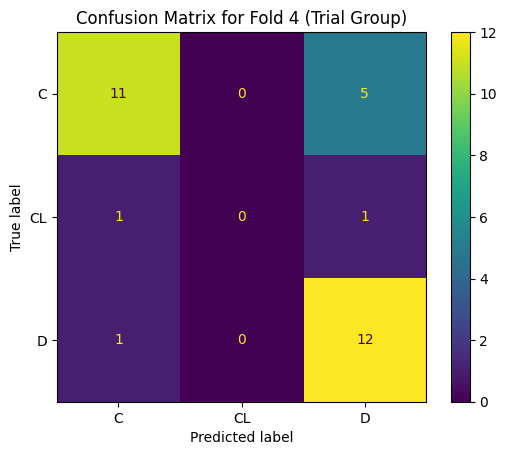

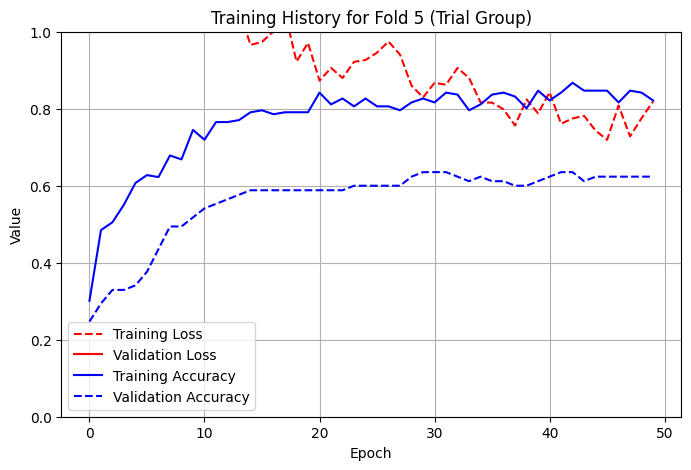

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


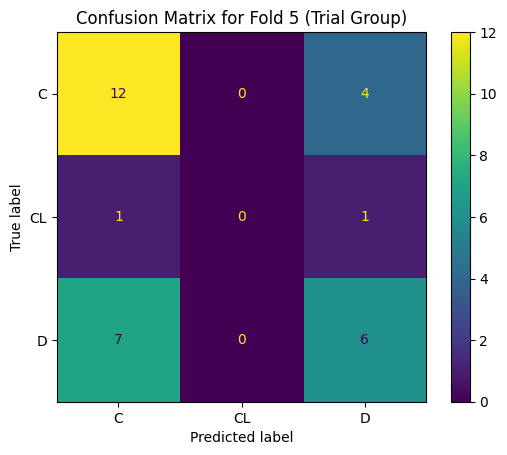

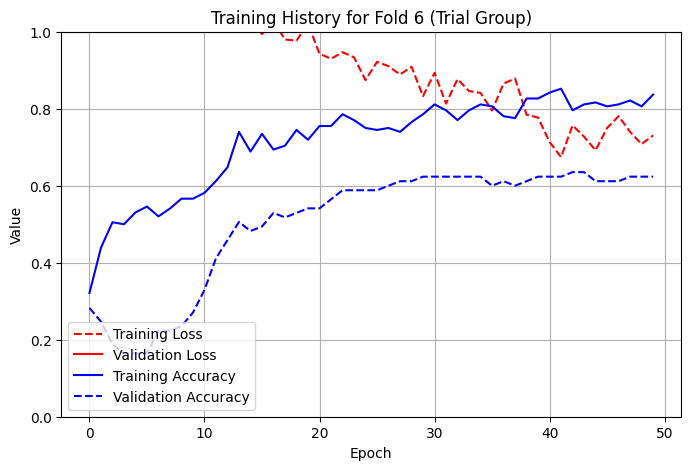

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


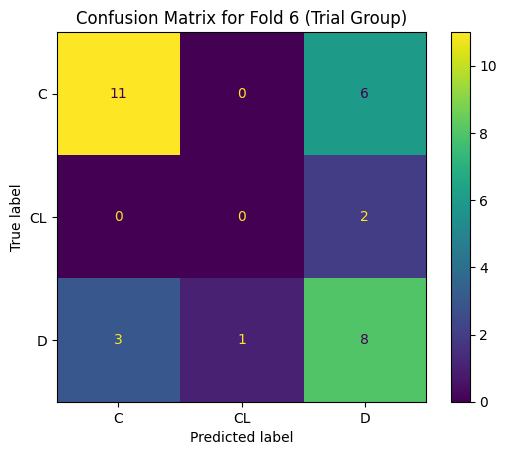

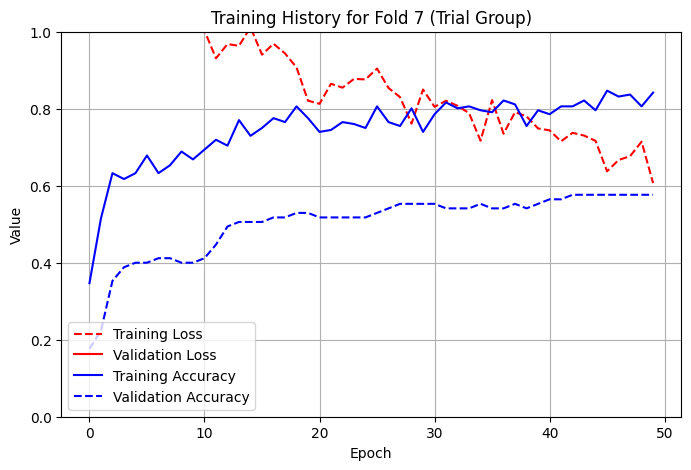

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


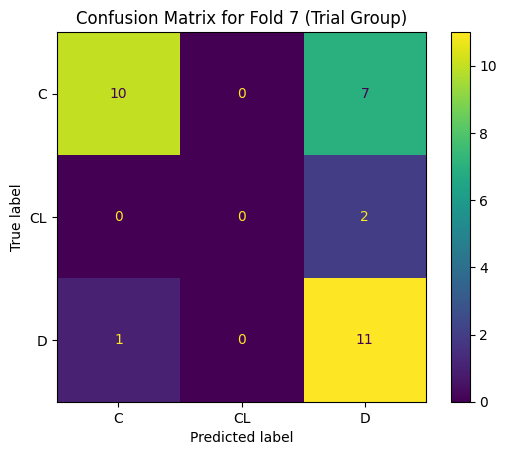

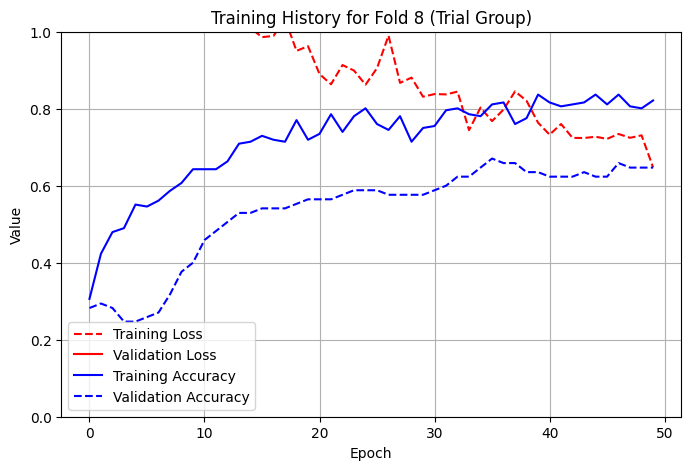

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


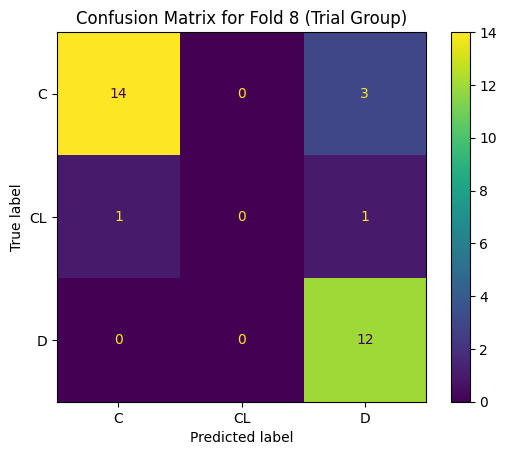

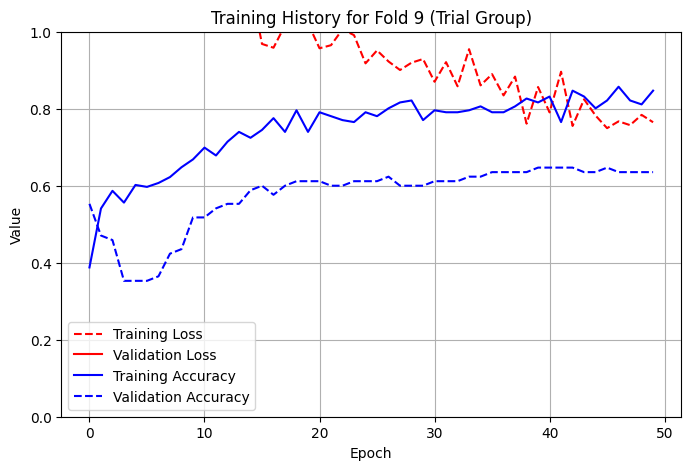

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


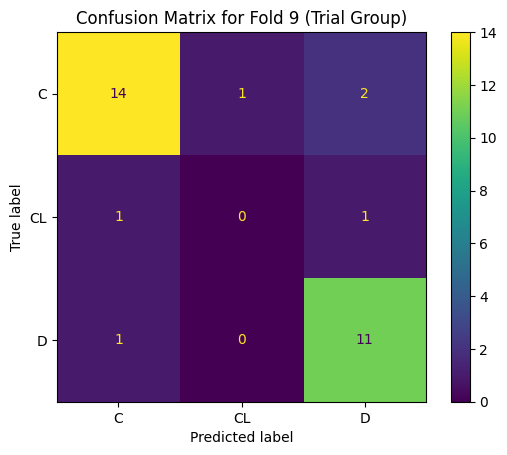

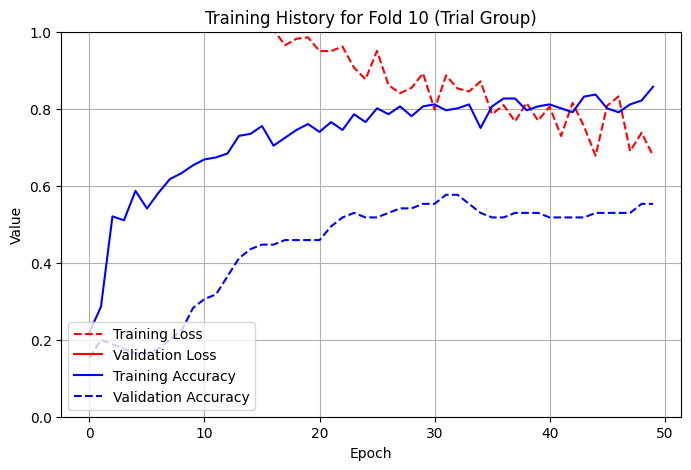

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


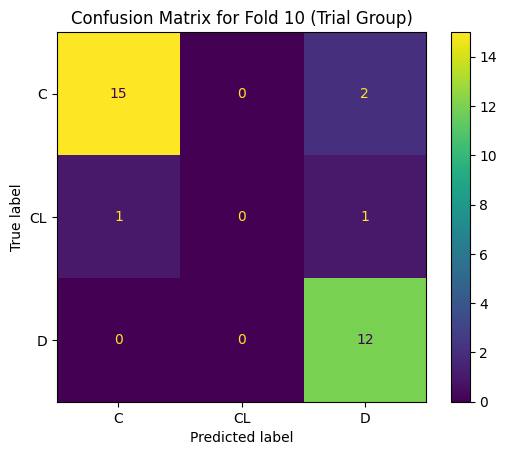

Results for Trial Group:
Mean accuracy: 0.7308467741935484
Standard deviation of accuracy: 0.08877036963409574
Mean cost: 60.3
Standard deviation of cost: 23.828764130772708
Mean cost per instance: 1.9451612903225808
Standard deviation of cost per instance: 0.7686698106700873
--------------------------------------------------
Classification Report for the last fold:
              precision    recall  f1-score   support

           C       0.94      0.88      0.91        17
          CL       0.00      0.00      0.00         2
           D       0.80      1.00      0.89        12

    accuracy                           0.87        31
   macro avg       0.58      0.63      0.60        31
weighted avg       0.82      0.87      0.84        31

Using 6 folds for Non-Trial


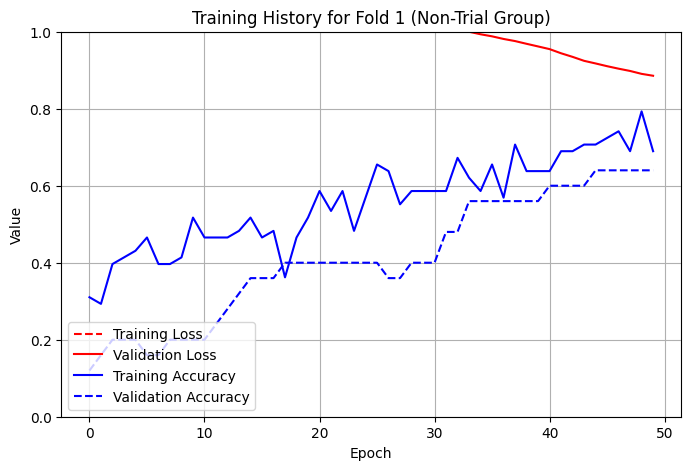

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


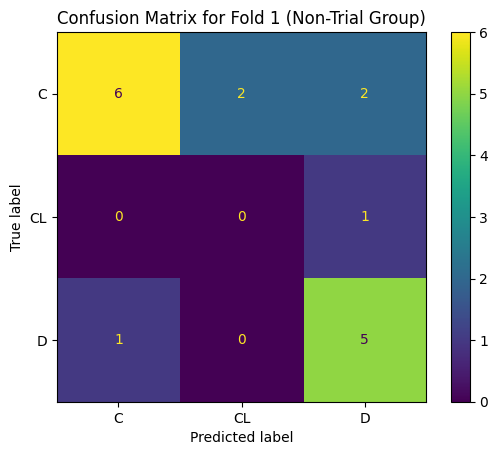

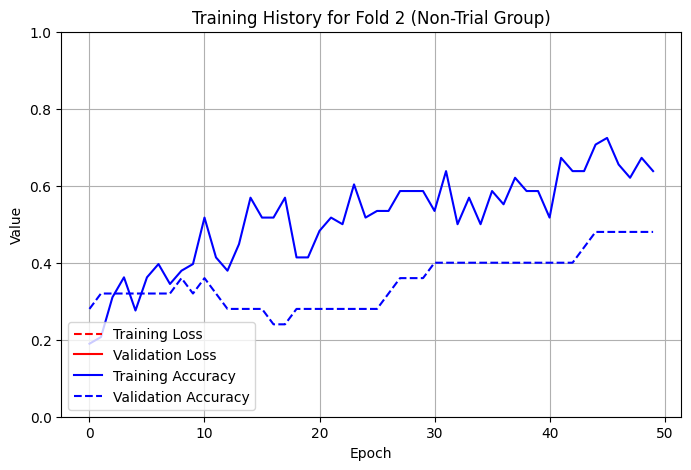

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


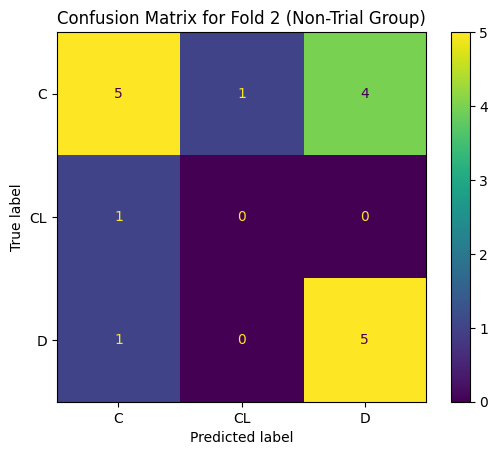

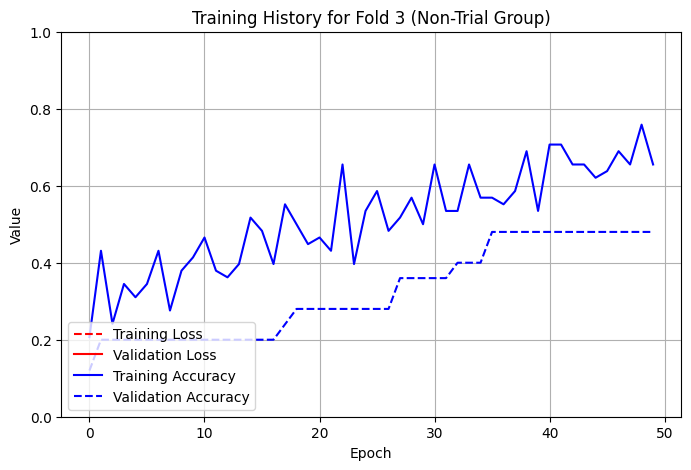

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


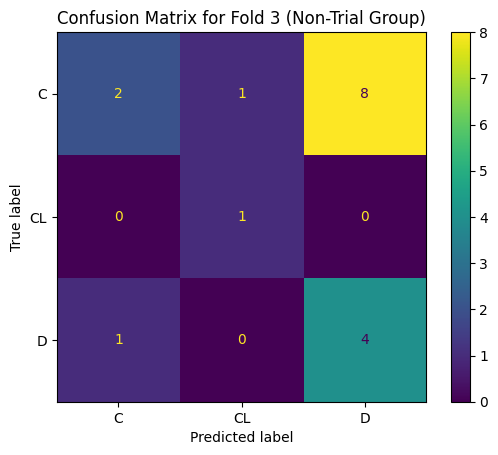

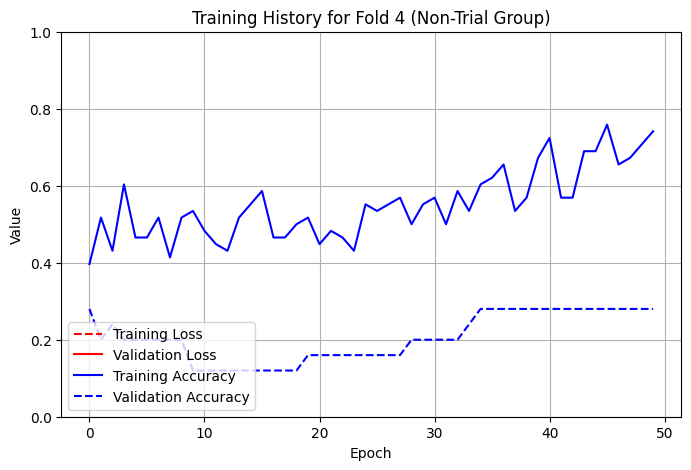

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


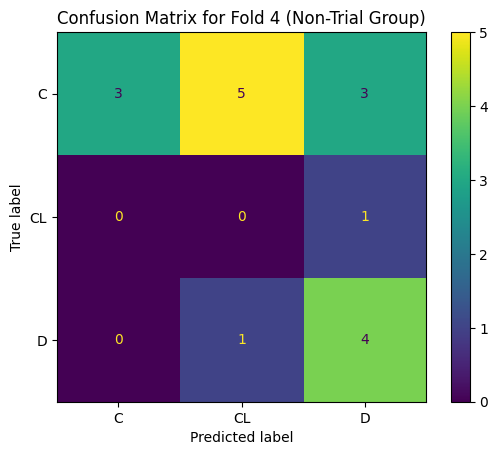

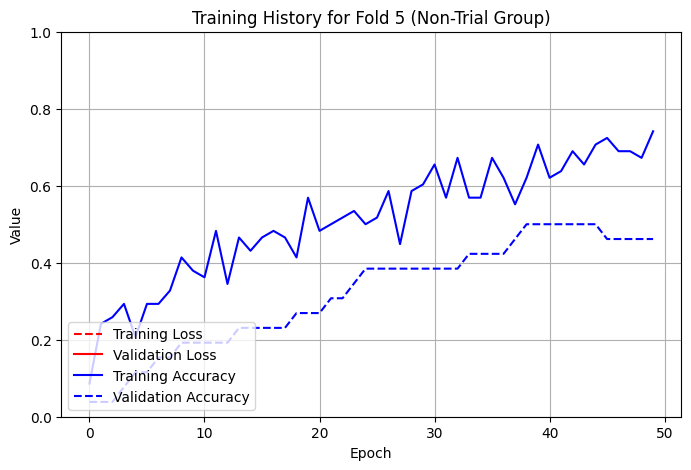

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


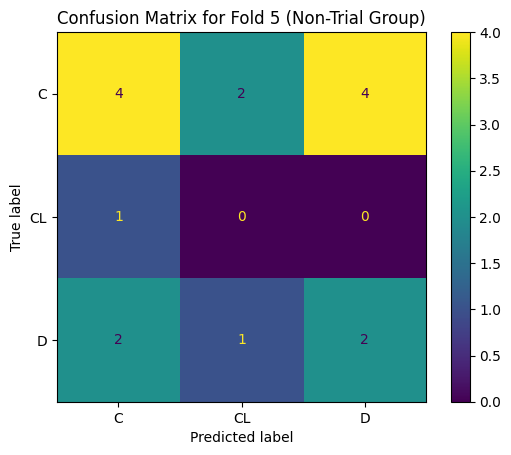

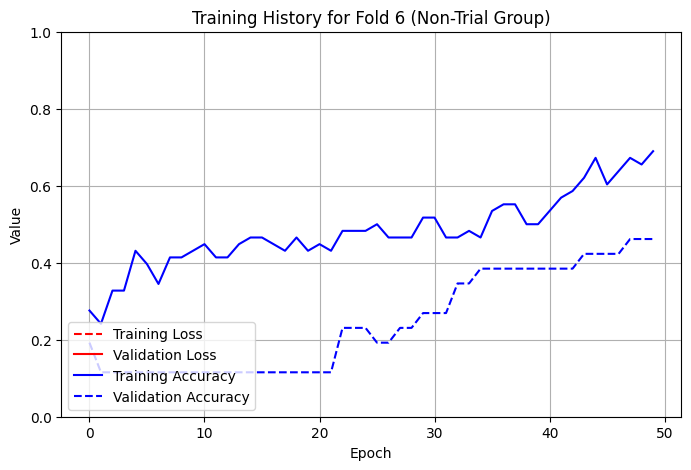

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


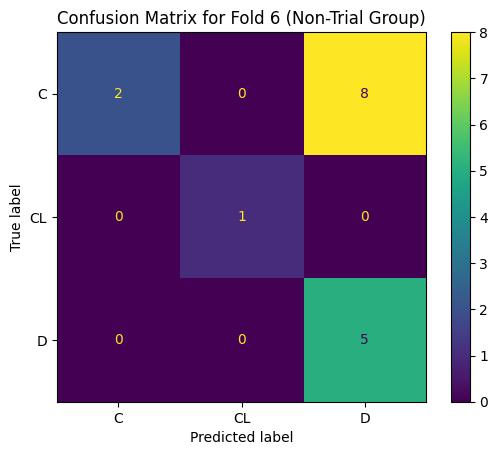

Results for Non-Trial Group:
Mean accuracy: 0.4889705882352941
Standard deviation of accuracy: 0.09989812428893509
Mean cost: 52.666666666666664
Standard deviation of cost: 12.81492185782739
Mean cost per instance: 3.2916666666666665
Standard deviation of cost per instance: 0.8009326161142118
--------------------------------------------------
Classification Report for the last fold:
              precision    recall  f1-score   support

           C       1.00      0.20      0.33        10
          CL       1.00      1.00      1.00         1
           D       0.38      1.00      0.56         5

    accuracy                           0.50        16
   macro avg       0.79      0.73      0.63        16
weighted avg       0.81      0.50      0.44        16



In [42]:
# Accuracy-based training

def deep(data, group_name, cost_matrix):
    target_column = 'Status'
    y = data[target_column]
    X = data.drop(columns=[target_column])

    # Encode categorical features
    for col in X.select_dtypes(include=['object']).columns:
        X[col] = LabelEncoder().fit_transform(X[col])

    # Encode the target variable
    y_encoder = LabelEncoder()
    y = y_encoder.fit_transform(y)
    num_classes = len(np.unique(y))

    # Scale features
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    # One-hot encode the target variable for softmax output
    y_onehot = to_categorical(y, num_classes=num_classes)

    # Ensure enough samples per class
    class_counts = np.bincount(y)
    min_samples_per_class = np.min(class_counts)
    n_splits = min(10, min_samples_per_class)
    if n_splits < 2:
        raise ValueError(f"Not enough samples for meaningful cross-validation. Minimum class count: {min_samples_per_class}")

    print(f"Using {n_splits} folds for {group_name}")


    # Define the MLP model with softmax output
    def create_model(input_dim, num_classes):
        model = Sequential([
            Input(shape=(input_dim,)),          # Define input shape explicitly
            Dense(64, activation='relu'),     # Hidden layer 1
            Dropout(0.3),                      # Dropout for regularization
            Dense(32, activation='relu'),      # Hidden layer 2
            Dropout(0.3),
            Dense(16, activation='relu'),      # Hidden layer 3
            Dense(num_classes, activation='softmax')  # Softmax for multiclass classification
        ])
        model.compile(optimizer=Adam(learning_rate=0.001),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
        return model

    # Cross-validation
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    accuracy_scores = []
    cost_scores = []

    for fold_idx, (train_index, test_index) in enumerate(skf.split(X, y), start=1):
        # Split the data
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y_onehot[train_index], y[test_index]

        class_weights = {
            0: 1.0,  # Weight for 'C'
            1: 5.0,  # Weight for 'CL'
            2: 2.0   # Weight for 'D'
        }

        # Create and train the model
        model = create_model(input_dim=X_train.shape[1], num_classes=num_classes)
        history = model.fit(X_train, y_train,class_weight=class_weights, epochs=50, batch_size=32, validation_split=0.3, verbose=0)

        # Plot training and validation metrics for this fold
        history_df = pd.DataFrame(history.history)
        plt.figure(figsize=(8, 5))
        plt.plot(history_df.index, history_df['loss'], 'r--', label='Training Loss')
        plt.plot(history_df.index, history_df['val_loss'], 'r-', label='Validation Loss')
        plt.plot(history_df.index, history_df['accuracy'], 'b-', label='Training Accuracy')
        plt.plot(history_df.index, history_df['val_accuracy'], 'b--', label='Validation Accuracy')
        plt.title(f"Training History for Fold {fold_idx} ({group_name} Group)")
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.ylim([0, 1])
        plt.grid(True)
        plt.legend(loc='lower left')
        plt.show()

        # Predict on the test set
        y_pred_prob = model.predict(X_test)
        y_pred = np.argmax(y_pred_prob, axis=1)

        # Evaluate the model
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_scores.append(accuracy)

        # Compute confusion matrix and cost
        confusion_mat = confusion_matrix(y_test, y_pred)

        # Pad confusion matrix to match cost matrix dimensions
        if confusion_mat.shape[0] < cost_matrix.shape[0]:
            confusion_mat = np.pad(confusion_mat,
                                   ((0, cost_matrix.shape[0] - confusion_mat.shape[0]),
                                    (0, cost_matrix.shape[1] - confusion_mat.shape[1])),
                                   mode='constant', constant_values=0)

        cost = np.sum(confusion_mat * np.transpose(cost_matrix))
        cost_scores.append(cost)

        # Plot confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=confusion_mat, display_labels=y_encoder.classes_)
        disp.plot()
        plt.title(f"Confusion Matrix for Fold {fold_idx} ({group_name} Group)")
        plt.show()

        # Calculate metrics across all folds
    divisor = len(y_test)
    cost_scores_per_instance = [x / divisor for x in cost_scores]

    # Print evaluation results
    print(f"Results for {group_name} Group:")
    print("Mean accuracy:", np.mean(accuracy_scores))
    print("Standard deviation of accuracy:", np.std(accuracy_scores))
    print("Mean cost:", np.mean(cost_scores))
    print("Standard deviation of cost:", np.std(cost_scores))
    print("Mean cost per instance:", np.mean(cost_scores_per_instance))
    print("Standard deviation of cost per instance:", np.std(cost_scores_per_instance))
    print("--------------------------------------------------")
    print("Classification Report for the last fold:")
    print(classification_report(y_test, y_pred, target_names=y_encoder.classes_, zero_division=0))

# Example cost matrix
cost_matrix = np.array(
    [[ 0,  8, 10],  # Predicted Censored
     [ 5,  0, 15],  # Predicted Transplant
     [ 5, 10,  0]]  # Predicted Death
)


deep(trial_group, "Trial", cost_matrix)
deep(non_trial_group, "Non-Trial", cost_matrix)



## Merged Groups

ACCURACY-TRAINED DECISION TREE
Using 10 folds for Combined Groups
Best parameters for DecisionTreeClassifier: {'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 2}
Decision Tree for Fold 1 (Combined Groups Group):


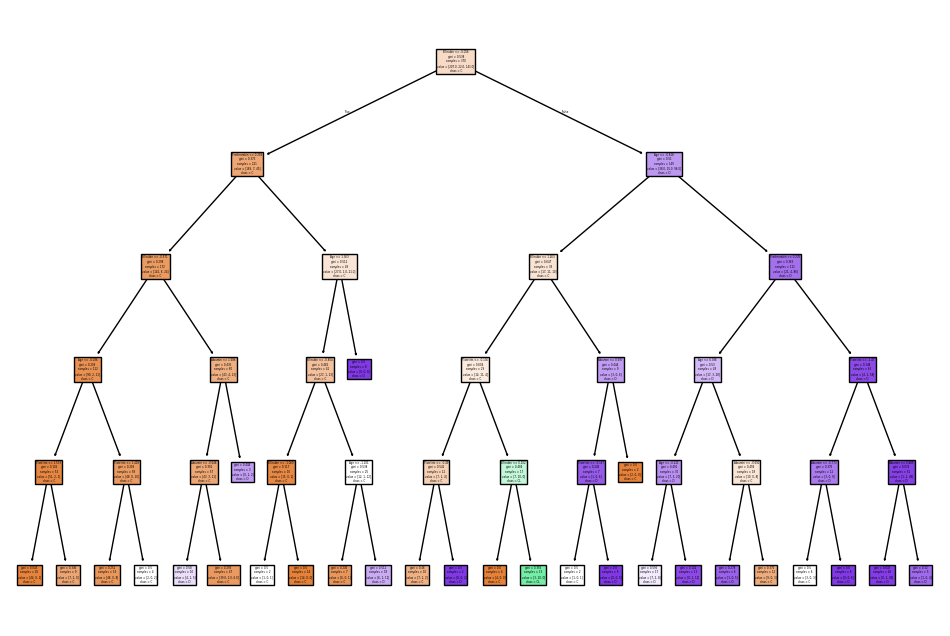

Confusion Matrix for Fold 1 (Combined Groups Group):


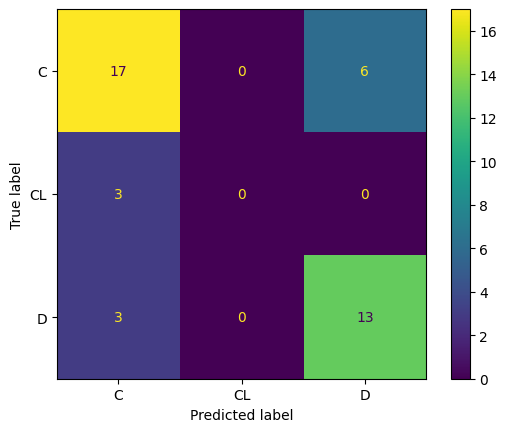

Confusion Matrix (Percentage) for Fold 1 (Combined Groups Group):
[[ 73.91304348   0.          26.08695652]
 [100.           0.           0.        ]
 [ 18.75         0.          81.25      ]]
--------------------------------------------------
Decision Tree for Fold 2 (Combined Groups Group):


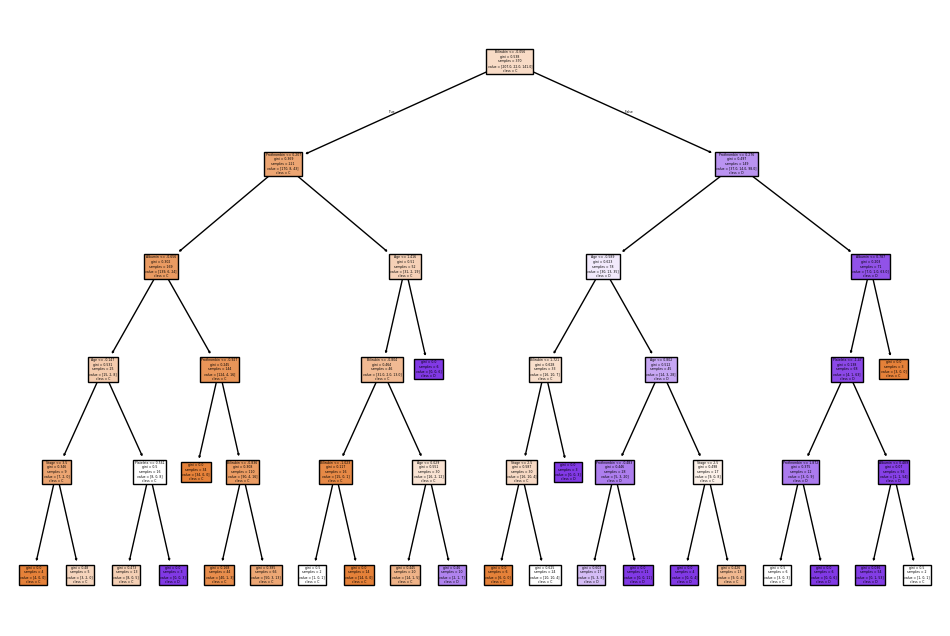

Confusion Matrix for Fold 2 (Combined Groups Group):


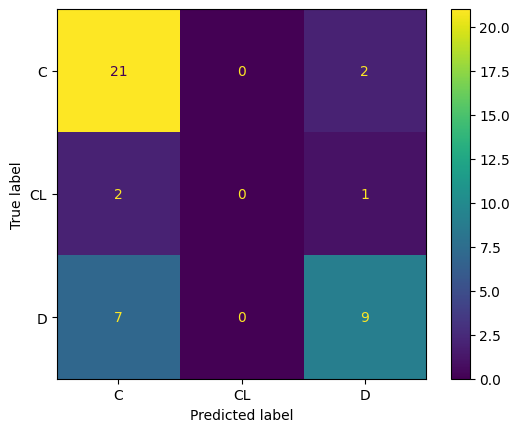

Confusion Matrix (Percentage) for Fold 2 (Combined Groups Group):
[[91.30434783  0.          8.69565217]
 [66.66666667  0.         33.33333333]
 [43.75        0.         56.25      ]]
--------------------------------------------------
Decision Tree for Fold 3 (Combined Groups Group):


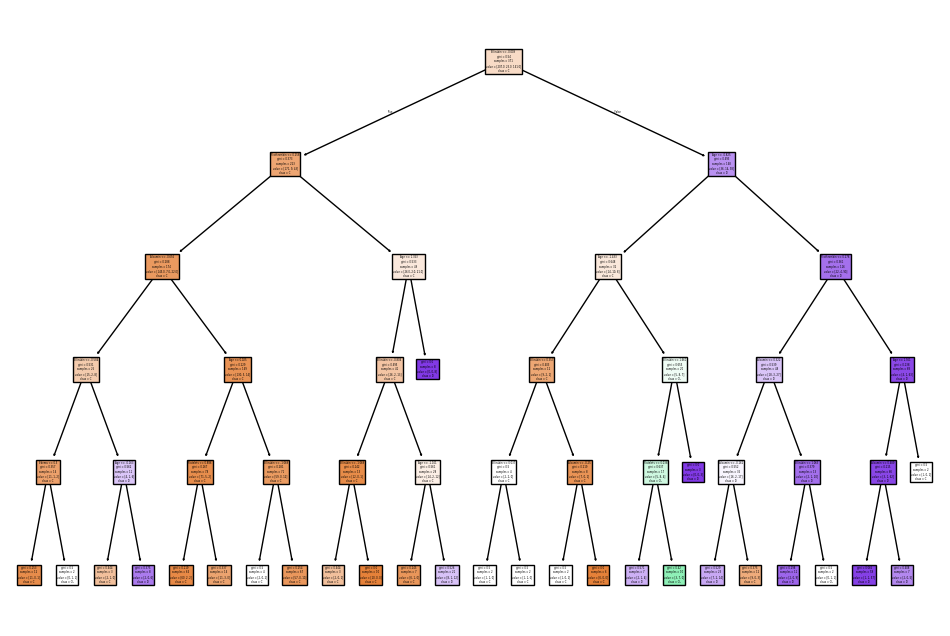

Confusion Matrix for Fold 3 (Combined Groups Group):


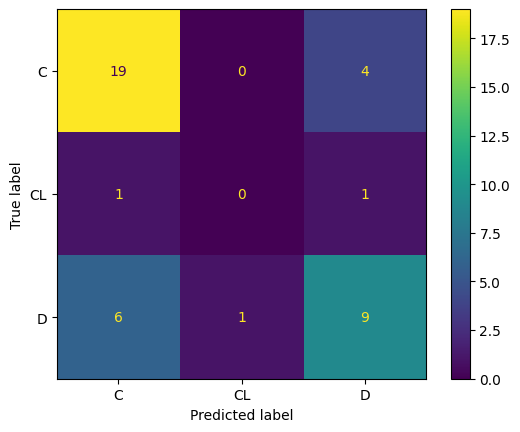

Confusion Matrix (Percentage) for Fold 3 (Combined Groups Group):
[[82.60869565  0.         17.39130435]
 [50.          0.         50.        ]
 [37.5         6.25       56.25      ]]
--------------------------------------------------
Decision Tree for Fold 4 (Combined Groups Group):


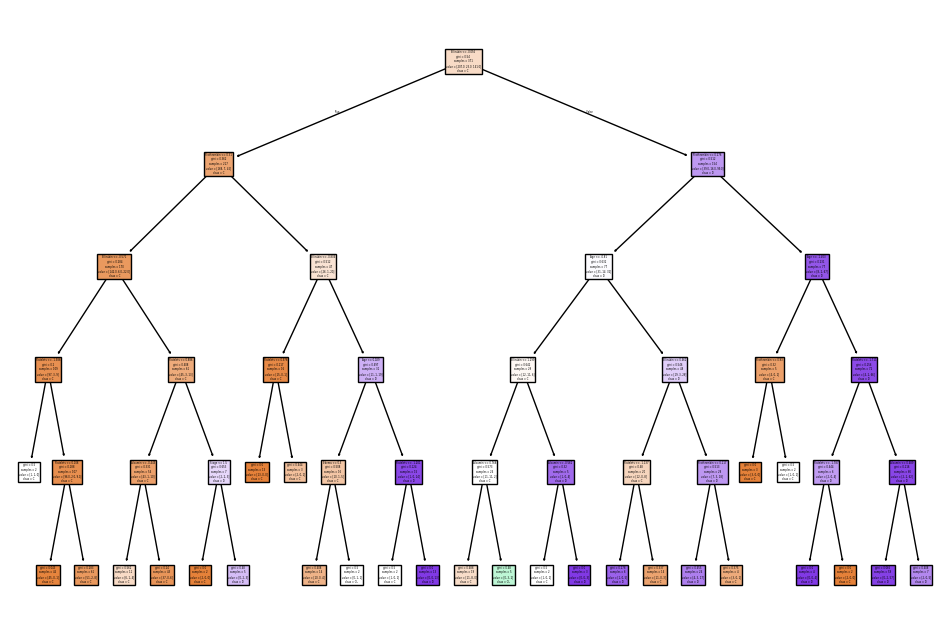

Confusion Matrix for Fold 4 (Combined Groups Group):


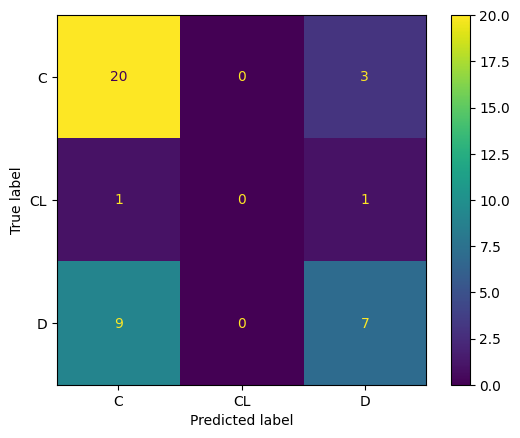

Confusion Matrix (Percentage) for Fold 4 (Combined Groups Group):
[[86.95652174  0.         13.04347826]
 [50.          0.         50.        ]
 [56.25        0.         43.75      ]]
--------------------------------------------------
Decision Tree for Fold 5 (Combined Groups Group):


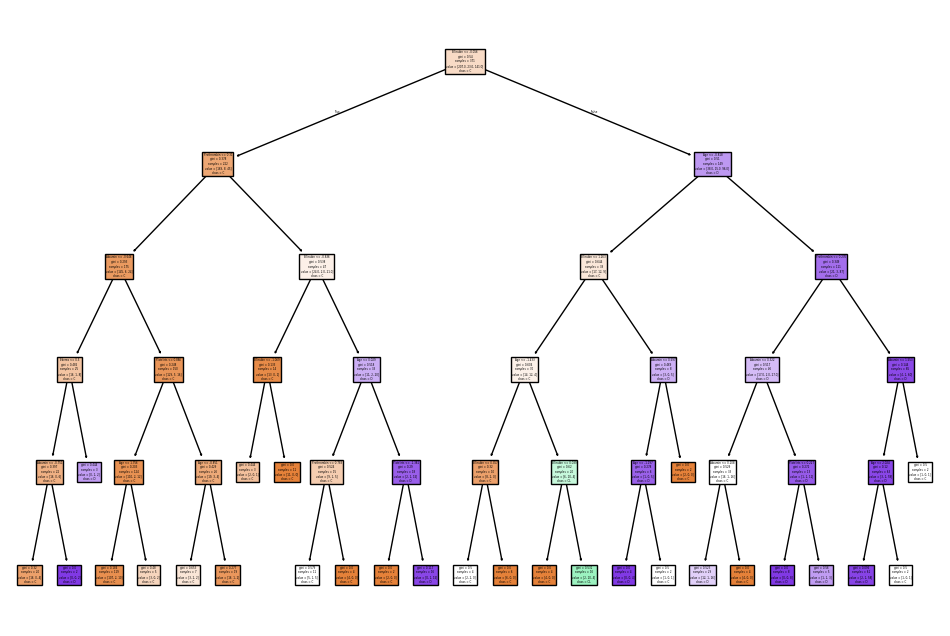

Confusion Matrix for Fold 5 (Combined Groups Group):


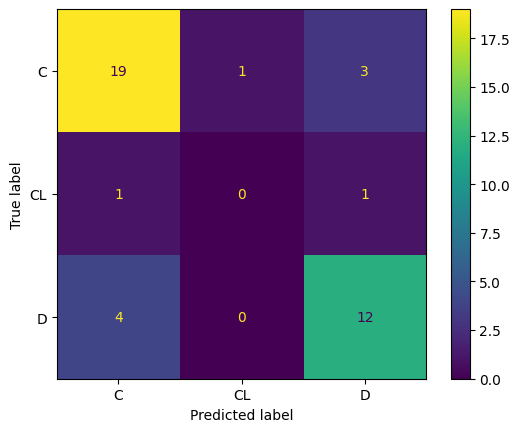

Confusion Matrix (Percentage) for Fold 5 (Combined Groups Group):
[[82.60869565  4.34782609 13.04347826]
 [50.          0.         50.        ]
 [25.          0.         75.        ]]
--------------------------------------------------
Decision Tree for Fold 6 (Combined Groups Group):


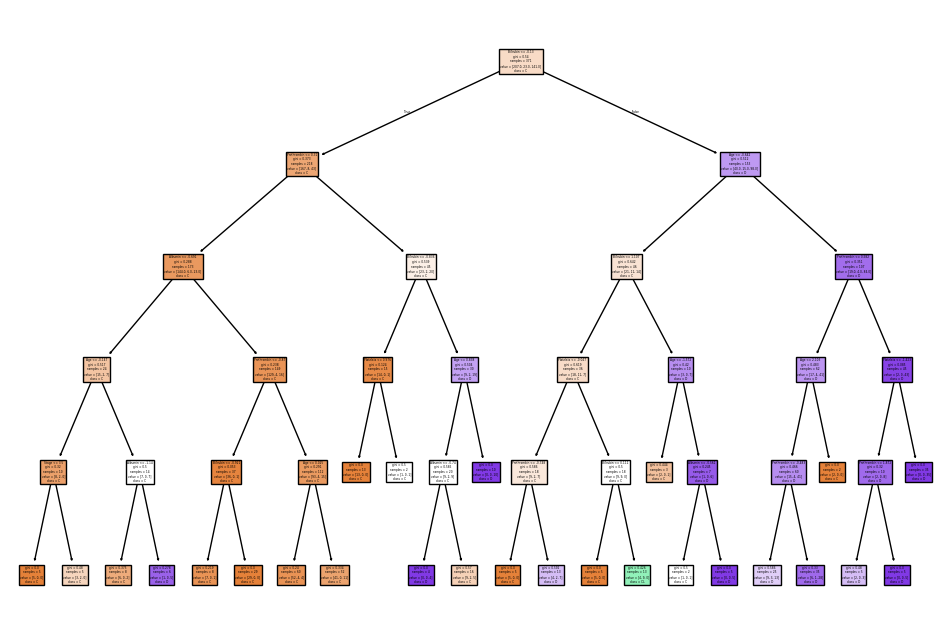

Confusion Matrix for Fold 6 (Combined Groups Group):


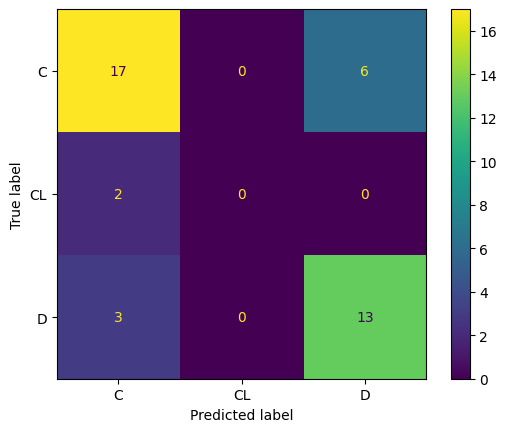

Confusion Matrix (Percentage) for Fold 6 (Combined Groups Group):
[[ 73.91304348   0.          26.08695652]
 [100.           0.           0.        ]
 [ 18.75         0.          81.25      ]]
--------------------------------------------------
Decision Tree for Fold 7 (Combined Groups Group):


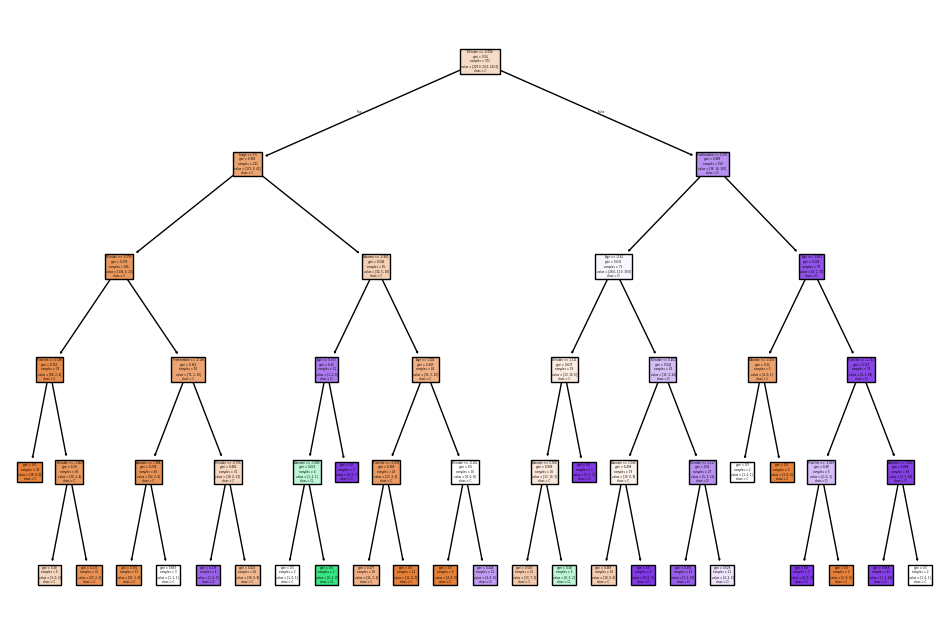

Confusion Matrix for Fold 7 (Combined Groups Group):


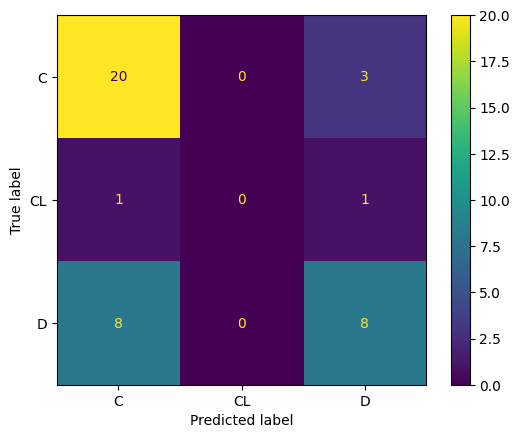

Confusion Matrix (Percentage) for Fold 7 (Combined Groups Group):
[[86.95652174  0.         13.04347826]
 [50.          0.         50.        ]
 [50.          0.         50.        ]]
--------------------------------------------------
Decision Tree for Fold 8 (Combined Groups Group):


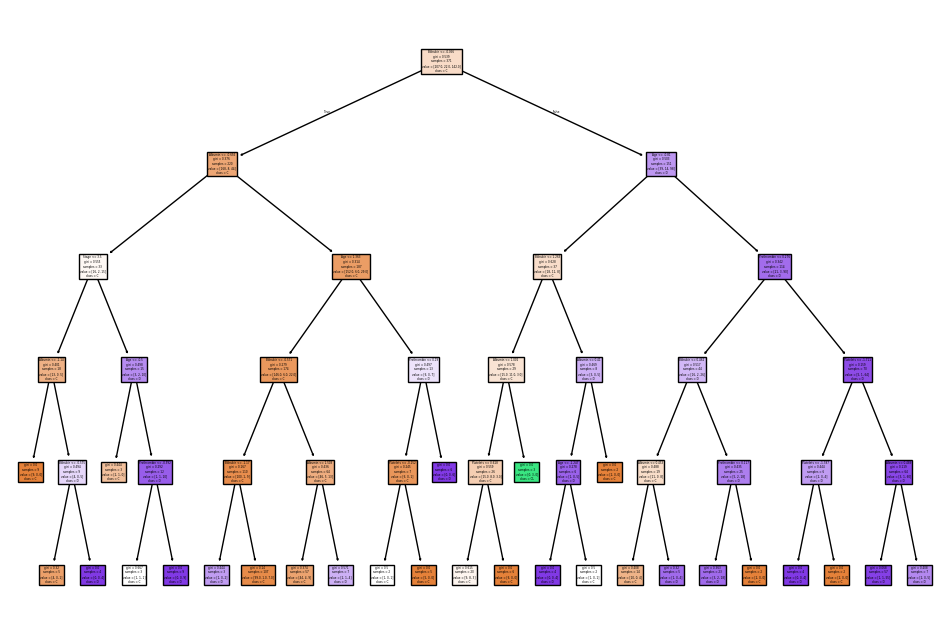

Confusion Matrix for Fold 8 (Combined Groups Group):


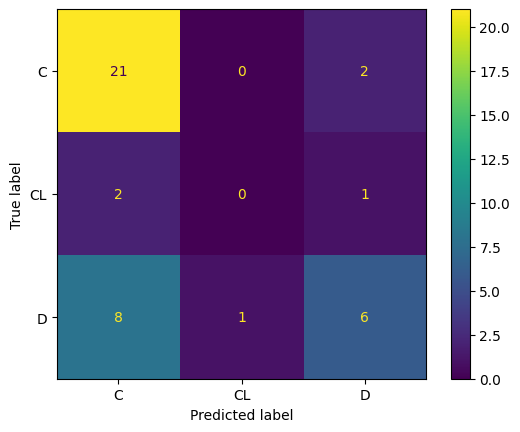

Confusion Matrix (Percentage) for Fold 8 (Combined Groups Group):
[[91.30434783  0.          8.69565217]
 [66.66666667  0.         33.33333333]
 [53.33333333  6.66666667 40.        ]]
--------------------------------------------------
Decision Tree for Fold 9 (Combined Groups Group):


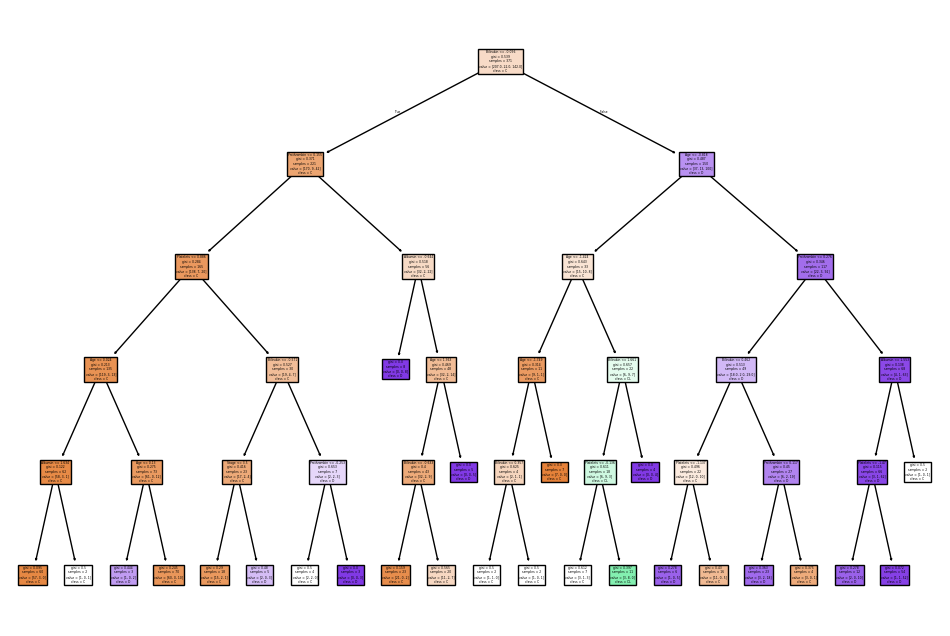

Confusion Matrix for Fold 9 (Combined Groups Group):


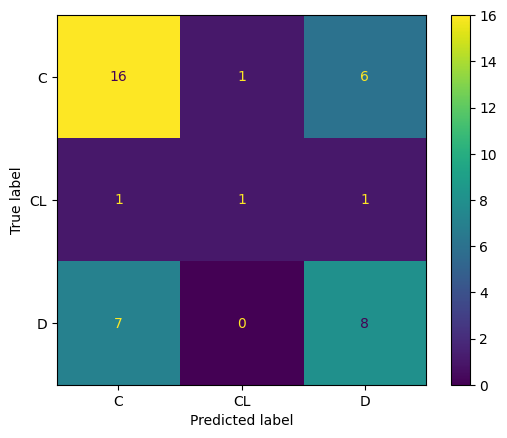

Confusion Matrix (Percentage) for Fold 9 (Combined Groups Group):
[[69.56521739  4.34782609 26.08695652]
 [33.33333333 33.33333333 33.33333333]
 [46.66666667  0.         53.33333333]]
--------------------------------------------------
Decision Tree for Fold 10 (Combined Groups Group):


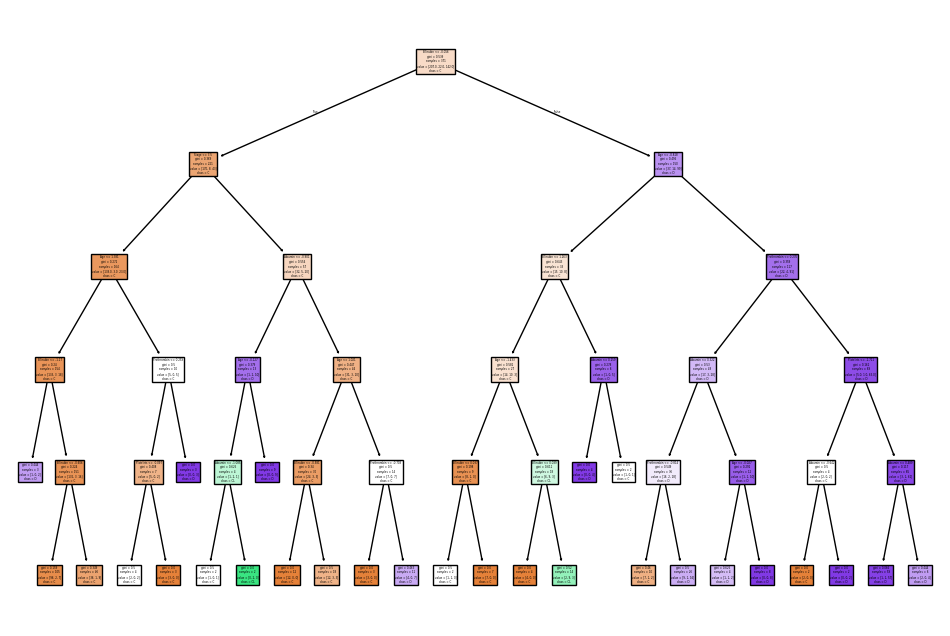

Confusion Matrix for Fold 10 (Combined Groups Group):


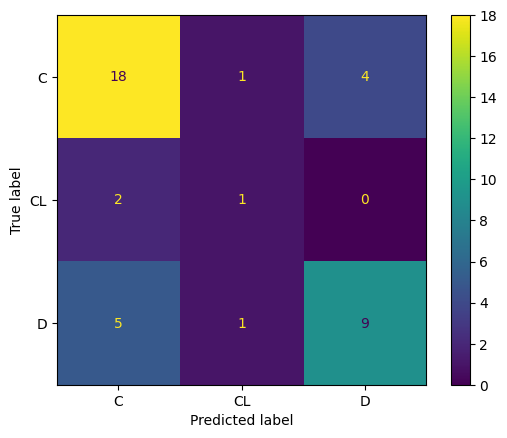

Confusion Matrix (Percentage) for Fold 10 (Combined Groups Group):
[[78.26086957  4.34782609 17.39130435]
 [66.66666667 33.33333333  0.        ]
 [33.33333333  6.66666667 60.        ]]
--------------------------------------------------
Results for Combined Groups Group:
Mean accuracy: 0.6891986062717769
Standard deviation of accuracy: 0.0398128414134793
Mean cost: 105.3
Standard deviation of cost: 18.61209284309532
Mean cost per instance: 2.5682926829268293
Standard deviation of cost per instance: 0.4539534839779346
--------------------------------------------------
COST-TRAINED DECISION TREE
Using 10 folds for Combined Groups
Best parameters for DecisionTreeClassifier: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}
Decision Tree for Fold 1 (Combined Groups Group):


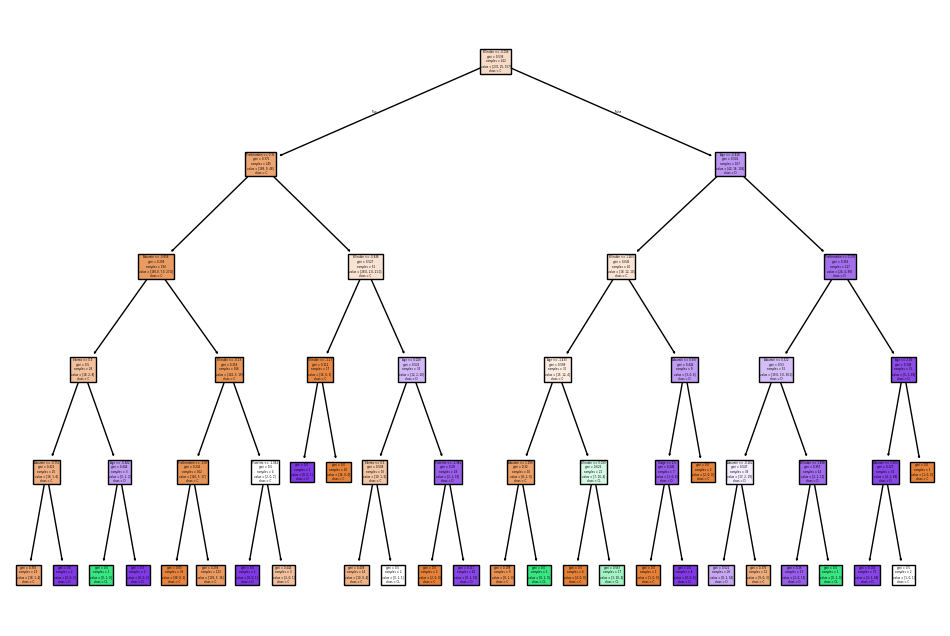

Confusion Matrix for Fold 1 (Combined Groups Group):


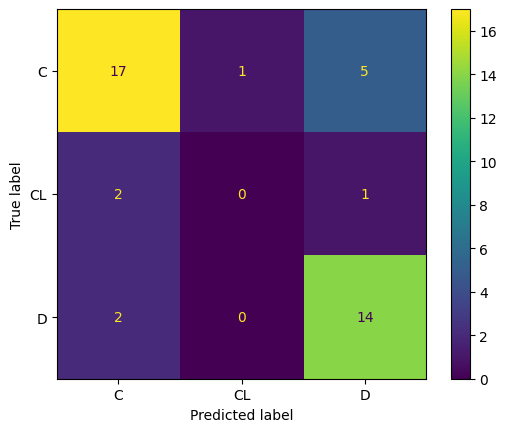

Confusion Matrix (Percentage) for Fold 1 (Combined Groups Group):
[[73.91304348  4.34782609 21.73913043]
 [66.66666667  0.         33.33333333]
 [12.5         0.         87.5       ]]
--------------------------------------------------
Decision Tree for Fold 2 (Combined Groups Group):


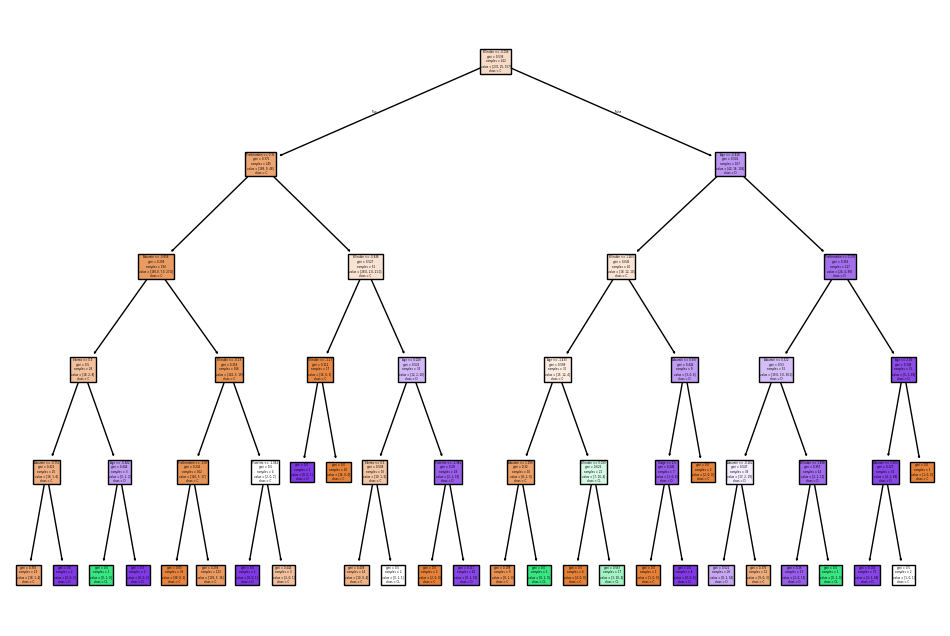

Confusion Matrix for Fold 2 (Combined Groups Group):


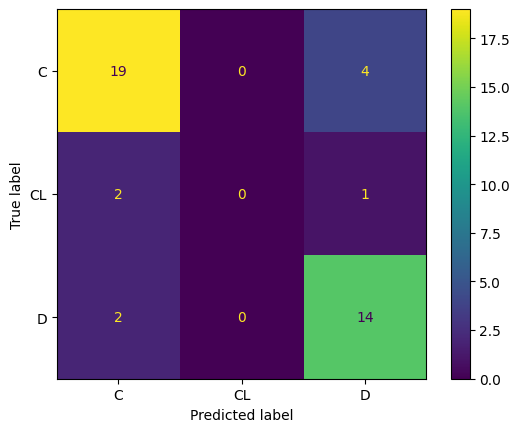

Confusion Matrix (Percentage) for Fold 2 (Combined Groups Group):
[[82.60869565  0.         17.39130435]
 [66.66666667  0.         33.33333333]
 [12.5         0.         87.5       ]]
--------------------------------------------------
Decision Tree for Fold 3 (Combined Groups Group):


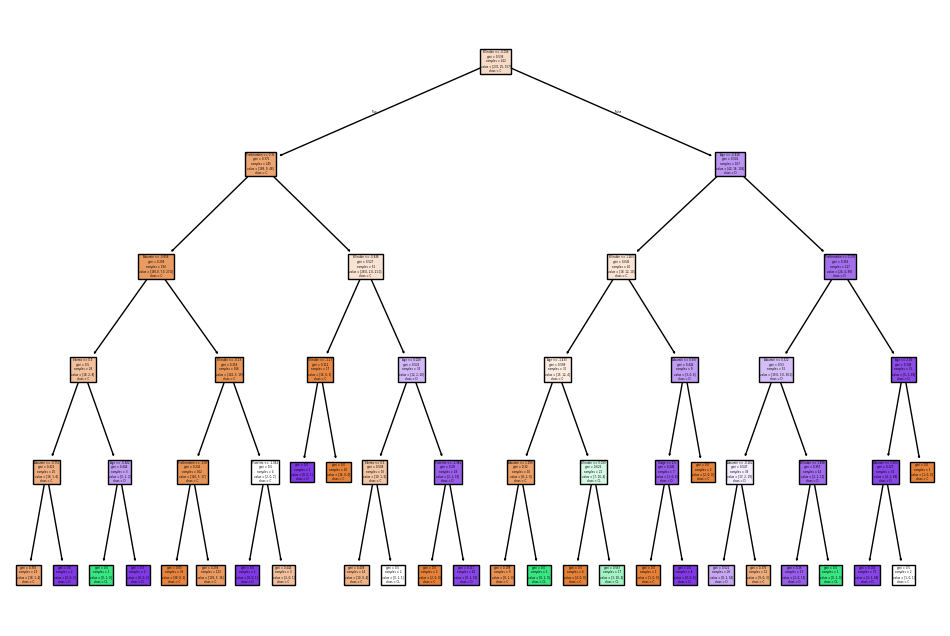

Confusion Matrix for Fold 3 (Combined Groups Group):


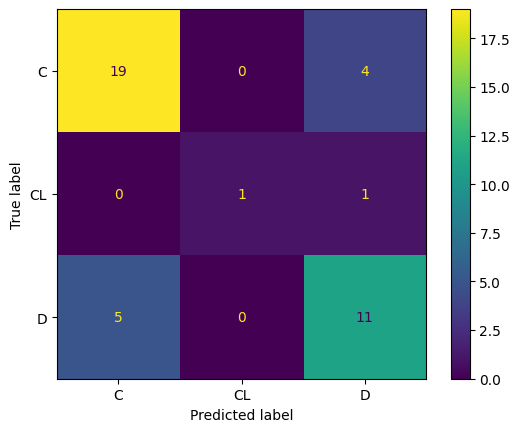

Confusion Matrix (Percentage) for Fold 3 (Combined Groups Group):
[[82.60869565  0.         17.39130435]
 [ 0.         50.         50.        ]
 [31.25        0.         68.75      ]]
--------------------------------------------------
Decision Tree for Fold 4 (Combined Groups Group):


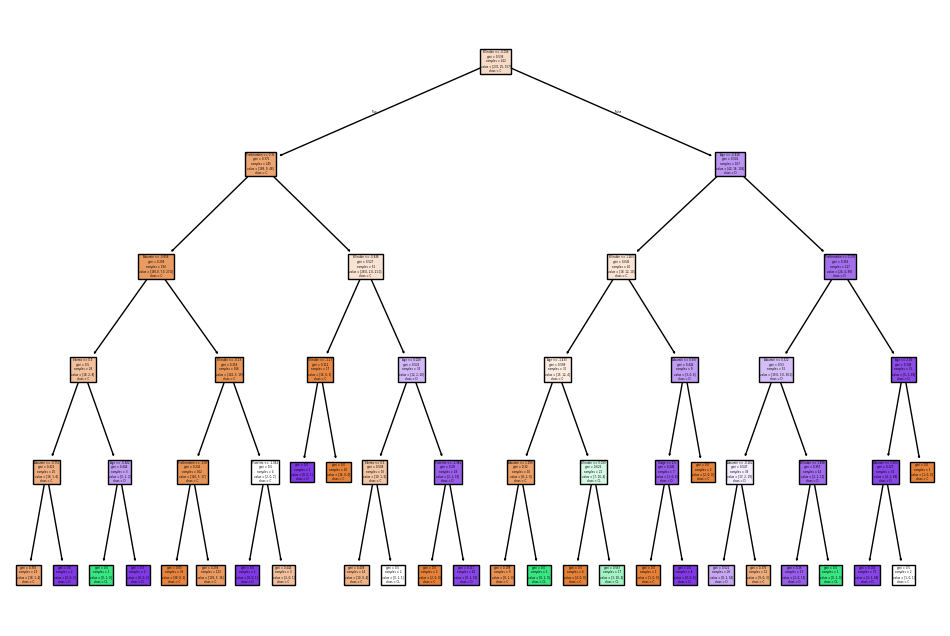

Confusion Matrix for Fold 4 (Combined Groups Group):


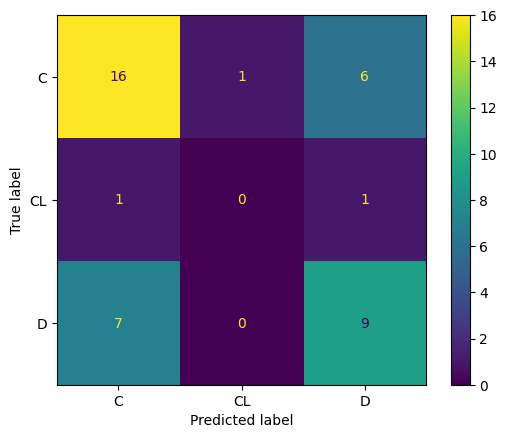

Confusion Matrix (Percentage) for Fold 4 (Combined Groups Group):
[[69.56521739  4.34782609 26.08695652]
 [50.          0.         50.        ]
 [43.75        0.         56.25      ]]
--------------------------------------------------
Decision Tree for Fold 5 (Combined Groups Group):


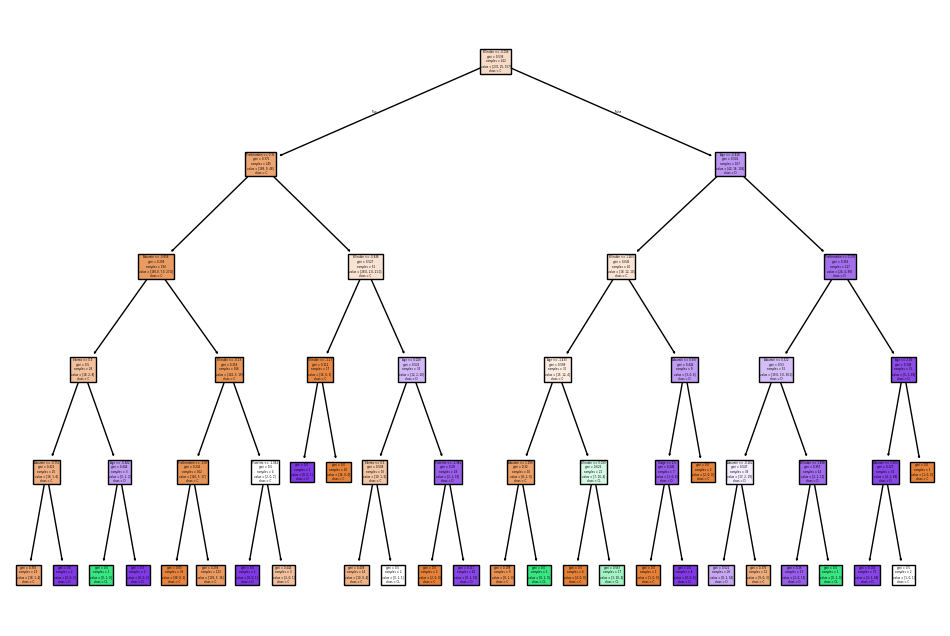

Confusion Matrix for Fold 5 (Combined Groups Group):


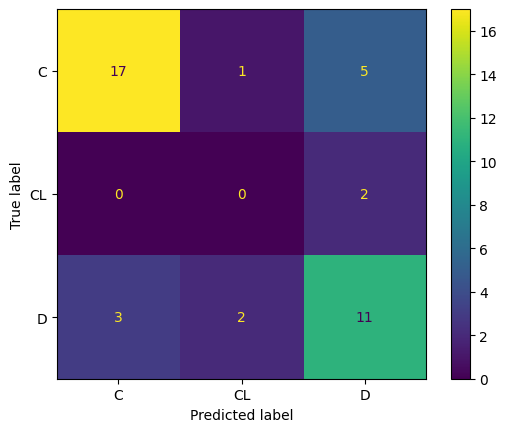

Confusion Matrix (Percentage) for Fold 5 (Combined Groups Group):
[[ 73.91304348   4.34782609  21.73913043]
 [  0.           0.         100.        ]
 [ 18.75        12.5         68.75      ]]
--------------------------------------------------
Decision Tree for Fold 6 (Combined Groups Group):


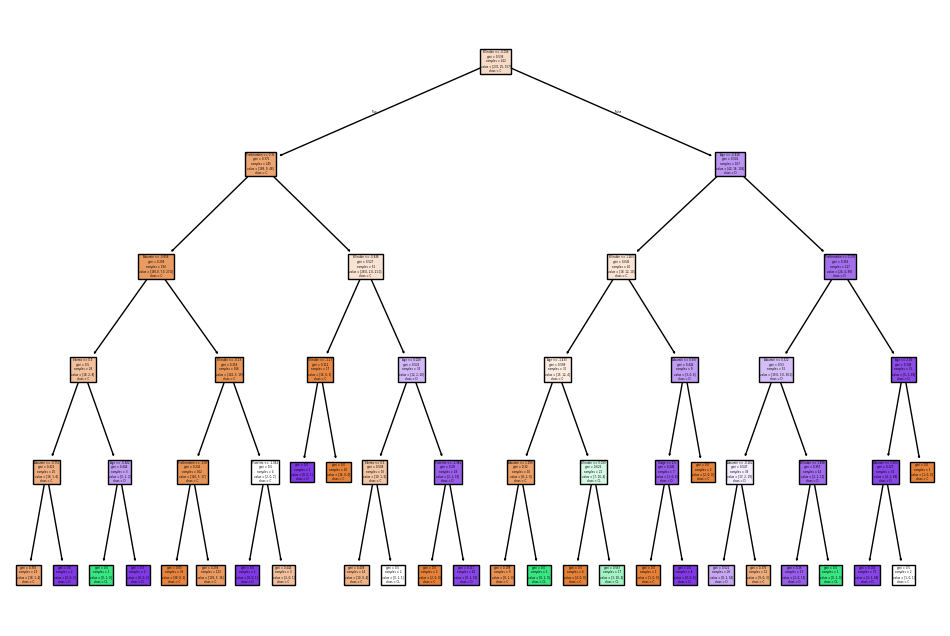

Confusion Matrix for Fold 6 (Combined Groups Group):


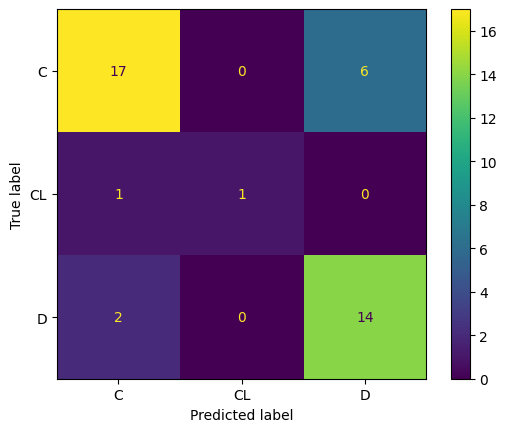

Confusion Matrix (Percentage) for Fold 6 (Combined Groups Group):
[[73.91304348  0.         26.08695652]
 [50.         50.          0.        ]
 [12.5         0.         87.5       ]]
--------------------------------------------------
Decision Tree for Fold 7 (Combined Groups Group):


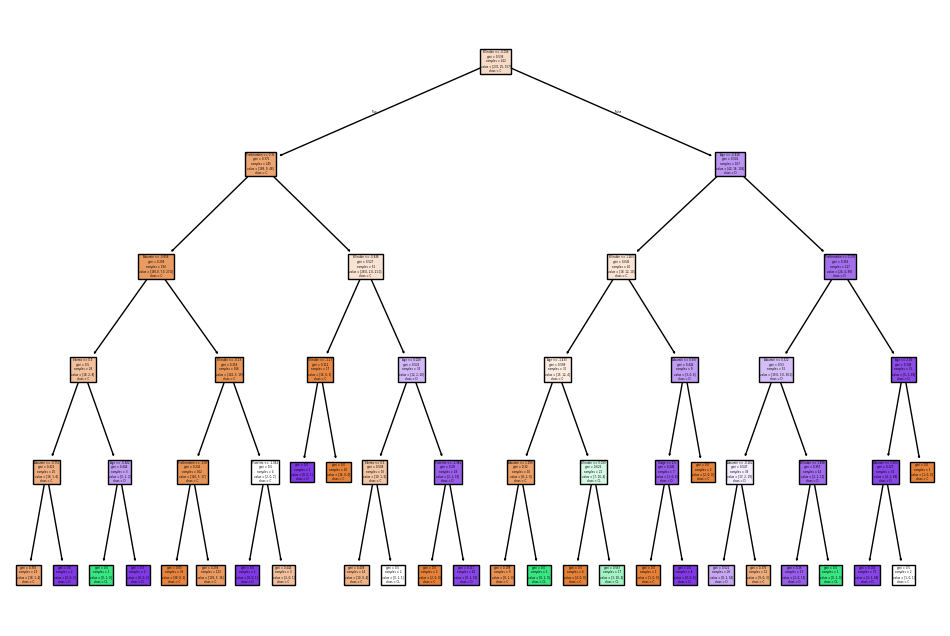

Confusion Matrix for Fold 7 (Combined Groups Group):


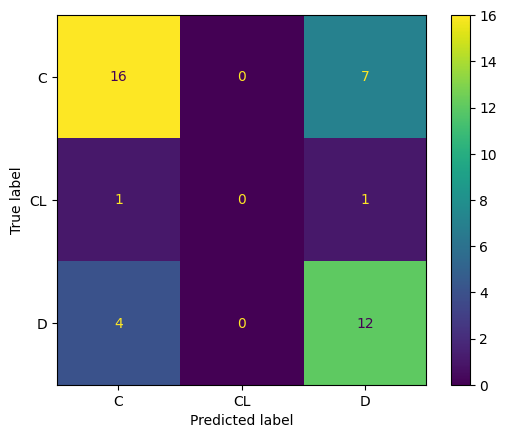

Confusion Matrix (Percentage) for Fold 7 (Combined Groups Group):
[[69.56521739  0.         30.43478261]
 [50.          0.         50.        ]
 [25.          0.         75.        ]]
--------------------------------------------------
Decision Tree for Fold 8 (Combined Groups Group):


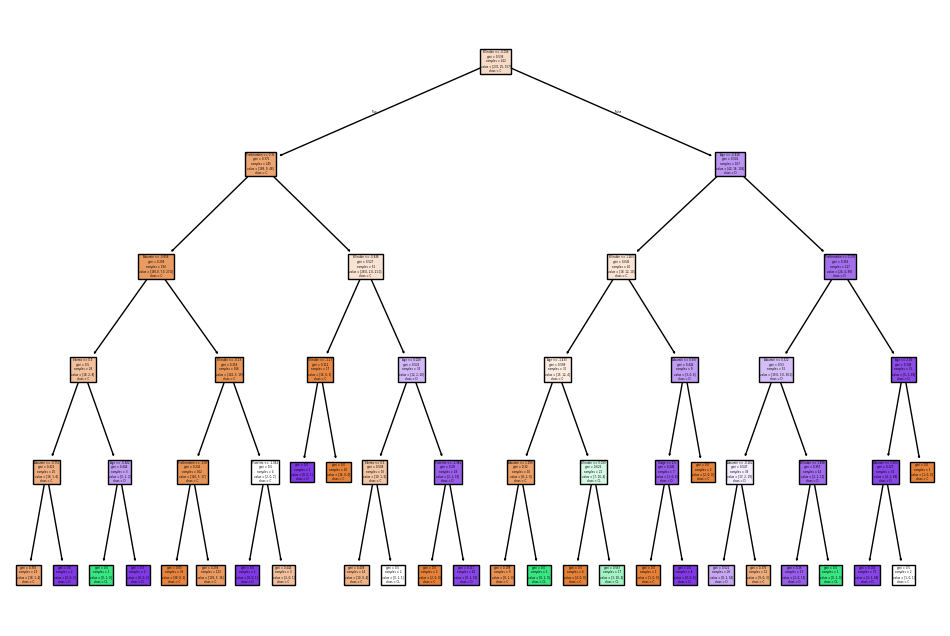

Confusion Matrix for Fold 8 (Combined Groups Group):


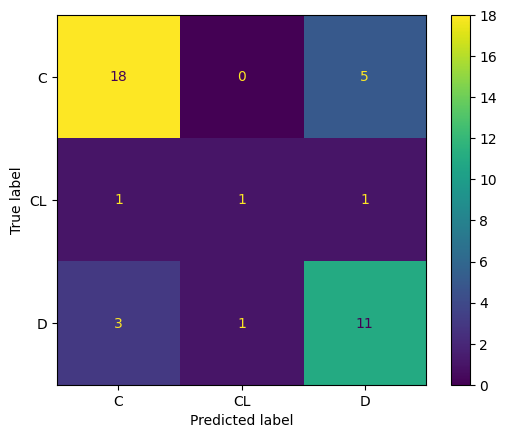

Confusion Matrix (Percentage) for Fold 8 (Combined Groups Group):
[[78.26086957  0.         21.73913043]
 [33.33333333 33.33333333 33.33333333]
 [20.          6.66666667 73.33333333]]
--------------------------------------------------
Decision Tree for Fold 9 (Combined Groups Group):


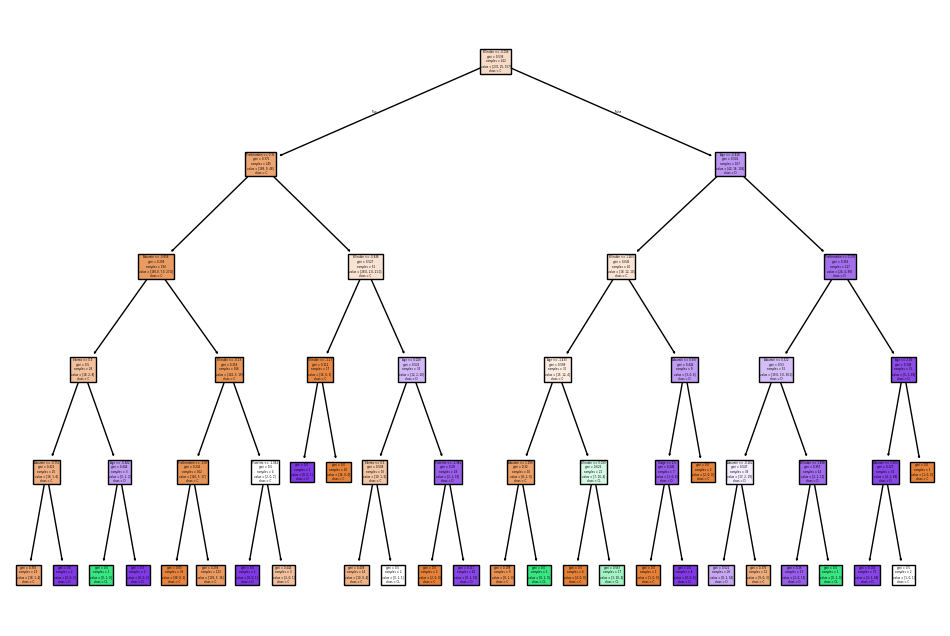

Confusion Matrix for Fold 9 (Combined Groups Group):


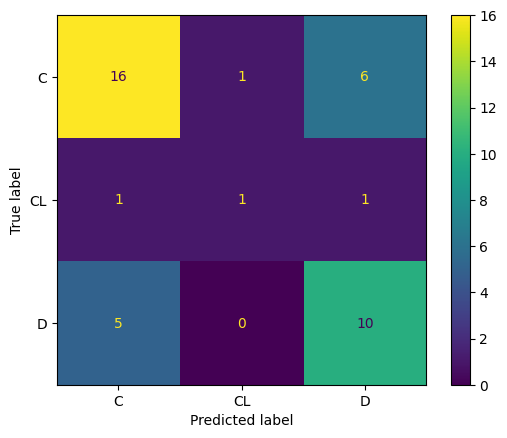

Confusion Matrix (Percentage) for Fold 9 (Combined Groups Group):
[[69.56521739  4.34782609 26.08695652]
 [33.33333333 33.33333333 33.33333333]
 [33.33333333  0.         66.66666667]]
--------------------------------------------------
Decision Tree for Fold 10 (Combined Groups Group):


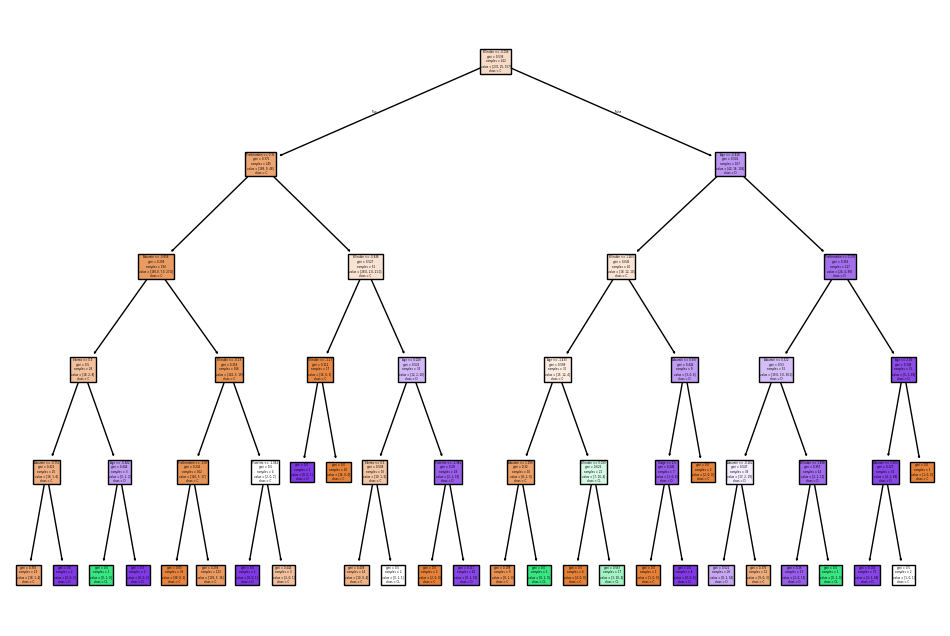

Confusion Matrix for Fold 10 (Combined Groups Group):


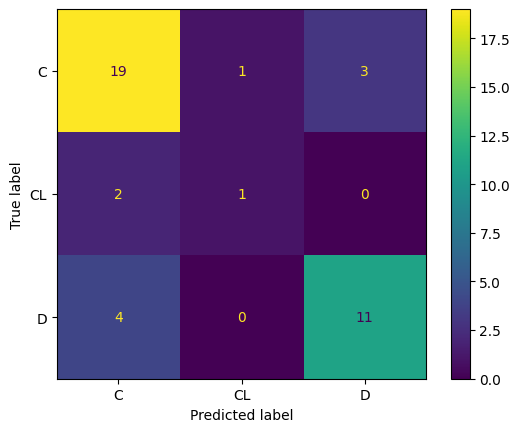

Confusion Matrix (Percentage) for Fold 10 (Combined Groups Group):
[[82.60869565  4.34782609 13.04347826]
 [66.66666667 33.33333333  0.        ]
 [26.66666667  0.         73.33333333]]
--------------------------------------------------
Results for Combined Groups Group:
Mean accuracy: 0.7182346109175377
Standard deviation of accuracy: 0.054494818075674405
Mean cost: 87.3
Standard deviation of cost: 19.20963300013824
Mean cost per instance: 2.129268292682927
Standard deviation of cost per instance: 0.4685276341497131
--------------------------------------------------
ACCURACY-TRAINED NAIVE BAYES
Using 10 folds for Combined Groups
Confusion Matrix for Fold 1 (Combined Groups Group):


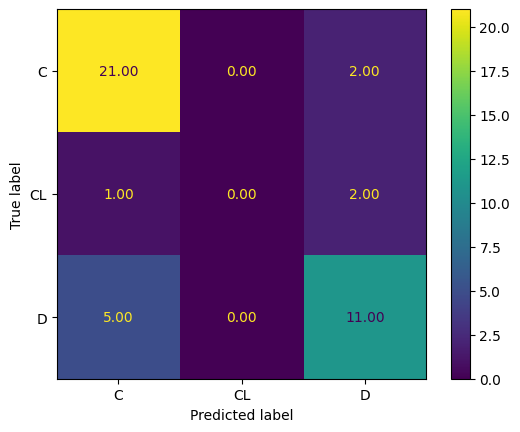

Confusion Matrix (Percentage) for Fold 1 (Combined Groups Group):
[[91.30434783  0.          8.69565217]
 [33.33333333  0.         66.66666667]
 [31.25        0.         68.75      ]]
--------------------------------------------------
Confusion Matrix for Fold 2 (Combined Groups Group):


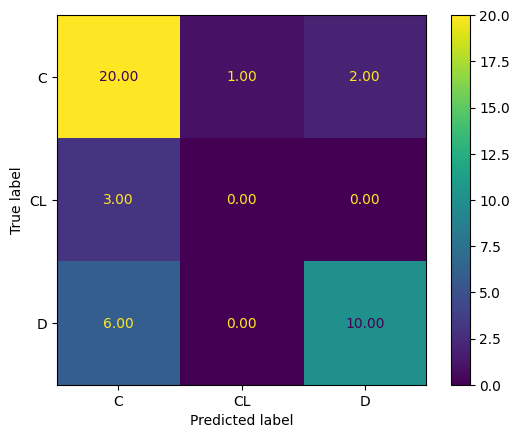

Confusion Matrix (Percentage) for Fold 2 (Combined Groups Group):
[[ 86.95652174   4.34782609   8.69565217]
 [100.           0.           0.        ]
 [ 37.5          0.          62.5       ]]
--------------------------------------------------
Confusion Matrix for Fold 3 (Combined Groups Group):


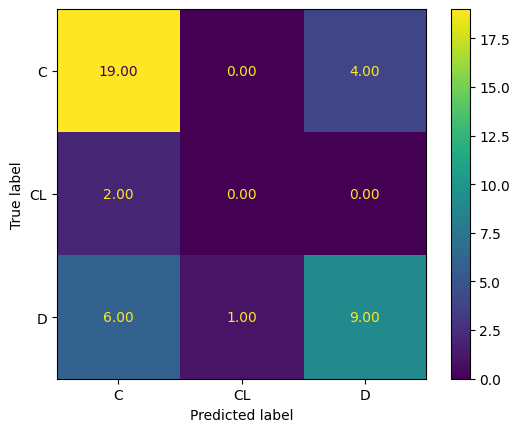

Confusion Matrix (Percentage) for Fold 3 (Combined Groups Group):
[[ 82.60869565   0.          17.39130435]
 [100.           0.           0.        ]
 [ 37.5          6.25        56.25      ]]
--------------------------------------------------
Confusion Matrix for Fold 4 (Combined Groups Group):


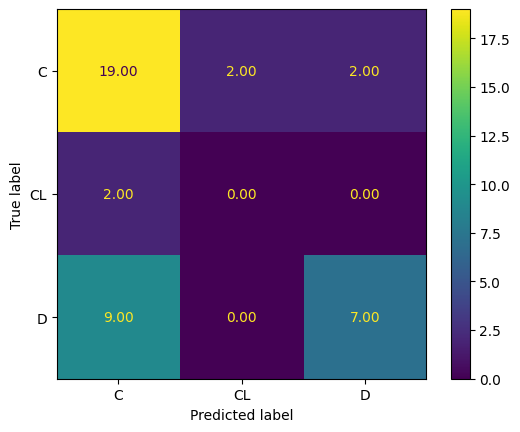

Confusion Matrix (Percentage) for Fold 4 (Combined Groups Group):
[[ 82.60869565   8.69565217   8.69565217]
 [100.           0.           0.        ]
 [ 56.25         0.          43.75      ]]
--------------------------------------------------
Confusion Matrix for Fold 5 (Combined Groups Group):


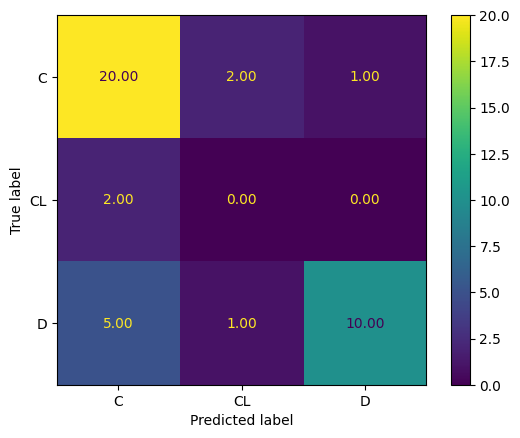

Confusion Matrix (Percentage) for Fold 5 (Combined Groups Group):
[[ 86.95652174   8.69565217   4.34782609]
 [100.           0.           0.        ]
 [ 31.25         6.25        62.5       ]]
--------------------------------------------------
Confusion Matrix for Fold 6 (Combined Groups Group):


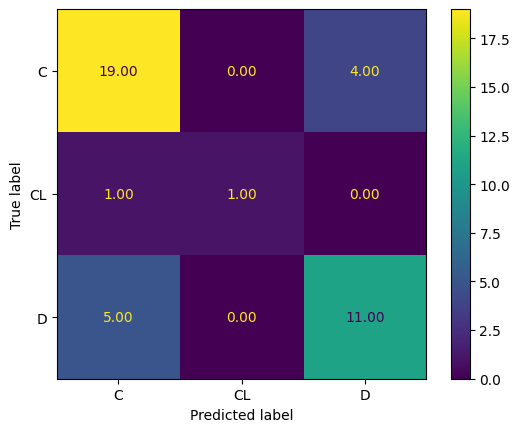

Confusion Matrix (Percentage) for Fold 6 (Combined Groups Group):
[[82.60869565  0.         17.39130435]
 [50.         50.          0.        ]
 [31.25        0.         68.75      ]]
--------------------------------------------------
Confusion Matrix for Fold 7 (Combined Groups Group):


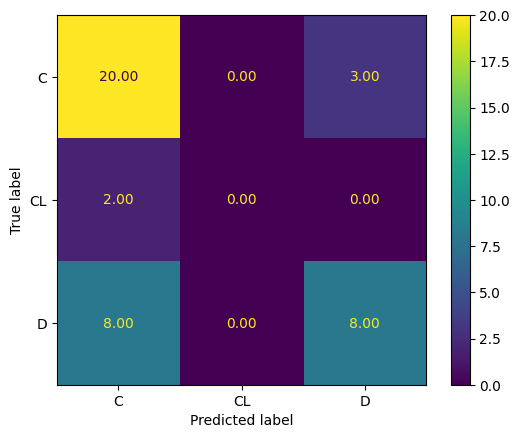

Confusion Matrix (Percentage) for Fold 7 (Combined Groups Group):
[[ 86.95652174   0.          13.04347826]
 [100.           0.           0.        ]
 [ 50.           0.          50.        ]]
--------------------------------------------------
Confusion Matrix for Fold 8 (Combined Groups Group):


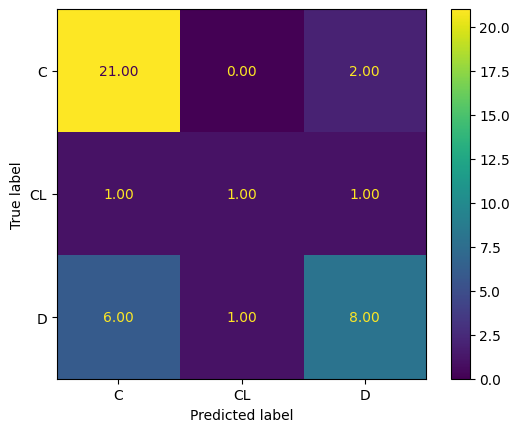

Confusion Matrix (Percentage) for Fold 8 (Combined Groups Group):
[[91.30434783  0.          8.69565217]
 [33.33333333 33.33333333 33.33333333]
 [40.          6.66666667 53.33333333]]
--------------------------------------------------
Confusion Matrix for Fold 9 (Combined Groups Group):


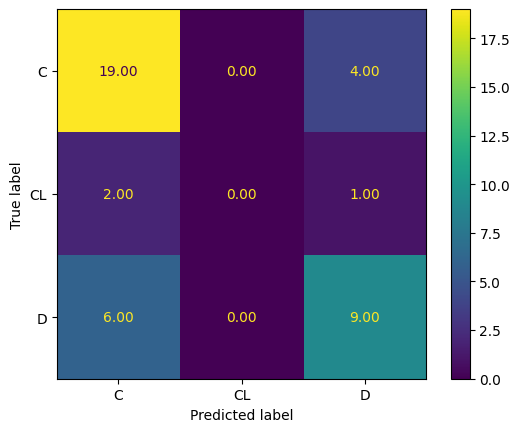

Confusion Matrix (Percentage) for Fold 9 (Combined Groups Group):
[[82.60869565  0.         17.39130435]
 [66.66666667  0.         33.33333333]
 [40.          0.         60.        ]]
--------------------------------------------------
Confusion Matrix for Fold 10 (Combined Groups Group):


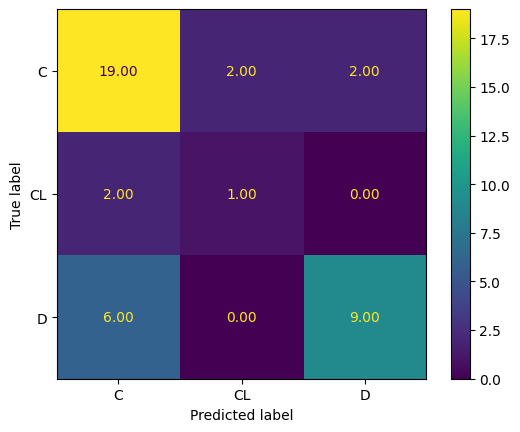

Confusion Matrix (Percentage) for Fold 10 (Combined Groups Group):
[[82.60869565  8.69565217  8.69565217]
 [66.66666667 33.33333333  0.        ]
 [40.          0.         60.        ]]
--------------------------------------------------
Results for Combined Groups Group:
Mean accuracy: 0.7085946573751452
Standard deviation of accuracy: 0.03704047443471461
Mean cost: 101.4
Standard deviation of cost: 12.666491226855209
Mean cost per instance: 2.473170731707317
Standard deviation of cost per instance: 0.3089388104111027
--------------------------------------------------
COST-TRAINED NAIVE BAYES
Using 10 folds for Combined Groups
Best parameters for GaussianNB: {'var_smoothing': 1e-09}
Confusion Matrix for Fold 1 (Combined Groups Group):


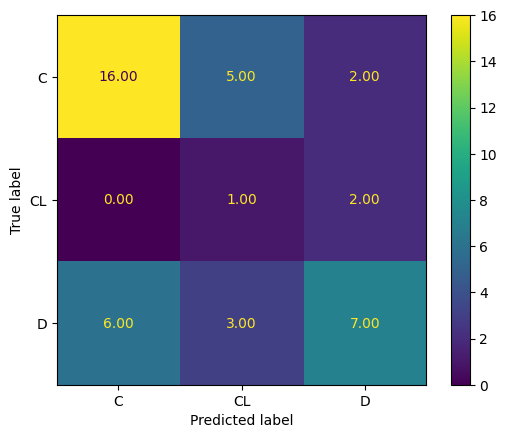

Confusion Matrix (Percentage) for Fold 1 (Combined Groups Group):
[[69.56521739 21.73913043  8.69565217]
 [ 0.         33.33333333 66.66666667]
 [37.5        18.75       43.75      ]]
--------------------------------------------------
Confusion Matrix for Fold 2 (Combined Groups Group):


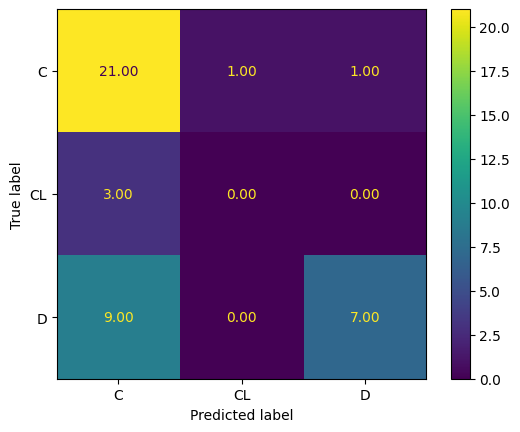

Confusion Matrix (Percentage) for Fold 2 (Combined Groups Group):
[[ 91.30434783   4.34782609   4.34782609]
 [100.           0.           0.        ]
 [ 56.25         0.          43.75      ]]
--------------------------------------------------
Confusion Matrix for Fold 3 (Combined Groups Group):


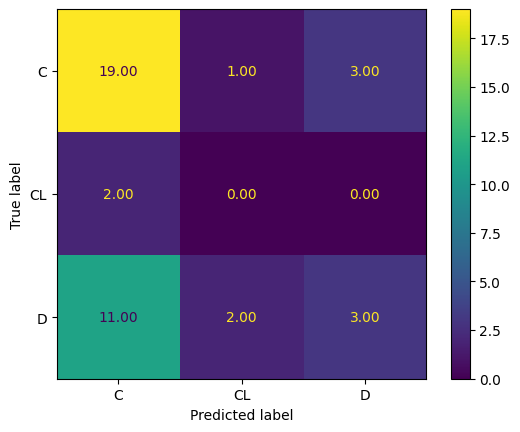

Confusion Matrix (Percentage) for Fold 3 (Combined Groups Group):
[[ 82.60869565   4.34782609  13.04347826]
 [100.           0.           0.        ]
 [ 68.75        12.5         18.75      ]]
--------------------------------------------------
Confusion Matrix for Fold 4 (Combined Groups Group):


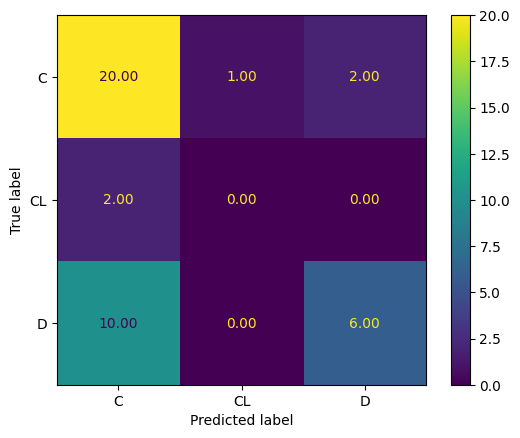

Confusion Matrix (Percentage) for Fold 4 (Combined Groups Group):
[[ 86.95652174   4.34782609   8.69565217]
 [100.           0.           0.        ]
 [ 62.5          0.          37.5       ]]
--------------------------------------------------
Confusion Matrix for Fold 5 (Combined Groups Group):


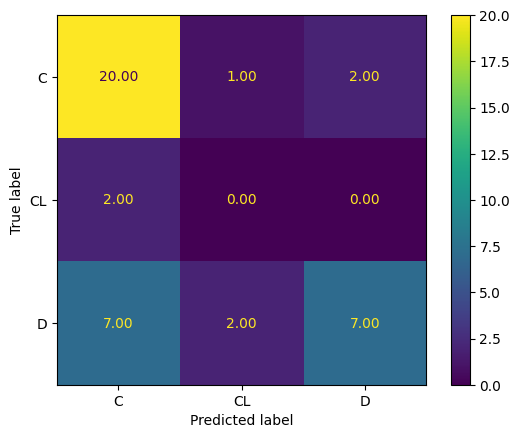

Confusion Matrix (Percentage) for Fold 5 (Combined Groups Group):
[[ 86.95652174   4.34782609   8.69565217]
 [100.           0.           0.        ]
 [ 43.75        12.5         43.75      ]]
--------------------------------------------------
Confusion Matrix for Fold 6 (Combined Groups Group):


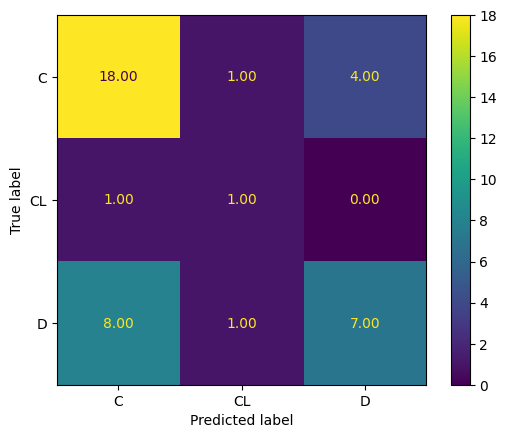

Confusion Matrix (Percentage) for Fold 6 (Combined Groups Group):
[[78.26086957  4.34782609 17.39130435]
 [50.         50.          0.        ]
 [50.          6.25       43.75      ]]
--------------------------------------------------
Confusion Matrix for Fold 7 (Combined Groups Group):


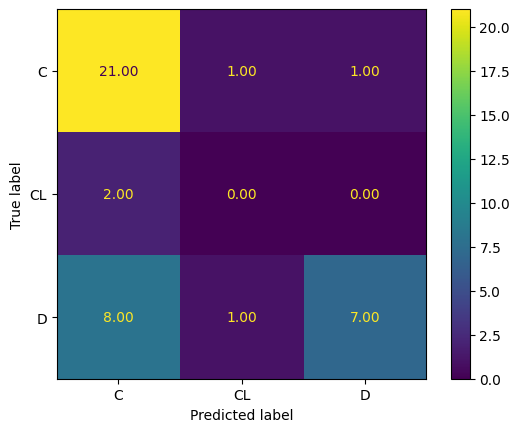

Confusion Matrix (Percentage) for Fold 7 (Combined Groups Group):
[[ 91.30434783   4.34782609   4.34782609]
 [100.           0.           0.        ]
 [ 50.           6.25        43.75      ]]
--------------------------------------------------
Confusion Matrix for Fold 8 (Combined Groups Group):


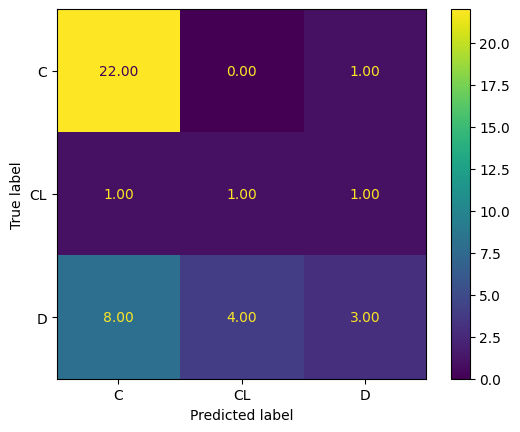

Confusion Matrix (Percentage) for Fold 8 (Combined Groups Group):
[[95.65217391  0.          4.34782609]
 [33.33333333 33.33333333 33.33333333]
 [53.33333333 26.66666667 20.        ]]
--------------------------------------------------
Confusion Matrix for Fold 9 (Combined Groups Group):


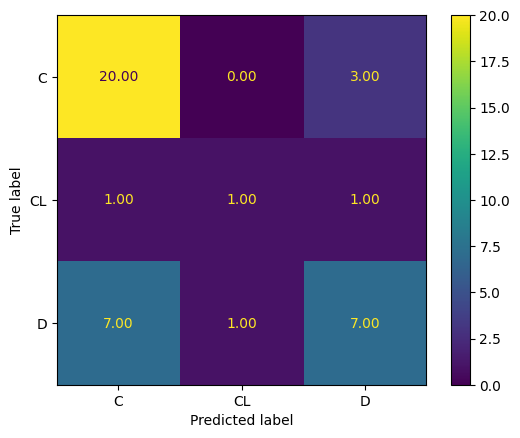

Confusion Matrix (Percentage) for Fold 9 (Combined Groups Group):
[[86.95652174  0.         13.04347826]
 [33.33333333 33.33333333 33.33333333]
 [46.66666667  6.66666667 46.66666667]]
--------------------------------------------------
Confusion Matrix for Fold 10 (Combined Groups Group):


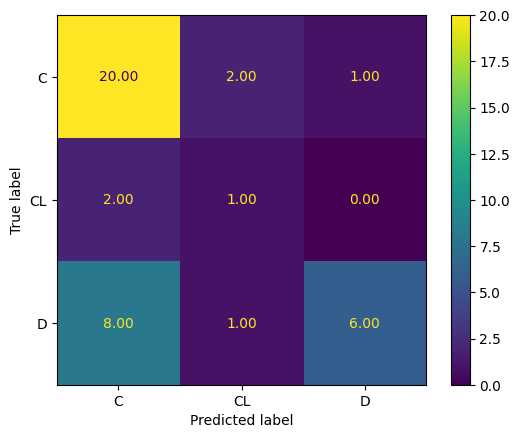

Confusion Matrix (Percentage) for Fold 10 (Combined Groups Group):
[[86.95652174  8.69565217  4.34782609]
 [66.66666667 33.33333333  0.        ]
 [53.33333333  6.66666667 40.        ]]
--------------------------------------------------
Results for Combined Groups Group:
Mean accuracy: 0.6360046457607432
Standard deviation of accuracy: 0.04519241221597506
Mean cost: 137.8
Standard deviation of cost: 19.4411933790084
Mean cost per instance: 3.3609756097560974
Standard deviation of cost per instance: 0.4741754482684976
--------------------------------------------------
ACCURACY-TRAINED NEURAL NETWORK: 1 LAYER
Using 10 folds for Combined Groups


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


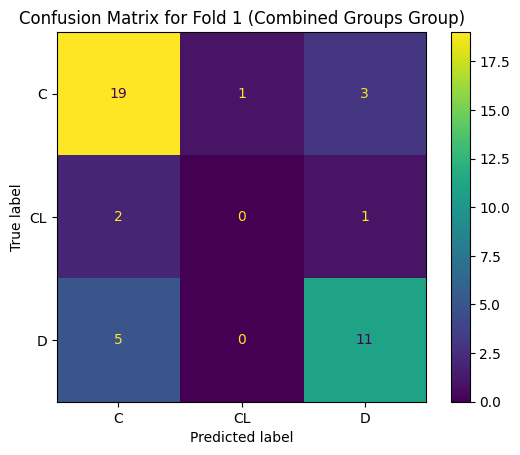

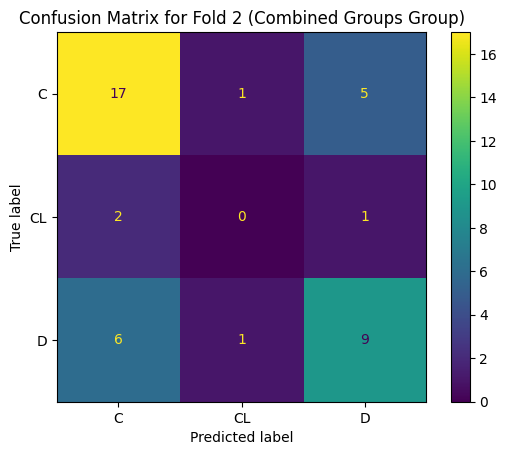

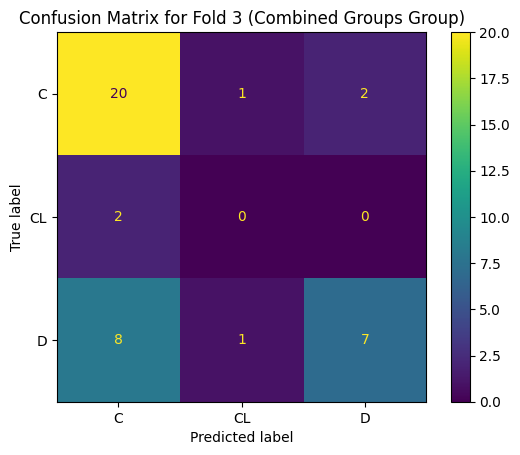

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


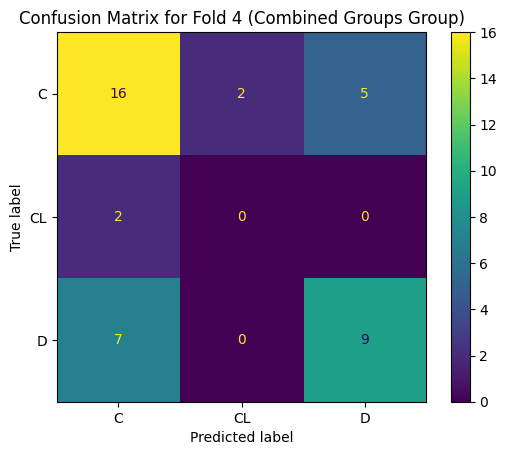

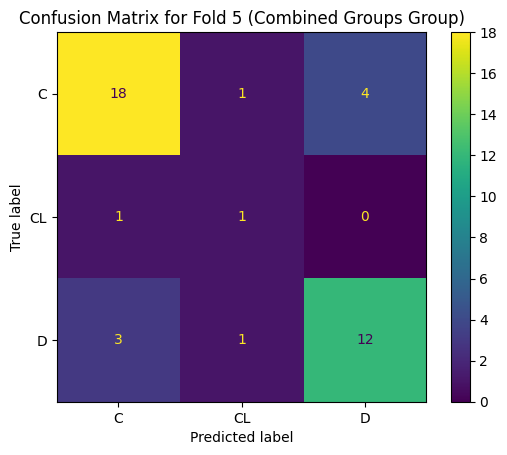

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


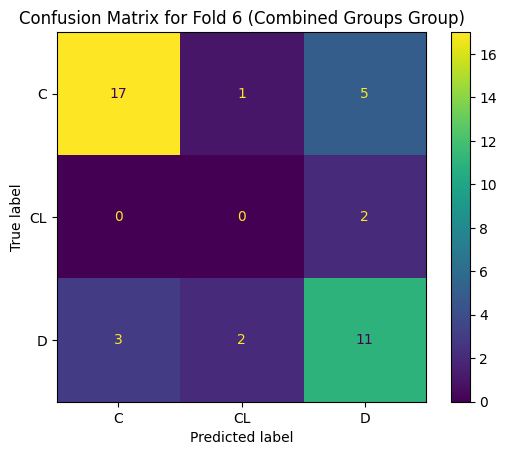

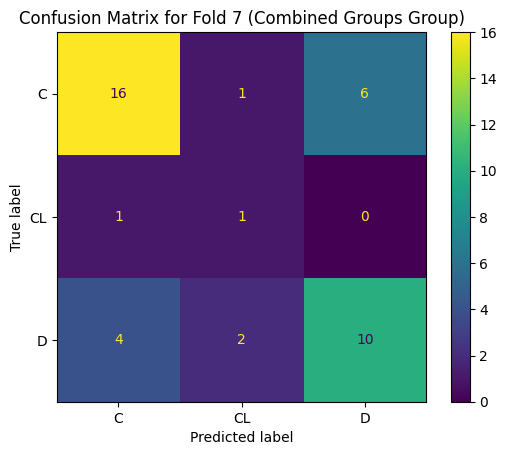

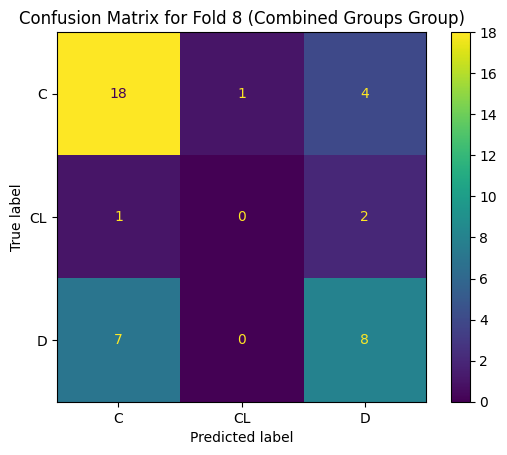

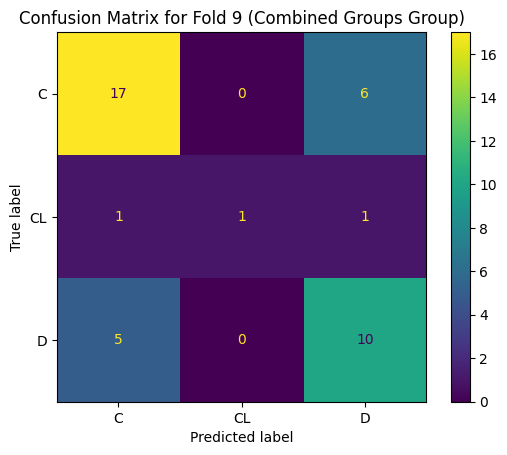

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


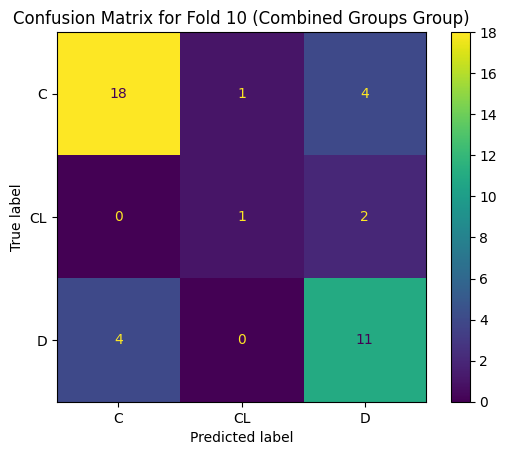

Results for Combined Groups Group:
Mean accuracy: 0.6747967479674796
Standard deviation of accuracy: 0.045890851900730265
Mean cost: 108.1
Standard deviation of cost: 17.172361514946044
Mean cost per instance: 2.636585365853659
Standard deviation of cost per instance: 0.4188380857303914
--------------------------------------------------
Classification Report for the last fold:
              precision    recall  f1-score   support

           C       0.82      0.78      0.80        23
          CL       0.50      0.33      0.40         3
           D       0.65      0.73      0.69        15

    accuracy                           0.73        41
   macro avg       0.66      0.62      0.63        41
weighted avg       0.73      0.73      0.73        41

COST-TRAINED NEURAL NETWORK: 1 LAYER
Using 10 folds for Combined Groups


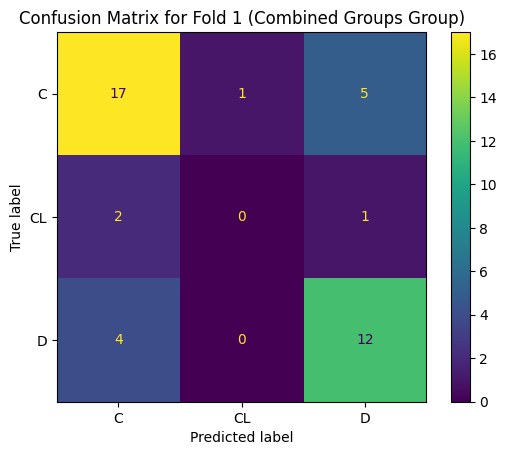

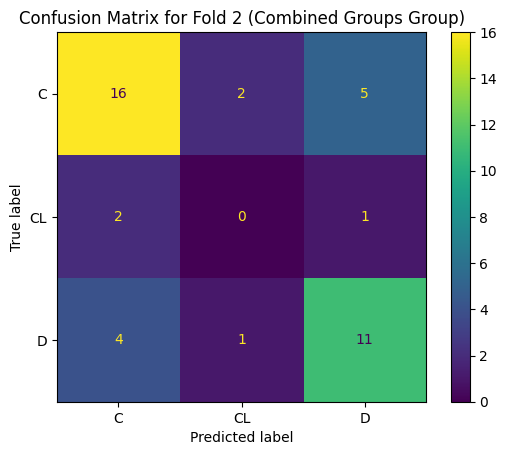

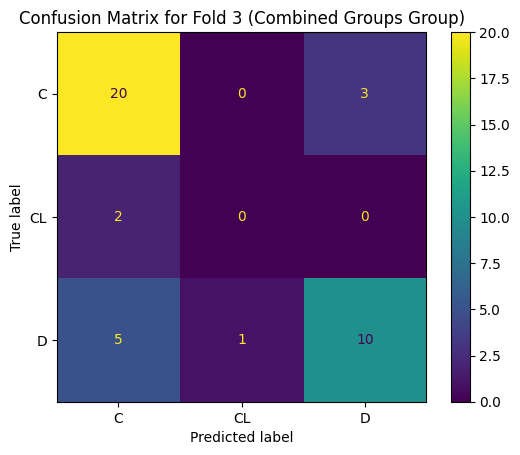

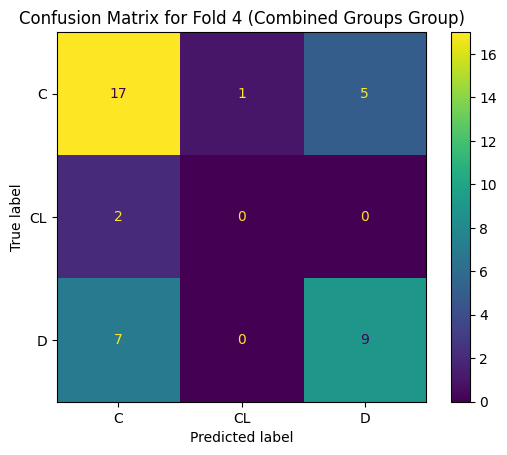

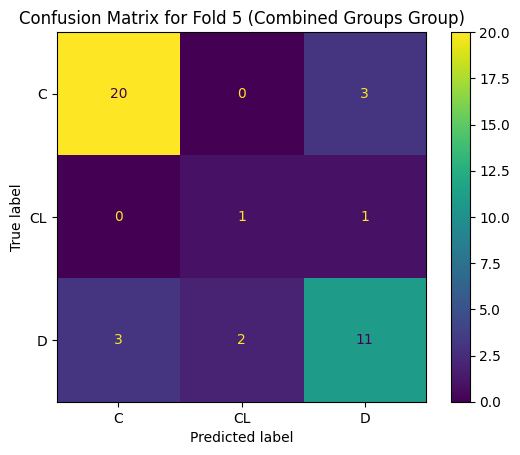

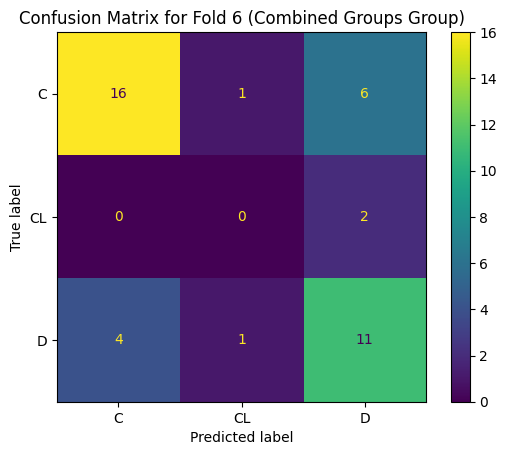

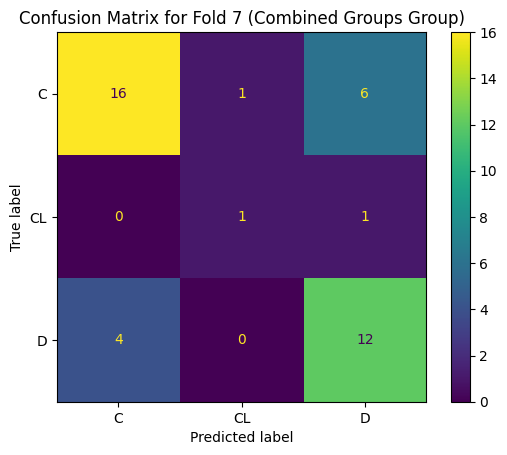

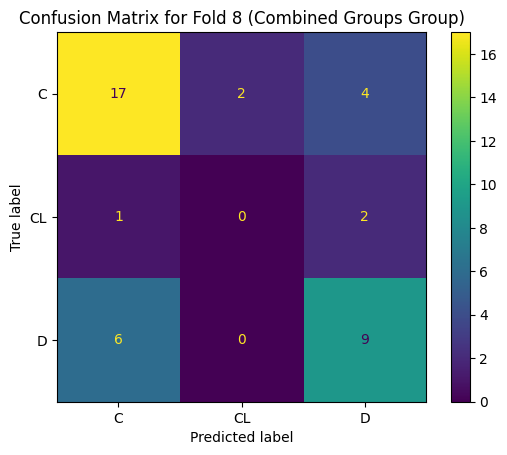

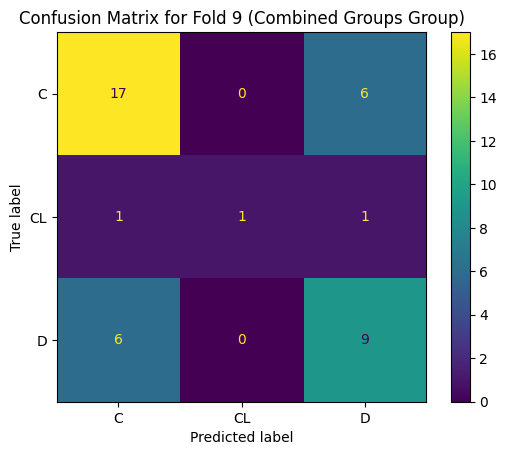

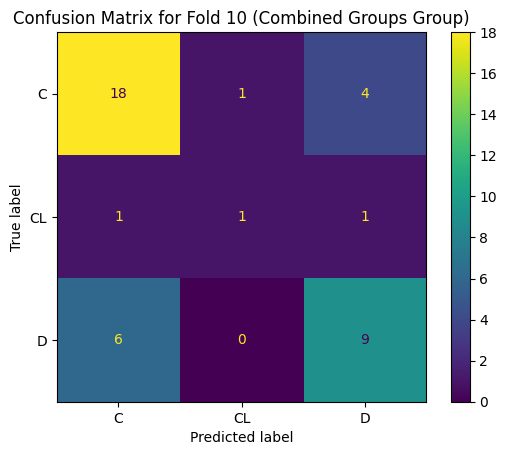

Results for Combined Groups Group:
Mean accuracy: 0.6821138211382113
Standard deviation of accuracy: 0.044830086691611246
Mean cost: 103.3
Standard deviation of cost: 11.75627492022877
Mean cost per instance: 2.519512195121951
Standard deviation of cost per instance: 0.2867384126885066
--------------------------------------------------
Classification Report for the last fold:
              precision    recall  f1-score   support

           C       0.72      0.78      0.75        23
          CL       0.50      0.33      0.40         3
           D       0.64      0.60      0.62        15

    accuracy                           0.68        41
   macro avg       0.62      0.57      0.59        41
weighted avg       0.68      0.68      0.68        41

ACCURACY-TRAINED NEURAL NETWORK: 2 LAYER
Using 10 folds for Combined Groups


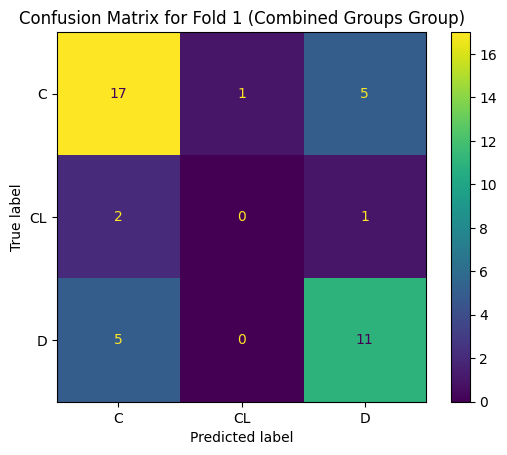

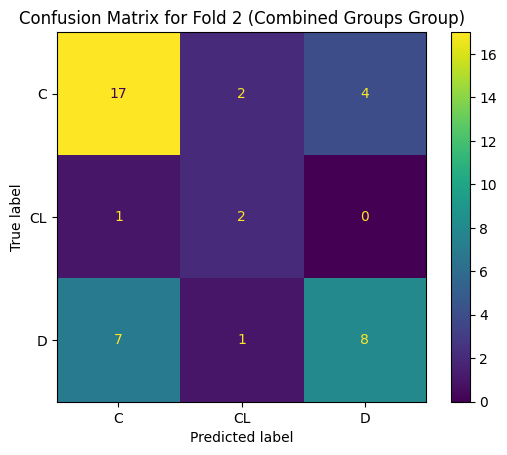

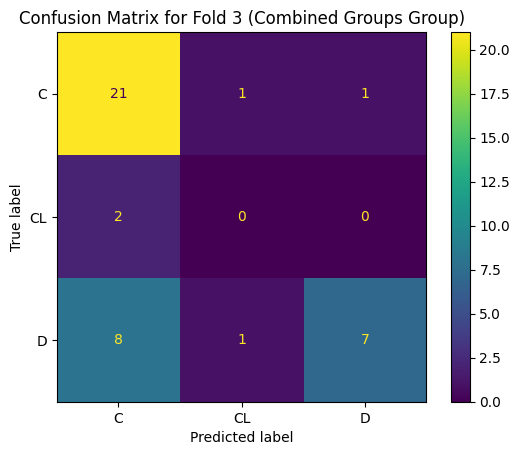

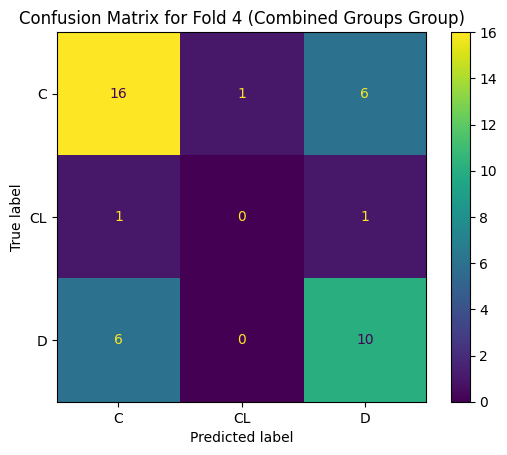

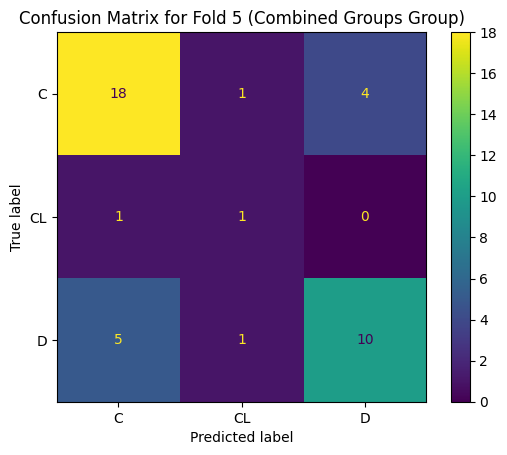

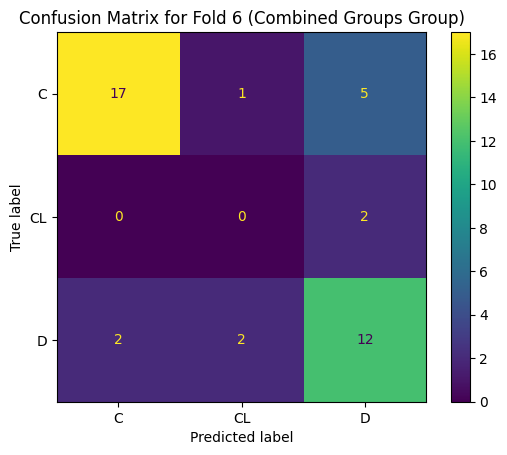

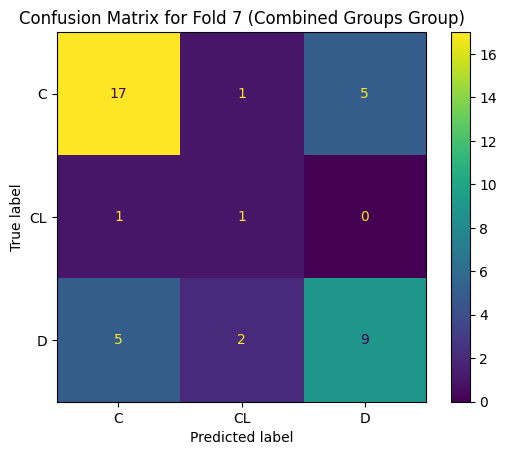

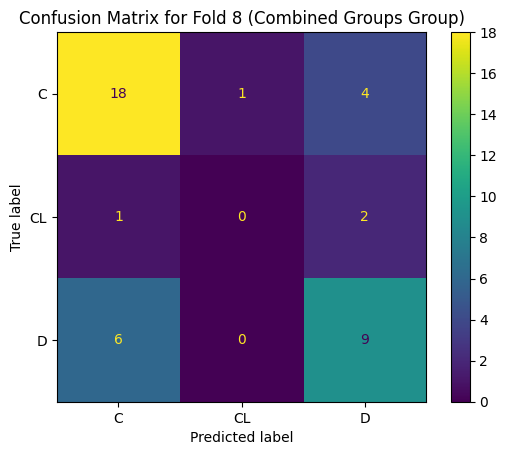

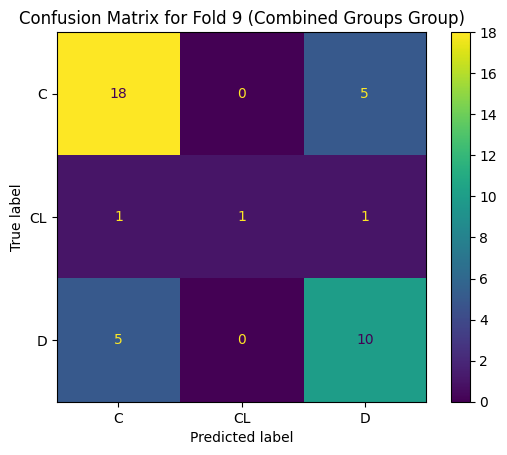

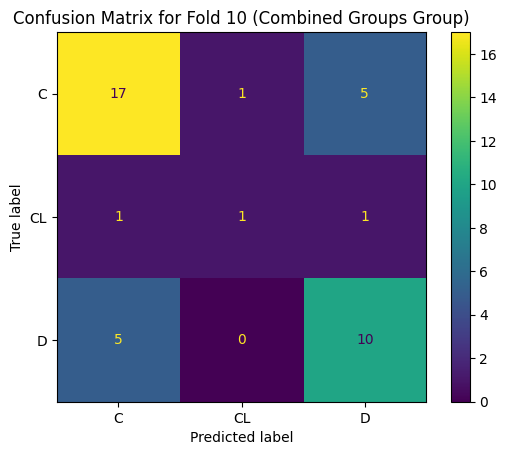

Results for Combined Groups Group:
Mean accuracy: 0.6748548199767711
Standard deviation of accuracy: 0.025636605265672904
Mean cost: 108.3
Standard deviation of cost: 10.178899744078434
Mean cost per instance: 2.6414634146341465
Standard deviation of cost per instance: 0.2482658474165472
--------------------------------------------------
Classification Report for the last fold:
              precision    recall  f1-score   support

           C       0.74      0.74      0.74        23
          CL       0.50      0.33      0.40         3
           D       0.62      0.67      0.65        15

    accuracy                           0.68        41
   macro avg       0.62      0.58      0.59        41
weighted avg       0.68      0.68      0.68        41

COST-TRAINED NEURAL NETWORK: 2 LAYER
Using 10 folds for Combined Groups


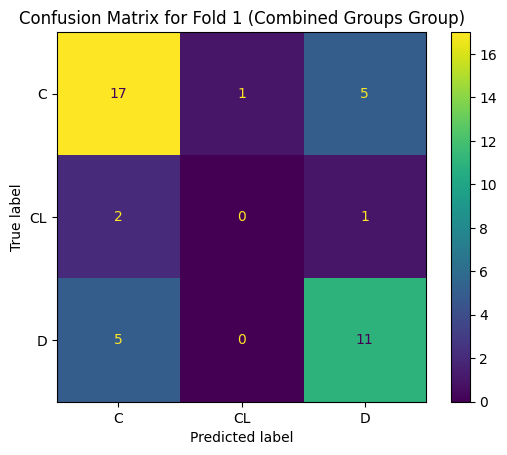

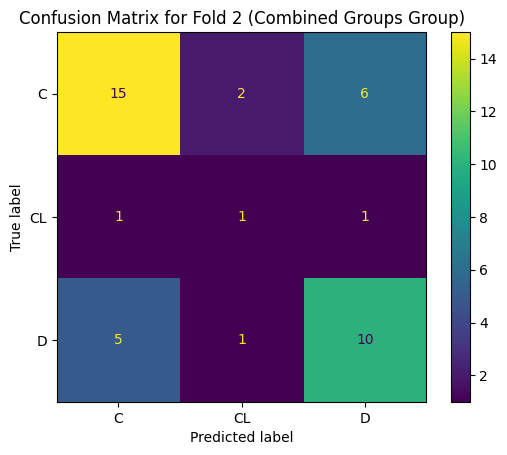

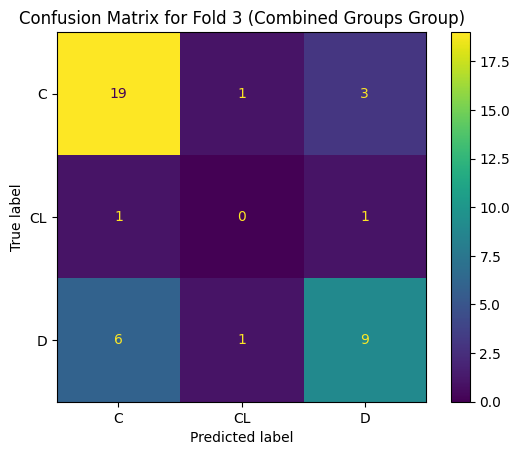

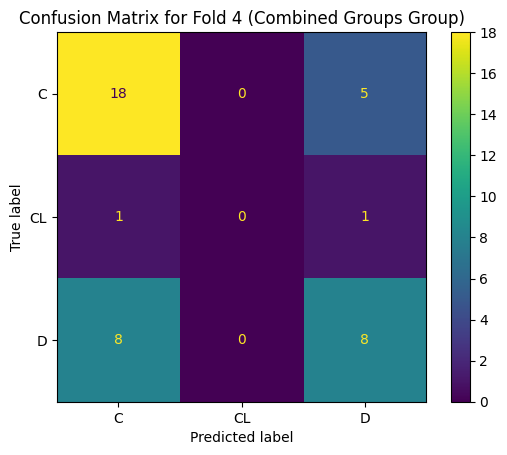

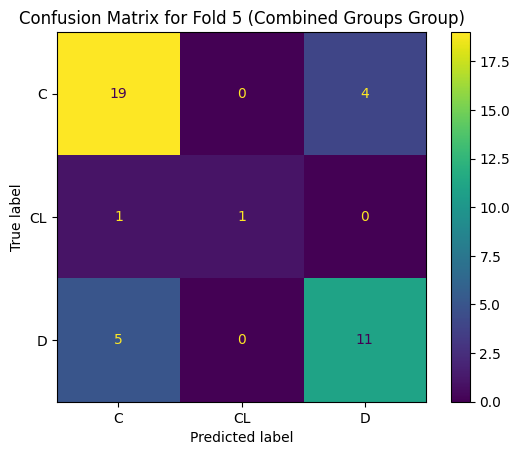

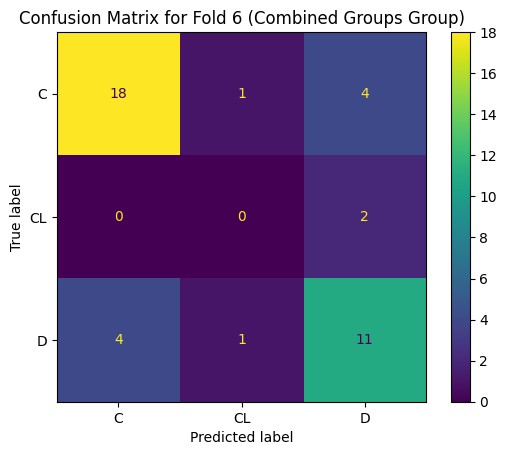

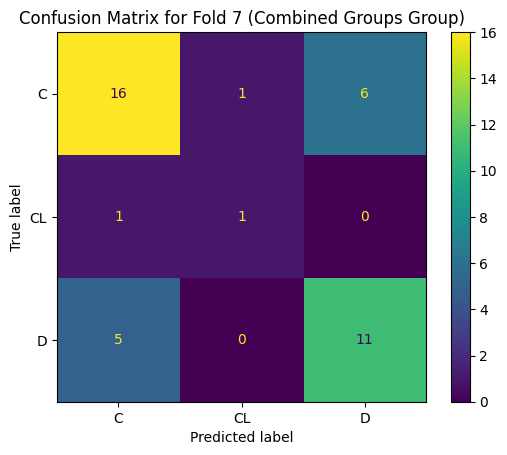

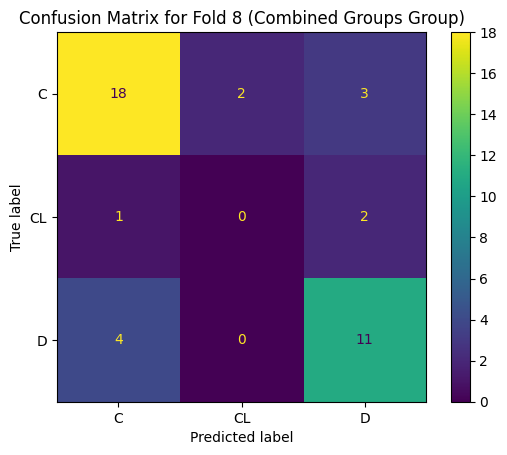

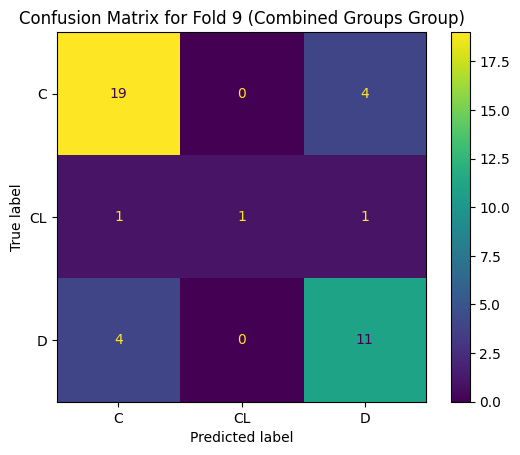

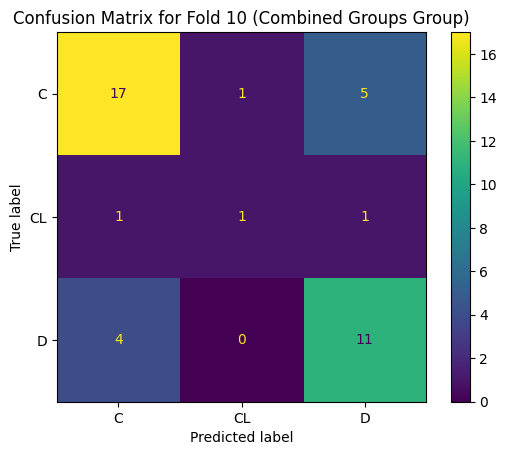

Results for Combined Groups Group:
Mean accuracy: 0.69198606271777
Standard deviation of accuracy: 0.04289096550538194
Mean cost: 99.5
Standard deviation of cost: 15.717824276915684
Mean cost per instance: 2.426829268292683
Standard deviation of cost per instance: 0.3833615677296508
--------------------------------------------------
Classification Report for the last fold:
              precision    recall  f1-score   support

           C       0.77      0.74      0.76        23
          CL       0.50      0.33      0.40         3
           D       0.65      0.73      0.69        15

    accuracy                           0.71        41
   macro avg       0.64      0.60      0.61        41
weighted avg       0.71      0.71      0.70        41

ACCURACY-TRAINED DEEP LEARNING
Using 10 folds for Combined Groups


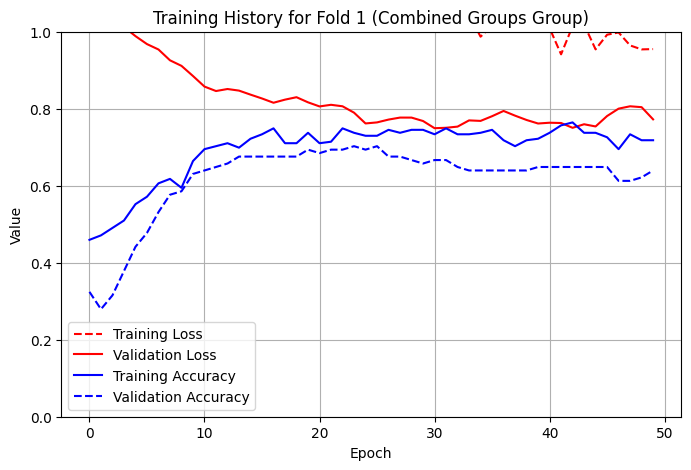

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


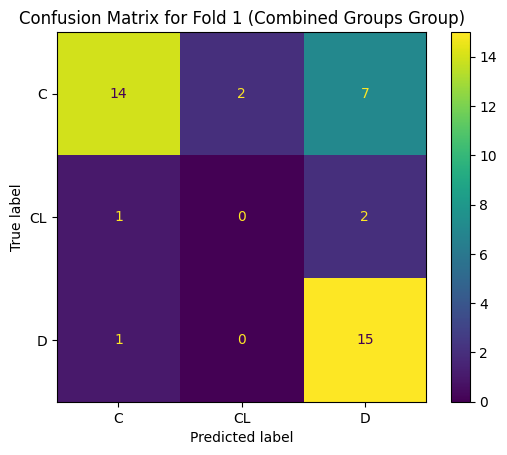

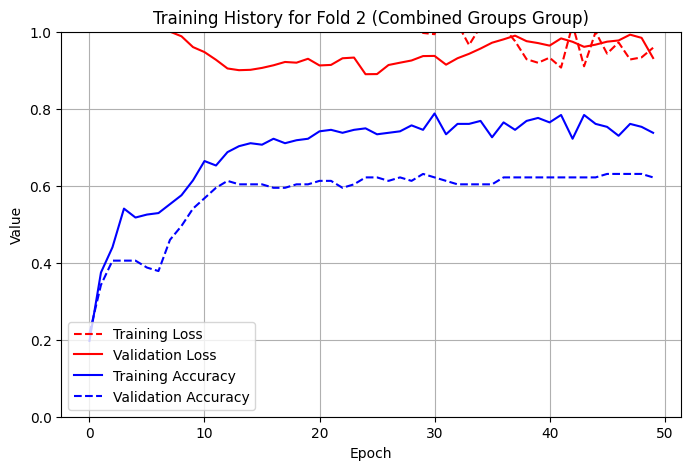

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


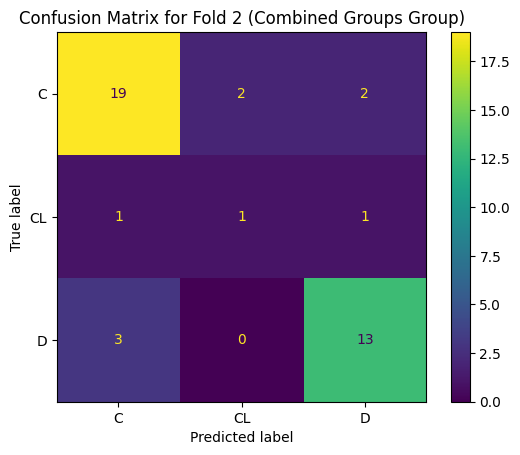

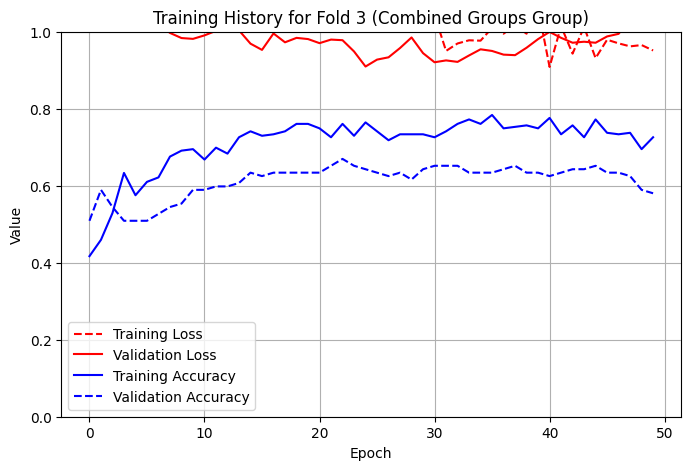

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


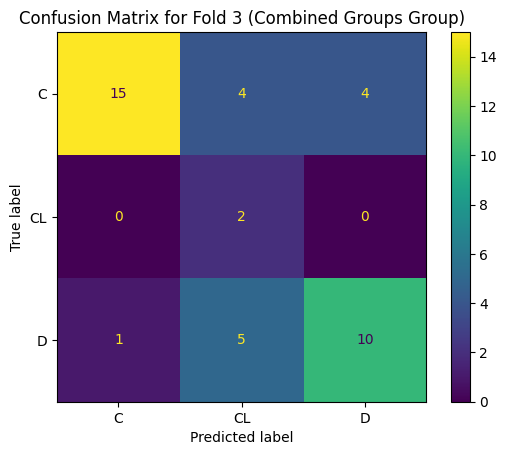

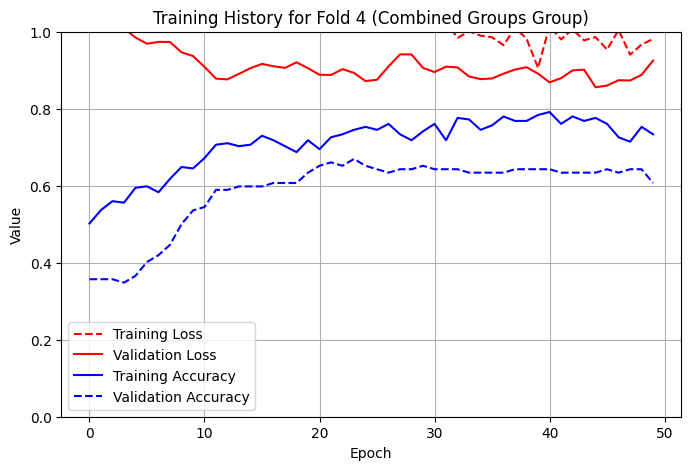

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


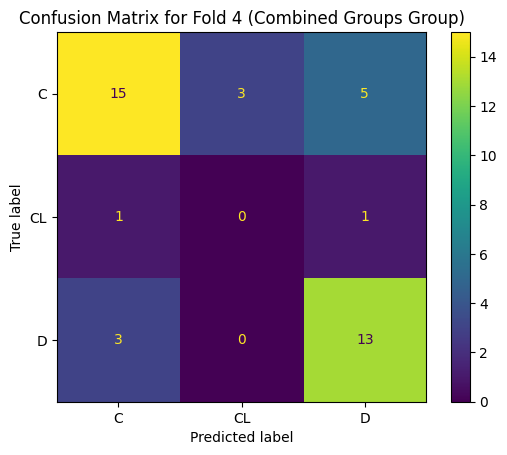

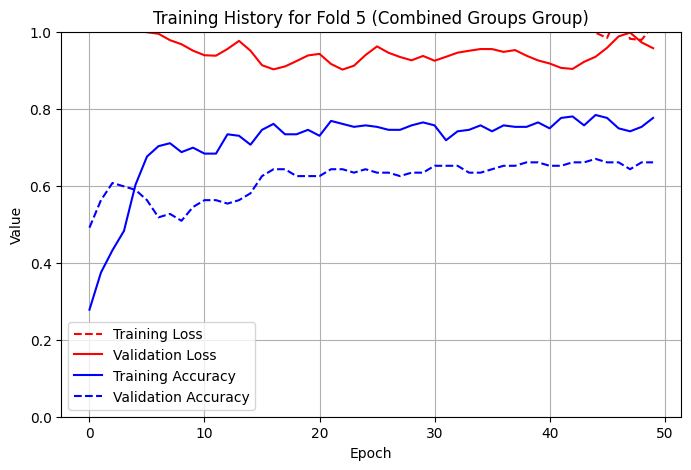

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


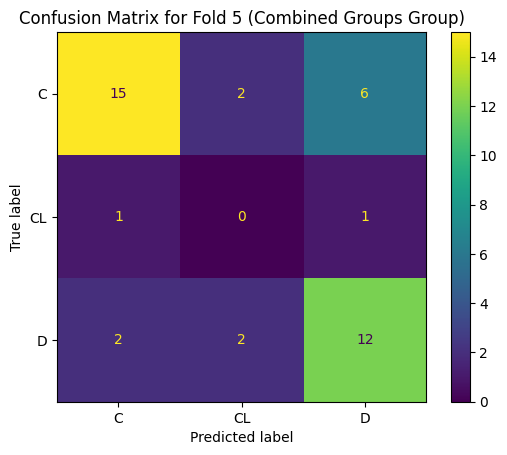

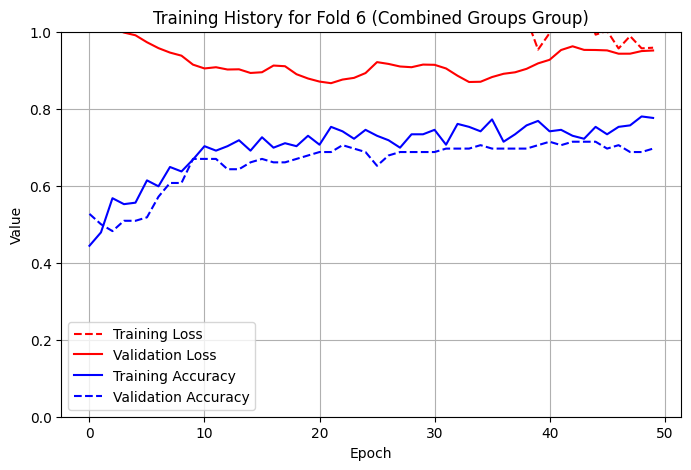

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


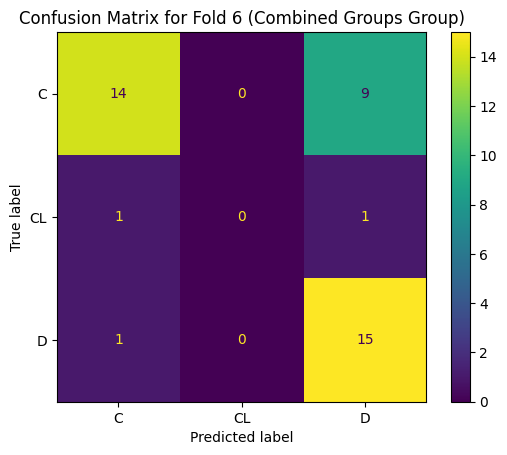

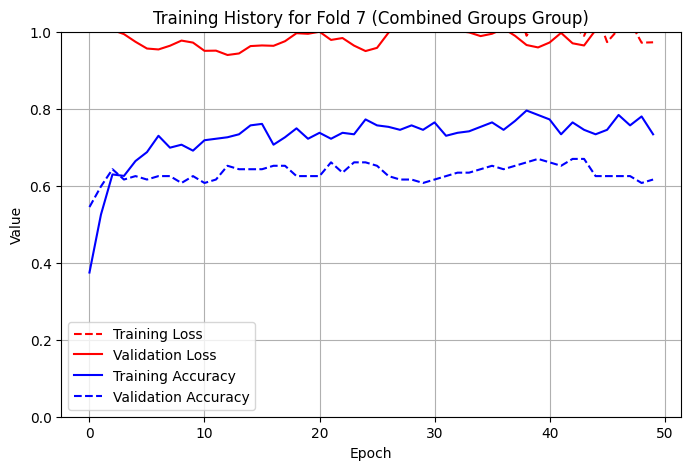

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


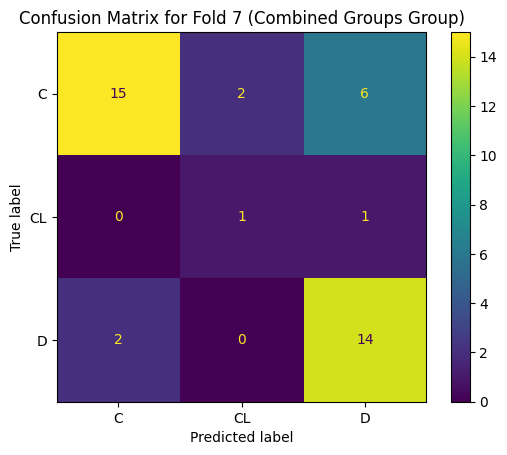

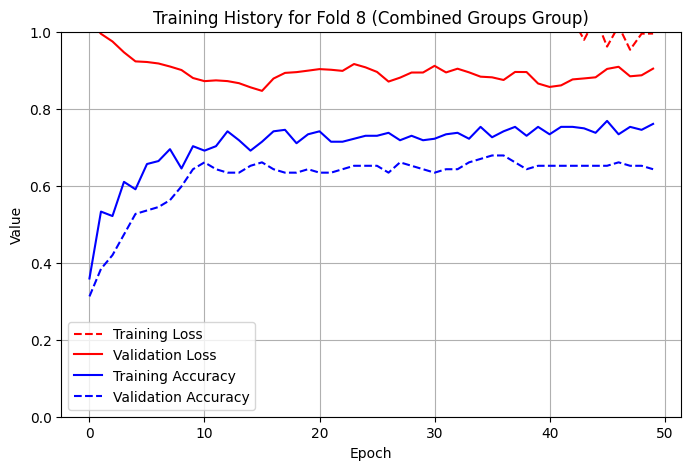

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


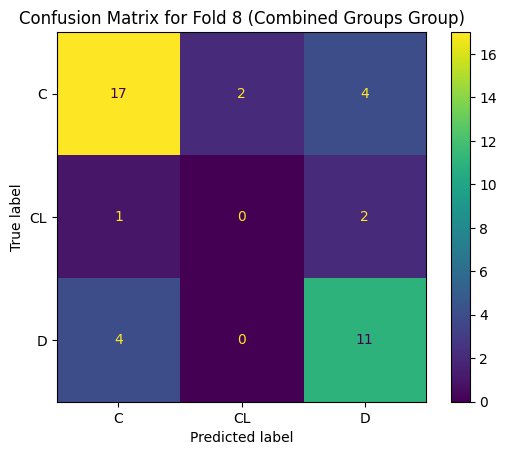

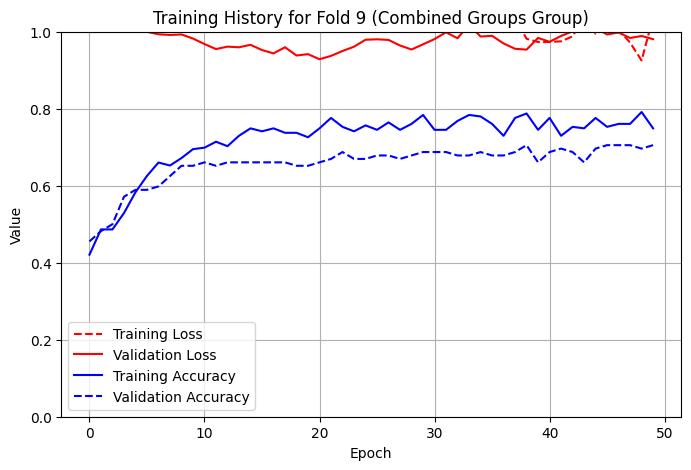

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


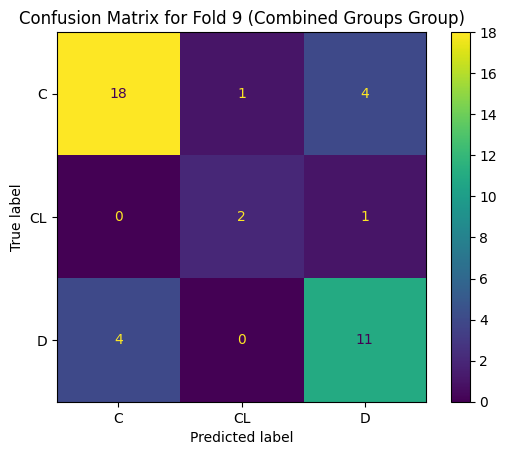

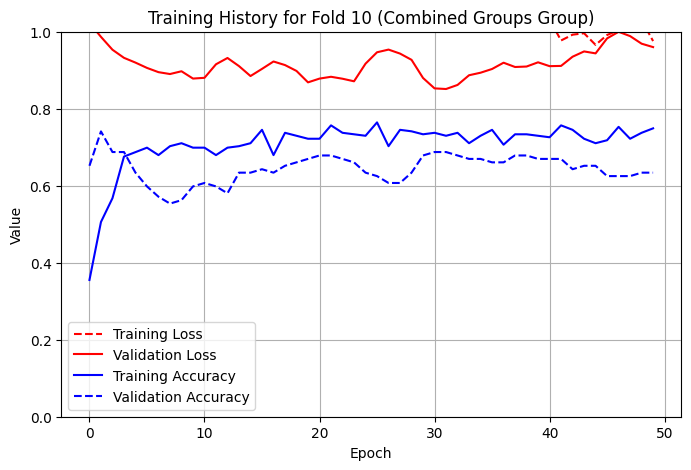

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


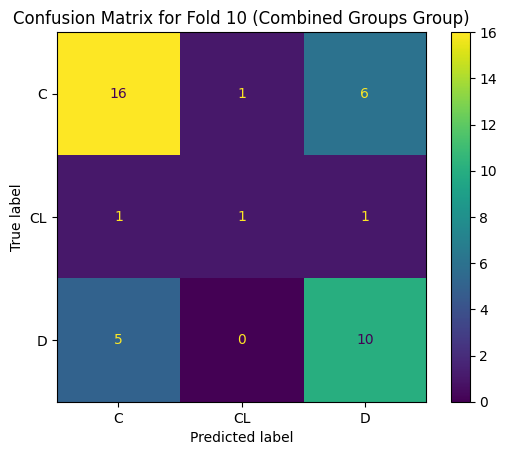

Results for Combined Groups Group:
Mean accuracy: 0.7012775842044134
Standard deviation of accuracy: 0.04167466850447221
Mean cost: 89.1
Standard deviation of cost: 17.958006570886425
Mean cost per instance: 2.173170731707317
Standard deviation of cost per instance: 0.4380001602655226
--------------------------------------------------
Classification Report for the last fold:
              precision    recall  f1-score   support

           C       0.73      0.70      0.71        23
          CL       0.50      0.33      0.40         3
           D       0.59      0.67      0.62        15

    accuracy                           0.66        41
   macro avg       0.61      0.57      0.58        41
weighted avg       0.66      0.66      0.66        41



In [43]:

common_columns = trial_group.columns.intersection(non_trial_group.columns)
combined_data = pd.concat([trial_group[common_columns], non_trial_group[common_columns]], ignore_index=True)
print("ACCURACY-TRAINED DECISION TREE")
tree_accuracy(combined_data, "Combined Groups", cost_matrix)
print("COST-TRAINED DECISION TREE")
tree_cost(combined_data, "Combined Groups", cost_matrix)
print("ACCURACY-TRAINED NAIVE BAYES")
naive_accuracy(combined_data, "Combined Groups", cost_matrix)
print("COST-TRAINED NAIVE BAYES")
naive_cost(combined_data, "Combined Groups", cost_matrix)
print("ACCURACY-TRAINED NEURAL NETWORK: 1 LAYER")
neural1_accuracy(combined_data, "Combined Groups", cost_matrix)
print("COST-TRAINED NEURAL NETWORK: 1 LAYER")
neural1_cost(combined_data, "Combined Groups", cost_matrix)
print("ACCURACY-TRAINED NEURAL NETWORK: 2 LAYER")
neural2_accuracy(combined_data, "Combined Groups", cost_matrix)
print("COST-TRAINED NEURAL NETWORK: 2 LAYER")
neural2_cost(combined_data, "Combined Groups", cost_matrix)
print("ACCURACY-TRAINED DEEP LEARNING")
deep(combined_data, "Combined Groups", cost_matrix)